In [409]:
import pandas as pd
import numpy as np
import math
import arch
import scipy

import seaborn as sns
import matplotlib.pyplot as plt
from arch import arch_model

sns.set(style="darkgrid")


In [400]:
df = pd.read_csv('QRM-2018-cw1-data-1.csv')


In [276]:
df.describe()

,WTI
count,2519.000000
mean,72.867594
std,22.106781
min,26.190000
25%,50.830000
50%,73.890000
75%,93.425000
max,113.390000


In [277]:
df.head(10)

,Date,WTI
0,2008-11-05,65.41
1,2008-11-06,60.72
2,2008-11-07,61.06
3,2008-11-10,62.19
4,2008-11-11,59.38
5,2008-11-12,55.95
6,2008-11-13,58.31
7,2008-11-14,57.18
8,2008-11-17,55.14
9,2008-11-18,54.42


# 1. Let's calculate the log returns

,Date,WTI,Daily Log Returns
1,2008-11-06,60.72,-0.074402
2,2008-11-07,61.06,0.005584
3,2008-11-10,62.19,0.018337
4,2008-11-11,59.38,-0.046237
5,2008-11-12,55.95,-0.059499
6,2008-11-13,58.31,0.041315
7,2008-11-14,57.18,-0.019569
8,2008-11-17,55.14,-0.036329
9,2008-11-18,54.42,-0.013144
10,2008-11-19,53.64,-0.014437


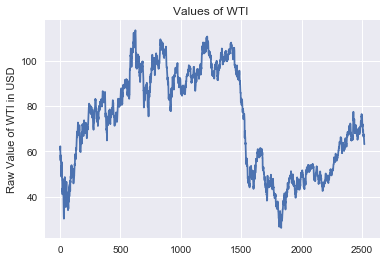

In [488]:
df = pd.read_csv('QRM-2018-cw1-data-1.csv')

df['Daily Log Returns'] = np.log(df.WTI) - np.log(df.WTI.shift(1)) #We calculate the value of log returns of W_TI

df["Date"] = df["Date"].astype("datetime64")
df.drop(index=0,inplace = True) #We remove the NaN
#df.set_index(['Date'],inplace=True)

ax = df['WTI'].plot(title = 'Values of WTI ')
ax.set_ylabel('Raw Value of WTI in USD')
df

In [487]:
df['log_ret_WTI'] = np.log(df.WTI) - np.log(df.WTI.shift(1)) #We calculate the value of log returns of W_TI

#df["Date"] = df["Date"].astype("datetime64")
df.drop(index=0,inplace = True) #We remove the NaN
#df.head(10)


KeyError: 'labels [0] not contained in axis'

## We then calculate the mean, the standard deviation, the skew and the kurtosis

In [479]:
df['Daily Log Returns'].mean()

-1.4153087941025416e-05

In [480]:
df['Daily Log Returns'].skew()

0.1630414528367171

In [481]:
df['Daily Log Returns'].kurtosis()

4.385292137010743

In [482]:
df['Daily Log Returns'].std()

0.023626739078343825

In [292]:
bin_width = 50



C:\Users\rehar\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0,0.5,'Density')

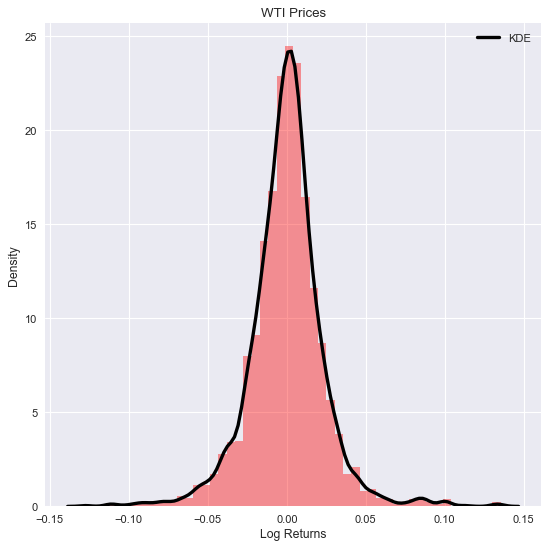

In [320]:
fig=plt.figure(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')


sns.distplot(df['Daily Log Returns'], hist=True, kde=True, 
             bins=bin_width, color = 'red', kde_kws={"color": "k", "lw": 3, "label": "KDE"}
             )

# Add labels
plt.title('WTI Prices')
plt.xlabel('Log Returns')
plt.ylabel('Density')

Text(0,0.5,'Index')

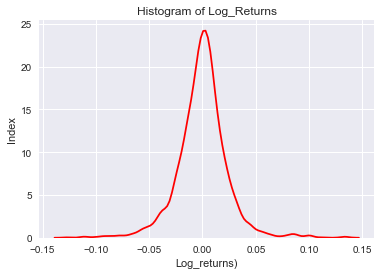

In [318]:
bin_width = 50
sns.distplot(df['Daily Log Returns'], hist=False, kde=True, 
             bins=bin_width, color = 'red',
             hist_kws={'edgecolor':'black'})


# Add labels
plt.title('Histogram of Log_Returns')
plt.xlabel('Log_returns)')
plt.ylabel('Index')


C:\Users\rehar\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


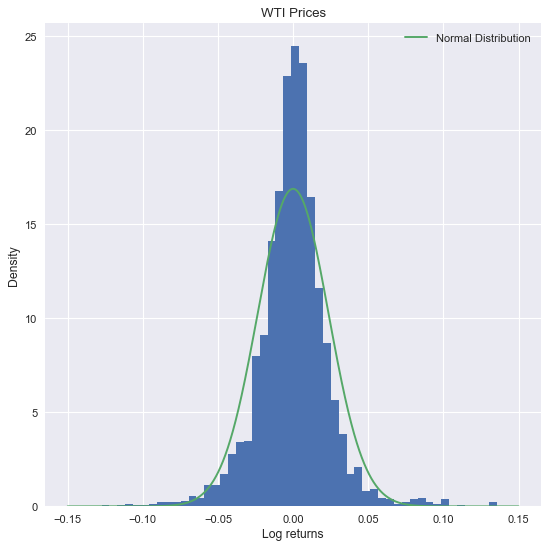

In [317]:
ser = df['Daily Log Returns']
fig=plt.figure(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')

# plot normed histogram
plt.hist(df['Daily Log Returns'], bins = 50,normed = True)

# find minimum and maximum of xticks, so we know
# where we should compute theoretical distribution
xt = plt.xticks()[0]  
xmin, xmax = min(xt), max(xt)  
lnspc = np.linspace(xmin, xmax, len(ser))

# lets try the normal distribution first
m, s = scipy.stats.norm.fit(ser) # get mean and standard deviation  
pdf_g = scipy.stats.norm.pdf(lnspc, m, s) # now get theoretical values in our interval  
plt.plot(lnspc, pdf_g, label="Normal Distribution") # plot it

plt.title('WTI Prices')
plt.xlabel('Log returns')
plt.ylabel('Density')
plt.legend()


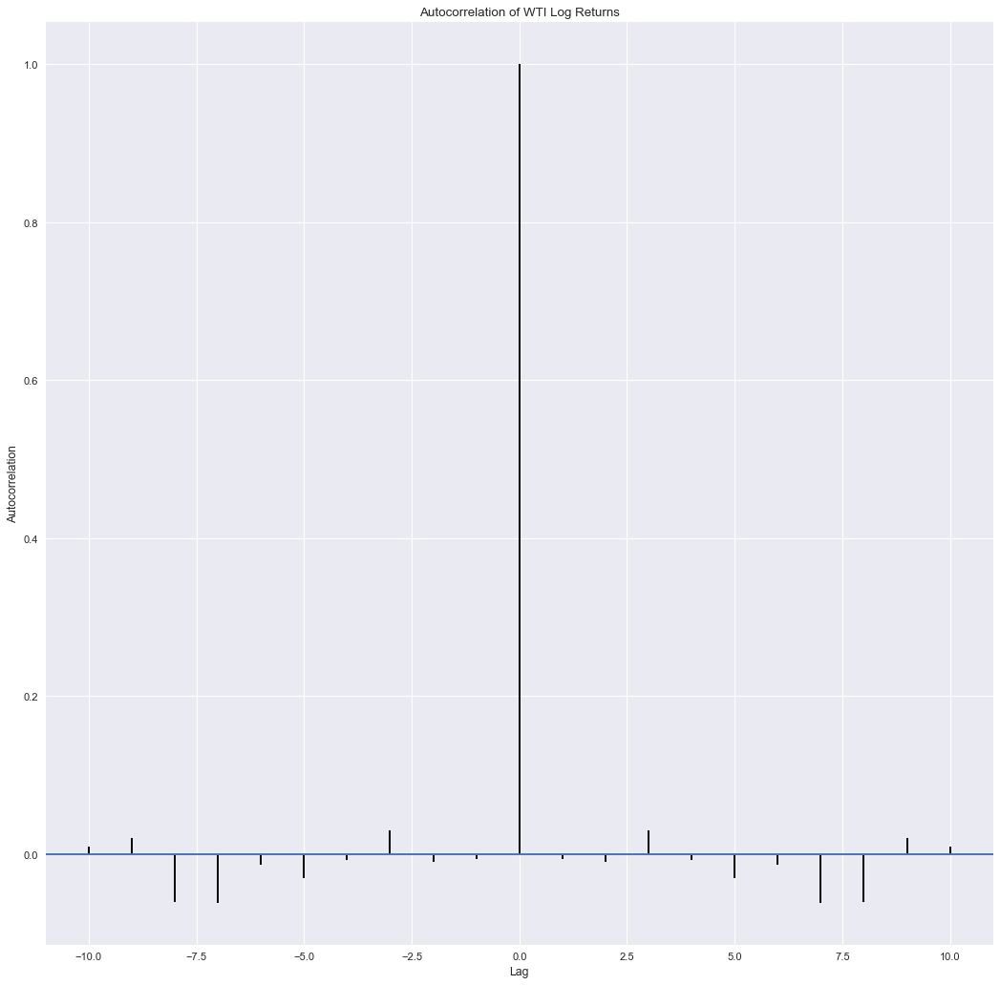

In [337]:
# Plot autocorrelation
fig=plt.figure(figsize=(16, 16), dpi= 80, facecolor='w', edgecolor='k')

plt.acorr(df['Daily Log Returns'])

 

# Add labels to autocorrelation plot

plt.title('Autocorrelation of WTI Log Returns')

plt.xlabel('Lag')

plt.ylabel('Autocorrelation')

 

# Display the autocorrelation plot

plt.show()

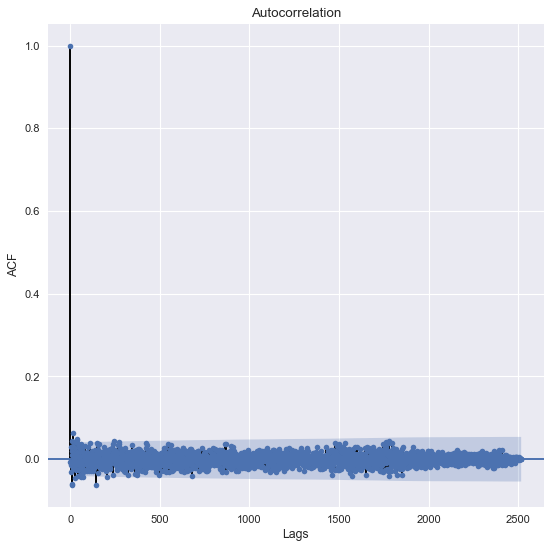

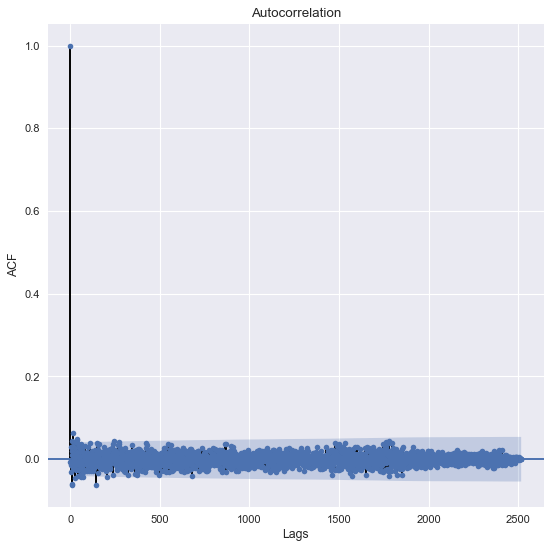

In [368]:


from statsmodels.graphics.tsaplots import plot_acf,acf
from statsmodels.graphics.tsaplots import plot_pacf

pyplot.figure(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')
pyplot.xlabel('Lags')
pyplot.ylabel('ACF')

plot_acf(df['Daily Log Returns'], ax=pyplot.gca())


Text(0,0.5,'ACF')

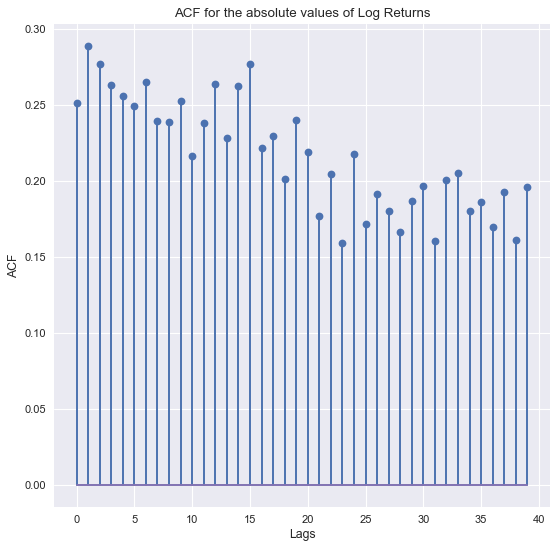

In [391]:
abs_ = abs(df['Daily Log Returns'])
d = acf(abs_)

pyplot.figure(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')
plt.title('ACF for the absolute values of Log Returns')

plt.stem(d[1:])
pyplot.xlabel('Lags')
pyplot.ylabel('ACF')

Text(0,0.5,'ACF')

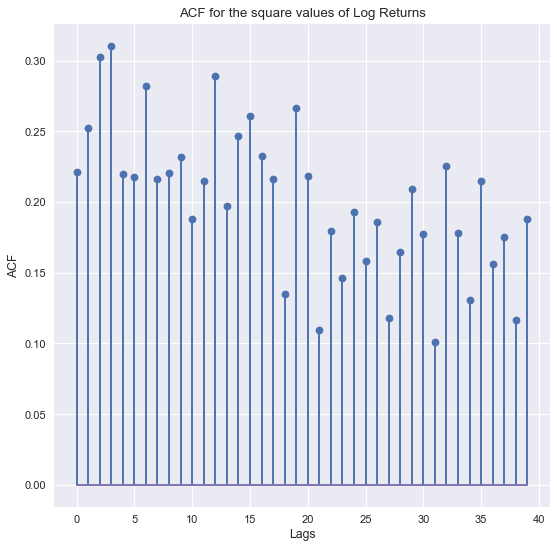

In [390]:
d = acf(df['Daily Log Returns']**2)
pyplot.figure(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')
plt.title('ACF for the square values of Log Returns')

plt.stem(d[1:])
pyplot.xlabel('Lags')
pyplot.ylabel('ACF')

In [508]:
df_plot = df
garch11 = arch_model(df_plot['Daily Log Returns'], p=1, q=1,mean = 'Constant')


In [491]:
garch11.fit().summary()

Iteration:      1,   Func. Count:      6,   Neg. LLF: -6283.641096797412
Iteration:      2,   Func. Count:     20,   Neg. LLF: -6284.129202455821
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -6284.129204485836
            Iterations: 2
            Function evaluations: 31
            Gradient evaluations: 2


<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - GARCH Model Results                      
==============================================================================
Dep. Variable:      Daily Log Returns   R-squared:                      -0.000
Mean Model:             Constant Mean   Adj. R-squared:                 -0.000
Vol Model:                      GARCH   Log-Likelihood:                6284.13
Distribution:                  Normal   AIC:                          -12560.3
Method:            Maximum Likelihood   BIC:                          -12536.9
                                        No. Observations:                 2518
Date:                Fri, Nov 30 2018   Df Residuals:                     2514
Time:                        08:02:24   Df Model:                            4
                                  Mean Model                                 
=============================================================================
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
mu         3.3108e-04  3.501e-04      0.946      0.344 [-3.552e-04,1.017e-03]
                              Volatility Model                              
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      1.1160e-05  5.202e-12  2.145e+06      0.000 [1.116e-05,1.116e-05]
alpha[1]       0.1000  1.797e-02      5.564  2.634e-08   [6.478e-02,  0.135]
beta[1]        0.8800  1.459e-02     60.329      0.000     [  0.851,  0.909]
============================================================================

Covariance estimator: robust
"""

Iteration:      1,   Func. Count:      6,   Neg. LLF: -6283.641096797412
Iteration:      2,   Func. Count:     20,   Neg. LLF: -6284.129202455821
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -6284.129204485836
            Iterations: 2
            Function evaluations: 31
            Gradient evaluations: 2


Text(0,0.5,'Value')

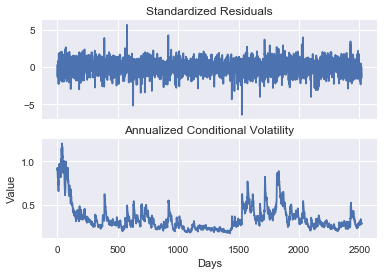

In [492]:
fig1 = garch11.fit().plot(annualize = 'D')
plt.xlabel('Days')
plt.ylabel('Value')

In [537]:
df_plot['Volatility'] = garch11.fit().conditional_volatility
df_plot['Residuals'] = garch11.fit().resid
garch11.fit().summary()

Iteration:      1,   Func. Count:      6,   Neg. LLF: -6283.641096797412
Iteration:      2,   Func. Count:     20,   Neg. LLF: -6284.129202455821
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -6284.129204485836
            Iterations: 2
            Function evaluations: 31
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -6283.641096797412
Iteration:      2,   Func. Count:     20,   Neg. LLF: -6284.129202455821
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -6284.129204485836
            Iterations: 2
            Function evaluations: 31
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -6283.641096797412
Iteration:      2,   Func. Count:     20,   Neg. LLF: -6284.129202455821
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -6284.129204485836
            Iterations: 2
        

<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - GARCH Model Results                      
==============================================================================
Dep. Variable:      Daily Log Returns   R-squared:                      -0.000
Mean Model:             Constant Mean   Adj. R-squared:                 -0.000
Vol Model:                      GARCH   Log-Likelihood:                6284.13
Distribution:                  Normal   AIC:                          -12560.3
Method:            Maximum Likelihood   BIC:                          -12536.9
                                        No. Observations:                 2518
Date:                Fri, Nov 30 2018   Df Residuals:                     2514
Time:                        08:52:20   Df Model:                            4
                                  Mean Model                                 
=============================================================================
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
mu         3.3108e-04  3.501e-04      0.946      0.344 [-3.552e-04,1.017e-03]
                              Volatility Model                              
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      1.1160e-05  5.202e-12  2.145e+06      0.000 [1.116e-05,1.116e-05]
alpha[1]       0.1000  1.797e-02      5.564  2.634e-08   [6.478e-02,  0.135]
beta[1]        0.8800  1.459e-02     60.329      0.000     [  0.851,  0.909]
============================================================================

Covariance estimator: robust
"""

In [538]:
#df_plot.set_index(['Date'],inplace=True)
df_plot['Standardized Residuals'] = df['Residuals']/df['Volatility']



Text(0.5,1,'Volatility during the period of time')

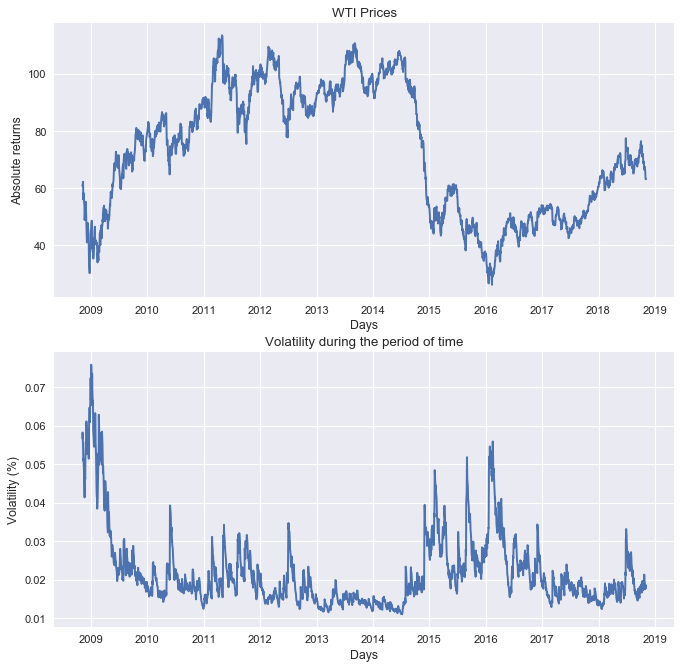

In [423]:
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.subplot(211)
plt.plot(df_plot['WTI'])




plt.xlabel('Days')
plt.ylabel('Absolute returns')
plt.title('WTI Prices')


plt.subplot(212)
plt.plot(df_plot['Volatility'])



plt.xlabel('Days')
plt.ylabel('Volatility (%)')
plt.title('Volatility during the period of time')

Text(0.5,1,'Volatility during the period of time')

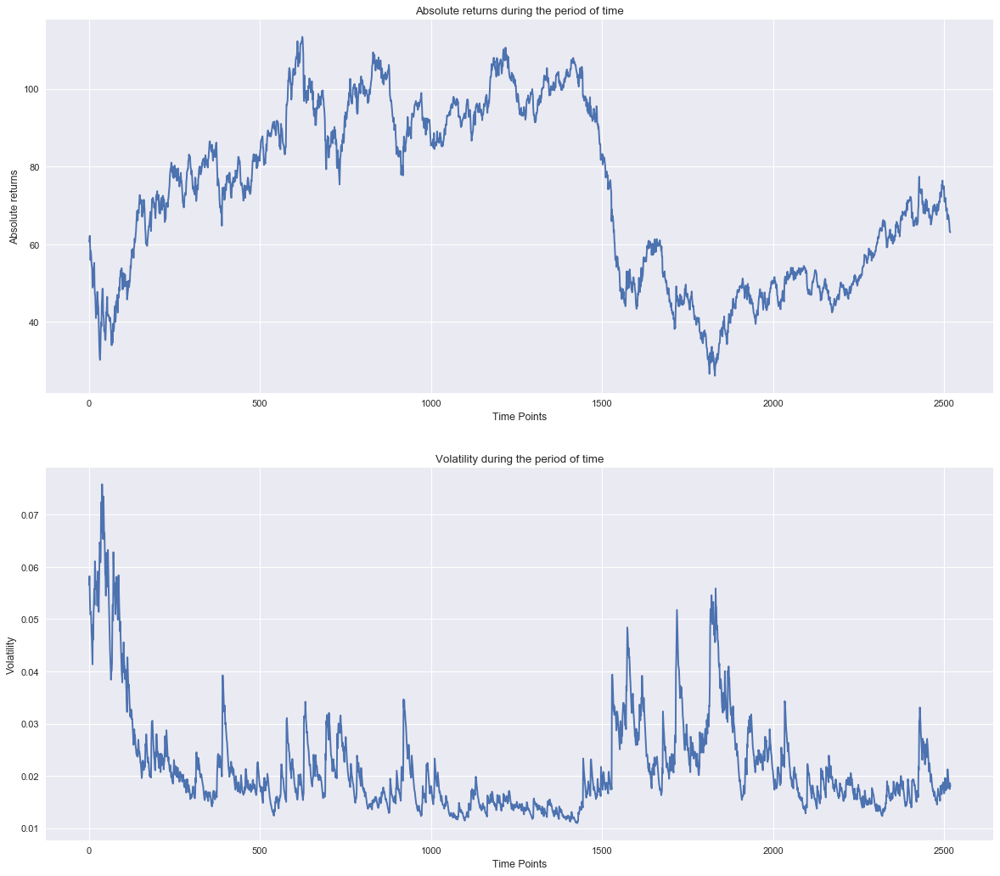

In [49]:
n = df.WTI.count()
x = np.linspace(1,n,n)

fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')

plt.subplot(211)
plt.plot(x, df.WTI)


plt.xlabel('Time Points')
plt.ylabel('Absolute returns')
plt.title('Absolute returns during the period of time')


plt.subplot(212)
plt.plot(x,df.Volatility)



plt.xlabel('Time Points')
plt.ylabel('Volatility')
plt.title('Volatility during the period of time')


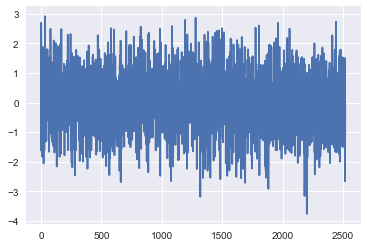

In [428]:
df_model = df

mean = 0
std = 1 
num_samples = df_plot.count()[0]
samples = np.random.normal(mean, std, size=num_samples)
plt.plot(samples)

Text(0.5,1,'ACF of Standardized Residuals')

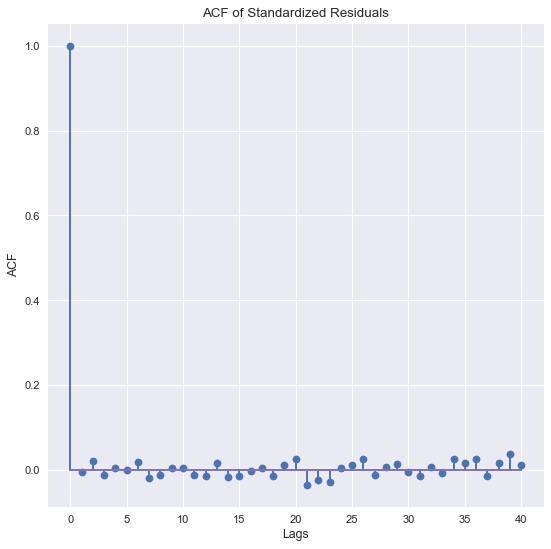

In [520]:
df['Standardized Residuals'] = df['Residuals']/df['Volatility']
df['Squared Standardized Residuals'] = df['Standardized Residuals']
d_model = acf(df['Squared Standardized Residuals'])



df_model['Squared Daily Log Returns'] = df_model['Daily Log Returns']**2
p_real = acf(df_model['Squared Daily Log Returns'])
pyplot.figure(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')


plt.stem(d_model,markerfmt='o')

plt.xlabel('Lags')
plt.ylabel('ACF')
plt.title('ACF of Standardized Residuals')

#plt.stem(p_real,linefmt = 'red')


Text(0.5,1,'ACF of Standardized Residuals')

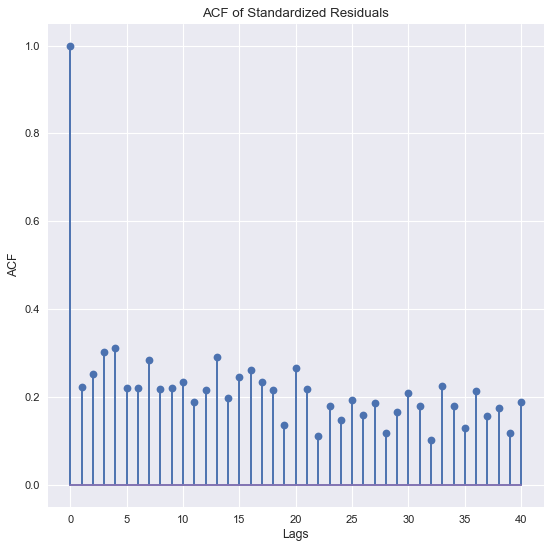

In [522]:
df['Squared Residuals'] = df['Residuals']**2

d_model = acf(df['Squared Residuals'])



df_model['Squared Daily Log Returns'] = df_model['Daily Log Returns']**2
p_real = acf(df_model['Squared Daily Log Returns'])
pyplot.figure(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')


plt.stem(d_model,markerfmt='o')

plt.xlabel('Lags')
plt.ylabel('ACF')
plt.title('ACF of Squaredd Residuals')

#plt.stem(p_real,linefmt = 'red')


<StemContainer object of 3 artists>

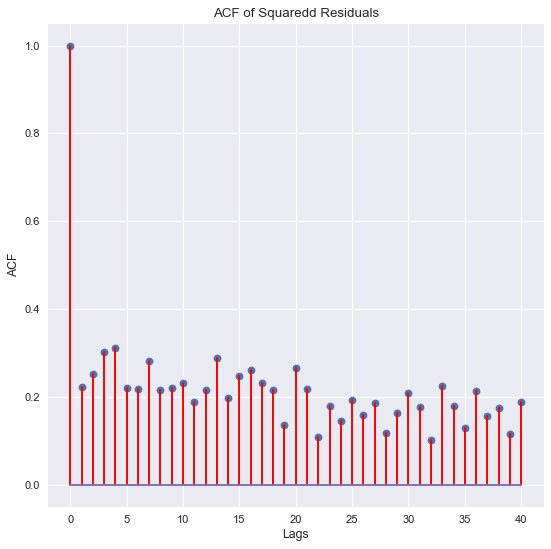

In [523]:
df['Squared Residuals'] = df['Residuals']**2

d_model = acf(df['Squared Residuals'])



df_model['Squared Daily Log Returns'] = df_model['Daily Log Returns']**2
p_real = acf(df_model['Squared Daily Log Returns'])
pyplot.figure(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')


#plt.stem(d_model,markerfmt='o')

plt.xlabel('Lags')
plt.ylabel('ACF')
plt.title('ACF of Squaredd Residuals')

plt.stem(p_real,linefmt = 'red')

C:\Users\rehar\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0,0.5,'Index')

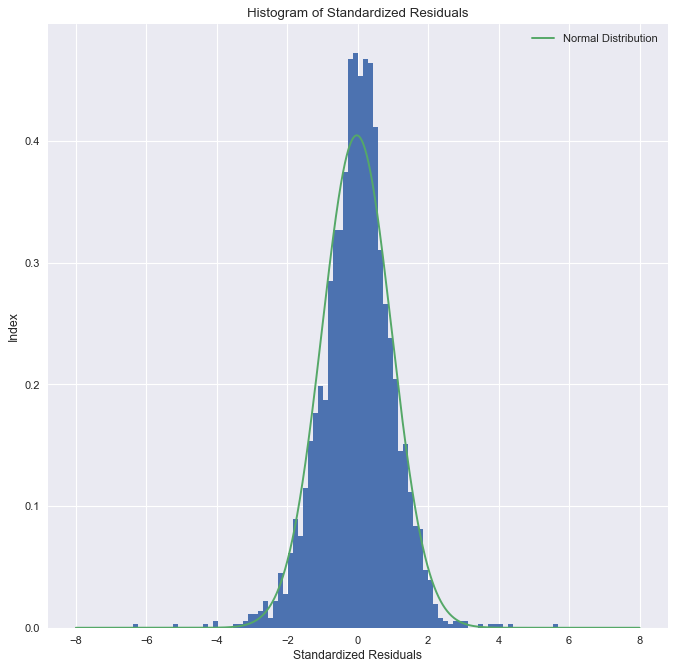

In [524]:

fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

ser2 = df_plot['Standardized Residuals']

# plot normed histogram
plt.hist(df_plot['Standardized Residuals'], bins = 85,normed = True)


# find minimum and maximum of xticks, so we know
# where we should compute theoretical distribution
xt = plt.xticks()[0]  
xmin, xmax = min(xt), max(xt)  
lnspc = np.linspace(xmin, xmax, len(ser2))

# lets try the normal distribution first
m, s = scipy.stats.norm.fit(ser2) # get mean and standard deviation  
pdf_g = scipy.stats.norm.pdf(lnspc, m, s) # now get theoretical values in our interval  
plt.plot(lnspc, pdf_g, label="Normal Distribution") # plot it
plt.legend()

plt.title('Histogram of Standardized Residuals')
plt.xlabel('Standardized Residuals')
plt.ylabel('Index')


C:\Users\rehar\Anaconda3\lib\site-packages\matplotlib\figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


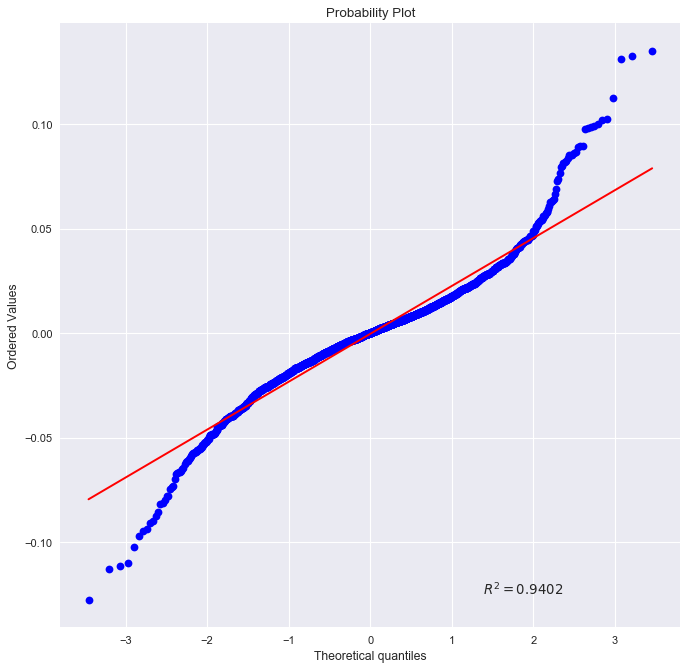

In [531]:
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
scipy.stats.probplot(df['Residuals'], dist="norm", plot=plt, rvalue = True)




#ress = sm.qqplot(df['Residuals'])
ress.show()

In [561]:
df__ = pd.read_csv('QRM-2018-cw1-data-1.csv')

df__['Daily Log Returns'] = np.log(df__.WTI) - np.log(df__.WTI.shift(1)) #We calculate the value of log returns of W_TI

df__["Date"] = df__["Date"].astype("datetime64")
df__.drop(index=0,inplace = True) #We remove the NaN
#df.set_index(['Date'],inplace=True)

In [570]:
df__.head(15)
df__.dropna(inplace=True)

In [571]:
import statsmodels as sm

_arma_model1 = sm.tsa.arima_model.ARMA(df['Daily Log Returns'], (1,0,1))
_model_result1 = _arma_model1.fit()
arma_garch1= arch_model(_model_result1.resid, mean='Zero', p=1, q=1, dist='StudentsT')
arma_garch1.fit().summary()
df__['ARMA Residuals'] = arma_garch1.fit().resid
df__['ARMA Volatility'] = arma_garch1.fit().conditional_volatility
df__['ARMA Standardized Residuals'] = df__['ARMA Residuals']/df__['ARMA Volatility']



Iteration:      1,   Func. Count:      6,   Neg. LLF: -6336.344257769495
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -6336.344257765927
            Iterations: 5
            Function evaluations: 6
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      6,   Neg. LLF: -6336.344257769495
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -6336.344257765927
            Iterations: 5
            Function evaluations: 6
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      6,   Neg. LLF: -6336.344257769495
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -6336.344257765927
            Iterations: 5
            Function evaluations: 6
            Gradient evaluations: 1


C:\Users\rehar\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:221: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


C:\Users\rehar\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0,0.5,'Index')

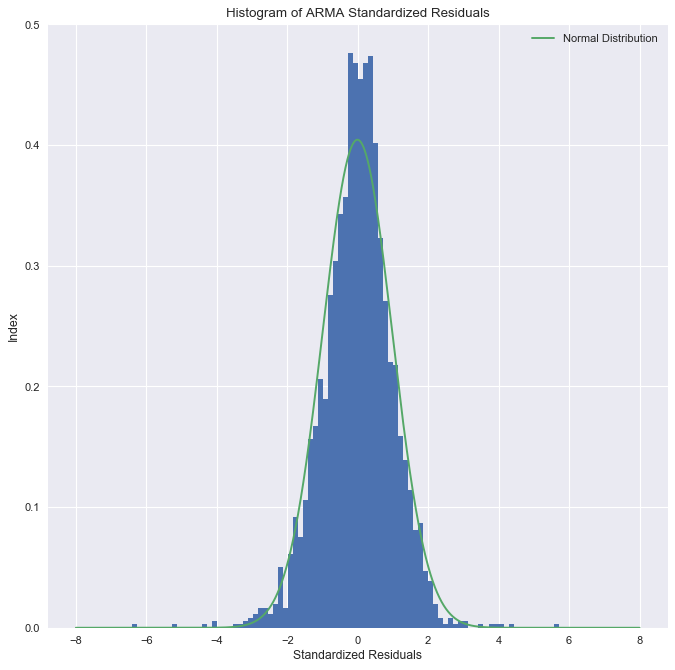

In [567]:

fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

ser2 = df__['ARMA Standardized Residuals']

# plot normed histogram
plt.hist(df__['ARMA Standardized Residuals'], bins = 85,normed = True)


# find minimum and maximum of xticks, so we know
# where we should compute theoretical distribution
xt = plt.xticks()[0]  
xmin, xmax = min(xt), max(xt)  
lnspc = np.linspace(xmin, xmax, len(ser2))

# lets try the normal distribution first
m, s = scipy.stats.norm.fit(ser2) # get mean and standard deviation  
pdf_g = scipy.stats.norm.pdf(lnspc, m, s) # now get theoretical values in our interval  
plt.plot(lnspc, pdf_g, label="Normal Distribution") # plot it
plt.legend()

plt.title('Histogram of ARMA Standardized Residuals')
plt.xlabel('Standardized Residuals')
plt.ylabel('Index')

In [563]:
import statsmodels as sm

_arma_model = sm.tsa.arima_model.ARIMA(df['Daily Log Returns'], (1,1,1))
_model_result = _arma_model.fit()
arma_garch = arch_model(_model_result.resid, mean='Zero', p=1, q=1, dist='StudentsT')
arma_garch.fit().summary()
df__['ARIMA Residuals'] = arma_garch.fit().resid
df__['ARIMA Volatility'] = arma_garch.fit().conditional_volatility
df__['ARIMA Standardized Residuals'] = df__['ARIMA Residuals']/df__['ARIMA Volatility']


C:\Users\rehar\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:221: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:221: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -6329.428349507536
Iteration:      2,   Func. Count:     15,   Neg. LLF: -6329.443867086486
Iteration:      3,   Func. Count:     22,   Neg. LLF: -6331.39187711953
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -6331.391877119302
            Iterations: 7
            Function evaluations: 22
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -6329.428349507536
Iteration:      2,   Func. Count:     15,   Neg. LLF: -6329.443867086486
Iteration:      3,   Func. Count:     22,   Neg. LLF: -6331.39187711953
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -6331.391877119302
            Iterations: 7
            Function evaluations: 22
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -6329.428349507536
Iteration:      2,   Func. Count:     15,   Neg. LLF: -

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


C:\Users\rehar\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0,0.5,'Index')

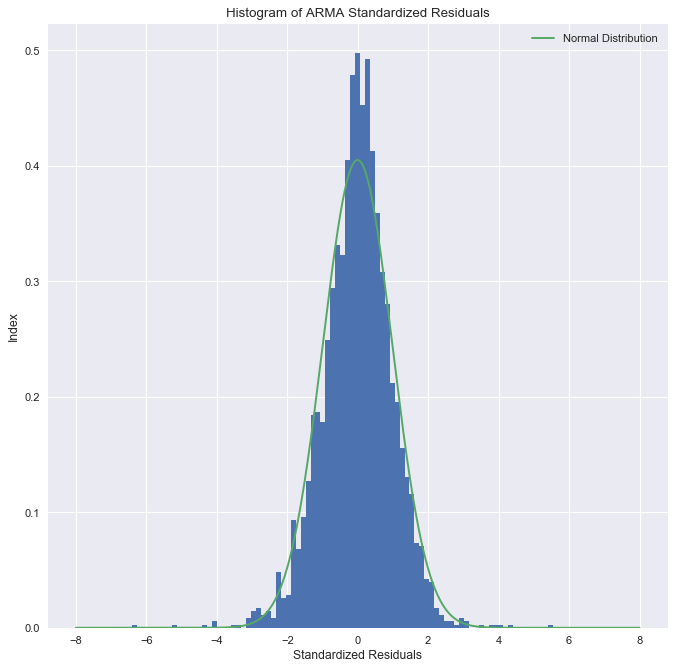

In [572]:

fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

ser2 = df__['ARIMA Standardized Residuals']

# plot normed histogram
plt.hist(df__['ARIMA Standardized Residuals'], bins = 85,normed = True)


# find minimum and maximum of xticks, so we know
# where we should compute theoretical distribution
xt = plt.xticks()[0]  
xmin, xmax = min(xt), max(xt)  
lnspc = np.linspace(xmin, xmax, len(ser2))

# lets try the normal distribution first
m, s = scipy.stats.norm.fit(ser2) # get mean and standard deviation  
pdf_g = scipy.stats.norm.pdf(lnspc, m, s) # now get theoretical values in our interval  
plt.plot(lnspc, pdf_g, label="Normal Distribution") # plot it
plt.legend()

plt.title('Histogram of ARIMA(1,1,1)-GARCH(1,1) Standardized Residuals')
plt.xlabel('Standardized Residuals')
plt.ylabel('Index')

Text(0.5,1,'ACF of ARIMA(1,1)-GARCH(1,1) Standardized Residuals')

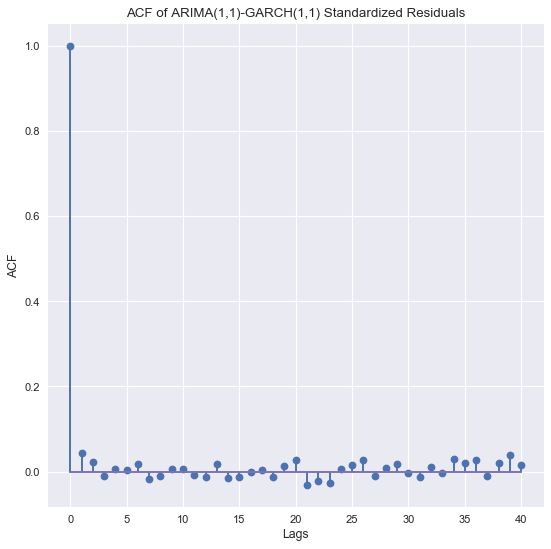

In [573]:

d_model = acf(df__['ARIMA Standardized Residuals'])



df_model['Squared Daily Log Returns'] = df_model['Daily Log Returns']**2
p_real = acf(df_model['Squared Daily Log Returns'])
pyplot.figure(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')


plt.stem(d_model,markerfmt='o')

plt.xlabel('Lags')
plt.ylabel('ACF')
plt.title('ACF of ARIMA(1,1)-GARCH(1,1) Standardized Residuals')

#plt.stem(p_real,linefmt = 'red')


# Part B : Risk measures

# (i) Historical Simulation

In [410]:
df2 = pd.read_csv('QRM-2018-cw1-data-2.csv')

In [411]:
df2 = pd.read_csv('QRM-2018-cw1-data-2.csv')
df2['daily linearised loss'] = - (np.log(df2.SSO) - np.log(df2.SSO.shift(1))) #We calculate the value of log returns of W_TI
df2["Date"] = df2["Date"].astype("datetime64")

#df2.drop(index=0,inplace = True) #We remove the NaN
#
#df2.set_index('Date',inplace = True)
df2.dropna(inplace = True)
df2.head(15)


,Date,SSO,daily linearised loss
1,2006-11-10,42.800,-0.001754
2,2006-11-13,42.975,-0.004080
3,2006-11-14,43.585,-0.014095
4,2006-11-15,43.895,-0.007087
5,2006-11-16,44.085,-0.004319
6,2006-11-17,44.075,0.000227
7,2006-11-20,44.050,0.000567
8,2006-11-21,44.185,-0.003060
9,2006-11-22,44.375,-0.004291
10,2006-11-24,44.020,0.008032


In [379]:
df3 = df2
df3.set_index('Date',inplace = True)




Text(0.5,0,'Days')

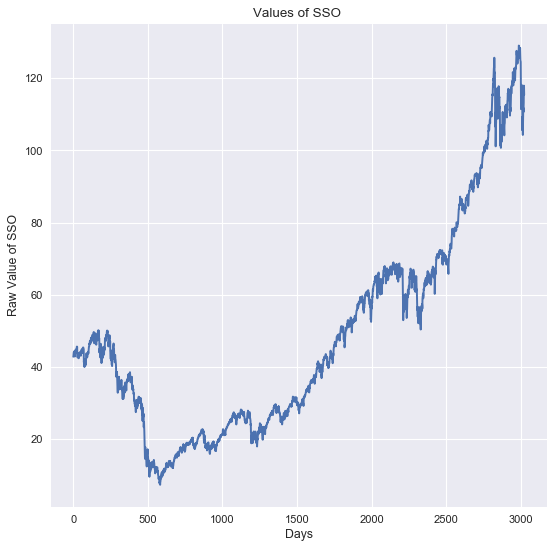

In [412]:
plt.figure(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')


ax = df3['SSO'].plot(title = 'Values of SSO ')
ax.set_ylabel('Raw Value of SSO')
ax.set_xlabel('Days')

In [413]:
df2['VaR 99'] = df2['daily linearised loss'].rolling(500).quantile(0.99)
df2['VaR 95'] = df2['daily linearised loss'].rolling(500).quantile(0.95)


In [121]:
dict_index_date ={}
dict_index_date[1] = df2.loc[1][0]
for i in range(1,df2.count()[0]+1):
    dict_index_date[i] = df2.loc[i][0]
    
def get_index(date_look,dict_index_date):
    for index, date in dict_index_date.items():    
        if date == date_look:
            return(index)

In [122]:
#df2['Rolling Window'] = df.apply(lambda x: [df2['daily linearised loss'][x.index-500:x.index-1]], axis=1)
#df2

# count = [0]
for i in range(1,df2.count()[0]+1):
    count.append(pd.np.nan)
    
    
for i in range(503,df2.count()[0]+1):
    threshold = df2.loc[i][3]
    cp_i = 0
    for j in range(1,501):
        if i-j >=0:
            if df2.loc[i-j][2] >= threshold:
                cp_i=1
    count[i] = cp_i
    
count
            

In [414]:
d = [pd.np.nan for i in range(0,df2.count()[0]+1)]
zz = [pd.np.nan for i in range(0,df2.count()[0]+1)]
zz2 = [pd.np.nan for i in range(0,df2.count()[0]+1)]
d2 = [pd.np.nan for i in range(0,df2.count()[0]+1)]

n = df2.count()[0]
df2['VaR 99%'] = df2['daily linearised loss'].rolling(500).quantile(0.99)
df2['VaR 95%'] = df2['daily linearised loss'].rolling(500).quantile(0.95)

for i in range(503,n+1):
    thresh = df2['VaR 99%'][i]
    mask = df2.loc[i-500:i-1]
    zz[i] = mask['daily linearised loss'][mask['daily linearised loss'] >= thresh].sum()/len(mask[mask['daily linearised loss'] >= thresh])
    d[i] = len(mask[mask['daily linearised loss'] >= thresh])
    
for i in range(503,n+1):
    thresh = df2['VaR 95%'][i]
    mask = df2.loc[i-500:i-1]
    zz2[i] = mask['daily linearised loss'][mask['daily linearised loss'] >= thresh].sum()/len(mask[mask['daily linearised loss'] >= thresh]) 
    d2[i] = len(mask[mask['daily linearised loss'] >= thresh])

df2['VaR Violations 99'] = d[1:]
df2['VaR Violations 95'] = d2[1:]

df2['ES 95%'] = zz2[1:]
df2['ES 99%'] = zz[1:]



In [415]:
res_hs = df2.loc[503:]

In [416]:
res_hs.set_index('Date',inplace = True)

<Figure size 1280x1280 with 0 Axes>

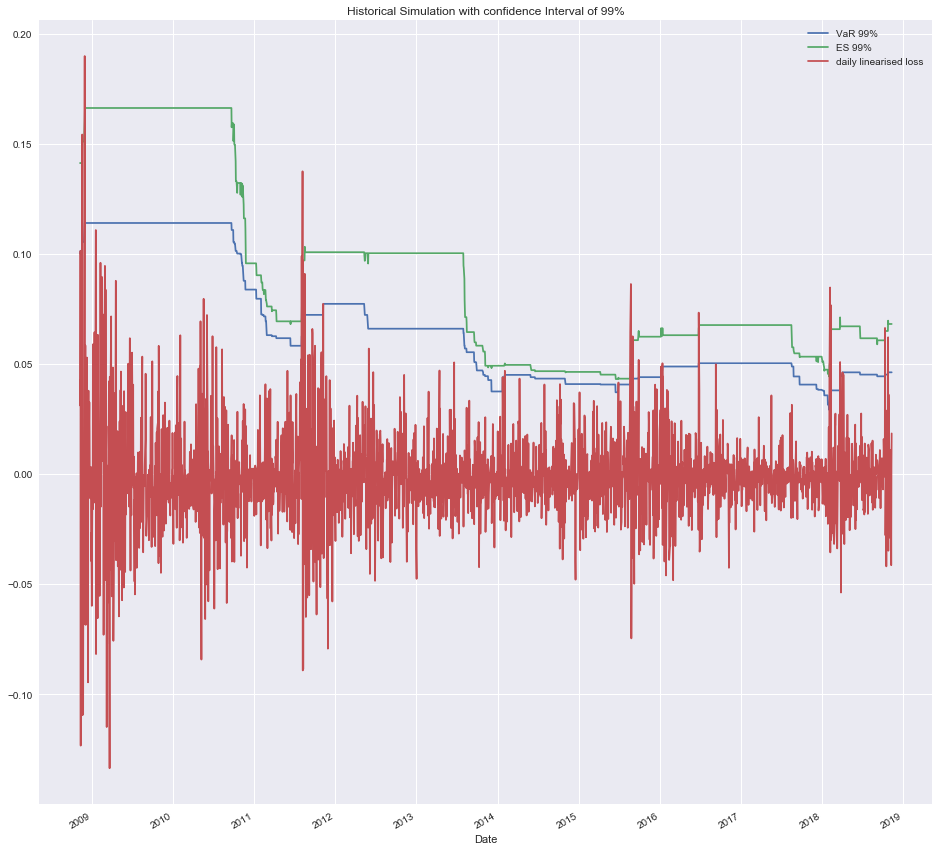

In [417]:
plt.figure(figsize=(16, 16), dpi= 80, facecolor='w', edgecolor='k')

res_hs[["VaR 99%", "ES 99%","daily linearised loss"]].plot(figsize = (16,16),title = 'Historical Simulation with confidence Interval of 99%')

Text(0,0.5,'index')

<Figure size 1280x1280 with 0 Axes>

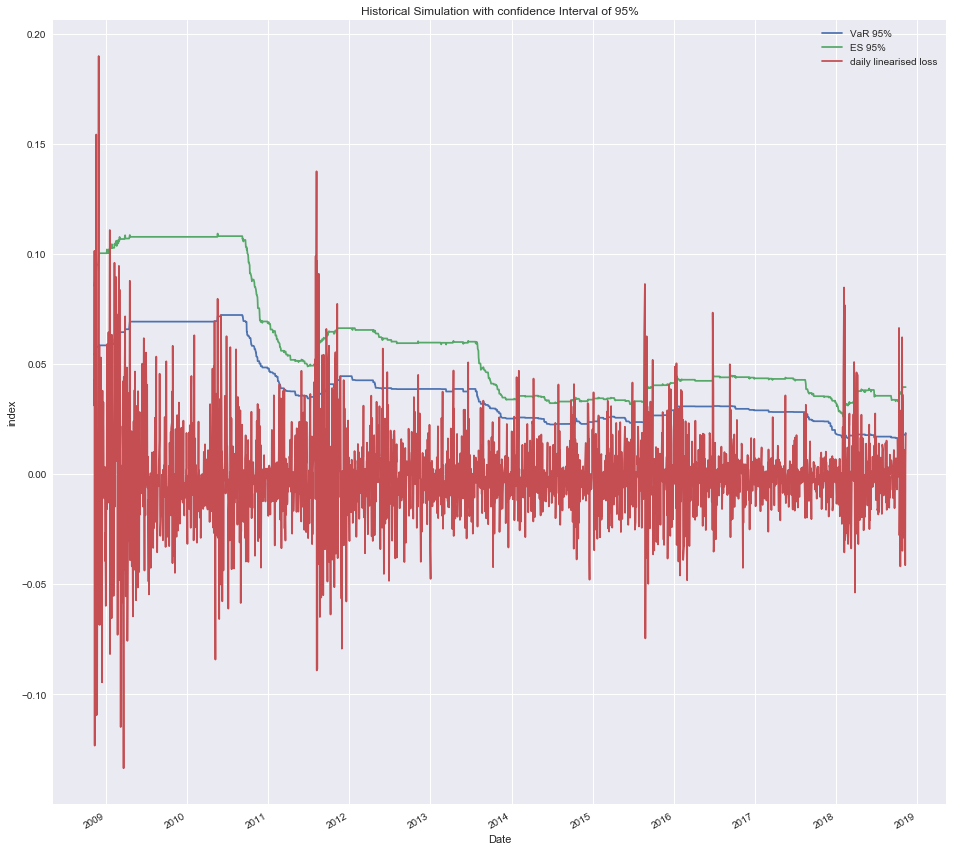

In [418]:
plt.figure(figsize=(16, 16), dpi= 80, facecolor='w', edgecolor='k')

res_hs[["VaR 95%", "ES 95%","daily linearised loss"]].plot(figsize = (16,16),title = 'Historical Simulation with confidence Interval of 95%')
plt.ylabel('index')

# (i) Filtered Historical Simulation

In [419]:
df4 = pd.read_csv('QRM-2018-cw1-data-2.csv')
df4['daily linearised loss'] = - (np.log(df4.SSO) - np.log(df4.SSO.shift(1))) #We calculate the value of log returns of W_TI


#df2.drop(index=0,inplace = True) #We remove the NaN
#
#df2.set_index('Date',inplace = True)
df4.dropna(inplace = True)
df4.Date.count()

3021

In [423]:
df3 = pd.read_csv('QRM-2018-cw1-data-2.csv')
df3['daily linearised loss'] = - (np.log(df3.SSO) - np.log(df3.SSO.shift(1))) #We calculate the value of log returns of W_TI


#df2.drop(index=0,inplace = True) #We remove the NaN
#
#df2.set_index('Date',inplace = True)
df3.dropna(inplace = True)
df3.Date.count()

3021

In [424]:
alpha,sigma = 0.06,[1/100]

def sqrt_(a,b):
    return np.sqrt(a**2 + b**2)

def com_alpha(alpha):
    return((1/apha) - 1 )

sqrt_(3,4)

5.0

In [426]:
n = df4.Date.count()
sigma = [1/100 for i in range(0,n+1)]
n,len(sigma)


(3021, 3022)

In [86]:
df4.loc[3-1][2]

-0.0040804486811620855

In [427]:
for i in range(2,n+1):
    
    p_ = df4.loc[i-1][2]
    first = alpha*p_
    second = (1-alpha)*sigma[i-1]
    
    sigma[i] = np.sqrt((first**2) + (second**2))

    


len(sigma[1:])

3021

In [428]:
df4['EWMA Volatility'] = sigma[1:]
df4['EWMA Standardized Residuals'] = df4['daily linearised loss']/df4['EWMA Volatility']
df3['EWMA Volatility'] = sigma[1:]
df3['EWMA Standardized Residuals'] = df3['daily linearised loss']/df3['EWMA Volatility']

df3

,Date,SSO,daily linearised loss,EWMA Volatility,EWMA Standardized Residuals
1,2006-11-10,42.800,-0.001754,0.010000,-0.175387
2,2006-11-13,42.975,-0.004080,0.009401,-0.434063
3,2006-11-14,43.585,-0.014095,0.008840,-1.594411
4,2006-11-15,43.895,-0.007087,0.008352,-0.848535
5,2006-11-16,44.085,-0.004319,0.007863,-0.549315
6,2006-11-17,44.075,0.000227,0.007396,0.030675
7,2006-11-20,44.050,0.000567,0.006952,0.081615
8,2006-11-21,44.185,-0.003060,0.006535,-0.468260
9,2006-11-22,44.375,-0.004291,0.006146,-0.698215
10,2006-11-24,44.020,0.008032,0.005783,1.389046


In [429]:
d = [pd.np.nan for i in range(0,df2.count()[0]+1)]
zz = [pd.np.nan for i in range(0,df2.count()[0]+1)]
zz2 = [pd.np.nan for i in range(0,df2.count()[0]+1)]
d2 = [pd.np.nan for i in range(0,df2.count()[0]+1)]

n = df2.count()[0]
df3['VaR 99%'] = df3['EWMA Standardized Residuals'].rolling(500).quantile(0.99)
df3['VaR 95%'] = df3['EWMA Standardized Residuals'].rolling(500).quantile(0.95)

for i in range(503,n+1):
    thresh = df3['VaR 99%'][i]
    mask = df3.loc[i-500:i-1]
    zz[i] = mask['EWMA Standardized Residuals'][mask['EWMA Standardized Residuals'] >= thresh].sum()/len(mask[mask['EWMA Standardized Residuals'] >= thresh])
    d[i] = len(mask[mask['EWMA Standardized Residuals'] >= thresh])
    
for i in range(503,n+1):
    thresh = df3['VaR 95%'][i]
    mask = df3.loc[i-500:i-1]
    zz2[i] = mask['EWMA Standardized Residuals'][mask['EWMA Standardized Residuals'] >= thresh].sum()/len(mask[mask['EWMA Standardized Residuals'] >= thresh]) 
    d2[i] = len(mask[mask['EWMA Standardized Residuals'] >= thresh])

df3['VaR Violations 99%'] = d[1:]
df3['VaR Violations 95%'] = d2[1:]

df3['ES 95%'] = zz2[1:]
df3['ES 99%'] = zz[1:]
df3

,Date,SSO,daily linearised loss,EWMA Volatility,EWMA Standardized Residuals,VaR 99%,VaR 95%,VaR Violations 99%,VaR Violations 95%,ES 95%,ES 99%
1,2006-11-10,42.800,-0.001754,0.010000,-0.175387,NaN,NaN,NaN,NaN,NaN,NaN
2,2006-11-13,42.975,-0.004080,0.009401,-0.434063,NaN,NaN,NaN,NaN,NaN,NaN
3,2006-11-14,43.585,-0.014095,0.008840,-1.594411,NaN,NaN,NaN,NaN,NaN,NaN
4,2006-11-15,43.895,-0.007087,0.008352,-0.848535,NaN,NaN,NaN,NaN,NaN,NaN
5,2006-11-16,44.085,-0.004319,0.007863,-0.549315,NaN,NaN,NaN,NaN,NaN,NaN
6,2006-11-17,44.075,0.000227,0.007396,0.030675,NaN,NaN,NaN,NaN,NaN,NaN
7,2006-11-20,44.050,0.000567,0.006952,0.081615,NaN,NaN,NaN,NaN,NaN,NaN
8,2006-11-21,44.185,-0.003060,0.006535,-0.468260,NaN,NaN,NaN,NaN,NaN,NaN
9,2006-11-22,44.375,-0.004291,0.006146,-0.698215,NaN,NaN,NaN,NaN,NaN,NaN
10,2006-11-24,44.020,0.008032,0.005783,1.389046,NaN,NaN,NaN,NaN,NaN,NaN


In [430]:
df4['VaR FHS 95%'] = df3['EWMA Volatility'] * df3['VaR 95%']
df4['VaR FHS 99%'] = df3['EWMA Volatility'] * df3['VaR 99%']
df4['ES FHS 95%'] = df3['EWMA Volatility'] * df3['ES 95%']
df4['ES FHS 99%'] = df3['EWMA Volatility'] * df3['ES 99%']
df4.loc[500:]
res_fhs = df4.loc[503:]
res_fhs

,Date,SSO,daily linearised loss,EWMA Volatility,EWMA Standardized Residuals,VaR FHS 95%,VaR FHS 99%,ES FHS 95%,ES FHS 99%
503,2008-11-10,14.1800,0.042795,0.014555,2.940255,0.176873,0.268064,0.252398,0.436226
504,2008-11-11,13.7450,0.031157,0.013920,2.238268,0.169163,0.256379,0.241397,0.417212
505,2008-11-12,12.4200,0.101367,0.013218,7.668883,0.160628,0.243444,0.229217,0.396161
506,2008-11-13,14.0500,-0.123314,0.013834,-8.914108,0.168109,0.254783,0.239893,0.414613
507,2008-11-14,12.7150,0.099840,0.014961,6.673274,0.181812,0.275550,0.259446,0.448408
508,2008-11-17,12.2250,0.039299,0.015286,2.570910,0.185761,0.281535,0.265082,0.458148
509,2008-11-18,12.3150,-0.007335,0.014561,-0.503736,0.176951,0.268183,0.252510,0.436419
510,2008-11-19,11.0900,0.104774,0.013695,7.650777,0.166420,0.252222,0.237482,0.410446
511,2008-11-20,9.5050,0.154226,0.014326,10.765526,0.174092,0.263849,0.248430,0.429368
512,2008-11-21,10.6050,-0.109508,0.016339,-6.702126,0.198558,0.300930,0.283344,0.489710


In [431]:
res_fhs["Date"] = res_fhs["Date"].astype("datetime64")

res_fhs.set_index('Date',inplace = True)

C:\Users\rehar\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


Text(0,0.5,'index')

<Figure size 1280x1280 with 0 Axes>

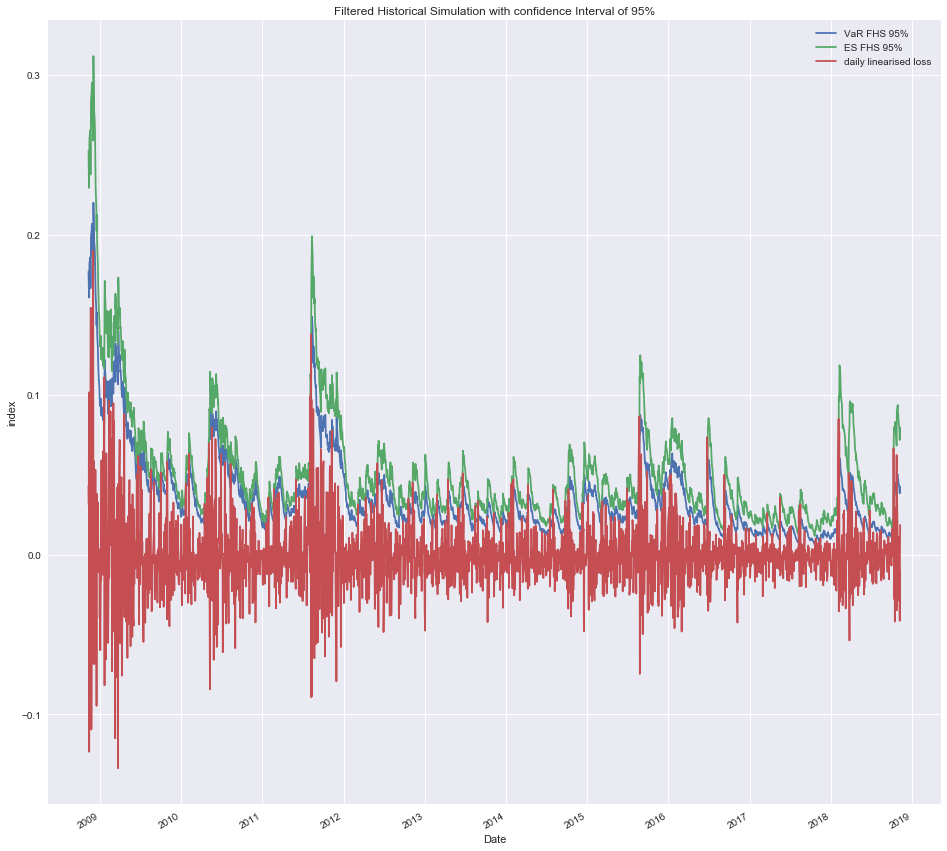

In [404]:
#res_fhs["Date"] = res_fhs["Date"].astype("datetime64")

#res_fhs.set_index('Date',inplace = True)
plt.figure(figsize=(16, 16), dpi= 80, facecolor='w', edgecolor='k')

res_fhs[["VaR FHS 95%", "ES FHS 95%","daily linearised loss"]].plot(figsize = (16,16),title = 'Filtered Historical Simulation with confidence Interval of 95%')
plt.ylabel('index')

Text(0,0.5,'index')

<Figure size 1280x1280 with 0 Axes>

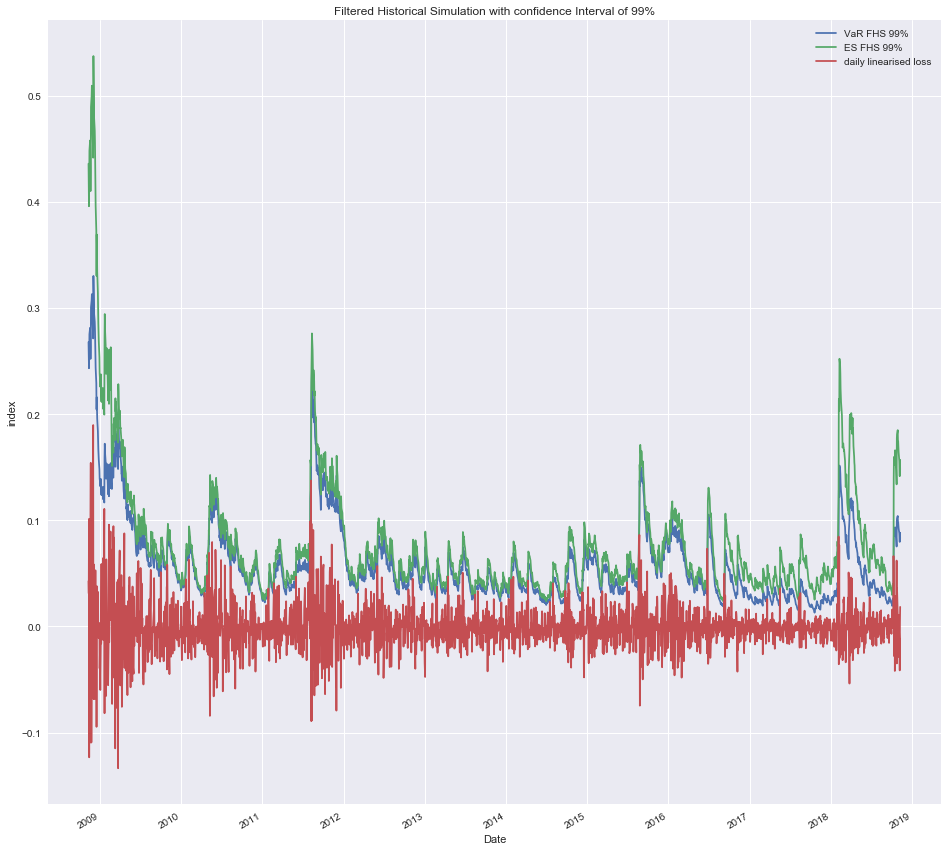

In [432]:
plt.figure(figsize=(16, 16), dpi= 80, facecolor='w', edgecolor='k')

res_fhs[["VaR FHS 99%", "ES FHS 99%","daily linearised loss"]].plot(figsize = (16,16),title = 'Filtered Historical Simulation with confidence Interval of 99%')
plt.ylabel('index')

# (iii) FHS With GARCH

In [433]:
df5 = pd.read_csv('QRM-2018-cw1-data-2.csv')
df5['daily linearised loss'] = - (np.log(df5.SSO) - np.log(df5.SSO.shift(1))) #We calculate the value of log returns of W_TI


#df2.drop(index=0,inplace = True) #We remove the NaN
#
#df2.set_index('Date',inplace = True)
df5.dropna(inplace = True)
df5.Date.count()
df5

,Date,SSO,daily linearised loss
1,2006-11-10,42.800,-0.001754
2,2006-11-13,42.975,-0.004080
3,2006-11-14,43.585,-0.014095
4,2006-11-15,43.895,-0.007087
5,2006-11-16,44.085,-0.004319
6,2006-11-17,44.075,0.000227
7,2006-11-20,44.050,0.000567
8,2006-11-21,44.185,-0.003060
9,2006-11-22,44.375,-0.004291
10,2006-11-24,44.020,0.008032


In [434]:
n = df5.count()[0]

In [102]:
for i in range(503,n+1):
    mask = df5.loc[i-500:i-1]
    mask['daily linearised loss']
    garch = arch_model(mask['daily linearised loss'],p=1,q=1)
    res = garch.fit()
    res.forecast().variance
    resid = garch.fit().resid

    

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1143.420674387968
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1144.7781537681549
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1145.1256077468686
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1145.1290437246123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1145.129043865586
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1143.420674387968
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1144.7781537681549
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1145.1256077468686
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1145.1290437246123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1145.129043865586
            Iterations: 8
            Function evaluations: 42
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      8,   Func. Count:     88,   Neg. LLF: -1133.748207238574
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1133.748207843658
            Iterations: 12
            Function evaluations: 88
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1131.8302230472889
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1132.9752428561878
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1133.733272814777
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1133.7477026826396
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1133.7478274997147
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1133.7478760281656
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1133.748153387311
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1133.748207238574
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1133.748207843658


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1117.837917443269
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1118.8402072856952
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1119.8913590055631
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1119.9075848513135
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1119.9090388707536
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1119.9102573112827
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1119.910258632706
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1117.837917443269
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1118.8402072856952
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1119.8913590055631
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1119.9075848513135
Iteration:      5,   Func. Count:     54,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1103.7616620576514
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1104.6247209471928
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1105.6489247341087
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1105.6815237058722
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1105.681525537147
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1101.9565575509419
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1103.0658597324727
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1103.403322039428
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1103.4205303345402
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1103.4205324095233
            Iterations: 8
            Function evaluations: 41
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1092.4229182191666
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1093.424891521166
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1093.831186158489
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1093.8393773629955
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1093.841423325876
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1093.8414258975822
            Iterations: 9
            Function evaluations: 53
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1092.4229182191666
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1093.424891521166
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1093.831186158489
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1093.8393773629955
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1093.841423325876
Positive directional derivative for linesearch 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1092.220825021052
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1092.4257384896273
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1092.4289564675846
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1092.4515240306632
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1092.4731044661044
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1092.4731068681062
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1090.6557277108632
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1092.220825021052
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1092.4257384896273
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1092.4289564675846
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1092.4515240306632
Iteration:      6,   Func. Count:     65, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1087.6815222934024
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1085.8629611354422
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1087.3367351258114
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1087.6815195756876
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1087.6815222934024
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1083.786753460224
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1085.2081095846904
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1085.356429908811
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1085.3655065993637
Iteration:      5,   Func. Count:     53,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     52,   Neg. LLF: -1081.0222679836431
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1081.022270635132
            Iterations: 9
            Function evaluations: 52
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1077.7439659972506
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1079.1365934418316
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1079.2198757252531
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1079.222773293965
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1079.2227759904072
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1077.7439659972506
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1079.1365934418316
Iteration:      3,   Func. Count:     29,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1073.2619992081602
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1073.4990832190585
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1073.4990859184068
            Iterations: 7
            Function evaluations: 29
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1067.3158124226861
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1068.3502809180222
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1069.2986706040906
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1069.3268511334868
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1069.502681556933
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1069.8101898235643
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1069.8260119176584
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1069.8260111914

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     29,   Neg. LLF: -1062.5662989398425
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1062.6032091330048
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1062.6071936875878
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1062.6075729215572
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1062.6097740248415
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1062.6097763622574
            Iterations: 11
            Function evaluations: 77
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1061.226979238243
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1062.3957455823563
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1062.5662989398425
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1062.6032091330048
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1062.6071936875878
Iteration:      6,   Func. Count:     65,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     42,   Neg. LLF: -1054.7519829009077
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1054.751985336448
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1053.1893841731385
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1053.8899728007127
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1054.7188205650891
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1054.7519829009077
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1054.751985336448
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1052.51880124666
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1053.082899410469
Iteration:      3,   Func. Count:     30,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1045.4574107219432
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1045.4574136116798
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1043.5480809606072
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1045.4574107219432
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1045.4574136116798
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1043.2987076089466
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1045.2288474961538
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1045.2293781510737
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1045.229381198883

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1045.7254174585928
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1048.2375096509395
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1048.237512028647
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1045.7254174585928
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1048.2375096509395
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1048.237512028647
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1042.1097762930242
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1044.941420593089
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1044.9418244989683
Positive directional derivative for linesearch 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1033.1295140698705
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1035.8929936829068
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1035.8933682872957
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1035.893370282058
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1033.1295140698705
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1035.8929936829068
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1035.8933682872957
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1035.893370282058
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1032.1415187962953
Iteration:      2,   Func. Count:     19,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1025.368185191895
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1027.3667024091778
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1027.5056365730588
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1027.5056381447903
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1023.486442029124
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1025.5065035579
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1025.7172539075093
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1025.717266445542
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1025.7186460252133
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1025.7186475982958
            Iterations: 9
            Function evaluations: 54
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1015.9640128196125
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1017.6848976492395
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1017.7331378111331
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1017.7335351078692
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1017.7335366796345
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1015.9640128196125
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1017.6848976492395
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1017.7331378111331
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1017.7335351078692
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1017.7335366796345
            Iterations: 8
            Function evaluations: 42
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1006.4334629389713
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1007.7282996652225
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1007.7327363597683
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1007.7327378654492
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1006.4334629389713
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1007.7282996652225
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1007.7327363597683
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1007.7327378654492
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1006.6709070844468
Iteration:      2,   Func. Count:     18,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -998.9041738513106
Iteration:      2,   Func. Count:     18,   Neg. LLF: -999.929964626954
Iteration:      3,   Func. Count:     31,   Neg. LLF: -999.9300222076067
Iteration:      4,   Func. Count:     42,   Neg. LLF: -999.9335714972548
Iteration:      5,   Func. Count:     54,   Neg. LLF: -999.9336301701208
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -999.933631481992
            Iterations: 5
            Function evaluations: 65
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.6689457081105
Iteration:      2,   Func. Count:     18,   Neg. LLF: -998.6187516673182
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.618752997493
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.668945

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.0567375136848
Iteration:      2,   Func. Count:     18,   Neg. LLF: -991.703604105809
Iteration:      3,   Func. Count:     30,   Neg. LLF: -991.7042022471037
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -991.7042034830787
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -989.9299619320128
Iteration:      2,   Func. Count:     18,   Neg. LLF: -990.6073641888543
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -990.6073654544255
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -989.9299619320128
Iteration:      2,   Func. Count:     18,   Neg. LLF: -990.6073641888543
Positive directional derivative for linesearch    (Exi

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -981.4385427811509
Iteration:      2,   Func. Count:     18,   Neg. LLF: -981.9832773584876
Iteration:      3,   Func. Count:     30,   Neg. LLF: -981.9833650504725
Iteration:      4,   Func. Count:     41,   Neg. LLF: -981.9836236750596
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -981.9836248708212
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -981.4385427811509
Iteration:      2,   Func. Count:     18,   Neg. LLF: -981.9832773584876
Iteration:      3,   Func. Count:     30,   Neg. LLF: -981.9833650504725
Iteration:      4,   Func. Count:     41,   Neg. LLF: -981.9836236750596
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -981.9836248708212
            Iterations: 8
            Function evaluations: 41
            Gr

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     18,   Neg. LLF: -975.1199713194068
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -975.1199724673003
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.550023007432
Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.0844557162693
Iteration:      3,   Func. Count:     30,   Neg. LLF: -976.0848162368534
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -976.0848173654178
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.550023007432
Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.0844557162693
Iteration:      3,   Func. Count:     30,   Neg. LLF: -976.0848162368534
Positive directional derivative for linesearch    (Exi

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.0253391462657
Iteration:      2,   Func. Count:     18,   Neg. LLF: -975.4706852474701
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -975.4706867049024
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -974.0822508820361
Iteration:      2,   Func. Count:     18,   Neg. LLF: -974.5562482267447
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -974.5562494196727
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -974.0822508820361
Iteration:      2,   Func. Count:     18,   Neg. LLF: -974.5562482267447
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -974.5562494196727
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -971.20776259224
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.6412053668014
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.6412064119388
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.665566648724
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.0828871836073
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.0828882774385
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.665566648724
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.0828871836073
Positive directional derivative for linesearch    (Exi

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -967.3264957604248
Iteration:      2,   Func. Count:     18,   Neg. LLF: -967.6445718484612
Iteration:      3,   Func. Count:     27,   Neg. LLF: -967.6762339105958
Iteration:      4,   Func. Count:     39,   Neg. LLF: -967.700985600022
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -967.7009862664594
            Iterations: 8
            Function evaluations: 39
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -967.3264957604248
Iteration:      2,   Func. Count:     18,   Neg. LLF: -967.6445718484612
Iteration:      3,   Func. Count:     27,   Neg. LLF: -967.6762339105958
Iteration:      4,   Func. Count:     39,   Neg. LLF: -967.700985600022
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -967.7009862664594
            Iterations: 8
            Function evaluations: 39
            Gradie

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -962.7164249871305
Iteration:      2,   Func. Count:     18,   Neg. LLF: -963.0777260573664
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -963.0777271618902
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -962.7164249871305
Iteration:      2,   Func. Count:     18,   Neg. LLF: -963.0777260573664
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -963.0777271618902
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -963.1913097728385
Iteration:      2,   Func. Count:     18,   Neg. LLF: -963.5593003843562
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -963.5593015216234
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     60,   Neg. LLF: -965.0263633573865
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -965.0263643074611
            Iterations: 10
            Function evaluations: 60
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -964.7238169100726
Iteration:      2,   Func. Count:     18,   Neg. LLF: -965.1678581116274
Iteration:      3,   Func. Count:     27,   Neg. LLF: -965.1980576708371
Iteration:      4,   Func. Count:     38,   Neg. LLF: -965.2518742503967
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -965.2518753404574
            Iterations: 8
            Function evaluations: 38
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -964.7238169100726
Iteration:      2,   Func. Count:     18,   Neg. LLF: -965.1678581116274
Iteration:      3,   Func. Count:     27,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     41,   Neg. LLF: -971.9616171313652
Iteration:      5,   Func. Count:     52,   Neg. LLF: -971.9624072955868
Iteration:      6,   Func. Count:     64,   Neg. LLF: -971.9627845103682
Iteration:      7,   Func. Count:     74,   Neg. LLF: -971.9684117804426
Iteration:      8,   Func. Count:     85,   Neg. LLF: -971.972160108196
Iteration:      9,   Func. Count:     97,   Neg. LLF: -971.9725759886727
Iteration:     10,   Func. Count:    108,   Neg. LLF: -971.9732404919782
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.9732417061392
            Iterations: 14
            Function evaluations: 108
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -971.2160671001047
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.958789051413
Iteration:      3,   Func. Count:     30,   Neg. LLF: -971.9602084237517
Iteration:      4,   Func. Count:     41,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -969.5137729598363
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.042770304736
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.0427714193711
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -969.2825480262704
Iteration:      2,   Func. Count:     18,   Neg. LLF: -969.835174872411
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -969.8351760163737
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -969.2825480262704
Iteration:      2,   Func. Count:     18,   Neg. LLF: -969.835174872411
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -969.8351760163737
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.7612401074533
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.4193715857165
Iteration:      3,   Func. Count:     27,   Neg. LLF: -971.5501164951282
Iteration:      4,   Func. Count:     37,   Neg. LLF: -971.5510976532632
Iteration:      5,   Func. Count:     49,   Neg. LLF: -971.5523379588706
Iteration:      6,   Func. Count:     59,   Neg. LLF: -971.552942164408
Iteration:      7,   Func. Count:     71,   Neg. LLF: -971.5535578298784
Iteration:      8,   Func. Count:     81,   Neg. LLF: -971.5538805184641
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.5538805092151
            Iterations: 12
            Function evaluations: 81
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.7612401074533
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.4193715857165
Iteration:      3,   Func. Count:     27,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -974.1951703249808
Iteration:      2,   Func. Count:     18,   Neg. LLF: -974.7927764445374
Iteration:      3,   Func. Count:     30,   Neg. LLF: -974.7931408944887
Iteration:      4,   Func. Count:     41,   Neg. LLF: -974.7934789116355
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -974.793479929148
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -973.756721533209
Iteration:      2,   Func. Count:     18,   Neg. LLF: -974.3730023506347
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -974.3730034107388
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -973.756721533209
Iteration:      2,   Func. Count:     18,   Neg. LLF: -9

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.9152886534232
Iteration:      3,   Func. Count:     30,   Neg. LLF: -971.9157126945338
Iteration:      4,   Func. Count:     41,   Neg. LLF: -971.9160983101644
Iteration:      5,   Func. Count:     50,   Neg. LLF: -971.9556988768414
Iteration:      6,   Func. Count:     61,   Neg. LLF: -971.9851609787095
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.9851619188021
            Iterations: 10
            Function evaluations: 61
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -971.3695981515434
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.9152886534232
Iteration:      3,   Func. Count:     30,   Neg. LLF: -971.9157126945338
Iteration:      4,   Func. Count:     41,   Neg. LLF: -971.9160983101644
Iteration:      5,   Func. Count:     50,   Neg. LLF: -971.9556988768414
Iteration:      6,   Func. Count:     61,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -968.1870059177836
Iteration:      2,   Func. Count:     18,   Neg. LLF: -968.7698022627667
Iteration:      3,   Func. Count:     29,   Neg. LLF: -968.7701703502994
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -968.7701718236477
            Iterations: 7
            Function evaluations: 29
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -968.1870059177836
Iteration:      2,   Func. Count:     18,   Neg. LLF: -968.7698022627667
Iteration:      3,   Func. Count:     29,   Neg. LLF: -968.7701703502994
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -968.7701718236477
            Iterations: 7
            Function evaluations: 29
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.204384004925
Iteration:      2,   Func. Count:     18,   Neg. LLF: 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     30,   Neg. LLF: -970.7067817740838
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.7067834449101
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.1148349328236
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.7923285472185
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.7923302318945
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.1148349328236
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.7923285472185
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.7923302318945
            Iterations: 6
            Function evaluations: 18
            Grad

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -971.6620347537362
Iteration:      2,   Func. Count:     18,   Neg. LLF: -972.2761259188571
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -972.2761272840226
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.415809594013
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.039609495243
Iteration:      3,   Func. Count:     28,   Neg. LLF: -971.0547431954866
Iteration:      4,   Func. Count:     39,   Neg. LLF: -971.0718195501096
Iteration:      5,   Func. Count:     51,   Neg. LLF: -971.0734081176557
Iteration:      6,   Func. Count:     60,   Neg. LLF: -971.0992631434586
Iteration:      7,   Func. Count:     72,   Neg. LLF: -971.142513962031
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.1425148859762
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -972.6481725990113
Iteration:      2,   Func. Count:     18,   Neg. LLF: -973.3758333193589
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -973.3758348896695
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -972.6481725990113
Iteration:      2,   Func. Count:     18,   Neg. LLF: -973.3758333193589
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -973.3758348896695
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.3327714689681
Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.0159755902464
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -976.0159770539819
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.3193331976128
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -976.3193349873171
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -978.1577130205904
Iteration:      2,   Func. Count:     18,   Neg. LLF: -978.8710127864463
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -978.8710144919239
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -978.1577130205904
Iteration:      2,   Func. Count:     18,   Neg. LLF: -978.8710127864463
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -978.8710144919239
            Iterations: 6
            Function evaluations: 18
            Gradi

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -981.7966318480326
Iteration:      2,   Func. Count:     18,   Neg. LLF: -982.5873024836014
Iteration:      3,   Func. Count:     30,   Neg. LLF: -982.5900986042906
Iteration:      4,   Func. Count:     39,   Neg. LLF: -982.7894102443553
Iteration:      5,   Func. Count:     51,   Neg. LLF: -982.899682985355
Iteration:      6,   Func. Count:     61,   Neg. LLF: -982.9070702389254
Iteration:      7,   Func. Count:     73,   Neg. LLF: -982.9133387666726
Iteration:      8,   Func. Count:     85,   Neg. LLF: -982.9135196986927
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -982.9135208623902
            Iterations: 12
            Function evaluations: 85
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -981.5308578332447
Iteration:      2,   Func. Count:     18,   Neg. LLF: -982.282112879664
Positive directional derivative for linesearch    (Ex

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -985.2030062295869
Iteration:      2,   Func. Count:     18,   Neg. LLF: -986.1944864978457
Iteration:      3,   Func. Count:     30,   Neg. LLF: -986.1976853993519
Iteration:      4,   Func. Count:     41,   Neg. LLF: -986.2040163335246
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -986.2040188954047
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -985.9281358098265
Iteration:      2,   Func. Count:     18,   Neg. LLF: -986.885819181913
Iteration:      3,   Func. Count:     30,   Neg. LLF: -986.8936000334465
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -986.8936025621721
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      7,   Func. Count:     74,   Neg. LLF: -992.3191569697074
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.319159634884
            Iterations: 11
            Function evaluations: 74
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.1488917276131
Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.2728687124762
Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.2943078194066
Iteration:      4,   Func. Count:     42,   Neg. LLF: -992.3001714323962
Iteration:      5,   Func. Count:     52,   Neg. LLF: -992.3030091896985
Iteration:      6,   Func. Count:     63,   Neg. LLF: -992.3172294075256
Iteration:      7,   Func. Count:     74,   Neg. LLF: -992.3191569697074
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.319159634884
            Iterations: 11
            Function evaluations: 74
            Grad

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -994.0271706900403
Iteration:      3,   Func. Count:     30,   Neg. LLF: -994.0291887698464
Iteration:      4,   Func. Count:     43,   Neg. LLF: -994.0295669993034
Iteration:      5,   Func. Count:     54,   Neg. LLF: -994.0345626798115
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -994.0345651264918
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -993.0479786269613
Iteration:      2,   Func. Count:     18,   Neg. LLF: -994.0271706900403
Iteration:      3,   Func. Count:     30,   Neg. LLF: -994.0291887698464
Iteration:      4,   Func. Count:     43,   Neg. LLF: -994.0295669993034
Iteration:      5,   Func. Count:     54,   Neg. LLF: -994.0345626798115
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -994.0345651264918
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.9706746411175
Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.9784476763703
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.9784497808606
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.9812191383319
Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.9706746411175
Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.9784476763703
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.9784497808606
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.8992145177558
Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.911184587133
Iteration:      3,   Func. Count:     30,   Neg. LLF: 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.5593317383352
Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.5866496426908
Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.6058384188023
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.6058410199032
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.6281491559823
Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.6374199074745
Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.6545669486117
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.6545695691676
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.6281491559823
Iteration:      2,   Func. Count:     18,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.3243081276923
Iteration:      2,   Func. Count:     18,   Neg. LLF: -997.263951630639
Iteration:      3,   Func. Count:     30,   Neg. LLF: -997.2660817480715
Iteration:      4,   Func. Count:     42,   Neg. LLF: -997.2771100039886
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.2771132318462
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.8862159080719
Iteration:      2,   Func. Count:     18,   Neg. LLF: -998.956742687307
Iteration:      3,   Func. Count:     30,   Neg. LLF: -998.9745616464704
Iteration:      4,   Func. Count:     42,   Neg. LLF: -998.9827151064001
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.9827180227928
            Iterations: 8
            Function evaluations: 42
            Gradie

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -1010.0006519586038
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1010.000654823256
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1008.8003816540843
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1010.0956319615996
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1010.2204543329337
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1010.2222856095561
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1010.2254204043459
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1010.2329119712059
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1010.2329149230451
            Iterations: 10
            Function evaluations: 64
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1016.0107965187569
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1017.312939396921
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1017.3944439202427
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1017.3944471019912
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1015.9707804959749
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1017.2547371606502
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1017.3687268740986
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1017.3693738172235
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1017.3700203571439
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1017.3700236064146
            Iterations: 9
            Function evaluations: 54
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1022.0884003597357
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1023.4578206739529
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1023.8077675920335
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1023.8085091571813
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1023.8085703721914
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1023.8085737652401
            Iterations: 6
            Function evaluations: 65
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1021.958768672116
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1023.2175417627635
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1023.6702688389255
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1023.6702722878406
            Iterations: 7
            Function evaluations: 30
            G

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.4878273290751
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1021.4919190846383
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1021.9149051820305
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1021.9161808981053
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1021.9271509458637
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1021.9272764393489
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1021.9272800332719
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.4878273290751
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1021.4919190846383
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1021.9149051820305
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1021.9161808981053
Iteration:      5,   Func. Count:     53

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1016.8568529489334
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1017.9999656184569
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1018.345652915435
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1018.3456559426346
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1016.8568529489334
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1017.9999656184569
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1018.345652915435
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1018.3456559426346
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1014.3217769043767
Iteration:      2,   Func. Count:     18,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1008.0558685566625
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1009.0912195173061
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1009.4644352680828
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1009.5508052285334
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1009.5508081317219
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1008.0558685566625
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1009.0912195173061
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1009.4644352680828
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1009.5508052285334
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1009.5508081317219
            Iterations: 8
            Function evaluations: 41
      

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.0294191914743
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1001.8981018873084
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.8981048610699
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.0294191914743
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1001.8981018873084
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.8981048610699
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.1284185017199
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1001.9953178541286
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1001.9959551436854
Positive directional derivative for linesear

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.5885248887314
Iteration:      2,   Func. Count:     19,   Neg. LLF: -999.4554165425579
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -999.4554194091618
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.5885248887314
Iteration:      2,   Func. Count:     19,   Neg. LLF: -999.4554165425579
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -999.4554194091618
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.6581704305487
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.4968086382974
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.4968115400436
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     31,   Neg. LLF: -1000.3880721279988
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1000.3880755004035
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.8727812598493
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.8929586754184
Iteration:      3,   Func. Count:     31,   Neg. LLF: -997.8935740006704
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.8935771009503
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.8727812598493
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.8929586754184
Iteration:      3,   Func. Count:     31,   Neg. LLF: -997.8935740006704
Positive directional derivative for linesearch    (

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.332129632722
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.292328590054
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.292331717526
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.332129632722
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.292328590054
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.292331717526
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.2656903602347
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.211356027115
Iteration:      3,   Func. Count:     32,   Neg. LLF: -997.2115000280379
Iteration:      4,   Func. Count:     43,   Neg. LLF: -997.2

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.90777491396
Iteration:      3,   Func. Count:     29,   Neg. LLF: -998.9175135901561
Iteration:      4,   Func. Count:     41,   Neg. LLF: -998.9207512721213
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.9207546298438
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.0262427559064
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.90777491396
Iteration:      3,   Func. Count:     29,   Neg. LLF: -998.9175135901561
Iteration:      4,   Func. Count:     41,   Neg. LLF: -998.9207512721213
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.9207546298438
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -99

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -998.4472471143869
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.4472503918538
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.3881229389534
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.4337760559471
Iteration:      3,   Func. Count:     32,   Neg. LLF: -998.4472471143869
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.4472503918538
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.8103047174054
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.8113578868811
Iteration:      3,   Func. Count:     32,   Neg. LLF: -998.8288921232701
Positive directional derivative for linesearch    (Ex

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -999.8831965667691
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1001.251347685301
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1001.959718101688
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1001.9608107928484
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1001.9655990435022
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.9656028628352
            Iterations: 9
            Function evaluations: 56
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.8443065280327
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1002.0710113060649
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1002.8369837826427
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1002.8506972051355
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1002.8537507497175
Positive directional derivative for linesear

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     20,   Neg. LLF: -1010.3105079281244
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1010.310512181796
            Iterations: 6
            Function evaluations: 20
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1008.4483088065922
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1010.3105079281244
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1010.310512181796
            Iterations: 6
            Function evaluations: 20
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1009.5699210820783
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1011.5307631248564
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1011.5307675034494
            Iterations: 6
            Function evaluations: 20
           

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1024.4348329231095
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1026.0946466424723
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1026.0946514158484
            Iterations: 6
            Function evaluations: 20
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1024.4348329231095
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1026.0946466424723
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1026.0946514158484
            Iterations: 6
            Function evaluations: 20
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1024.592288909102
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1026.467654601138
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1026.4676592808537


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1043.5100781044448
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1044.4720384911325
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1044.5397971326863
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1044.5404855262118
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1044.5404896886744
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1043.5100781044448
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1044.4720384911325
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1044.5397971326863
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1044.5404855262118
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1044.5404896886744
            Iterations: 8
            Function evaluations: 44
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1063.4884375325123
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1063.905318362025
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1063.9054953530606
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1063.9054992942467
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1068.316972385886
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1069.0976066268759
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1069.0977685591556
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1069.1024080903194
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1069.109692131297
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1069.109695342756
            Iterations: 9
            Function evaluations: 55
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1084.5355061612054
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1085.2578572849604
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1085.262563736916
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1085.2625673320977
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1087.06177360512
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1087.5987081721833
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1087.5992447961528
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1087.5992482715624
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1087.06177360512
Iteration:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1105.2869576111843
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1105.2875228236753
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1105.2875247191491
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1104.7524866135022
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1105.2869445883894
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1105.2869576111843
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1105.2875228236753
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1105.2875247191491
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1105.1457889488508
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1117.9716665949225
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1118.5694244261322
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1118.569424725346
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1117.9716665949225
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1118.5694244261322
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1118.569424725346
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1119.4988039364744
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1120.0183676856007
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1120.0184245543896
Positive directional derivative for linesearc

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1131.842110112417
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1132.3866514687743
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1132.3868156449516
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1132.3868165712154
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1131.842110112417
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1132.3866514687743
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1132.3868156449516
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1132.3868165712154
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1132.9996072452789
Iteration:      2,   Func. Count:     19,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

            Current function value: -1145.7246272664934
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1145.0135924301744
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1145.7244108241332
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1145.724625508762
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1145.7246272664934
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1146.7467485571703
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1147.3860921785797
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1147.387060232757
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1147.3870620289076
            Iterations: 7
            Function evaluations: 30
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1163.7778588638032
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1163.777860712155
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1165.1783566511926
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1165.7949988789492
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1165.7954325016503
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1165.796177351095
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1165.7961791418902
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1165.1783566511926
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1165.7949988789492
Iteration:      3,   Func. Count:     30,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1175.0864564146577
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1175.0864578264873
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1174.7285047292628
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1175.0864564146577
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1175.0864578264873
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1175.9646518612926
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1176.3541175215842
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1176.3541190548026
            Iterations: 6
            Function evaluations: 19
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -1193.0639437191555
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1193.0650932796975
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1193.06536552366
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1193.0653674363814
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1192.9392799533803
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1193.0629355615727
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1193.0639437191555
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1193.0650932796975
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1193.06536552366
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1193.0653674363814
            Iterations: 9
            Function evaluations: 54
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.174303493723
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1198.1747774246862
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1198.1752012597142
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1198.1927304403455
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1198.5137637890307
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1198.6124648131292
Iteration:      7,   Func. Count:     59,   Neg. LLF: -1198.6738444944722
Iteration:      8,   Func. Count:     65,   Neg. LLF: -1198.675197721245
Iteration:      9,   Func. Count:     71,   Neg. LLF: -1198.675540658714
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1198.6755406594957
            Iterations: 9
            Function evaluations: 82
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.174303493723
Iteration:      2,   Func. Count:     18,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      5,   Func. Count:     50,   Neg. LLF: -1202.950471509665
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1202.9590608893336
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1202.9660599188508
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1203.0196988730686
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1203.0834085118995
Iteration:     10,   Func. Count:     94,   Neg. LLF: -1203.4043925023252
Iteration:     11,   Func. Count:    100,   Neg. LLF: -1203.4849938281634
Iteration:     12,   Func. Count:    107,   Neg. LLF: -1203.5111052217144
Iteration:     13,   Func. Count:    113,   Neg. LLF: -1203.5272333667835
Iteration:     14,   Func. Count:    119,   Neg. LLF: -1203.5348912896752
Iteration:     15,   Func. Count:    126,   Neg. LLF: -1203.5349252062128
Iteration:     16,   Func. Count:    133,   Neg. LLF: -1203.5349264276851
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1203.534926428493
   

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1208.684428887675
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1208.701299640771
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1208.7715320024147
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1208.80576149444
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1208.8307875570556
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1208.8336436495306
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1208.859362470739
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1209.1217620457842
Iteration:     10,   Func. Count:     97,   Neg. LLF: -1209.1237654310341
Iteration:     11,   Func. Count:    103,   Neg. LLF: -1209.1961883893152
Iteration:     12,   Func. Count:    109,   Neg. LLF: -1209.2048077761406
Iteration:     13,   Func. Count:    115,   Neg. LLF: -1209.2049502990756
Iteration:     14,   Func. Count:    121,   Neg. LLF: -1209.2049859147378
Optimization terminated successfully.    (E

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1214.8398474939868
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1214.9329978561386
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1214.9524048509725
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1214.9573725167063
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1214.9578217067015
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1214.9598465385832
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1214.9605082616572
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1214.9605944808582
Iteration:      9,   Func. Count:    103,   Neg. LLF: -1214.9606667379771
Iteration:     10,   Func. Count:    114,   Neg. LLF: -1215.1669485446969
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1215.166983954025
Iteration:     12,   Func. Count:    135,   Neg. LLF: -1215.2064432379536
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1215.4907767940708
Iteration:     14,   Func. Count:    14

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

257
            Gradient evaluations: 22
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1221.1544282991636
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1221.2721862734716
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1221.305218777709
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1221.305225246425
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1221.3065003999482
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1221.3102704120952
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1221.311135263005
Iteration:      8,   Func. Count:     92,   Neg. LLF: -1221.3111576718334
Iteration:      9,   Func. Count:    103,   Neg. LLF: -1221.3384478815924
Iteration:     10,   Func. Count:    115,   Neg. LLF: -1221.3572500260723
Iteration:     11,   Func. Count:    127,   Neg. LLF: -1221.361363585077
Iteration:     12,   Func. Count:    139,   Neg. LLF: -1221.3618747292228
Iteration:     13,   Func. Count:    151,   Neg. LLF: -1221.3639003904536
I

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     41,   Neg. LLF: -1232.129178260639
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1232.1291801408934
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1232.129229136764
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1232.129334954895
Iteration:      8,   Func. Count:     92,   Neg. LLF: -1232.1294265190172
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1232.1329020787248
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1232.1345833592964
Iteration:     11,   Func. Count:    129,   Neg. LLF: -1232.1355516165138
Iteration:     12,   Func. Count:    143,   Neg. LLF: -1232.1355897814021
Iteration:     13,   Func. Count:    155,   Neg. LLF: -1232.136968665944
Iteration:     14,   Func. Count:    167,   Neg. LLF: -1232.1383380597538
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1232.1383371780753
            Iterations: 18
            Function evaluations: 167
     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1233.7024312527824
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1233.7810840051302
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1233.808607667055
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1233.8112823520105
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1233.8123498937025
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1233.81378004018
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1233.8165081477043
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1233.8167975822475
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1233.8172204026666
Iteration:     10,   Func. Count:    115,   Neg. LLF: -1233.8173172929426
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1233.817316449586
            Iterations: 14
            Function evaluations: 126
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     55,   Neg. LLF: -1239.5702752736288
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1239.5703962105752
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1239.5704702992248
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1239.5711551019065
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1239.5712760534948
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1239.5713525829726
Iteration:     11,   Func. Count:    130,   Neg. LLF: -1239.571386799388
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1239.5713860104097
            Iterations: 15
            Function evaluations: 141
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1240.5372169965735
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1240.8205063284704
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1240.820519453258
Iteration:      4,   Func. Count:     41,   Neg. 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -1244.461566100543
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1244.4616303698085
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1244.6221931392456
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1244.7253004239649
Iteration:      7,   Func. Count:     67,   Neg. LLF: -1244.728234944265
Iteration:      8,   Func. Count:     73,   Neg. LLF: -1244.7285626951457
Iteration:      9,   Func. Count:     79,   Neg. LLF: -1244.7285697144748
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1244.7285697150169
            Iterations: 10
            Function evaluations: 79
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1244.0066792481916
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1244.1074743534132
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1244.192872224215
Iteration:      4,   Func. Count:     45,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.6762304084166
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1250.7349079587611
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1250.7598346142433
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1250.7690741522356
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1250.7751611884446
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1251.0988941500345
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1251.099018465762
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1251.3090240362399
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1251.4067131775437
Iteration:     10,   Func. Count:    102,   Neg. LLF: -1251.4108136411833
Iteration:     11,   Func. Count:    108,   Neg. LLF: -1251.4109282481318
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1251.4109282518311
            Iterations: 14
            Function evaluations: 119
           

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.8534184533564
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1253.9225473137758
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1253.9506601095147
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1253.962524212161
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1253.9711812251307
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1253.971227818831
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1253.9712711625662
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1253.9712707424637
            Iterations: 10
            Function evaluations: 90
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.664967445522
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1253.7474598144508
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1253.8027383519131
Iteration:      4,   Func. Count:     42,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:     11,   Func. Count:    125,   Neg. LLF: -1254.7656635130545
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1254.7813815522322
Iteration:     13,   Func. Count:    138,   Neg. LLF: -1254.7853527903853
Iteration:     14,   Func. Count:    144,   Neg. LLF: -1254.7865367730285
Iteration:     15,   Func. Count:    150,   Neg. LLF: -1254.7867970512607
Iteration:     16,   Func. Count:    156,   Neg. LLF: -1254.7868234180064
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1254.7868234180742
            Iterations: 18
            Function evaluations: 156
            Gradient evaluations: 16
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.6137898253862
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1253.7017446873888
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1253.7583984920661
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1253.7605485979188
Iteration:      5,   Func. Count:     57,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:     14,   Func. Count:    176,   Neg. LLF: -1255.7805467340493
Iteration:     15,   Func. Count:    191,   Neg. LLF: -1255.7805596446046
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.7805582719398
            Iterations: 19
            Function evaluations: 191
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.6635506198245
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1255.731766419451
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1255.776370170305
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1255.7782207221949
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1255.7789886035512
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1255.779307367856
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1255.7795308619736
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1255.7795400672621
Iteration:      9,   Func. Count:    107,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     11,   Func. Count:    132,   Neg. LLF: -1259.163712759625
Iteration:     12,   Func. Count:    139,   Neg. LLF: -1259.1842385791133
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1259.19854542587
Iteration:     14,   Func. Count:    153,   Neg. LLF: -1259.209669711581
Iteration:     15,   Func. Count:    159,   Neg. LLF: -1259.2141586010189
Iteration:     16,   Func. Count:    165,   Neg. LLF: -1259.2142516968743
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1259.214251697307
            Iterations: 18
            Function evaluations: 165
            Gradient evaluations: 16
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.1099910446842
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1259.1702163181722
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1259.216294338984
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1259.5642213515289
Iteration:      5,   Func. Count:     54,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      8,   Func. Count:     86,   Neg. LLF: -1260.8378699716754
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1260.857274312973
Iteration:     10,   Func. Count:    101,   Neg. LLF: -1260.8673051492797
Iteration:     11,   Func. Count:    107,   Neg. LLF: -1260.8711263574282
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1260.8711263538355
            Iterations: 11
            Function evaluations: 118
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.549481693312
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1259.616118055705
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1259.667941702026
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1259.6679583193759
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1260.0485570190376
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1260.3090106673778
Iteration:      7,   Func. Count:     77,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1263.985048248624
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1264.0332221557705
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1264.0628310332982
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1264.0675759331607
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1264.0716051579152
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1264.0716035670584
            Iterations: 6
            Function evaluations: 68
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1266.8021188373766
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1266.8757913452928
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1266.9139923522841
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1266.930749626509
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1266.9460905430424
Optimization terminated successfully.    (Exit mode 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1265.3059507941016
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1265.3763399474983
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1265.4051473593809
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1265.4272626773898
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1265.4450915704374
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1265.4450897912445
            Iterations: 9
            Function evaluations: 57
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1265.2413534298678
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1265.315320138086
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1265.3817223412566
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1265.3817212930323
            Iterations: 4
            Function evaluations: 39
            Grad

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1265.2657990527769
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1265.3355681294247
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1265.4013693606362
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1265.4048466758657
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1265.40565097753
Iteration:      6,   Func. Count:     72,   Neg. LLF: -1265.4056563356094
Iteration:      7,   Func. Count:     87,   Neg. LLF: -1265.4056575164082
Iteration:      8,   Func. Count:    102,   Neg. LLF: -1265.4056618132406
Iteration:      9,   Func. Count:    117,   Neg. LLF: -1265.4056641951488
Iteration:     10,   Func. Count:    128,   Neg. LLF: -1266.2250727740338
Iteration:     11,   Func. Count:    140,   Neg. LLF: -1266.2824566773877
Iteration:     12,   Func. Count:    150,   Neg. LLF: -1266.285995569533
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1266.3450496892756
Iteration:     14,   Func. Count:    173,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     54,   Neg. LLF: -1266.094909005292
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1266.1044052048564
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1266.1044139407074
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1266.1045134767505
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1266.1045482579084
Iteration:     10,   Func. Count:    117,   Neg. LLF: -1266.1048819967746
Iteration:     11,   Func. Count:    131,   Neg. LLF: -1266.1050038374165
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1266.1050023874916
            Iterations: 15
            Function evaluations: 131
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1265.9552944890324
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1266.0288647712428
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1266.0677981035758
Iteration:      4,   Func. Count:     4

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:      2,   Func. Count:     19,   Neg. LLF: -1244.9957488724322
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1245.2480001170347
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1245.3468947853978
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1245.3480147681596
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1246.4619811564264
Iteration:      7,   Func. Count:     69,   Neg. LLF: -1246.5351246743514
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1246.5390587283266
Iteration:      9,   Func. Count:     85,   Neg. LLF: -1246.5952243409436
Iteration:     10,   Func. Count:     91,   Neg. LLF: -1246.6226543989983
Iteration:     11,   Func. Count:     97,   Neg. LLF: -1246.6229233189833
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1246.6229233182353
            Iterations: 13
            Function evaluations: 108
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1242.9369903148145
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1242.1706174095493
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1242.9369914301433
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1242.9369903148145
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1241.1508257449286
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1241.921603273744
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1241.921681744219
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1241.9217317069986
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1242.1052463002825
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1242.1759

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     32,   Neg. LLF: -1238.5100641908368
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1238.5128779696142
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1238.516211995217
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1238.5195484786573
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1238.5232341524074
Iteration:      8,   Func. Count:     92,   Neg. LLF: -1238.5244915727058
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1238.5254278632751
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1238.5255393159437
Iteration:     11,   Func. Count:    128,   Neg. LLF: -1238.5263152366651
Iteration:     12,   Func. Count:    140,   Neg. LLF: -1238.5272221813839
Iteration:     13,   Func. Count:    152,   Neg. LLF: -1238.5275728235551
Iteration:     14,   Func. Count:    164,   Neg. LLF: -1238.5277453307453
Iteration:     15,   Func. Count:    176,   Neg. LLF: -1238.527809954053
Iteration:     16,   Func. Count:    18

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1234.6649498914567
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1235.4720183266713
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1235.4720209946486
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1235.4879803742087
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1235.4978578362955
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1235.5218091384552
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1235.5262701891074
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1235.5277884584898
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1235.5306166560222
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1235.6249229067027
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1235.685456005769
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1235.722561155748
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1235.72256089

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      4,   Func. Count:     42,   Neg. LLF: -1230.6837744469613
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1230.6837825056086
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1230.684055094414
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1230.7107639980109
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1230.731589773768
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1230.7325104425558
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1232.090711601486
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1232.0960854395955
Iteration:     12,   Func. Count:    125,   Neg. LLF: -1232.108871333993
Iteration:     13,   Func. Count:    132,   Neg. LLF: -1232.1264513029098
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1232.1287818057613
Iteration:     15,   Func. Count:    144,   Neg. LLF: -1232.1288240930342
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1232.1288240934282
     

Iteration:     11,   Func. Count:     94,   Neg. LLF: -1229.2931295068186
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1229.2931295068693
            Iterations: 11
            Function evaluations: 94
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1226.8689706358095
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1227.8959135191544
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1227.9020484304383
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1227.9164251514135
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1227.9280410753677
Iteration:      6,   Func. Count:     58,   Neg. LLF: -1229.2424950159668
Iteration:      7,   Func. Count:     67,   Neg. LLF: -1229.2742229337618
Iteration:      8,   Func. Count:     76,   Neg. LLF: -1229.2773417200356
Iteration:      9,   Func. Count:     82,   Neg. LLF: -1229.2920881357322
Iteration:     10,   Func. Count:     88,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1222.420943199515
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1223.4088023159
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1223.4112091864586
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1224.7256395333557
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1224.7310732328572
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1224.7492081801174
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1224.7609342696744
Iteration:      8,   Func. Count:     68,   Neg. LLF: -1224.7633190756046
Iteration:      9,   Func. Count:     74,   Neg. LLF: -1224.7668994837395
Iteration:     10,   Func. Count:     80,   Neg. LLF: -1224.766904409134
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1224.7669044090549
            Iterations: 10
            Function evaluations: 80
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1218.4366707229472
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1219.8861145241503
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1221.0438964091184
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1221.0461307676555
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1221.0471546111494
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1221.0476667033754
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1221.0477447655287
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1221.0477742768937
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1221.0479109413805
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1221.0479116357737
            Iterations: 13
            Function evaluations: 99
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1217.5597494398896
Iteration:      2,   Func. Count:     19

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1214.9020487440614
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1213.8700634449704
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1214.8621831337398
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1214.8832225228546
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1214.8980308699665
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1214.901388044114
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1214.9020479003507
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1214.9020487440614
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1213.6404808412087
Iteration:      2,   Func. Count:     19, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1212.9848488873117
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1213.6700841249135
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1213.6700849900324
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1212.4017938537145
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1213.2249755253017
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1213.2294154264969
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1213.232963568826
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1213.2350991267742
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1213.2352692211416
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1213.2355748530579
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1213.2356797702187
Iteration:      9,   Func. Count:    100, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1210.9406813849
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1211.7304912893028
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1211.7306910926036
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1211.7308173507
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1211.7308183792725
            Iterations: 5
            Function evaluations: 51
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1211.0396501487858
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1211.8230138363713
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1211.8230144521372
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1211.0396501487858
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1211

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1206.263266797334
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1207.0436584486033
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1207.043894599617
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1207.0439684608482
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1207.044253647884
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1207.0442541180428
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1205.6054186512106
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1206.36882154051
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1206.3688220978338
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1204.2625678858735
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1204.9392017312832
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1205.105091432224
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1205.1052973658616
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1205.105364809231
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1205.1208282346577
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1205.1209151498056
Iteration:      9,   Func. Count:     90,   Neg. LLF: -1205.1217429305398
Iteration:     10,   Func. Count:    100,   Neg. LLF: -1205.12187988823
Iteration:     11,   Func. Count:    110,   Neg. LLF: -1205.1219056206319
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1205.1219786138804
Iteration:     13,   Func. Count:    129,   Neg. LLF: -1205.1222271072725
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1205.161164134527
Positive directional derivative for linesea

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1195.1278308665583
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1196.0083821231942
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1196.0314298209462
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1196.0642210558462
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1196.0694902935054
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1196.0706501228005
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1196.0706504552
            Iterations: 10
            Function evaluations: 64
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1194.4457253361084
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1195.3134715714173
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1195.313639592126
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1195.313747593048
Positive directional derivative for linesearc

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1190.6962154046387
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1191.7057268700619
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1191.7057273849055
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1190.366002588339
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1191.39088238029
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1191.390988189376
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1191.3969434770966
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1191.4002612690194
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1191.4005237332965
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1191.4008154265066
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1191.4012722911602
Iteration:      9,   Func. Count:     99,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1185.299364698265
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1186.2193874481006
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1186.2194922299036
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1186.219492813149
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1185.299364698265
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1186.2193874481006
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1186.2194922299036
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1186.219492813149
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1184.7597068735647
Iteration:      2,   Func. Count:     19,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     51,   Neg. LLF: -1185.4403183187385
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1185.4408528070376
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1185.4408839376672
Iteration:      8,   Func. Count:     86,   Neg. LLF: -1185.4411564310785
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1185.4412120428565
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1185.4412126772986
            Iterations: 13
            Function evaluations: 99
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1183.5249558338523
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1184.4091265998802
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1184.409127522451
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1186.2642854332912
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1186.2642869971305
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1186.0144374160125
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1186.9601932696828
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1186.9601949448625
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1186.0144374160125
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1186.9601932696828
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1186.9601949448625
            Iterations: 6
            Function evaluations: 19
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     41,   Neg. LLF: -1192.8269392992606
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1192.8449406069722
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1192.8537030552395
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1192.8537049348474
            Iterations: 10
            Function evaluations: 63
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1191.9494399236048
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1192.8182025259684
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1192.8212302640611
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1192.8269392992606
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1192.8449406069722
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1192.8537030552395
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1192.85370493

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1202.2197392999653
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1203.460918543631
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1203.4611191859615
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1203.4612371864741
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1203.4612388075927
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1200.6156427573487
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1201.8842582664656
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1201.8845255374176
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1201.8847755453496
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1201.8847769952922
            Iterations: 8
            Function evaluations: 43
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1203.100259625215
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1204.2659033940456
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1204.2673072427365
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1204.2674347813645
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1204.2674364423524
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.6641798050675
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1205.9866560063588
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1205.98665757657
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.6641798050675
Iteration:      2,   Func. Count:     19,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.6191637181141
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1205.7887335233736
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1205.7888069141525
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1205.7888087402566
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1207.2040889942493
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1208.3506840512512
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1208.350719081339
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1208.3510263023427
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1208.3513057337955
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1208.3513142056397
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1208.3513159754

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1201.9796379534785
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1202.8624044337002
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1202.863406143077
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1202.8636550166248
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1202.86400784143
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1202.8640093317852
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1201.6895635107246
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1202.5600000646118
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1202.560001527168
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1200.1314991157888
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1199.2124277277517
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1200.131497732239
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1200.1314991157888
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1199.060420135173
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1199.9939971862377
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.9939986091288
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1198.63047612543
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1197.9486323062506
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1198.9325108547828
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1198.9325281411031
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1198.9325296789862
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1197.9486323062506
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1198.9325108547828
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1198.9325281411031
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1198.9325296789862
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1200.211361126158
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1197.9752586395616
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1198.9985163214967
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1198.9985180277718
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1197.9752586395616
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1198.9985163214967
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1198.9985180277718
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1201.074544222262
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1201.074546266375
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1200.0634834170323
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1201.0745223603958
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1201.074544222262
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1201.074546266375
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1200.8829657472138
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1201.9258564986585
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1201.9263481363987
Positive directional derivative for linesearch  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1208.2774872151667
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1208.9491523405281
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1208.949154602291
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1210.9789074494963
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1211.8212335622566
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1211.8212354478383
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1210.9789074494963
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1211.8212335622566
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1211.8212354478383

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1215.6385955790538
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1216.2299413341664
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1216.229943624462
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1217.837352193753
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1218.291910467295
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1218.2919122842873
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1217.837352193753
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1218.291910467295
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1218.2919122842873
  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     54,   Neg. LLF: -1222.0688488301175
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1222.0688505376977
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1221.6307724457547
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1222.0671621912047
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1222.0679225359218
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1222.0686726915778
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1222.0688488301175
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1222.0688505376977
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1222.9239719221328
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     31,   Neg. LLF: -1224.8570412916488
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1224.857249166424
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1224.859541930614
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1224.860060497688
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1224.8601628565561
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1224.8611300051778
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1224.861489367226
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1224.8614900716325
            Iterations: 13
            Function evaluations: 99
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1224.4237954673854
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1224.951692118589
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1224.9516929524993

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1224.7397489472949
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1225.19504812364
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1225.195049387443
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1225.627089104661
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1226.0259309890955
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1226.025932266849
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1225.627089104661
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1226.0259309890955
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1226.025932266849
     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1226.489235351778
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1226.7655241239208
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1226.7663834191212
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1226.7667230350053
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1226.7667241500844
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1226.713223299014
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1226.9873757703995
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1226.9875099861315
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1226.9875112215477
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1228.3276760223653
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1228.327677175112
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1228.3188528977082
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1228.738083372522
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1228.7380846776744
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1228.3188528977082
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1228.738083372522
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1228.7380846776744
            Iterations: 6
            Function evaluations: 19
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      6,   Func. Count:     62,   Neg. LLF: -1233.7313745997858
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1233.7314895257832
Iteration:      8,   Func. Count:     82,   Neg. LLF: -1233.8195337987083
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1233.87643124058
Iteration:     10,   Func. Count:    104,   Neg. LLF: -1233.906195202836
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1233.9061950158577
            Iterations: 14
            Function evaluations: 104
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1233.50013397845
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1233.9684327724478
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1233.9684338215893
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1232.739149601529
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1233.2022410420764
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1233.2022421933389
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1233.0248878720824
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1233.5051768570597
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1233.5051781525835
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1233.0248878720824
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1233.5051768570597
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1233.5051781525835

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     65,   Neg. LLF: -1237.3868845162528
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1237.3881614300644
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1237.3920084329075
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1237.3920099127827
            Iterations: 12
            Function evaluations: 87
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1237.2558322256853
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1237.7402601996384
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1237.740261846287
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1237.2558322256853
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1237.7402601996384
Positive directional derivative for linesear

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1243.4599360379839
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1243.4947434532783
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1243.5464960235308
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1243.5664345042892
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1243.5772965648403
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1243.5772983790862
            Iterations: 10
            Function evaluations: 64
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1244.1874518925297
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1244.6549486361591
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1244.654950745537
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.8015856011064
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.8015875167791
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.2884657034688
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.8015856011064
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.8015875167791
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.979672889114
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1249.6105909555233
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1249.6105923320947
            Iterations: 6
            Function evaluations: 19
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1249.2327819359557
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1249.232783484861
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.6238779482046
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1249.2327819359557
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1249.232783484861
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1249.107073263252
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1249.7300040079444
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1249.7307083266787
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1249.7309571368346
Positive directional derivative for linesearch 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.9556692097879
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.538185539138
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.5381871743327
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.0188526929733
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1256.2801610230872
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1256.414185777338
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1256.4864676498605
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1256.5241841050831
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1256.525299531124
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1256.5610967396165
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.561098168204

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.099657734375
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.6241906413097
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1255.6289370141183
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1255.6336247148906
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1255.6338854047942
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.6338869718447
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.619001822687
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.155612383567
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.1556140075857
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.265957214396
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.7821185215262
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.782120281408
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.265957214396
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.7821185215262
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.782120281408
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.2863090654905
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.7465128042745
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.7465142821252
  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.9924164429801
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1252.9930039445537
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1252.9934220048194
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.9934236270774
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.9802734771504
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.3920545022822
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.39205616222
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.9802734771504
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.3920545022822
Positive directional derivative for linesearc

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.1078836580525
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.557190635259
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1250.5578054322718
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1250.5583254328255
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.5583267274387
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.1078836580525
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.557190635259
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1250.5578054322718
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1250.5583254328255
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.5583267274387
            Iterations: 8
            Function evaluations: 42
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.6843963889914
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1250.685071825794
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1250.685349091392
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1250.6856296270917
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1250.6856982571646
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.6856993525705
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.2368297103765
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.794480738667
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.7944818935973
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1257.707639668065
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1257.71654866148
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1257.8057086745123
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1257.8395730431084
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1257.867379302088
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1257.8701893390044
Iteration:      8,   Func. Count:     86,   Neg. LLF: -1257.875327694672
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1257.875329045552
            Iterations: 12
            Function evaluations: 86
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1257.164521698946
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1257.3962985318071
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1257.522431182506
Iteration:      4,   Func. Count:     40,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1256.6924273650588
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1256.9215945493252
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1257.0299114083073
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1257.0320265728367
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1257.0349054312003
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1257.0811341188623
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1257.0934722155466
Iteration:      9,   Func. Count:     92,   Neg. LLF: -1257.0935661334347
Iteration:     10,   Func. Count:    102,   Neg. LLF: -1257.0954632080216
Iteration:     11,   Func. Count:    111,   Neg. LLF: -1257.1052118022517
Iteration:     12,   Func. Count:    124,   Neg. LLF: -1257.1065056114448
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1257.1065062516232
            Iterations: 16
            Function evaluations: 124
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     39,   Neg. LLF: -1252.6838647460531
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1252.808333516947
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1252.8087207343704
Iteration:      7,   Func. Count:     69,   Neg. LLF: -1253.1125213591943
Iteration:      8,   Func. Count:     77,   Neg. LLF: -1253.1530115278747
Iteration:      9,   Func. Count:     85,   Neg. LLF: -1253.1552530562449
Iteration:     10,   Func. Count:     92,   Neg. LLF: -1253.1932813576686
Iteration:     11,   Func. Count:     99,   Neg. LLF: -1253.2089977192497
Iteration:     12,   Func. Count:    105,   Neg. LLF: -1253.211117890159
Iteration:     13,   Func. Count:    111,   Neg. LLF: -1253.2115185605294
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1253.2115185603493
            Iterations: 14
            Function evaluations: 111
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      6,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.9769623494462
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1249.157200626069
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1249.232832183747
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1249.3012560063771
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1249.3825064167609
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1249.3825081973514
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1249.3825336709965
Iteration:      8,   Func. Count:     84,   Neg. LLF: -1249.3977915537573
Iteration:      9,   Func. Count:     95,   Neg. LLF: -1249.3989364800036
Iteration:     10,   Func. Count:    103,   Neg. LLF: -1249.476579788185
Iteration:     11,   Func. Count:    111,   Neg. LLF: -1249.7842413376243
Iteration:     12,   Func. Count:    118,   Neg. LLF: -1249.8100032332886
Iteration:     13,   Func. Count:    126,   Neg. LLF: -1249.8346982560129
Iteration:     14,   Func. Count:    132,

Iteration:      5,   Func. Count:     51,   Neg. LLF: -1243.014790145274
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1243.0149185053965
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1243.030812251495
Iteration:      8,   Func. Count:     84,   Neg. LLF: -1243.0451666571535
Iteration:      9,   Func. Count:     95,   Neg. LLF: -1243.0847679080189
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1243.0997191937568
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1243.1323559104885
Iteration:     12,   Func. Count:    128,   Neg. LLF: -1243.1344323705039
Iteration:     13,   Func. Count:    136,   Neg. LLF: -1243.2469623069053
Iteration:     14,   Func. Count:    144,   Neg. LLF: -1243.7240456354589
Iteration:     15,   Func. Count:    152,   Neg. LLF: -1243.735793084097
Iteration:     16,   Func. Count:    159,   Neg. LLF: -1243.786464264202
Iteration:     17,   Func. Count:    165,   Neg. LLF: -1243.7882691908003
Iteration:     18,   Func. Count:    172, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     59,   Neg. LLF: -1242.1683535245584
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1242.2165824041208
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1242.2300413168957
Iteration:      9,   Func. Count:     89,   Neg. LLF: -1242.248406552824
Iteration:     10,   Func. Count:    101,   Neg. LLF: -1242.2485251464482
Iteration:     11,   Func. Count:    110,   Neg. LLF: -1242.3006494587607
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1242.3013183947419
Iteration:     13,   Func. Count:    132,   Neg. LLF: -1242.3014951141108
Iteration:     14,   Func. Count:    142,   Neg. LLF: -1242.3034825092545
Iteration:     15,   Func. Count:    152,   Neg. LLF: -1242.3237207541993
Iteration:     16,   Func. Count:    164,   Neg. LLF: -1242.3277961788333
Iteration:     17,   Func. Count:    173,   Neg. LLF: -1242.355227047814
Iteration:     18,   Func. Count:    185,   Neg. LLF: -1242.3560936705442
Positive directional derivative for line

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1242.126161078167
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1242.1263370680433
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1242.3010639947815
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1242.4740629228152
Iteration:      6,   Func. Count:     58,   Neg. LLF: -1242.5924009194614
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1243.0882907795194
Iteration:      8,   Func. Count:     75,   Neg. LLF: -1243.0922561713257
Iteration:      9,   Func. Count:     81,   Neg. LLF: -1243.1182300730575
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1243.1201808680178
Iteration:     11,   Func. Count:     93,   Neg. LLF: -1243.1202076188633
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1243.1202076190891
            Iterations: 11
            Function evaluations: 93
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     18,   Neg. LLF: -1248.6101875409931
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1248.658750914789
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1248.7237611180499
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1248.7502309782897
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1248.7520146788197
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1248.754014396945
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1248.7540164290933
            Iterations: 11
            Function evaluations: 76
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.4297442602506
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1248.6101875409931
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1248.658750914789
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1248.7237611180499
Iteration:      5,   Func. Count:     52, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     67,   Neg. LLF: -1247.1271653112844
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1247.1271671492173
            Iterations: 10
            Function evaluations: 67
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1246.9830005450603
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1247.5126156985332
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1247.5126176682825
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1246.9830005450603
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1247.5126156985332
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1247.5126176682825
            Iterations: 6
            Function evaluations: 19
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.6036419193433
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.6036440543521
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.059046853719
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.6036419193433
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.6036440543521
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1247.4322393705447
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1247.963851860247
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1247.963853806011
            Iterations: 6
            Function evaluations: 19
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.9776656077788
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1250.9776699840702
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1250.9790539390997
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1250.9796316704721
Iteration:      6,   Func. Count:     70,   Neg. LLF: -1250.9798238548801
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.9798258624935
            Iterations: 10
            Function evaluations: 70
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.9402537715987
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.4486319712528
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.4486338285951
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.8453594216703
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1263.1136799912763
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1263.4891945983418
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1263.4897034279375
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1263.4898567507425
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1263.6219428893337
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1263.7479177103978
Iteration:      8,   Func. Count:     82,   Neg. LLF: -1263.8072034279812
Iteration:      9,   Func. Count:     92,   Neg. LLF: -1263.8125441213022
Iteration:     10,   Func. Count:    105,   Neg. LLF: -1263.8322159610088
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1263.8322159618888
            Iterations: 14
            Function evaluations: 105
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.2767231636226
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1262.4850673232709
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1262.7497160289058
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1262.7497195733722
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1262.7497260797581
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1262.7554562070122
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1262.7601934444801
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1262.7601951309837
            Iterations: 11
            Function evaluations: 78
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.2767231636226
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1262.4850673232709
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1262.7497160289058
Iteration:      4,   Func. Count:     42

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1259.0125144226658
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1259.0125161552705
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1258.2825708921666
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1258.8865743194888
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1258.8865761263714
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1258.2825708921666
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1258.8865743194888
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1258.8865761263714
            Iterations: 6
            Function evaluations: 19
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.8992882185216
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.4907620360982
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.8992868822916
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.8992882185216
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.1943138724532
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.6208779800431
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.6208793875185
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.814717411243
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.8147191313287
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.412625670889
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.952132458316
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.9521342705484
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.412625670889
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.952132458316
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.9521342705484
            Iterations: 6
            Function evaluations: 19
            Gr

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.0109091978466
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1254.6963972039262
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1254.6963996311842
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.5309488329062
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.2394898050052
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.2394923528452
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.5309488329062
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.2394898050052
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.239492352845

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.4631570617212
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.4631592964392
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.8954713715366
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.4631570617212
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.4631592964392
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.1776729923167
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.7052806997629
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.7052828775932
            Iterations: 6
            Function evaluations: 19
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.6129787617333
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.2010145782006
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.2010165652716
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.1150585685778
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.6425170857224
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1253.6425239896632
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1253.643825224362
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1253.6445601164896
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1253.6446113258185
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1253.6450930301519
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1253.6452588117822
Positive directional derivative for linese

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.3971656485344
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.0813390726357
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.0813413625342
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.1001218710508
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.8370614617997
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1255.8370705599432
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.8370729238281
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.1001218710508
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.8370614617997
Iteration:      3,   Func. Count:     33,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.3887881958196
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1263.0217336686585
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1263.0262906598964
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1263.0262937623497
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1263.6081210604702
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1264.2888875523704
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1264.3301941632872
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1264.3305037537903
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1264.3305069775079
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1275.1997296953068
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1275.6252298890633
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1275.712043444882
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1275.7120478394627
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1275.1997296953068
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1275.6252298890633
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1275.712043444882
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1275.7120478394627
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1277.4227336017009
Iteration:      2,   Func. Count:     19,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1296.3441726000287
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1296.4790254841705
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1296.4790276099443
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1297.9730920131651
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1298.1573880225887
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1298.3437458335818
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1298.4239158981363
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1298.4456566290128
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1298.4560604045046
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1298.464028648339
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1298.464096539491
Iterati

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:     12,   Func. Count:    135,   Neg. LLF: -1306.525462700693
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1306.526976732092
Iteration:     14,   Func. Count:    154,   Neg. LLF: -1307.0071990695537
Iteration:     15,   Func. Count:    162,   Neg. LLF: -1307.0889805172844
Iteration:     16,   Func. Count:    170,   Neg. LLF: -1307.1178597175149
Iteration:     17,   Func. Count:    177,   Neg. LLF: -1307.4230743012438
Iteration:     18,   Func. Count:    183,   Neg. LLF: -1307.457278447456
Iteration:     19,   Func. Count:    189,   Neg. LLF: -1307.4599375039186
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1307.459937503504
            Iterations: 20
            Function evaluations: 200
            Gradient evaluations: 19
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1307.3254234643805
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1307.400286941332
Iteration:      3,   Func. Count:     28,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      7,   Func. Count:     75,   Neg. LLF: -1308.0186490439874
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1308.0514134378031
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1308.2414540658078
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1308.267599878439
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1308.2684102879778
Iteration:     12,   Func. Count:    135,   Neg. LLF: -1308.2693065919948
Iteration:     13,   Func. Count:    147,   Neg. LLF: -1308.2693183720758
Iteration:     14,   Func. Count:    159,   Neg. LLF: -1308.2712044142957
Iteration:     15,   Func. Count:    172,   Neg. LLF: -1308.2736738585145
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1308.273674080242
            Iterations: 19
            Function evaluations: 172
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1308.928335120755
Iteration:      2,   Func. Count:     19,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      4,   Func. Count:     43,   Neg. LLF: -1314.2602928265253
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1314.3318610335114
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1314.3664461002072
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1314.3665307874803
Iteration:      8,   Func. Count:     89,   Neg. LLF: -1314.3669865630507
Iteration:      9,   Func. Count:    102,   Neg. LLF: -1314.3681043368338
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1314.3729617386698
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1314.3816728541535
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1314.549563519182
Iteration:     13,   Func. Count:    147,   Neg. LLF: -1314.5717894611134
Iteration:     14,   Func. Count:    160,   Neg. LLF: -1314.571910900505
Iteration:     15,   Func. Count:    171,   Neg. LLF: -1314.574268408191
Iteration:     16,   Func. Count:    182,   Neg. LLF: -1314.5756827604632
Positive directional derivative for lines

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1321.116884516161
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1321.116902832605
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1321.1638805232415
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1321.1987951421945
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1321.2232022097896
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1322.71016020156
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1322.832112532071
Iteration:      9,   Func. Count:     89,   Neg. LLF: -1322.8778144609835
Iteration:     10,   Func. Count:     96,   Neg. LLF: -1322.9049645883315
Iteration:     11,   Func. Count:    103,   Neg. LLF: -1323.1731227617124
Iteration:     12,   Func. Count:    109,   Neg. LLF: -1323.1763319913941
Iteration:     13,   Func. Count:    115,   Neg. LLF: -1323.1770140189083
Iteration:     14,   Func. Count:    121,   Neg. LLF: -1323.1770250721625
Optimization terminated successfully.    (E

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     44,   Neg. LLF: -1327.0201329592342
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1327.020392887139
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1327.0203938362451
            Iterations: 7
            Function evaluations: 66
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1328.4265035991637
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1328.4737812616308
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1328.473782178344
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1328.4265035991637
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1328.4737812616308
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1328.473782178344
            Iterations: 2
  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1339.4056051438984
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1339.4266930465426
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1339.4266933557853
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1339.4056051438984
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1339.4266930465426
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1339.4266933557853
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1340.9637928154668
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1341.0198197835966
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1341.0198197100508
            Iter

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     12,   Func. Count:     97,   Neg. LLF: -1341.7311160683687
Iteration:     13,   Func. Count:    103,   Neg. LLF: -1341.7555546040157
Iteration:     14,   Func. Count:    109,   Neg. LLF: -1341.7758562612837
Iteration:     15,   Func. Count:    115,   Neg. LLF: -1341.7760081332228
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1341.7760081334213
            Iterations: 15
            Function evaluations: 126
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1339.7276341206543
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1339.8559352845728
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1339.8559380188246
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1339.855939264984
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.2956491967973
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.4789943429305
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.4789955944102
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.7783780568775
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.9097842204826
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.9097854332633
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.7783780568775
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.9097842204826
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.909785433263

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1354.9176023531627
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1355.0380443022095
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1355.0380452369568
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1356.0143873072884
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1356.1771491598574
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1356.1771501086992
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1356.0143873072884
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1356.1771491598574
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1356.177150108699

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1364.4849132368395
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1364.6697023855631
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1364.6702179114595
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1364.6704599468935
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1364.6704606471799
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1364.4849132368395
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1364.6697023855631
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1364.6702179114595
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1364.6704599468935
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1364.6704606471799
            Iterations: 8
            Function evaluations: 43
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     58,   Neg. LLF: -1371.6170947008327
Iteration:      6,   Func. Count:     70,   Neg. LLF: -1371.6171099847647
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1371.617234493201
Iteration:      8,   Func. Count:     92,   Neg. LLF: -1371.6173400194698
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1371.617340710145
            Iterations: 12
            Function evaluations: 92
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1371.5309820190232
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1371.6170475686622
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1371.6170492873905
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1371.6170518785545
Iteration:      5,   Func. Count:     58,   Neg. LLF: -1371.6170947008327
Iteration:      6,   Func. Count:     70,   Neg. LLF: -1371.6171099847647
Iteration:      7,   Func. Count:     81, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      8,   Func. Count:     74,   Neg. LLF: -1378.4718063906416
Iteration:      9,   Func. Count:     82,   Neg. LLF: -1378.4726515448435
Iteration:     10,   Func. Count:     91,   Neg. LLF: -1378.4726799101018
Iteration:     11,   Func. Count:     98,   Neg. LLF: -1378.4727104850085
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1378.4727104820863
            Iterations: 12
            Function evaluations: 109
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1378.2355746506055
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1378.3237051819501
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1378.4214307047243
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1378.4507770748312
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1378.4614766093264
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1378.4689955795056
Iteration:      7,   Func. Count:     65,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1385.6489477955568
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1385.648948044406
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1386.1754149701424
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.3618360333915
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1386.393342404489
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1386.3954156973077
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1386.3954525567176
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1386.3965373790254
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1386.4252029166228
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1386.4702614043501
Iteration:      9,   Func. Count:     86,   Neg. LLF: -1386.4927468983417
Iteration:     10,   Func. Count:     93,  

Iteration:     12,   Func. Count:    130,   Neg. LLF: -1390.9677580948696
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1390.968055521865
Iteration:     14,   Func. Count:    153,   Neg. LLF: -1390.9743534525073
Iteration:     15,   Func. Count:    165,   Neg. LLF: -1390.9791821631138
Iteration:     16,   Func. Count:    175,   Neg. LLF: -1391.0259125577381
Iteration:     17,   Func. Count:    186,   Neg. LLF: -1391.0323203805956
Iteration:     18,   Func. Count:    195,   Neg. LLF: -1391.096068024775
Iteration:     19,   Func. Count:    203,   Neg. LLF: -1391.1733927246246
Iteration:     20,   Func. Count:    211,   Neg. LLF: -1391.1734372965939
Iteration:     21,   Func. Count:    217,   Neg. LLF: -1391.176192605582
Iteration:     22,   Func. Count:    223,   Neg. LLF: -1391.17623476988
Iteration:     23,   Func. Count:    229,   Neg. LLF: -1391.1762400446069
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1391.1762400445155
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.9613774480708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.1194561421003
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1395.1925015860415
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1395.2002355440886
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1395.3627973731864
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1395.4494641572858
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1395.4515662922865
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1395.452427358672
Iteration:      9,   Func. Count:     78,   Neg. LLF: -1395.4536410435824
Iteration:     10,   Func. Count:     86,   Neg. LLF: -1395.453644062637
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1395.4536441790603
            Iterations: 11
            Function evaluations: 92
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1398.1554704043324
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1401.7449321985982
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1401.9565407320588
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1401.956540419451
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1401.7449321985982
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1401.9565407320588
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1401.956540419451
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1401.330816

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.999484434157
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1398.1113422212725
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1398.1113417968133
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.6271848649776
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.7404846081954
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1397.7406073837046
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1397.7409613552416
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1397.8763434859165
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1397.8773386494652
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1398.0508750893994
Iteration:      8,   Func. Count:     83,   Neg. LLF: -1398.062741486361
Iteration:      9,   Func. Count:     91,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1391.3046296482232
            Iterations: 5
            Function evaluations: 55
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1390.7497750882012
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.8703749169322
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1390.9654676425762
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1391.019945788582
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1391.0355970470027
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1391.0489429081276
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1391.0566480469874
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1391.0662607727331
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1391.081514840887
Iteration:     10,   Func. Count:    108,   Neg. LLF: -1391.0830691646343
Iteration:     11,   Func. Count:    117,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1387.7513939413839
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1387.752918096663
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1387.7545926572138
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1387.7550244905979
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1387.7550239029492
            Iterations: 9
            Function evaluations: 56
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1386.8011977951824
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.9374366991128
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1386.9374361302484
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1386.8011977951824
Iteration:      2,   Func. Count:     19,   Neg. LLF: 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1384.2439238811153
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.1598757234613
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.2439243377307
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1384.2439238811153
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.8950004749095
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1383.982809402345
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1383.9828089832786
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.895000

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.3711492725793
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.4792060230234
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.4792058735688
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.3711492725793
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.4792060230234
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.4792058735688
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.8440169278979
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.9526218981644
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.952621823547

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.6872728190835
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1386.6917598466875
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1386.6961898601235
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1386.6961902938913
            Iterations: 6
            Function evaluations: 51
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1386.5758535486657
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.6872728190835
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1386.6917598466875
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1386.6961898601235
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1386.6961902938913
            Iterations: 6
            Function evaluations: 51
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1386.52

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1388.8569944039305
            Iterations: 16
            Function evaluations: 146
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.9998576292346
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.100878573932
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1388.1039679202972
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1388.106888734817
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.1068885880993
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.9998576292346
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.100878573932
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1388.1039679202972
Iteration:      4,   Func. Count:     43,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1390.5238658151698
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.6358604593756
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1390.63586726114
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1390.635871831619
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1390.6478089795637
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1390.650883476314
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1390.8871298002236
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1390.8969670987058
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1390.9597024266845
Iteration:     10,   Func. Count:     94,   Neg. LLF: -1390.9631341855018
Iteration:     11,   Func. Count:    100,   Neg. LLF: -1390.9645028056618
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1390.9645028051975
            Iterations: 11
            Function evaluations: 111
            Gr

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.9621350565922
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1388.9621347311686
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.878116014847
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.9621350565922
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1388.9621347311686
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.6355099624275
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.7097367537901
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.7097364630467
            Iterations: 6
            Function evaluations: 19
            Gradient evaluat

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      7,   Func. Count:     65,   Neg. LLF: -1391.4371641920052
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1391.4463451564047
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1391.4488723249947
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1391.4488723251152
            Iterations: 10
            Function evaluations: 88
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1390.6592638276172
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.7328527262894
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1390.818385757378
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1390.8250302888987
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1391.2398343494324
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1391.432357733192
Iteration:      7,   Func. Count:     65,   Neg. LLF: -1391.4371641920052
Iteration:      8,   Func. Count:     71,   Neg. L

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1392.1897007689909
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1392.2791572215037
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1392.3037976173712
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1392.3161712837666
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1392.343042302698
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1392.7194824186413
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1392.7675305785463
Iteration:      8,   Func. Count:     74,   Neg. LLF: -1392.9668886365082
Iteration:      9,   Func. Count:     81,   Neg. LLF: -1392.9696147816812
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1392.971226591693
Iteration:     11,   Func. Count:     93,   Neg. LLF: -1392.9712710283957
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1392.9712710285812
            Iterations: 11
            Function evaluations: 93
            G

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     61,   Neg. LLF: -1395.7916665056368
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1396.1008619363097
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1396.2898990130643
Iteration:      9,   Func. Count:     84,   Neg. LLF: -1396.2938928450494
Iteration:     10,   Func. Count:     90,   Neg. LLF: -1396.2939648074425
Iteration:     11,   Func. Count:     96,   Neg. LLF: -1396.2939771725648
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1396.293977172774
            Iterations: 11
            Function evaluations: 96
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.9438756888708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.9926187568112
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1395.992641209033
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1395.9928229951872
Iteration:      5,   Func. Count:     54,   Neg. L

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.6745679574403
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.6930770977867
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1397.6931935524578
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1397.6932589175854
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1397.6932678930216
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1397.6936125066636
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1397.6937737381375
Iteration:      8,   Func. Count:     86,   Neg. LLF: -1397.7060031439753
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1397.7141485174207
Iteration:     10,   Func. Count:    109,   Neg. LLF: -1397.7165035066105
Iteration:     11,   Func. Count:    119,   Neg. LLF: -1397.720547721434
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1397.7262762360106
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1397.732731155956
Iteration:     14,   Func. Count:    151

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.256085560116
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1400.2745580871024
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1400.286640659853
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1400.295984029041
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1400.2959844550196
            Iterations: 9
            Function evaluations: 51
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1400.231464479055
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.256085560116
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1400.2745580871024
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1400.286640659853
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1400.295984029041
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1400.2959844550196
  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      4,   Func. Count:     41,   Neg. LLF: -1404.4384464246154
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1404.4385636240263
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1404.4386330291372
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1404.493043193245
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1404.5015286336704
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1404.5024494097513
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1404.974987137792
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1404.988777247001
Iteration:     12,   Func. Count:    123,   Neg. LLF: -1405.0051900512613
Iteration:     13,   Func. Count:    129,   Neg. LLF: -1405.0791341644594
Iteration:     14,   Func. Count:    135,   Neg. LLF: -1405.0798992169966
Iteration:     15,   Func. Count:    141,   Neg. LLF: -1405.0799197597653
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1405.0799197597935
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      3,   Func. Count:     29,   Neg. LLF: -1410.5150123800895
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1410.518207421051
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1411.3252359475732
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1411.3569210755734
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1411.5299857247196
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1411.559618686884
Iteration:      9,   Func. Count:     76,   Neg. LLF: -1411.5699988802924
Iteration:     10,   Func. Count:     82,   Neg. LLF: -1411.5707169838531
Iteration:     11,   Func. Count:     88,   Neg. LLF: -1411.5707967482451
Iteration:     12,   Func. Count:     94,   Neg. LLF: -1411.5708023603302
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1411.5708023603206
            Iterations: 12
            Function evaluations: 94
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     62,   Neg. LLF: -1415.4694567099368
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1415.4694670930148
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1415.4694677328112
            Iterations: 11
            Function evaluations: 75
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1415.355655685134
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1415.388830978197
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1415.3908050211935
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1415.3913518026243
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1415.469432912314
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1415.4694567099368
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1415.4694670930148
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1415.46946773281

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     55,   Neg. LLF: -1417.3373041791083
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1417.3383505749935
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1417.33852813544
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1417.3462690839674
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1417.3502740533231
Iteration:     10,   Func. Count:    109,   Neg. LLF: -1417.3709165149137
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1417.3806101935575
Iteration:     12,   Func. Count:    131,   Neg. LLF: -1417.393320005329
Iteration:     13,   Func. Count:    143,   Neg. LLF: -1417.4016959394407
Iteration:     14,   Func. Count:    153,   Neg. LLF: -1417.434537225738
Iteration:     15,   Func. Count:    166,   Neg. LLF: -1417.4345958500223
Iteration:     16,   Func. Count:    178,   Neg. LLF: -1417.4346535822988
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1417.4346542052

Iteration:      7,   Func. Count:     73,   Neg. LLF: -1423.9155173253046
Iteration:      8,   Func. Count:     84,   Neg. LLF: -1423.9179802216909
Iteration:      9,   Func. Count:     96,   Neg. LLF: -1423.9180419207219
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1423.9191948058908
Iteration:     11,   Func. Count:    114,   Neg. LLF: -1424.3286586956253
Iteration:     12,   Func. Count:    122,   Neg. LLF: -1424.4659872250927
Iteration:     13,   Func. Count:    129,   Neg. LLF: -1424.7805425378683
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1424.783322385943
Iteration:     15,   Func. Count:    148,   Neg. LLF: -1424.7836138892003
Iteration:     16,   Func. Count:    157,   Neg. LLF: -1424.792998363186
Iteration:     17,   Func. Count:    166,   Neg. LLF: -1424.8153522007456
Iteration:     18,   Func. Count:    174,   Neg. LLF: -1424.827018603768
Iteration:     19,   Func. Count:    181,   Neg. LLF: -1425.0485129310982
Iteration:     20,   Func. Count:    188,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1428.9045114271883
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1429.0135459538812
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1429.0136698301176
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1429.1131265952176
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1429.5503568590916
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1429.5875958609179
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1429.8665077722126
Iteration:      8,   Func. Count:     68,   Neg. LLF: -1429.9522416901586
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1430.047319627387
Iteration:     10,   Func. Count:     82,   Neg. LLF: -1430.0512305385928
Iteration:     11,   Func. Count:     89,   Neg. LLF: -1430.0571553386694
Iteration:     12,   Func. Count:     95,   Neg. LLF: -1430.0575365301936
Iteration:     13,   Func. Count:    101,   Neg. LLF: -1430.0577521969997
Iteration:     14,   Func. Count:    10

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.375750625707
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1435.5292232508223
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1435.5292276627379
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1435.6105434245558
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1435.677142003756
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1435.6866004163237
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1435.7269108740945
Iteration:      8,   Func. Count:     83,   Neg. LLF: -1435.7347775775365
Iteration:      9,   Func. Count:     91,   Neg. LLF: -1435.7826161828114
Iteration:     10,   Func. Count:     98,   Neg. LLF: -1436.14584421049
Iteration:     11,   Func. Count:    106,   Neg. LLF: -1436.177004330567
Iteration:     12,   Func. Count:    113,   Neg. LLF: -1436.364826408481
Iteration:     13,   Func. Count:    120,   Neg. LLF: -1436.3745751376064
Iteration:     14,   Func. Count:    127,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1436.1457625666153
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1436.2516269313185
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1436.2516330768312
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1436.3262279082921
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1436.3699070125463
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1436.7438350049433
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1436.895999676326
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1437.0637532076635
Iteration:      9,   Func. Count:     78,   Neg. LLF: -1437.0911360087996
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1437.1155458684943
Iteration:     11,   Func. Count:     93,   Neg. LLF: -1437.1328432526948
Iteration:     12,   Func. Count:     99,   Neg. LLF: -1437.1551173739433
Iteration:     13,   Func. Count:    105,   Neg. LLF: -1437.155177090658
Optimization terminated successfully.   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      5,   Func. Count:     50,   Neg. LLF: -1439.3027269794238
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1439.3170752118763
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1439.3176138233412
Iteration:      8,   Func. Count:     83,   Neg. LLF: -1439.3240210440704
Iteration:      9,   Func. Count:     96,   Neg. LLF: -1439.3302829591307
Iteration:     10,   Func. Count:    104,   Neg. LLF: -1439.3366007645136
Iteration:     11,   Func. Count:    113,   Neg. LLF: -1439.4134360537141
Iteration:     12,   Func. Count:    123,   Neg. LLF: -1439.4150202929275
Iteration:     13,   Func. Count:    130,   Neg. LLF: -1439.7877668425053
Iteration:     14,   Func. Count:    137,   Neg. LLF: -1439.9799835618182
Iteration:     15,   Func. Count:    144,   Neg. LLF: -1440.0968567799378
Iteration:     16,   Func. Count:    151,   Neg. LLF: -1440.211425882615
Iteration:     17,   Func. Count:    159,   Neg. LLF: -1440.2125616287851
Iteration:     18,   Func. Count:    16

Iteration:      3,   Func. Count:     31,   Neg. LLF: -1438.2832982405116
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1438.4308058582992
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1438.789207660534
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1439.0199409239974
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1439.0739808616702
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1439.1586560213477
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1439.1916558395158
Iteration:     10,   Func. Count:     84,   Neg. LLF: -1439.2169709697228
Iteration:     11,   Func. Count:     91,   Neg. LLF: -1439.2185273973219
Iteration:     12,   Func. Count:     97,   Neg. LLF: -1439.2185719501188
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1439.2185719510794
            Iterations: 12
            Function evaluations: 108
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg.

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1441.7218328083231
            Iterations: 14
            Function evaluations: 112
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.7250784496791
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.8233184631454
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1440.8233242412464
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1440.8233329739428
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1440.9618328309361
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1441.3020348206692
Iteration:      7,   Func. Count:     67,   Neg. LLF: -1441.5763522383963
Iteration:      8,   Func. Count:     74,   Neg. LLF: -1441.6797323479952
Iteration:      9,   Func. Count:     81,   Neg. LLF: -1441.7090879493448
Iteration:     10,   Func. Count:     89,   Neg. LLF: -1441.717532095327
Iteration:     11,   Func. Count:     96,   Neg.

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1444.638528885815
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1444.7133750623693
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1444.713382500986
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1444.8565116823852
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1444.859774786854
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1445.175211629899
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1445.243356089097
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1445.2696657249835
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1445.3916093381376
Iteration:     10,   Func. Count:     83,   Neg. LLF: -1445.41823375865
Iteration:     11,   Func. Count:     89,   Neg. LLF: -1445.4203365702815
Iteration:     12,   Func. Count:     96,   Neg. LLF: -1445.4204373999012
Iteration:     13,   Func. Count:    102,   Neg. LLF: -1445.4204767676465
Optimization terminated successfully.    (Exi

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1441.6383513846374
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1441.6733706360321
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1441.690017759703
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1441.7058212909792
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1442.1909610758626
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1442.2026505334493
Iteration:      7,   Func. Count:     67,   Neg. LLF: -1442.2154542772462
Iteration:      8,   Func. Count:     74,   Neg. LLF: -1442.413081320406
Iteration:      9,   Func. Count:     83,   Neg. LLF: -1442.4392564260093
Iteration:     10,   Func. Count:     92,   Neg. LLF: -1442.4525169777835
Iteration:     11,   Func. Count:    105,   Neg. LLF: -1442.453336109235
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1442.4533361502654
            Iterations: 15
            Function evaluations: 105
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     27,   Neg. LLF: -1439.1244210065859
Iteration:      4,   Func. Count:     35,   Neg. LLF: -1439.2310940286382
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1439.2349609236041
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1439.2360899455423
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1439.248908182906
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1439.3947662799665
Iteration:      9,   Func. Count:     80,   Neg. LLF: -1439.39858913133
Iteration:     10,   Func. Count:     86,   Neg. LLF: -1439.4393990913634
Iteration:     11,   Func. Count:     92,   Neg. LLF: -1439.4766360102558
Iteration:     12,   Func. Count:     98,   Neg. LLF: -1439.479174321381
Iteration:     13,   Func. Count:    105,   Neg. LLF: -1439.4792173908882
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1439.4792173899673
            Iterations: 14
            Function evaluations: 116
            Gr

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.0040858660122
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1438.005843728034
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1438.0439428023305
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1438.061479225434
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1438.065101433833
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.0651014375173
            Iterations: 10
            Function evaluations: 60
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1437.9370776558321
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1437.9778005177448
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1438.0114607112325
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1438.1359740407197
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.1359740379

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.3261768349148
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.3743387400773
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1440.3743388284413
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.9127750872988
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.9526459695808
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1440.952646095706
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.9127750872988
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.9526459695808
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1440.952646095706


Iteration:      4,   Func. Count:     39,   Neg. LLF: -1446.5115559739725
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1446.5226235404268
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1446.5461699124567
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1446.5468958099038
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1446.5503555620562
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1446.781267410358
Iteration:     10,   Func. Count:    101,   Neg. LLF: -1446.9524199890275
Iteration:     11,   Func. Count:    111,   Neg. LLF: -1446.9525058089546
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1446.965599132251
Iteration:     13,   Func. Count:    128,   Neg. LLF: -1446.9765240867976
Iteration:     14,   Func. Count:    135,   Neg. LLF: -1447.1479371923597
Iteration:     15,   Func. Count:    142,   Neg. LLF: -1447.2012057980028
Iteration:     16,   Func. Count:    151,   Neg. LLF: -1447.2057035367116
Iteration:     17,   Func. Count:    158

Iteration:      6,   Func. Count:     58,   Neg. LLF: -1449.0722789854103
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1449.166157588223
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1449.170290218189
Iteration:      9,   Func. Count:     85,   Neg. LLF: -1449.5386166045666
Iteration:     10,   Func. Count:     92,   Neg. LLF: -1449.6870328673258
Iteration:     11,   Func. Count:     99,   Neg. LLF: -1449.8836489723822
Iteration:     12,   Func. Count:    107,   Neg. LLF: -1449.8875117014263
Iteration:     13,   Func. Count:    114,   Neg. LLF: -1449.9193298269818
Iteration:     14,   Func. Count:    120,   Neg. LLF: -1449.9258910313501
Iteration:     15,   Func. Count:    126,   Neg. LLF: -1449.9264866470548
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1449.9264866465292
            Iterations: 15
            Function evaluations: 137
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      6,   Neg. 

Iteration:      8,   Func. Count:     70,   Neg. LLF: -1448.9101216426538
Iteration:      9,   Func. Count:     78,   Neg. LLF: -1448.9287043230643
Iteration:     10,   Func. Count:     85,   Neg. LLF: -1448.975325734279
Iteration:     11,   Func. Count:     91,   Neg. LLF: -1448.9922132046381
Iteration:     12,   Func. Count:     97,   Neg. LLF: -1448.9941454366815
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1448.9941454358745
            Iterations: 12
            Function evaluations: 108
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1447.8801246591117
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1447.975431771828
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1447.9754503197632
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1448.086001197276
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1448.0972247672275
Iteration:      6,   Func. Count:     56,   Neg. L

Iteration:     12,   Func. Count:    112,   Neg. LLF: -1449.296416981875
Iteration:     13,   Func. Count:    119,   Neg. LLF: -1449.3529564933517
Iteration:     14,   Func. Count:    126,   Neg. LLF: -1449.3549551418212
Iteration:     15,   Func. Count:    133,   Neg. LLF: -1449.3556035412466
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1449.3556035400197
            Iterations: 16
            Function evaluations: 144
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1448.3801049384456
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1448.465151781485
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1448.465170483486
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1448.476576262465
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1448.5692887605219
Iteration:      6,   Func. Count:     58,   Neg. LLF: -1448.6002411209429
Iteration:      7,   Func. Count:     65,   Neg. LL

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1445.1349835399863
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1445.2083567467394
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1445.2084196198534
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1445.3473799063258
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1445.3845899449007
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1445.7555815647734
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1445.804383795202
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1445.9662285141949
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1446.0389368749516
Iteration:     10,   Func. Count:     84,   Neg. LLF: -1446.0634370105909
Iteration:     11,   Func. Count:     91,   Neg. LLF: -1446.1368901400938
Iteration:     12,   Func. Count:     97,   Neg. LLF: -1446.1408428930495
Iteration:     13,   Func. Count:    103,   Neg. LLF: -1446.1410555317805
Iteration:     14,   Func. Count:    10

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      9,   Func. Count:     90,   Neg. LLF: -1442.7536135268338
Iteration:     10,   Func. Count:    103,   Neg. LLF: -1442.827773749881
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1442.8277738201791
            Iterations: 14
            Function evaluations: 103
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1442.363862851093
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1442.4579743695917
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1442.4580534209822
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1442.9080964524208
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1442.9963858822016
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1442.9980041962538
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1443.0006756759421
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1443.017770466865
Iteration:      9,   Func. Count:     89,

Iteration:      3,   Func. Count:     28,   Neg. LLF: -1437.1830632005135
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1437.2173610425443
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1437.229065722233
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1437.6368054339941
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1437.9680751634478
Iteration:      8,   Func. Count:     68,   Neg. LLF: -1438.1402037202345
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1438.3203426131624
Iteration:     10,   Func. Count:     82,   Neg. LLF: -1438.4753843764072
Iteration:     11,   Func. Count:     88,   Neg. LLF: -1438.4846610074542
Iteration:     12,   Func. Count:     94,   Neg. LLF: -1438.4947040226061
Iteration:     13,   Func. Count:    100,   Neg. LLF: -1438.494880060483
Iteration:     14,   Func. Count:    107,   Neg. LLF: -1438.4948848959505
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1438.4948848968334
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1436.3511543612196
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1436.5881980548645
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1436.641686625877
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1436.648863582623
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1436.6598042823744
Iteration:      6,   Func. Count:     58,   Neg. LLF: -1436.6604016136175
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1436.6604016014646
            Iterations: 10
            Function evaluations: 58
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1437.3548403442446
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1437.5327205527444
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1437.5390615232945
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1437.9491827784532
Iteration:      5,   Func. Count:     43, 

Iteration:     12,   Func. Count:     90,   Neg. LLF: -1437.2974265721546
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1437.2974265732432
            Iterations: 12
            Function evaluations: 101
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.0665365128252
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1435.1725489262865
Iteration:      3,   Func. Count:     26,   Neg. LLF: -1435.6019460674265
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1435.6019665648457
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1435.601973784339
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1435.6019736531202
            Iterations: 9
            Function evaluations: 52
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.0665365128252
Iteration:      2,   Func. Count:     19,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.6585377637903
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1435.7672752386065
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1435.8109129779846
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1435.8538664320654
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1436.2222884588996
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1436.260168184844
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1436.2602711359764
Iteration:      8,   Func. Count:     77,   Neg. LLF: -1436.554554213224
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1436.5585149817482
Iteration:     10,   Func. Count:    100,   Neg. LLF: -1436.7859765497653
Iteration:     11,   Func. Count:    112,   Neg. LLF: -1436.785979839046
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1436.7859797282088
            Iterations: 15
            Function evaluations: 112
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1442.0164531600126
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1442.0164530440456
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.6218982703997
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.7026921091092
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1443.7028847629
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1443.7031855402624
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1443.7418820587163
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1443.742642550675
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1444.0690846653806
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1444.069235468926
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1444.1042061797605
Iteration:     10,   Func. Count:     96,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1451.9375971634208
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1452.027508995971
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1452.0301690712786
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1452.0327713369786
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1452.0327712876651
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1451.9375971634208
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1452.027508995971
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1452.0301690712786
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1452.0327713369786
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1452.0327712876651
            Iterations: 8
            Function evaluations: 42
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1452.9626221747822
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1453.0673477764844
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1453.0673477396433
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1453.2863864752774
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1453.396796542662
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1453.422740511874
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1453.540325918369
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1453.5403832732964
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1453.5425909163903
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1453.5434877222237
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1453.5509186603647
Iteratio

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1452.1534026696227
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1452.2456298648565
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1452.2456298219338
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1452.1534026696227
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1452.2456298648565
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1452.2456298219338
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1451.5165572165092
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1451.604773855159
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1451.604773808318


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1445.6072274511325
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1445.7549897981276
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1445.7549897029348
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1445.6072274511325
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1445.7549897981276
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1445.7549897029348
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.2169075457095
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.3014146014002
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1443.301414587728

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     39,   Neg. LLF: -1451.484953285965
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1451.5622532823938
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1451.5690805436896
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1451.601929090716
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1451.601929071834
            Iterations: 11
            Function evaluations: 70
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1451.3076181032593
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1451.428511997876
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1451.4581955102783
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1451.484953285965
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1451.5622532823938
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1451.5690805436896
Iteration:      7,   Func. Count:     70,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.168613959524
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.3109265831158
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1440.330649388793
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1440.348758904754
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1440.34875878865
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1439.2385469271194
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1439.3948812178382
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1439.401033535228
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1439.4086100921463
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1439.4086099951799
            Iterations: 8
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.8156063498955
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1435.9539588538769
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1435.953958760259
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.5917772117905
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.7133889029167
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.7133887755977
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.5917772117905
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.7133889029167
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.7133887755977

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1429.9648139925785
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1429.9648129686689
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1428.4026306196859
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1428.5155171350214
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1428.516645599899
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1428.5182288324888
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1428.5182601981392
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1428.5182923578154
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1428.5183779476663
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1428.5183769236737
            Iterations: 11
            Function evaluations: 80
            Gra

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     44,   Neg. LLF: -1426.6253552025223
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1426.6301448349045
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1426.6372260639066
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1426.6376270578596
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1426.6460486905628
Iteration:      9,   Func. Count:    100,   Neg. LLF: -1426.6654766851289
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1426.6657217886695
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1426.6658425751903
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1426.665841601766
            Iterations: 15
            Function evaluations: 126
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1426.2285459121913
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1426.368702155466
Optimization terminated successfully.   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     69,   Neg. LLF: -1434.6617909183306
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1434.6617899577564
            Iterations: 10
            Function evaluations: 69
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1434.438313984474
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.6617761472721
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1434.6617797907393
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1434.661783387984
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1434.6617871998574
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1434.6617909183306
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1434.6617899577564
            Iterations: 10
            Function evaluations: 69
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      5,   Func. Count:     57,   Neg. LLF: -1436.330998686947
Iteration:      6,   Func. Count:     70,   Neg. LLF: -1436.33103235359
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1436.3311038559416
Iteration:      8,   Func. Count:     94,   Neg. LLF: -1436.3311074097837
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1436.3311431861375
Iteration:     10,   Func. Count:    117,   Neg. LLF: -1436.4940966011395
Iteration:     11,   Func. Count:    130,   Neg. LLF: -1436.6301217712303
Iteration:     12,   Func. Count:    140,   Neg. LLF: -1437.1760897232684
Iteration:     13,   Func. Count:    150,   Neg. LLF: -1437.2079784894127
Iteration:     14,   Func. Count:    158,   Neg. LLF: -1437.4765302703117
Iteration:     15,   Func. Count:    165,   Neg. LLF: -1437.5063880778318
Iteration:     16,   Func. Count:    172,   Neg. LLF: -1437.5230888025676
Iteration:     17,   Func. Count:    180,   Neg. LLF: -1437.5288277397544
Iteration:     18,   Func. Count:    186

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     55,   Neg. LLF: -1430.9834105730142
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1430.983416689037
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1430.9834247068993
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1430.983497653892
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1430.983496582277
            Iterations: 12
            Function evaluations: 93
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.394211999673
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.5452053981983
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1430.5452043334308
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.394211999673
Iteration:      2,   Func. Count:     19,   Neg. LLF: -14

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1422.3614251567387
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1422.3614785721836
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1422.375639292372
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1422.473562219811
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1422.4735612693821
            Iterations: 7
            Function evaluations: 62
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1422.1267679971497
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1422.3614251567387
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1422.3614785721836
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1422.375639292372
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1422.473562219811
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1422.4735612693821
            Itera

Iteration:      4,   Func. Count:     45,   Neg. LLF: -1429.566907705615
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1429.567708837204
Iteration:      6,   Func. Count:     70,   Neg. LLF: -1429.5688387952964
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1429.5699730416302
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1429.5707701279678
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1429.5707693830218
            Iterations: 11
            Function evaluations: 106
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.2437829403968
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.5922795638696
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1430.5922815038468
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1430.5922808267835
            Iterations: 4
            Function evaluations: 40
            Gradient eva

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1431.8740597245685
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.1633395157785
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1432.2601541078338
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1432.3525721778703
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1432.3526320501876
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1432.352692212641
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1432.3527665889537
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1432.4499320288633
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1432.449931282928
            Iterations: 12
            Function evaluations: 88
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1431.8740597245685
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.1633395157785
Iteration:      3,   Func. Count:     29, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      6,   Func. Count:     70,   Neg. LLF: -1433.4784649832798
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1433.4784683615171
Iteration:      8,   Func. Count:     96,   Neg. LLF: -1433.4784704000558
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.478469505018
            Iterations: 12
            Function evaluations: 96
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.9810267498033
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.2977836115288
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1434.2979303211096
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1434.3262812488342
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1434.350219744636
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1434.362607806955
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1434.4547044156834
Iteration:      8,   Func. Count:     91,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      7,   Func. Count:     81,   Neg. LLF: -1430.8842842278655
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1430.8842832541488
            Iterations: 10
            Function evaluations: 92
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.3496772025323
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.6228296181507
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1430.6228310804327
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1430.622830916575
            Iterations: 4
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.3496772025323
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.6228296181507
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1430.6228310804327
Optimization terminated successfully.    (Exit mode 0)
       

Iteration:     11,   Func. Count:    133,   Neg. LLF: -1432.4596555215146
Iteration:     12,   Func. Count:    146,   Neg. LLF: -1432.459733147236
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1432.4597457796517
Iteration:     14,   Func. Count:    172,   Neg. LLF: -1432.460332203826
Iteration:     15,   Func. Count:    185,   Neg. LLF: -1432.4615585550673
Iteration:     16,   Func. Count:    197,   Neg. LLF: -1432.4623501031667
Iteration:     17,   Func. Count:    210,   Neg. LLF: -1432.4631841395794
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1432.463183389858
            Iterations: 21
            Function evaluations: 210
            Gradient evaluations: 17
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1432.07719939627
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.4591172562793
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1432.459123687432
Iteration:      4,   Func. Count:     44,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     11,   Func. Count:    131,   Neg. LLF: -1432.4218046357973
Iteration:     12,   Func. Count:    144,   Neg. LLF: -1432.4226491834252
Iteration:     13,   Func. Count:    157,   Neg. LLF: -1432.4227095912595
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1432.4227087442714
            Iterations: 17
            Function evaluations: 168
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1432.6458222594592
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.9605943984307
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1432.960598854693
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1432.9605980663337
            Iterations: 4
            Function evaluations: 43
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1432.6458222594592
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1437.3892362182614
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1437.4829234179265
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1437.4829244183243
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.1140354577449
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.2253448550473
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1438.2253544546686
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.225355513945
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.1140354577449
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.2253448550473
Iteration:      3,   Func. Count:     32,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1445.64579998701
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1445.6458005511136
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1446.0693008452406
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1446.1855410755963
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1446.2354425723743
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1446.4229305472006
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1446.4230338047357
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1446.764222277619
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1446.8364890993048
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1447.3982294235484
Iteration:      9,   Func. Count:     79,   Neg. LLF: -1447.4214444549957
Iteration:     10,   Func. Count:     87,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      7,   Func. Count:     72,   Neg. LLF: -1440.9189519616175
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1441.1122183265434
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1441.3116694793669
Iteration:     10,   Func. Count:     95,   Neg. LLF: -1441.3967364930854
Iteration:     11,   Func. Count:    103,   Neg. LLF: -1441.3996355896988
Iteration:     12,   Func. Count:    109,   Neg. LLF: -1441.4089284699562
Iteration:     13,   Func. Count:    115,   Neg. LLF: -1441.409576346844
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1441.409576346061
            Iterations: 14
            Function evaluations: 126
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.713277501169
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.824743949732
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1441.0813309492637
Positive directional derivative for linesearch    (

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      5,   Func. Count:     44,   Neg. LLF: -1440.4312903018968
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1440.6250970784158
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1440.6325268185856
Iteration:      8,   Func. Count:     67,   Neg. LLF: -1440.7342913482553
Iteration:      9,   Func. Count:     73,   Neg. LLF: -1440.7359431269579
Iteration:     10,   Func. Count:     79,   Neg. LLF: -1440.7360097875285
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1440.7360097881874
            Iterations: 10
            Function evaluations: 90
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.0833007314077
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.1660773142487
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1440.1680887337398
Iteration:      4,   Func. Count:     35,   Neg. LLF: -1440.4184100704597
Iteration:      5,   Func. Count:     44,   Neg.

Iteration:      5,   Func. Count:     43,   Neg. LLF: -1436.284129945094
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1436.6609580824147
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1436.662568154749
Iteration:      8,   Func. Count:     67,   Neg. LLF: -1436.670389766287
Iteration:      9,   Func. Count:     74,   Neg. LLF: -1436.6704298946784
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1436.6704302445883
            Iterations: 9
            Function evaluations: 79
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.8385858264226
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1435.9037967549903
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1435.9073101011147
Iteration:      4,   Func. Count:     35,   Neg. LLF: -1436.182130569944
Iteration:      5,   Func. Count:     43,   Neg. LLF: -1436.284129945094
Iteration:      6,   Func. Count:     52,   Neg. LLF: -

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.2059930194755
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.2704156330578
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1433.46999955324
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1433.4700321634518
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.4700320862921
            Iterations: 8
            Function evaluations: 40
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.7520185229098
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.8045511608216
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1433.8137369478002
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1434.146210332278
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1434.2473137134748
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1434.4472551517838
Iteration:      7,   Func. Count:     61,   

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1434.1156925394444
            Iterations: 10
            Function evaluations: 90
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.2359445130494
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.2960828438947
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1433.2966137478754
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1433.6026955693721
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1433.7423783565112
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1434.0205798006962
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1434.1041312330758
Iteration:      8,   Func. Count:     67,   Neg. LLF: -1434.1077483347706
Iteration:      9,   Func. Count:     73,   Neg. LLF: -1434.114777126022
Iteration:     10,   Func. Count:     79,   Neg. LLF: -1434.1156925383482
Optimization terminated successfully.    (Exit mo

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.9658637904527
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1433.0276403030664
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1433.0306271173217
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1433.0389705036932
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1433.0484823341947
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1433.0529042941043
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.0529046461036
            Iterations: 11
            Function evaluations: 70
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1432.8912011818834
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.9658637904527
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1433.0276403030664
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1433.0306271173217
Iteration:      5,   Func. Count:     48

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.8624060759062
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.9288654161242
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1433.9323205370006
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1433.9356094881757
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.935609919037
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1434.1000554731895
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.1624471253185
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1434.1624475942604
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1434.1000554731895
Iteration:      2,   Func. Count:     19,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1421.7147514146923
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1422.6989572823995
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1422.6991229508017
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1422.6991222494119
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1421.7147514146923
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1422.6989572823995
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1422.6991229508017
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1422.6991222494119
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1419.9035408727595
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1417.3599504204037
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1417.3599521101223
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1417.3599518506408
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1414.0844168043257
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1414.801982293613
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1414.8020265488926
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1414.8153043809114
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1414.8385135814956
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1414.8390002314875
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1414.83900018057
            Iterations: 10
            Function evaluations: 66
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1408.6369543524004
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1409.2258380211997
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1409.2263736233263
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1409.2265231239567
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1409.239268698265
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1409.239945882135
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1409.264008905608
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1409.3079685475705
Iteration:      9,   Func. Count:     90,   Neg. LLF: -1409.3167824361785
Iteration:     10,   Func. Count:    103,   Neg. LLF: -1409.3186751209628
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1409.3186753211394
            Iterations: 14
            Function evaluations: 103
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1403.2995462698036
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1403.882794932109
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1403.8878382046682
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1403.8889108925982
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1403.9028460364434
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1403.9029448775236
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1403.9031091568668
Iteration:      8,   Func. Count:     82,   Neg. LLF: -1403.9219620467993
Iteration:      9,   Func. Count:     95,   Neg. LLF: -1403.9219708803557
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1403.9219864398358
Iteration:     11,   Func. Count:    118,   Neg. LLF: -1403.9220456392848
Iteration:     12,   Func. Count:    131,   Neg. LLF: -1403.9221029159607
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1403.9221232815516
Iteration:     14,   Func. Count:    15

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.0863750812719
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.8463561104513
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1397.846462511317
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1397.8577597376577
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1397.857936927869
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1397.8887461889694
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1397.8887616592385
Iteration:      8,   Func. Count:     77,   Neg. LLF: -1397.8888903297657
Iteration:      9,   Func. Count:     84,   Neg. LLF: -1397.8889163990161
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1397.8889163984302
            Iterations: 10
            Function evaluations: 95
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.0863750812719
Iteration:      2,   Func. Count:     19,   Neg. LL

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.123182929708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.5206302821707
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1395.5301933574474
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1395.5301934407134
            Iterations: 7
            Function evaluations: 27
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.123182929708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.5206302821707
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1395.5301933574474
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1395.5301934407134
            Iterations: 7
            Function evaluations: 27
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1398.4271062008736
Iteration:      2,   Func. Count:     19,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1400.071533672694
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.5959414855868
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1400.5974682405013
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1400.6592054765495
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1400.6595153198364
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1400.6649269393877
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1400.665161268836
Iteration:      8,   Func. Count:     67,   Neg. LLF: -1400.6651886129644
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1400.6651886165903
            Iterations: 8
            Function evaluations: 78
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1400.0501520242497
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.5717042790948
Iteration:      3,   Func. Count:     29,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:      4,   Func. Count:     40,   Neg. LLF: -1398.1692881634788
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1398.272853712002
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1398.273447916857
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1398.2736307025152
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1398.273667292233
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1398.2736672922065
            Iterations: 8
            Function evaluations: 81
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.4366868403586
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.9316473819672
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1397.9400475058233
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1397.9408484950036
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1398.034523191588
Iteration:      6,   Func. Count:     55,   Neg. LLF:

Iteration:      6,   Func. Count:     56,   Neg. LLF: -1392.6975360806941
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1392.6993608805378
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1392.6993658328952
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1392.699366299541
            Iterations: 8
            Function evaluations: 75
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.9232072216296
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1392.429858783778
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1392.4299169757276
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1392.4362069158856
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1392.4386725851227
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1392.5623677148442
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1392.5658136057116
Iteration:      8,   Func. Count:     72,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1395.1089761333687
            Iterations: 13
            Function evaluations: 117
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.3544242928085
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1394.8447770285075
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1394.8447834525182
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1394.8470561206223
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1394.8498935330276
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1394.8628605794531
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1395.0793249791316
Iteration:      8,   Func. Count:     76,   Neg. LLF: -1395.082800069289
Iteration:      9,   Func. Count:     84,   Neg. LLF: -1395.0979471051712
Iteration:     10,   Func. Count:     92,   Neg. LLF: -1395.1000925977262
Iteration:     11,   Func. Count:     99,   Neg.

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.6839618984502
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.2105762039882
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1386.210582849249
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1386.2481289034254
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1386.2537778450755
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1386.409778298436
Iteration:      7,   Func. Count:     67,   Neg. LLF: -1386.4167477659269
Iteration:      8,   Func. Count:     75,   Neg. LLF: -1386.4262818968762
Iteration:      9,   Func. Count:     82,   Neg. LLF: -1386.4280613170945
Iteration:     10,   Func. Count:     88,   Neg. LLF: -1386.4295019545098
Iteration:     11,   Func. Count:     94,   Neg. LLF: -1386.4295493445347
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1386.4295493444527
            Iterations: 11
            Function evaluations: 94
            G

Iteration:      9,   Func. Count:     88,   Neg. LLF: -1385.8758304893186
Iteration:     10,   Func. Count:     96,   Neg. LLF: -1385.8793111756972
Iteration:     11,   Func. Count:    102,   Neg. LLF: -1385.880006177525
Iteration:     12,   Func. Count:    108,   Neg. LLF: -1385.8802285871043
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1385.8802285872534
            Iterations: 13
            Function evaluations: 108
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.1857606906767
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1385.6891606912636
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1385.6891629310649
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1385.6891654540216
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1385.7332881911652
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1385.7396676581664
Iteration:      7,   Func. Count:     73,   Neg.

Iteration:      6,   Func. Count:     61,   Neg. LLF: -1381.9656542350085
Iteration:      7,   Func. Count:     69,   Neg. LLF: -1381.9761864968486
Iteration:      8,   Func. Count:     77,   Neg. LLF: -1382.0014215750043
Iteration:      9,   Func. Count:     85,   Neg. LLF: -1382.0025338989292
Iteration:     10,   Func. Count:     92,   Neg. LLF: -1382.0025417303284
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1382.002541730359
            Iterations: 10
            Function evaluations: 103
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1381.3716215431893
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1381.948312796938
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1381.9483323715326
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1381.948355070806
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1381.965549097824
Iteration:      6,   Func. Count:     61,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:      2,   Func. Count:     19,   Neg. LLF: -1374.9571943933156
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1374.9633910126772
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1375.0011098470402
Iteration:      5,   Func. Count:     43,   Neg. LLF: -1375.0212465864627
Iteration:      6,   Func. Count:     51,   Neg. LLF: -1375.027949027662
Iteration:      7,   Func. Count:     59,   Neg. LLF: -1375.0298605410555
Iteration:      8,   Func. Count:     65,   Neg. LLF: -1375.0331377212751
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1375.0331377219266
            Iterations: 8
            Function evaluations: 76
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1373.4742523641053
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1373.9743939843643
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1373.977366118962
Iteration:      4,   Func. Count:     36,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1368.1171196595167
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1367.0028998560417
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1367.974598385681
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1367.9768231850996
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1367.9805700731313
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1367.9813753073695
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1367.9827796575546
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1367.9832632513533
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1367.983263128283
            Iterations: 11
            Function evaluations: 68
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1362.9083897161609
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1362.9083898580498
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1363.679252308038
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1364.7220569049769
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1364.7220836416213
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1364.7227397615025
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1364.7227398368705
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1363.679252308038
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1364.7220569049769
Iteration:      3,   Func. Count:     30,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1365.0325524506534
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1366.055054635772
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1366.0550547593266
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1362.8971675316773
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1363.816695130649
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1363.8167089383612
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1363.816709019069
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1362.8971675316773
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1363.816695130649
Iteration:      3,   Func. Count:     32,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1361.2922307804354
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1361.2924303210066
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1361.2924798697527
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1361.2924798936422
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1359.717595273817
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1360.8265562163285
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1360.8265562474285
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1359.717595273817
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1360.8265562163285
Positive directional derivative for linesearch

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1352.351178286704
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1352.3511789792772
            Iterations: 2
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1351.525258674204
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1352.351178286704
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1352.3511789792772
            Iterations: 2
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.5980626834134
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.4686861076812
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.4686861714522
            Iterations: 6
            Function evaluations: 19
            Gradient evaluatio

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.0894453821024
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.8316247102134
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.8316247294806
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.0163933297795
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.763685013782
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.7636850606746
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.0163933297795
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.763685013782
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.7636850606746


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     43,   Neg. LLF: -1345.4709300446616
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1345.4710023022933
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.4710022770294
            Iterations: 9
            Function evaluations: 56
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.698537658171
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.4707283007174
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1345.4709056834536
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1345.4709300446616
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1345.4710023022933
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.4710022770294
            Iterations: 9
            Function evaluations: 56
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.573126069918
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.3916795311616
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.3916796038393
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.1912194460747
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.0087620674421
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.0087621523887
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.1912194460747
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.0087620674421
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.0087621523887

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.3969811634424
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1347.2785781826515
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1347.2785797879628
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1347.2785799275875
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.3967086348948
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.322690921781
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1351.3226923636535
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.322692390348
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.3967086348948
Iteration:      2,   Func. Count:     19,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.3977043344914
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.2893338605886
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1351.2893848990843
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.289384862031
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.2826111271972
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.1391895825568
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.139189555783
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.2826111271972
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.1391895825568
Positive directional derivative for linesearch

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.095747555043
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.1848679153359
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.0957475098096
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.095747555043
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.133052695353
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.0640593899
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.0640594620345
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1348.701066220874
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1349.5168696928358
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1349.5168697194022
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1348.701066220874
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1349.5168696928358
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1349.5168697194022
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1348.8651101369073
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1349.6847349208394
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1349.6847349696059


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.8375216134705
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1347.8084665089327
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1347.808466427022
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1347.292303996172
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1348.1853888010223
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1348.1853901780746
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1348.1853900888132
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1347.292303996172
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1348.1853888010223
Iteration:      3,   Func. Count:     31,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     31,   Neg. LLF: -1344.8165397751545
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1344.8165428138964
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1344.8165426958453
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.0144013327913
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1344.81652670885
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1344.8165397751545
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1344.8165428138964
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1344.8165426958453
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.2972967541593
Iteration:      2,   Func. Count:     19,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.0303174228004
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.762699759186
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1342.762699659614
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.0303174228004
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.762699759186
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1342.762699659614
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1339.982791288703
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1340.7530690353208
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1340.7530787804699
Iteration:      4,   Func. Count:     41,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1326.4502837789191
            Iterations: 10
            Function evaluations: 89
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1325.8534173085604
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1326.254817331946
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1326.2549442923455
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1326.3036096923765
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1326.4182527007688
Iteration:      6,   Func. Count:     51,   Neg. LLF: -1326.4428148263664
Iteration:      7,   Func. Count:     58,   Neg. LLF: -1326.4466527710554
Iteration:      8,   Func. Count:     64,   Neg. LLF: -1326.4491962657194
Iteration:      9,   Func. Count:     71,   Neg. LLF: -1326.450096419147
Iteration:     10,   Func. Count:     78,   Neg. LLF: -1326.450283779919
Optimization terminated successfully.    (Exit mode

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1323.33243981442
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1323.7173438177235
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1323.7174136905032
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1323.7554751314703
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1323.8057458507794
Iteration:      6,   Func. Count:     51,   Neg. LLF: -1323.809733772071
Iteration:      7,   Func. Count:     58,   Neg. LLF: -1323.811353472239
Iteration:      8,   Func. Count:     64,   Neg. LLF: -1323.811714185574
Iteration:      9,   Func. Count:     70,   Neg. LLF: -1323.8117729541
Iteration:     10,   Func. Count:     77,   Neg. LLF: -1323.8117792599412
Iteration:     11,   Func. Count:     83,   Neg. LLF: -1323.8117828975412
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1323.8117828975599
            Iterations: 11
            Function evaluations: 83
            Gradien

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1323.9293798268986
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1323.9685006085692
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1323.9686098843833
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1323.968663142626
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1323.9687909028899
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1323.9853262064075
Iteration:      8,   Func. Count:     75,   Neg. LLF: -1323.9876457193664
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1323.9881099374084
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1323.9881099166168
            Iterations: 13
            Function evaluations: 88
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1323.1393743865833
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1323.53790468287
Iteration:      3,   Func. Count:     27,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1323.6525892806908
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1324.1034208085866
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1324.1034209692175
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1324.0460937190792
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1324.4893650575564
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1324.4893652776927
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1324.0460937190792
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1324.4893650575564
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1324.489365277692

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1331.5291658253552
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1332.0375429523801
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1332.0375432528858
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.6386395969944
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.129743646406
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1334.129746958358
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1334.1297472339356
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.6386395969944
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.129743646406
Iteration:      3,   Func. Count:     32,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.8610851361311
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1335.2680330392368
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1335.2680333220317
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.7875284518518
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1335.1844363122348
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1335.1844678994519
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1335.1844681871996
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.7875284518518
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1335.1844363122348
Iteration:      3,   Func. Count:     31,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     30,   Neg. LLF: -1334.6326656698548
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1334.6327475048097
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1335.305556902885
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1335.404600290775
Iteration:      7,   Func. Count:     67,   Neg. LLF: -1335.472615309253
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1335.4726305821955
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1335.4766126334089
Iteration:     10,   Func. Count:    101,   Neg. LLF: -1335.4769164580089
Iteration:     11,   Func. Count:    112,   Neg. LLF: -1335.4771831053679
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1335.539974251542
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1335.7521711459558
Iteration:     14,   Func. Count:    133,   Neg. LLF: -1335.7660658955047
Iteration:     15,   Func. Count:    140,   Neg. LLF: -1335.772170996578
Iteration:     16,   Func. Count:    147, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     56,   Neg. LLF: -1334.1366281439684
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1334.136691118049
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1334.1366914409198
            Iterations: 10
            Function evaluations: 68
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.8143645828627
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.1361052291495
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1334.1364432317332
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1334.1365642155247
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1334.1366281439684
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1334.136691118049
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1334.1366914409198
            Iterations: 10
            Function evaluations: 68
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1326.1715184532793
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1326.4509464492353
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1326.5376701746268
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1326.5376813462804
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1326.5586787954494
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1326.5716933399126
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1326.5875996278767
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1326.6415368774053
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1326.6449434898168
Iteration:     10,   Func. Count:     95,   Neg. LLF: -1326.6455671618257
Iteration:     11,   Func. Count:    102,   Neg. LLF: -1326.645707263668
Iteration:     12,   Func. Count:    108,   Neg. LLF: -1326.6460876959782
Iteration:     13,   Func. Count:    114,   Neg. LLF: -1326.6461461435015
Optimization terminated successfully.  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -1324.1258006556425
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1324.1259889851146
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1324.125989049563
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1323.8496570097618
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1324.1256123927578
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1324.1258006556425
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1324.1259889851146
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1324.125989049563
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1323.9813365548837
Iteration:      2,   Func. Count:     19,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     47,   Neg. LLF: -1326.1386507227537
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1326.1674569071552
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1326.1847140733082
Iteration:      8,   Func. Count:     74,   Neg. LLF: -1326.1854807953132
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1326.1856061278252
Iteration:     10,   Func. Count:     95,   Neg. LLF: -1326.2325255071037
Iteration:     11,   Func. Count:    105,   Neg. LLF: -1326.2589287904443
Iteration:     12,   Func. Count:    118,   Neg. LLF: -1326.2596933986047
Iteration:     13,   Func. Count:    126,   Neg. LLF: -1326.2687367833132
Iteration:     14,   Func. Count:    137,   Neg. LLF: -1326.2706713599277
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1326.2706712537542
            Iterations: 18
            Function evaluations: 137
            Gradient evaluations: 14
Iteration:      1,   Func. Count:     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     29,   Neg. LLF: -1327.7269119576108
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1327.8689855722305
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1327.8746273582758
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1327.8896710011436
Iteration:      7,   Func. Count:     69,   Neg. LLF: -1327.8899076410921
Iteration:      8,   Func. Count:     77,   Neg. LLF: -1327.9015173431033
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1327.9015174723368
            Iterations: 11
            Function evaluations: 85
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1327.3817401214062
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1327.670827872169
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1327.6710931546013
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1327.6712682912487
Positive directional derivative for linesearch    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.3764944772265
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.5524215208848
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1334.5532992193857
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1334.554171238403
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1334.6784943417638
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1334.67849446435
            Iterations: 8
            Function evaluations: 58
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.3764944772265
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.5524215208848
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1334.5532992193857
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1334.554171238403
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1334.6784943417638
Optimization terminated successfully.    (Exit mode 0)

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      4,   Func. Count:     37,   Neg. LLF: -1334.8705567783707
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1334.8762502398256
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1334.8762571815546
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1334.8851108742683
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1334.9141679295462
Iteration:      9,   Func. Count:     86,   Neg. LLF: -1334.9300341962878
Iteration:     10,   Func. Count:     94,   Neg. LLF: -1334.932198786934
Iteration:     11,   Func. Count:    101,   Neg. LLF: -1334.9339576800635
Iteration:     12,   Func. Count:    107,   Neg. LLF: -1334.934526164166
Iteration:     13,   Func. Count:    113,   Neg. LLF: -1334.9346553548237
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1334.9346553548962
            Iterations: 15
            Function evaluations: 113
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      6,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.2273075104931
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.4626526984837
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1342.46292882229
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1342.4704070118296
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1342.4741989779884
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1342.4741992914926
            Iterations: 7
            Function evaluations: 58
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.1356411943261
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.3727697115396
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1342.3727698317343
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     49,   Neg. LLF: -1344.721113050396
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1344.729449896517
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1344.7325301284104
Iteration:      8,   Func. Count:     76,   Neg. LLF: -1344.7404490265528
Iteration:      9,   Func. Count:     83,   Neg. LLF: -1344.757846451345
Iteration:     10,   Func. Count:     92,   Neg. LLF: -1344.757887316148
Iteration:     11,   Func. Count:     98,   Neg. LLF: -1344.7596382291222
Iteration:     12,   Func. Count:    104,   Neg. LLF: -1344.759648383111
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1344.7596483830541
            Iterations: 13
            Function evaluations: 104
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.4885916190672
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1344.6201190511292
Iteration:      3,   Func. Count:     27,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1336.5019583413355
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1336.7000858917554
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1336.7389157572502
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1336.740088371236
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1336.7794479148065
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1336.8047383101243
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1336.8058025777923
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1336.8072775408805
Iteration:      9,   Func. Count:     76,   Neg. LLF: -1336.8072795931262
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1336.8072795930043
            Iterations: 9
            Function evaluations: 76
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1335.3524672458936
Iteration:      2,   Func. Count:     19,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.4205716346487
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1333.586947446158
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1333.5869473356647
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.4205716346487
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1333.586947446158
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1333.5869473356647
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.3047187460206
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1333.4796600733712
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1333.5263993197286
Iteration:      4,   Func. Count:     40,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.6615445306772
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.8992755246113
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1334.9045712563234
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1334.9222801606306
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1334.9431467501781
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1334.9441785582953
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1334.944470992681
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1334.9444709924348
            Iterations: 7
            Function evaluations: 71
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1335.2191615109894
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1335.4674609683934
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1335.4679351039317
Iteration:      4,   Func. Count:     38,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1339.047903710054
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1339.2190492362456
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1339.2203894312722
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1339.2585343641304
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1339.302390319211
Iteration:      6,   Func. Count:     51,   Neg. LLF: -1339.3033007561935
Iteration:      7,   Func. Count:     58,   Neg. LLF: -1339.3039464920635
Iteration:      8,   Func. Count:     64,   Neg. LLF: -1339.3042156822862
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1339.3042156809877
            Iterations: 8
            Function evaluations: 75
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1339.6734396782517
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1339.8193690363287
Iteration:      3,   Func. Count:     30,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     47,   Neg. LLF: -1345.190599473443
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1345.1992014246116
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1345.1993550129355
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1345.1993550128996
            Iterations: 7
            Function evaluations: 61
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.2335929510436
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.5222931842134
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1345.5228730266413
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1345.5282091246106
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1345.5350304587482
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1345.539548294072
Iteration:      7,   Func. Count:     59,   Neg. LLF: -1345.5395581067833
Optimization terminated successfully.    (Exit mode 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     28,   Neg. LLF: -1349.8981249916483
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1349.8993999026618
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1349.900118121269
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1349.9040696554887
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1349.9101397858556
Iteration:      8,   Func. Count:     72,   Neg. LLF: -1349.928526031336
Iteration:      9,   Func. Count:     80,   Neg. LLF: -1349.9307549581793
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1349.9319066966286
Iteration:     11,   Func. Count:     94,   Neg. LLF: -1349.9322394513133
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1349.9322394511905
            Iterations: 11
            Function evaluations: 105
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.5619634998588
Iteration:      2,   Func. Count:     19,   Neg. 

Iteration:     10,   Func. Count:     91,   Neg. LLF: -1354.7355710891766
Iteration:     11,   Func. Count:     97,   Neg. LLF: -1354.7356907248645
Iteration:     12,   Func. Count:    103,   Neg. LLF: -1354.735705581168
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1354.7357055811651
            Iterations: 12
            Function evaluations: 103
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1355.0200813487327
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1355.2100612481036
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1355.2100613915693
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1355.0200813487327
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1355.2100612481036
Positive directional derivative for linesearch    (

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1360.717298333658
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1360.7185107026257
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1360.719600088892
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1360.7196003223585
            Iterations: 8
            Function evaluations: 40
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1361.0141106579822
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1361.224301212499
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1361.2245622368246
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1361.2247578488573
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1361.2247680860844
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1361.241519269498
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1361.2522308858506
Positive directional derivative for linesearc

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1367.6830918411617
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1367.9367115361576
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1367.9379664316155
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1367.94424842359
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1367.944248520072
            Iterations: 8
            Function evaluations: 39
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1367.6830918411617
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1367.9367115361576
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1367.9379664316155
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1367.94424842359
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1367.944248520072
            Iterations: 8
            Function evaluations: 39
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1370.5337480309192
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1370.7894305156942
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1370.7896476987303
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1370.7897911418984
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1370.844150585148
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1370.851679483351
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1370.853394262894
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1370.8824879614954
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1370.8857276150975
Iteration:     10,   Func. Count:     95,   Neg. LLF: -1370.8865951764128
Iteration:     11,   Func. Count:    104,   Neg. LLF: -1370.8923709336025
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1370.8923709334476
            Iterations: 13
            Function evaluations: 115
            G

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1370.7378566710154
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1370.990436572467
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1370.9907027193153
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1370.991452614
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1370.9914527867172
            Iterations: 4
            Function evaluations: 46
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1370.7378566710154
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1370.990436572467
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1370.9907027193153
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1370.991452614
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1370.9914527867172
            Iterations: 4
            Function evaluations: 46
            Gradient evaluations: 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1372.4998600801978
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1372.8486877355463
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1372.8487044107978
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1372.848704636186
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1372.6520729793492
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1373.0425501071088
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1373.0425526750655
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1373.0425944711792
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1373.0425994913016
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1373.042660789867
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1373.04266105908

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1379.956716100029
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1380.3521143936118
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1380.3522033187164
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1380.352264320828
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1380.3522719271346
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1380.3522963627493
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1380.352296654949
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1380.2390895818726
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1380.6142831009638
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1380.614283410401
            Iterations: 6
            Function evaluations: 19
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.866245351275
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.86624558428
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.513070614024
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.866245351275
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.86624558428
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.4947569095784
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.8386330171443
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.8386332638715
            Iterations: 6
            Function evaluations: 19
            Gra

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.607737873796
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.9209477523896
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.92094809242
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.607737873796
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.9209477523896
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.92094809242
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.9890347904666
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.3085727353327
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.3085730594898
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.2966039007206
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.6612689290746
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1388.6612693145144
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.2966039007206
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.6612689290746
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1388.6612693145144
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1389.9814695636658
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.3697907143928
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1390.3697910802061
            Iter

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.635711724648
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1396.0057528774537
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1396.0057533637087
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.635711724648
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1396.0057528774537
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1396.0057533637087
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.7154349282214
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1396.0791271710855
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1396.0792198305246
Positive directional derivative for linesearch

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.994899863736
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1392.285466473345
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1392.2854668119974
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.994899863736
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1392.285466473345
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1392.2854668119974
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.8819521572063
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1392.1817389901028
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1392.181766167258
Iteration:      4,   Func. Count:     42,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

-1395.0119524331421
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.666271183904
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.0119080251575
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1395.011951945652
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1395.0119524331421
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.8069844617958
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.160617438847
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1395.160617982122
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.8069844617958
Iteration:  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1398.8959642642249
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1399.2508898456947
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1399.2508908365796
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1399.6682784142288
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.0495213836703
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1400.0495220416078
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1399.6682784142288
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.0495213836703
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1400.0495220416078
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1406.5781021992993
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1406.9201161968408
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1406.9201171154655
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1406.0981608095371
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1406.4287139105172
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1406.4287147688124
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1406.0981608095371
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1406.4287139105172
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1406.4287147688124
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1409.3164567266062
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1409.3969555574708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1409.770988316033
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1409.7709919564413
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1409.770992791488
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1409.3969555574708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1409.770988316033
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1409.7709919564413
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1409.770992791488
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1412.9535939339535
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1413.3516276499674
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1413.3516286045196
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1412.9535939339535
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1413.3516276499674
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1413.3516286045196
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1413.463188596656
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1413.8921700523863
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1413.8923375370025
Positive directional derivative for linesearc

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1417.452201414938
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1417.823683374932
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1417.8238190026154
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1417.823997372905
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1417.8241387497128
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1417.824278963917
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1417.8242800167654
            Iterations: 10
            Function evaluations: 69
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1418.4220299885242
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1418.7764504013137
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1418.776451466673
            Iterations: 6
            Function evaluations: 19
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     33,   Neg. LLF: -1425.2288559597814
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1425.228857114171
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1424.9269718207263
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1425.2287667888577
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1425.2288559597814
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1425.228857114171
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1426.816825330839
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1427.015728333666
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1427.0157631583866
Iteration:      4,   Func. Count:     44,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1441.03810083134
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1441.088149469444
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1441.0881493412244
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1442.284976492221
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1442.3336309538568
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1442.3336309089516
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1442.284976492221
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1442.3336309538568
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1442.3336309089516
   

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1448.8808213078278
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1448.921534930143
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1448.9217148269863
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1449.0910618734458
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1449.0929620832455
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1449.0944605338018
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1449.1033272814711
Iteration:      8,   Func. Count:     67,   Neg. LLF: -1449.103904265129
Iteration:      9,   Func. Count:     73,   Neg. LLF: -1449.103944747601
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1449.1039447475987
            Iterations: 9
            Function evaluations: 73
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1448.8808213078278
Iteration:      2,   Func. Count:     19,   Neg. LLF:

Iteration:     15,   Func. Count:    141,   Neg. LLF: -1451.9957773374958
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1451.9957773381784
            Iterations: 17
            Function evaluations: 152
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1453.0702267686988
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1453.144640064073
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1453.1462619920562
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1453.2944539154512
Iteration:      5,   Func. Count:     44,   Neg. LLF: -1453.3021324740319
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1453.3023514278484
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1453.3069816023128
Iteration:      8,   Func. Count:     66,   Neg. LLF: -1453.3070014696957
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1453.3070014694208
           

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     10,   Func. Count:     94,   Neg. LLF: -1464.342855111749
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1464.342855111386
            Iterations: 12
            Function evaluations: 105
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1464.2625030733502
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1464.2734114606603
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1464.2808549971899
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1464.287265993075
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1464.2872916769688
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1464.2900550187242
Iteration:      7,   Func. Count:     69,   Neg. LLF: -1464.3007763987862
Iteration:      8,   Func. Count:     77,   Neg. LLF: -1464.3426940155787
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1464.3426953699436
Iteration:     10,   Func. Count:     94,   Neg. L

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1473.865817390637
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1474.0116890329896
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1474.0117694527764
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1474.06390662092
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1474.0851144974622
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1474.0855553481838
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1474.0870864759147
Iteration:      8,   Func. Count:     67,   Neg. LLF: -1474.0871031234233
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1474.0871031221902
            Iterations: 8
            Function evaluations: 78
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1474.4961607673044
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1474.6431676292536
Iteration:      3,   Func. Count:     32,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1480.0232517304858
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1480.17262237034
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1480.1726225995867
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1480.9668671017303
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1481.1004326110929
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1481.100433670781
            Iterations: 2
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1480.9668671017303
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1481.1004326110929
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1481.100433670781
            Iteratio

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1489.4796286376682
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1489.709433065328
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1489.7094470358
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1489.7094606728122
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1489.7094609758965
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1490.0936447240526
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1490.3245070575476
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1490.3245074041636
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1490.0936447240526
Iteration:      2,   Func. Count:     19,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1499.7600604562408
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1499.8992397396992
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1499.8992401964856
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1502.242596541186
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1502.4245724084558
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1502.4245728178241
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1502.242596541186
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1502.4245724084558
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1502.4245728178241


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1506.4177458054241
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1506.4177461842728
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1508.0045782323127
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1508.2074615658123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1508.2074618447427
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1508.0045782323127
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1508.2074615658123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1508.2074618447427
            Iterations: 6
            Function evaluations: 19
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.169598525775
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1517.3629379290896
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1517.3629393966141
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1517.3629397561047
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.169598525775
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1517.3629379290896
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1517.3629393966141
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1517.3629397561047
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1518.932228875719
Iteration: 

Iteration:      5,   Func. Count:     52,   Neg. LLF: -1524.241774077771
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1524.2417798830238
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1524.2417841102988
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1524.2593064339644
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1524.2593821343025
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1524.3133517814879
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1524.3276506660213
Iteration:     12,   Func. Count:    123,   Neg. LLF: -1524.329343625554
Iteration:     13,   Func. Count:    132,   Neg. LLF: -1524.3293449265375
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1524.329344933665
            Iterations: 16
            Function evaluations: 143
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1524.0441979962056
Iteration:      2,   Func. Count:     19,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1534.4508610356638
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1534.4509108397224
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1534.4557926224516
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1534.4613009420314
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1534.4613025494168
            Iterations: 6
            Function evaluations: 64
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1534.4465915342917
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1534.4508610356638
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1534.4509108397224
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1534.4557926224516
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1534.4613009420314
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1534.4613025494168
            I

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1545.9614465294321
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1545.9614462816342
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1545.9467796874958
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1545.9614465294321
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1545.9614462816342
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1546.1823307498526
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1546.1828885110008
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1546.1828881057324
            Iterations: 6
            Function evaluations: 19
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1553.4158511098804
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1553.4158512579675
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1553.4708445096514
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1553.4750911437864
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1553.4750913936211
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1553.4708445096514
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1553.4750911437864
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1553.4750913936211
            Iterations: 6
            Function evaluations: 19
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      4,   Func. Count:     44,   Neg. LLF: -1542.2152600698423
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1542.485257705101
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1542.486450239266
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1542.814248664889
Iteration:      8,   Func. Count:     82,   Neg. LLF: -1543.332714121544
Iteration:      9,   Func. Count:     90,   Neg. LLF: -1543.5977853259976
Iteration:     10,   Func. Count:     97,   Neg. LLF: -1543.6895410476402
Iteration:     11,   Func. Count:    105,   Neg. LLF: -1543.6961335793142
Iteration:     12,   Func. Count:    112,   Neg. LLF: -1543.7009223458128
Iteration:     13,   Func. Count:    118,   Neg. LLF: -1543.702702773493
Iteration:     14,   Func. Count:    124,   Neg. LLF: -1543.7028716306022
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1543.7028716306388
            Iterations: 16
            Function evaluations: 124
            Gra

Iteration:      9,   Func. Count:    108,   Neg. LLF: -1541.3564865304038
Iteration:     10,   Func. Count:    121,   Neg. LLF: -1541.3564977969736
Iteration:     11,   Func. Count:    135,   Neg. LLF: -1541.356503244158
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1541.3565086874241
Iteration:     13,   Func. Count:    158,   Neg. LLF: -1541.4226025928838
Iteration:     14,   Func. Count:    170,   Neg. LLF: -1541.4651533196334
Iteration:     15,   Func. Count:    180,   Neg. LLF: -1541.4761892049291
Iteration:     16,   Func. Count:    193,   Neg. LLF: -1541.4863192676075
Iteration:     17,   Func. Count:    205,   Neg. LLF: -1541.486330841053
Iteration:     18,   Func. Count:    216,   Neg. LLF: -1541.4902667929405
Iteration:     19,   Func. Count:    229,   Neg. LLF: -1541.493384414261
Iteration:     20,   Func. Count:    240,   Neg. LLF: -1541.4934356079962
Iteration:     21,   Func. Count:    250,   Neg. LLF: -1541.5132792758702
Iteration:     22,   Func. Count:    260,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:     12,   Func. Count:    131,   Neg. LLF: -1546.3332109564262
Iteration:     13,   Func. Count:    138,   Neg. LLF: -1547.0422282395855
Iteration:     14,   Func. Count:    146,   Neg. LLF: -1547.1149824537101
Iteration:     15,   Func. Count:    153,   Neg. LLF: -1547.3435583816154
Iteration:     16,   Func. Count:    159,   Neg. LLF: -1547.3491560303407
Iteration:     17,   Func. Count:    165,   Neg. LLF: -1547.3570395759932
Iteration:     18,   Func. Count:    172,   Neg. LLF: -1547.3570429159531
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1547.3570429167626
            Iterations: 20
            Function evaluations: 183
            Gradient evaluations: 18
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1544.6351487428278
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1544.8466317561765
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1544.8466504090577
Iteration:      4,   Func. Count:     44,   Ne

Iteration:      4,   Func. Count:     43,   Neg. LLF: -1540.810119427292
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1540.8102855036836
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1540.810379913415
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1540.8113309922433
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1540.8136726870898
Iteration:      9,   Func. Count:    106,   Neg. LLF: -1540.8137368742118
Iteration:     10,   Func. Count:    117,   Neg. LLF: -1540.81378414257
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1540.813785574022
            Iterations: 14
            Function evaluations: 126
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1540.3809564986216
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1540.6081156045661
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1540.6081221133254
Optimization terminated successfully.    (Exit mode 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      5,   Func. Count:     53,   Neg. LLF: -1529.5491227054022
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1529.5491871129411
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1529.5492602242073
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1529.5492603087957
            Iterations: 8
            Function evaluations: 86
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1528.895012614531
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1529.5386571059564
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1529.5407049313544
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1529.5475464215108
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1529.5491227054022
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1529.5491871129411
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1529.5492602242073
Optimization terminated successfully.    (Exit mod

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1523.53540935514
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1524.1948797197242
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1524.1956292447785
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1524.1956439013743
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1524.1956568206801
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1524.1956573038724
            Iterations: 9
            Function evaluations: 57
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1524.6985180267686
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1525.2568393670176
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1525.2569952265244
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1525.2569956889645
            Iterations: 7
            Function evaluations: 32
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.9646106592068
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1518.9646113173096
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1518.5062166904029
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.9646106592068
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1518.9646113173096
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.7359035746106
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.1738716339767
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1518.1738763585454
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1518.1738774406015
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.6315029504947
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.1150625217542
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1515.1151303421275
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1515.1151310585208
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.3074795283646
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1514.7838588696904
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1514.7839489403239
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1514.7839496605402
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.3074795283646
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     33,   Neg. LLF: -1515.2477044704758
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1515.247705196399
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.969878749401
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.430322229854
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1515.4304217751514
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1515.4304342347605
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1515.4304350600305
            Iterations: 5
            Function evaluations: 56
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.969878749401
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.430322229854
Iteration:      3,   Func. Count:     32,   Neg. LLF: -15

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.9517684846614
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.3285625908952
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1518.3285703845904
Iteration:      4,   Func. Count:     47,   Neg. LLF: -1518.3285771995975
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1518.328577975542
            Iterations: 8
            Function evaluations: 47
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.9517684846614
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.3285625908952
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1518.3285703845904
Iteration:      4,   Func. Count:     47,   Neg. LLF: -1518.3285771995975
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1518.328577975542
            Iterations: 8
            Function evaluations: 47
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1513.1607453957963
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1513.1613179730184
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1513.1614162235774
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1513.1614168946314
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1511.9515227900183
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1512.3989082983076
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1512.400058105845
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1512.4000937626665
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1512.4001300006396
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1512.4001306889743
            Iterations: 9
            Function evaluations: 57
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1516.8981290147626
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1516.9262811583687
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1516.9262819400426
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1516.4791886797054
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1516.8981290147626
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1516.9262811583687
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1516.9262819400426
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.8140820616875
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.213108801388
Iteration:      3,   Func. Count:     32,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1531.14217427126
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1531.142195734927
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1531.142196504833
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1530.6685667688803
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1531.1406599894885
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1531.14217427126
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1531.142195734927
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1531.142196504833
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1531.798577625216
Iteration:      2,   Func. Count:     19,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1532.2195420636726
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1533.0684551662725
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1533.0699452187268
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1533.0699453865586
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1532.2861040162861
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1533.1779923708104
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1533.1784770801694
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1533.1784772816095
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1532.2861040162861
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1534.8949521244745
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1535.6874457653553
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1535.6883152702098
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1535.6883276335857
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1535.6883277732427
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1534.8949521244745
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1535.6874457653553
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1535.6883152702098
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1535.6883276335857
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1535.6883277732427
            Iterations: 8
            Function evaluations: 44
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     11,   Func. Count:    116,   Neg. LLF: -1533.4716328263316
Iteration:     12,   Func. Count:    127,   Neg. LLF: -1533.4716894286607
Iteration:     13,   Func. Count:    138,   Neg. LLF: -1533.471719013357
Iteration:     14,   Func. Count:    151,   Neg. LLF: -1533.4719182289887
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1533.4719184482085
            Iterations: 18
            Function evaluations: 151
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1532.5768228263819
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1533.360315340286
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1533.3605855438325
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1533.3606568945631
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1533.37564728488
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1533.378705649522
Iteration:      7,   Func. Count:     72,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      6,   Func. Count:     65,   Neg. LLF: -1532.92450168094
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1532.9245018725724
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1530.6014312831599
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1531.4091497553395
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1531.409971626363
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1531.4099880641193
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1531.409988904535
            Iterations: 7
            Function evaluations: 53
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1530.6014312831599
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1531.4091497553395
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      4,   Func. Count:     44,   Neg. LLF: -1530.059856537991
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1530.0598793183622
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1530.0599012070916
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1530.0618435809513
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1530.0636920450283
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1530.0636930964824
            Iterations: 12
            Function evaluations: 98
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1529.2203763463563
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.0586800372312
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1530.0598363953682
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1530.059856537991
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1530.0598793183622
Iteration:      6,   Func. Count:     69,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1529.1625616475708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.0306598327802
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1530.0323266304613
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1530.0323268541974
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1529.1289893238613
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.0143447387663
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1530.014380224768
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1530.0153453788716
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1530.0153708627422
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1530.0154226813252
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1530.0290721368287
Iteration:      8,   Func. Count:     85, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1527.7217569424138
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1528.5944396592063
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1528.6077668727069
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1528.6090579619172
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1528.6194783512237
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1528.6198752504392
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1528.6199592960597
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1528.6302073663642
Iteration:      9,   Func. Count:     91,   Neg. LLF: -1528.6377045093222
Iteration:     10,   Func. Count:    102,   Neg. LLF: -1528.638028928849
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1528.6382783633276
Iteration:     12,   Func. Count:    125,   Neg. LLF: -1528.6385577216615
Iteration:     13,   Func. Count:    134,   Neg. LLF: -1528.6423784141289
Iteration:     14,   Func. Count:    14

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1524.7726773662716
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1525.678686214828
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1525.6886980403083
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1525.6886981485875
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1525.136088845124
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1526.0257667776282
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1526.0368344688013
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1526.0368345775182
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1525.136088845124
Iteration:      2,   Func. Count:     19,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


            Current function value: -1528.1173232617398
            Iterations: 5
            Function evaluations: 53
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1527.1913940403683
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1528.0229791295394
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1528.117313852205
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1528.1173225496282
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1528.1173232617398
            Iterations: 5
            Function evaluations: 53
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1527.6874609351785
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1528.453799370557
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1528.554575167039
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1528.5690983345708
Positive directional derivative for linesearc

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1535.7722646714415
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1536.8174993031114
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1536.8175003359847
            Iterations: 2
            Function evaluations: 31
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1540.0144237265265
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1540.8386328171885
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1540.889566733453
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1540.889567467223
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1540.0144237265265
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1540.8386328171885
Iteration:      3,   Func. Count:     32,   Neg. LLF: -

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1546.1089823850075
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1547.018663878599
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1547.02080463244
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1547.0208296747887
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1547.0208302828792
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1546.7714509248326
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1547.657386873845
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1547.6602750892653
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1547.6602763827607
            Iterations: 4
            Function evaluations: 42
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -15

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1549.3790089647364
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1549.3801225804016
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1549.3801232348806
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1548.5043674593685
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1549.3777572541467
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1549.3790089647364
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1549.3801225804016
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1549.3801232348806
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1548.8455946690392
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1552.6489961370612
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1552.6515749960097
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1552.652096162742
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1552.652615771297
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1552.652616402688
            Iterations: 9
            Function evaluations: 57
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1552.4036609380419
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1553.2667785602462
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1553.269402353426
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1553.2694030027733
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1555.0018237904915
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1555.887696380451
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1555.8903710120967
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1555.8904911573775
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1555.890498915072
Iteration:      6,   Func. Count:     73,   Neg. LLF: -1555.890553472577
Iteration:      7,   Func. Count:     88,   Neg. LLF: -1555.8905563388857
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1555.8905569649464
            Iterations: 11
            Function evaluations: 88
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1555.232471696837
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1556.1180447787688
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1556.1208483643936
Positive directional derivative for linesear

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1524.668729055692
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1526.2961841111405
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1526.5364677565044
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1526.536467864902
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1523.5744572959652
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1525.0562692982653
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1525.4754258292974
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1525.475431106966
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1525.4754312144305
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.5898633127788
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1515.9197210429447
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1515.919721363019
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1515.8566682627484
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1517.7860251702755
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1517.9586750868082
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1517.9586753876613
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1515.8566682627484
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1517.7860251702755
Iteration:      3,   Func. Count:     32,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

In [186]:
def historical_simulation(df3,string)

    d = [pd.np.nan for i in range(0,df3.count()[0]+1)]
    zz = [pd.np.nan for i in range(0,df3.count()[0]+1)]
    zz2 = [pd.np.nan for i in range(0,df3.count()[0]+1)]
    d2 = [pd.np.nan for i in range(0,df3.count()[0]+1)]
    str_ = string + 'Standardized Residuals'

    n = df3.count()[0]
    df3['VaR 99'] = df3[str_].quantile(0.99)
    df3['VaR 95'] = df3[str_].quantile(0.95)

    for i in range(503,n+1):
        thresh = df3['VaR 99'][i]
        mask = df3.loc[i-500:i-1]
        zz[i] = mask[str_][mask[str_] >= thresh].sum()/len(mask[mask[str_] >= thresh])
        d[i] = len(mask[mask[str_] >= thresh])

    for i in range(503,n+1):
        thresh = df3['VaR 95'][i]
        mask = df3.loc[i-500:i-1]
        zz2[i] = mask[str_][mask[str_] >= thresh].sum()/len(mask[mask[str_] >= thresh]) 
        d2[i] = len(mask[mask[str_] >= thresh])

    df3['VaR Violations 99'] = d[1:]
    df3['VaR Violations 95'] = d2[1:]

    df3['ES 95'] = zz2[1:]
    df3['ES 99'] = zz[1:]
    df3

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1143.420674387968
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1144.7781537681549
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1145.1256077468686
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1145.1290437246123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1145.129043865586
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


,h.1
3,NaN
4,NaN
5,NaN
6,NaN
7,NaN
8,NaN
9,NaN
10,NaN
11,NaN
12,NaN


In [183]:
forecast_vol

3      0.013390
4      0.013572
5      0.013607
6      0.013557
7      0.013513
8      0.013517
9      0.013558
10     0.013730
11     0.016043
12     0.015848
13     0.016619
14     0.016250
15     0.015969
16     0.016482
17     0.016341
18     0.016015
19     0.015855
20     0.015587
21     0.015422
22     0.015174
23     0.015014
24     0.015424
25     0.015240
26     0.015129
27     0.015020
28     0.020768
29     0.020090
30     0.019888
31     0.019679
32     0.019546
         ...   
473    0.062041
474    0.061155
475    0.057550
476    0.060513
477    0.057607
478    0.060502
479    0.067281
480    0.064650
481    0.077304
482    0.073040
483    0.093915
484    0.088322
485    0.101947
486    0.097845
487    0.091900
488    0.090393
489    0.086907
490    0.088146
491    0.082815
492    0.081309
493    0.079445
494    0.097890
495    0.092267
496    0.087894
497    0.083473
498    0.078562
499    0.075747
500    0.077580
501    0.079455
502    0.076489
Length: 500, dtype: floa

In [187]:
for i in range(503,n+1):
    mask = df5.loc[i-500:i-1]
    mask['daily linearised loss']
    garch = arch_model(mask['daily linearised loss'],p=1,q=1)
    res = garch.fit()
    res.forecast().variance
    resid = garch.fit().resid

    

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1143.420674387968
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1144.7781537681549
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1145.1256077468686
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1145.1290437246123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1145.129043865586
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1143.420674387968
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1144.7781537681549
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1145.1256077468686
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1145.1290437246123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1145.129043865586
            Iterations: 8
            Function evaluations: 42
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


3     -0.014457
4     -0.007450
5     -0.004682
6     -0.000136
7      0.000204
8     -0.003423
9     -0.004654
10     0.007669
11     0.026575
12    -0.006180
13    -0.018526
14    -0.001160
15     0.004201
16    -0.016245
17    -0.008434
18     0.002544
19     0.006942
20    -0.002954
21    -0.005636
22     0.000981
23    -0.004389
24    -0.013667
25    -0.004539
26     0.006018
27    -0.005757
28     0.046037
29     0.005635
30     0.013969
31    -0.013537
32    -0.014280
         ...   
473    0.148057
474   -0.057617
475   -0.000566
476    0.085228
477    0.027448
478    0.084810
479    0.113342
480    0.041859
481    0.150898
482    0.023488
483   -0.202600
484    0.013536
485    0.187286
486   -0.063781
487    0.000284
488   -0.084728
489    0.058441
490    0.104998
491   -0.001414
492    0.074499
493    0.068765
494   -0.200188
495    0.024446
496   -0.046142
497   -0.038536
498   -0.014002
499   -0.053425
500    0.097403
501    0.099788
502   -0.052368
Name: resid, Length: 500

In [308]:
d = [pd.np.nan for i in range(0,df3.count()[0]+1)]
zz = [pd.np.nan for i in range(0,df3.count()[0]+1)]
zz2 = [pd.np.nan for i in range(0,df3.count()[0]+1)]
d2 = [pd.np.nan for i in range(0,df3.count()[0]+1)]

i = 503
mask = df5.loc[i-500:i-1] #Window
garch = arch_model(mask['daily linearised loss']) #we fit garch(1,1) model
res = garch.fit()
resid = pd.DataFrame(garch.fit().resid)
volatility = pd.DataFrame(garch.fit().conditional_volatility)
std_resid = resid['resid'] / volatility['cond_vol']


p_99 = std_resid.quantile(0.99)
p_95 = std_resid.quantile(0.95)
d_ = pd.DataFrame(res.forecast().residual_variance)
sigma = np.sqrt(d_.loc[i-1][0])
print(sigma)
VaR_99 = p_99*sigma 
VaR_95 = p_95*sigma 

thresh_99 = p_99
ES_99 = (std_resid[std_resid >= thresh_99].sum())/len(std_resid[std_resid>= thresh_99])
thresh_95 = p_95
ES_95 = (std_resid[std_resid >= thresh_95].sum())/len(std_resid[std_resid>= thresh_95])

Real_ES_99 = sigma*ES_99 
Real_ES_95 = sigma*ES_95 
d[i] = VaR_99
d2[i] = VaR_95
zz[i] = Real_ES_99
zz2[i] = Real_ES_95
d_







    

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1143.420674387968
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1144.7781537681549
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1145.1256077468686
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1145.1290437246123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1145.129043865586
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1143.420674387968
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1144.7781537681549
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1145.1256077468686
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1145.1290437246123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1145.129043865586
            Iterations: 8
            Function evaluations: 42
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


,h.1
3,NaN
4,NaN
5,NaN
6,NaN
7,NaN
8,NaN
9,NaN
10,NaN
11,NaN
12,NaN


In [310]:
std_resid[std_resid >= thresh_99].sum()

18.677305888632883

In [166]:
mean_2 = df5['daily linearised loss'].mean()
mean_2

-0.00032887569222274794

In [435]:
d = [pd.np.nan for i in range(0,df3.count()[0]+1)]
zz = [pd.np.nan for i in range(0,df3.count()[0]+1)]
zz2 = [pd.np.nan for i in range(0,df3.count()[0]+1)]
d2 = [pd.np.nan for i in range(0,df3.count()[0]+1)]

for i in range(503,df5.count()[0]+1):
    
    
    mask = df5.loc[i-500:i-1] #Window
    garch = arch_model(mask['daily linearised loss'],mean = 'Constant', vol='GARCH',p=1,q=1) #we fit garch(1,1) model
    res = garch.fit()
    resid = pd.DataFrame(garch.fit().resid)
    volatility = pd.DataFrame(garch.fit().conditional_volatility)
    std_resid = resid['resid'] / volatility['cond_vol']


    p_99 = float(std_resid.quantile(0.99))
    p_95 = float(std_resid.quantile(0.95))
    d_ = pd.DataFrame(res.forecast().residual_variance)
    sigma = np.sqrt(d_.loc[i-1][0])
    VaR_99 = p_99*sigma 
    VaR_95 = p_95*sigma 

    thresh_99 = p_99
    ES_99 = float(std_resid[std_resid >= thresh_99].sum())/len(std_resid[std_resid>= thresh_99])
    thresh_95 = p_95
    ES_95 = float(std_resid[std_resid >= thresh_95].sum())/len(std_resid[std_resid>= thresh_95])
    
    
    Real_ES_99 = sigma*ES_99 
    Real_ES_95 = sigma*ES_95 
    d[i] = VaR_99
    d2[i] = VaR_95
    zz[i] = Real_ES_99
    zz2[i] = Real_ES_95
    print(i)








    

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1143.420674387968
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1144.7781537681549
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1145.1256077468686
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1145.1290437246123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1145.129043865586
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1143.420674387968
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1144.7781537681549
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1145.1256077468686
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1145.1290437246123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1145.129043865586
            Iterations: 8
            Function evaluations: 42
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1140.8490326519382
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1142.19266800503
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1142.5782674963443
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1142.5782673470487
            Iterations: 7
            Function evaluations: 27
            Gradient evaluations: 3
505
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1137.7869945190637
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1138.9126708569672
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1139.7838883100208
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1139.8063720747257
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1139.806372386513
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      8,   Func. Count:     91,   Neg. LLF: -1136.4691412178747
Iteration:      9,   Func. Count:    100,   Neg. LLF: -1136.4860594167258
Iteration:     10,   Func. Count:    112,   Neg. LLF: -1136.4905818606337
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1136.4905820564147
            Iterations: 14
            Function evaluations: 112
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1134.893765277441
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1136.1589941558977
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1136.4676508353623
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1136.4684012624866
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1136.4689799382627
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1136.4690650237117
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1136.469127327856
Iteration:      8,   Func. Count:     91

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1129.8199287390748
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1131.841022182628
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1131.841929996803
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1131.8419306529786
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1129.8199287390748
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1131.841022182628
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1131.841929996803
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1131.8419306529786
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1129.8199287390748
Iteration:      2,   Func. Count:     19,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1125.9710370031162
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1125.9711679962663
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1125.9711689561673
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1122.4852764157326
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1125.9710370031162
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1125.9711679962663
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1125.9711689561673
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
512
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1120.3902254825418
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1123.2771423123604
Positive directional derivative for line

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1117.837917443269
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1118.8402072856952
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1119.8913590055631
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1119.9075848513135
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1119.9090388707536
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1119.9102573112827
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1119.910258632706
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1117.837917443269
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1118.8402072856952
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1119.8913590055631
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1119.9075848513135
Iteration:      5,   Func. Count:     54,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1109.923132240391
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1110.8818294558553
Iteration:      3,   Func. Count:     26,   Neg. LLF: -1111.1201284596682
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1111.6757164309124
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1111.7707625589346
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1111.7707627488023
            Iterations: 9
            Function evaluations: 48
            Gradient evaluations: 5
518
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1107.8681882501805
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1109.0656702686565
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1109.775576434481
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1109.7811594803475
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1109.7814162710838
Positive directional derivative for lin

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     18,   Neg. LLF: -1104.6247209471928
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1105.6489247341087
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1105.6815237058722
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1105.681525537147
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1103.7616620576514
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1104.6247209471928
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1105.6489247341087
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1105.6815237058722
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1105.681525537147
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1099.164583726902
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1099.5616678355104
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1099.5625270513126
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1099.5625292518957
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1098.1834515052424
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1099.164583726902
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1099.5616678355104
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1099.5625270513126
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1099.5625292518957
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -1095.3138220307599
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1095.3158652987177
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1095.315916289248
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1095.315918619412
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1093.8133827081406
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1094.722889986273
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1095.3138220307599
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1095.3158652987177
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1095.315916289248
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1095.315918619412
            Iterations: 9
            Function evaluations: 55
           

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1096.2234397502766
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1097.6887655923601
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1097.815390526392
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1097.8153927245744
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
529
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1094.5593198918104
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1096.0519047044877
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1096.258569527727
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1096.2585717816364
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1094.5593198918104
Iteration:      2,   Func. Count:     18, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

532
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1092.208966242675
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1093.829725401403
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1093.9626937215353
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1093.9632098382724
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1093.9636156649399
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1094.021930015107
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1094.1079674359376
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1094.1079695235796
            Iterations: 11
            Function evaluations: 75
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1092.208966242675
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1093.829725401403
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1093.9626937215353
Iteration:      4,   Func. Count:     42,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1091.2184037601626
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1091.4586490567401
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1091.4586515917993
            Iterations: 7
            Function evaluations: 29
            Gradient evaluations: 3
535
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1088.3859835214112
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1089.823323272315
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1090.1938112856535
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1090.1950054394565
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1090.1954882811985
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1090.1954909740805
            Iterations: 9
            Function evaluations: 53
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1086.7733815772576
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1088.1864348654922
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1088.6911276336787
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1088.6938596256894
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1088.7036805506118
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1088.704701180522
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1088.70470389474
            Iterations: 10
            Function evaluations: 64
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1086.7733815772576
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1088.1864348654922
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1088.6911276336787
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1088.6938596256894
Iteration:      5,   Func. Count:     52,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

543
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1079.5622071332837
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1080.898387825998
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1081.00924875892
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1081.0155081834505
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1081.0222679836431
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1081.022270635132
            Iterations: 9
            Function evaluations: 52
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1079.5622071332837
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1080.898387825998
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1081.00924875892
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1081.0155081834505
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1081.0222679836431
Positive directional derivative for linesear

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1077.3284284219967
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1077.6411612936527
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1077.6438771495082
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1077.6438999302025
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1077.6457919992126
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1077.645794703401
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
546
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1075.2150269534363
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1076.5130463036803
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1076.816496922582
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1076.8164996134979
            Iterations: 7
            Function evaluations: 30
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1073.2924494762622
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1073.5634575334384
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1073.6136867322903
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1073.6141491197166
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1073.61461110943
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1073.616026903885
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1073.6179108507965
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1073.617913696409
            Iterations: 12
            Function evaluations: 88
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1072.1212568033698
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1073.2924494762622
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1073.5634575334384
Iteration:      4,   Func. Count:     41,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     50,   Neg. LLF: -1069.502681556933
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1069.8101898235643
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1069.8260119176584
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1069.8260111914165
            Iterations: 11
            Function evaluations: 71
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1067.3158124226861
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1068.3502809180222
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1069.2986706040906
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1069.3268511334868
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1069.502681556933
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1069.8101898235643
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1069.8260119176584
Positive directional derivative for linese

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     62,   Neg. LLF: -1065.2229402458584
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1065.2229420592043
            Iterations: 10
            Function evaluations: 62
            Gradient evaluations: 6
553
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1062.5685655061343
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1063.5372707854995
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1064.1223759384357
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1064.1263543806913
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1064.1294384141124
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1064.1309371097686
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1064.1312946747164
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1064.1312970085837
            Iterations: 11
            Function evaluations: 75


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

556
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1059.2453924892882
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1060.4230603143833
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1060.6144486554053
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1060.6144507907247
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1059.2453924892882
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1060.4230603143833
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1060.6144486554053
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1060.6144507907247
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1059.2453924892882
Iteration:      2,   Func. Count:     18

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     29,   Neg. LLF: -1057.0055542887653
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1057.0256812279283
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1057.0256835878617
            Iterations: 8
            Function evaluations: 40
            Gradient evaluations: 4
559
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1054.728399531005
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1055.5869192097002
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1055.9961213360148
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1056.0569956473682
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1056.085372842057
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1056.0857267861343
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1056.0860418208936
Iteration:      8,   Func. Count:     89,   Neg. LLF: -1056.0866777486044
Iteration:      9,   Func. Count:    10

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     65,   Neg. LLF: -1055.2000690010266
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1055.2000714617175
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
561
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1053.1893841731385
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1053.8899728007127
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1054.7188205650891
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1054.7519829009077
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1054.751985336448
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1053.1893841731385
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1053.8899728007127
Iteration:      3,   Func. Count:     30

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1051.7311491117266
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1052.1576338308323
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1052.2480630930409
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1052.2480657943083
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
565
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1047.4723022960552
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1049.0631249256292
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1049.0631273750735
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1047.4723022960552
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1049.0631249256292
Positive directional derivative for line

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1048.2890336838495
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1048.2890364551627
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
568
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1046.2465657009077
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1047.9365947578829
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1047.9366972307557
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1047.9367011026204
            Iterations: 3
            Function evaluations: 42
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1046.2465657009077
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1047.9365947578829
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1047.9366972307557
Optimization terminated successfully.    (Exit m

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1044.9818202402546
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1044.981975581801
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1044.9819787820043
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1042.9917558907505
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1044.9818202402546
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1044.981975581801
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1044.9819787820043
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
572
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1049.5210749209525
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1051.7981683693122
Positive directional derivative for linese

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1045.5699939097653
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1047.970021527931
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1047.9700240284749
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
576
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1044.8087346645711
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1047.364381392067
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1047.3645913254077
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1047.3853760887605
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1047.4054174485323
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1047.508693876789
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1047.5938018902443
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1047.59380400

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1044.0188003619105
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1044.0188026647684
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
580
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1039.8942910235937
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1042.505264161141
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1042.5052665008395
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1039.8942910235937
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1042.505264161141
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1042.5052665008395
            Iterations: 6
            Function evaluations: 19
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1034.8430904365707
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1037.9110589470529
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1037.9110609881684
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
585
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1033.62696758235
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1036.6965876115264
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1036.6965896885715
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1033.62696758235
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1036.6965876115264
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1036.696589688571

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1038.073491984672
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1038.2729677084822
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1038.2729695983935
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
589
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1034.0759064564768
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1036.0688243427169
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1036.1894109299637
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1036.189412812691
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1034.0759064564768
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1036.0688243427169
Iteration:      3,   Func. Count:     30, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1025.368185191895
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1027.3667024091778
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1027.5056365730588
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1027.5056381447903
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1025.368185191895
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1027.3667024091778
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1027.5056365730588
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1027.5056381447903
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1025.368185191895
Iteration:      2,   Func. Count:     18,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

596
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.5008599415964
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1022.3959667460283
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1022.4969558512066
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1022.4969574638692
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.5008599415964
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1022.3959667460283
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1022.4969558512066
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1022.4969574638692
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.5008599415964
Iteration:      2,   Func. Count:     18

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

600
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1015.9640128196125
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1017.6848976492395
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1017.7331378111331
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1017.7335351078692
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1017.7335366796345
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1015.9640128196125
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1017.6848976492395
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1017.7331378111331
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1017.7335351078692
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1017.7335366796345
            Iterations: 8
            Function evaluations: 42
  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      4,   Func. Count:     43,   Neg. LLF: -1014.2343662582227
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1014.2343678621714
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1012.5712920982355
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1014.1908815432917
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1014.2343545854891
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1014.2343662582227
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1014.2343678621714
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1012.5712920982355
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1014.1908815432917
Iteration:      3,   Func. Count:     30,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1010.5349670321968
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1010.5354119861396
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1010.5354134251733
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
607
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1007.9946949382062
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1009.2493387781385
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1009.2501829409609
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1009.2501844283707
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1007.9946949382062
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1009.2493387781385
Iteration:      3,   Func. Count:     30

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

53
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1005.327755620183
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1006.442856218578
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1006.4439126887972
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1006.4474251458826
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1006.4555897657813
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1006.4555912579508
            Iterations: 9
            Function evaluations: 53
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1005.327755620183
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1006.442856218578
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1006.4439126887972
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1006.4474251458826
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1006.4555897657813
Positi

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1001.7472837889146
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.7472850476715
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.8466096366934
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1001.7472837889146
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.7472850476715
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.8466096366934
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1001.7472837889146
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.7472850476715
            Iterations: 6
            Function evaluations: 18
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -998.1065584293754
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.1065597807443
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.2163012182936
Iteration:      2,   Func. Count:     18,   Neg. LLF: -998.1065584293754
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.1065597807443
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.2163012182936
Iteration:      2,   Func. Count:     18,   Neg. LLF: -998.1065584293754
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.1065597807443
            Iterations: 6
            Function evaluations: 18
            Gradi

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -989.9299619320128
Iteration:      2,   Func. Count:     18,   Neg. LLF: -990.6073641888543
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -990.6073654544255
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -989.9299619320128
Iteration:      2,   Func. Count:     18,   Neg. LLF: -990.6073641888543
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -990.6073654544255
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
626
Iteration:      1,   Func. Count:      6,   Neg. LLF: -988.3338966837221
Iteration:      2,   Func. Count:     18,   Neg. LLF: -988.969500571884
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -988.9695017967108
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -985.1368441497848
Iteration:      2,   Func. Count:     18,   Neg. LLF: -985.6605562352858
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -985.6605574482717
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -985.1368441497848
Iteration:      2,   Func. Count:     18,   Neg. LLF: -985.6605562352858
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -985.6605574482717
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -985.1368441497848
Iteration:      2,   Func. Count:     18,   Neg. LLF: -985.6605562352858
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -985.6605574482717
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -981.4385427811509
Iteration:      2,   Func. Count:     18,   Neg. LLF: -981.9832773584876
Iteration:      3,   Func. Count:     30,   Neg. LLF: -981.9833650504725
Iteration:      4,   Func. Count:     41,   Neg. LLF: -981.9836236750596
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -981.9836248708212
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -981.4385427811509
Iteration:      2,   Func. Count:     18,   Neg. LLF: -981.9832773584876
Iteration:      3,   Func. Count:     30,   Neg. LLF: -981.9833650504725
Iteration:      4,   Func. Count:     41,   Neg. LLF: -981.9836236750596
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -981.9836248708212
            Iterations: 8
            Function evaluations: 41
            Grad

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

638
Iteration:      1,   Func. Count:      6,   Neg. LLF: -977.567158522664
Iteration:      2,   Func. Count:     18,   Neg. LLF: -978.0201641051056
Iteration:      3,   Func. Count:     27,   Neg. LLF: -978.0327260525158
Iteration:      4,   Func. Count:     38,   Neg. LLF: -978.0883546605116
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -978.0883555153347
            Iterations: 8
            Function evaluations: 38
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -977.567158522664
Iteration:      2,   Func. Count:     18,   Neg. LLF: -978.0201641051056
Iteration:      3,   Func. Count:     27,   Neg. LLF: -978.0327260525158
Iteration:      4,   Func. Count:     38,   Neg. LLF: -978.0883546605116
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -978.0883555153347
            Iterations: 8
            Function evaluations: 38
            Gr

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -976.0848162368534
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -976.0848173654178
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.550023007432
Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.0844557162693
Iteration:      3,   Func. Count:     30,   Neg. LLF: -976.0848162368534
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -976.0848173654178
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.550023007432
Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.0844557162693
Iteration:      3,   Func. Count:     30,   Neg. LLF: -976.0848162368534
Positive directional derivative for linesearch    (Exit

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.904482081819
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -976.904483263796
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
647
Iteration:      1,   Func. Count:      6,   Neg. LLF: -976.1170637047205
Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.5759660312002
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -976.5759672657248
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -976.1170637047205
Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.5759660312002
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -976.5759672657248
            Iterations: 6
            Function evaluations: 18
            Gr

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -975.4706852474701
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -975.4706867049024
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.0253391462657
Iteration:      2,   Func. Count:     18,   Neg. LLF: -975.4706852474701
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -975.4706867049024
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
651
Iteration:      1,   Func. Count:      6,   Neg. LLF: -974.0822508820361
Iteration:      2,   Func. Count:     18,   Neg. LLF: -974.5562482267447
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -974.5562494196727
            Iterations: 6
            Function evaluations: 18
            G

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -973.1117865164222
Iteration:      2,   Func. Count:     18,   Neg. LLF: -973.595318282257
Iteration:      3,   Func. Count:     27,   Neg. LLF: -973.7013316993518
Iteration:      4,   Func. Count:     38,   Neg. LLF: -973.75420396696
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -973.7542045710564
            Iterations: 8
            Function evaluations: 38
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -973.1117865164222
Iteration:      2,   Func. Count:     18,   Neg. LLF: -973.595318282257
Iteration:      3,   Func. Count:     27,   Neg. LLF: -973.7013316993518
Iteration:      4,   Func. Count:     38,   Neg. LLF: -973.75420396696
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -973.7542045710564
            Iterations: 8
            Function evaluations: 38
            Gradient e

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.6412053668014
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.6412064119388
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
658
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.665566648724
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.0828871836073
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.0828882774385
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.665566648724
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.0828871836073
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.0828882774385
            Iterations: 6
            Function evaluations: 18
            Gra

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -968.4779663283205
Iteration:      2,   Func. Count:     18,   Neg. LLF: -968.8442918280311
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -968.8442929710977
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -968.4779663283205
Iteration:      2,   Func. Count:     18,   Neg. LLF: -968.8442918280311
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -968.8442929710977
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -968.4779663283205
Iteration:      2,   Func. Count:     18,   Neg. LLF: -968.8442918280311
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -968.8442929710977
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

666
Iteration:      1,   Func. Count:      6,   Neg. LLF: -967.3264957604248
Iteration:      2,   Func. Count:     18,   Neg. LLF: -967.6445718484612
Iteration:      3,   Func. Count:     27,   Neg. LLF: -967.6762339105958
Iteration:      4,   Func. Count:     39,   Neg. LLF: -967.700985600022
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -967.7009862664594
            Iterations: 8
            Function evaluations: 39
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -967.3264957604248
Iteration:      2,   Func. Count:     18,   Neg. LLF: -967.6445718484612
Iteration:      3,   Func. Count:     27,   Neg. LLF: -967.6762339105958
Iteration:      4,   Func. Count:     39,   Neg. LLF: -967.700985600022
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -967.7009862664594
            Iterations: 8
            Function evaluations: 39
            Gr

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -964.6971360477725
Iteration:      2,   Func. Count:     18,   Neg. LLF: -965.045295533949
Iteration:      3,   Func. Count:     28,   Neg. LLF: -965.0600032503578
Iteration:      4,   Func. Count:     39,   Neg. LLF: -965.0729683348756
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -965.0729692673411
            Iterations: 8
            Function evaluations: 39
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -964.6971360477725
Iteration:      2,   Func. Count:     18,   Neg. LLF: -965.045295533949
Iteration:      3,   Func. Count:     28,   Neg. LLF: -965.0600032503578
Iteration:      4,   Func. Count:     39,   Neg. LLF: -965.0729683348756
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -965.0729692673411
            Iterations: 8
            Function evaluations: 39
            Gradie

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -962.9819110296872
Iteration:      2,   Func. Count:     18,   Neg. LLF: -963.3679108104499
Iteration:      3,   Func. Count:     29,   Neg. LLF: -963.3682778303803
Iteration:      4,   Func. Count:     39,   Neg. LLF: -963.3749170289924
Iteration:      5,   Func. Count:     50,   Neg. LLF: -963.3771774789313
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -963.3771786587365
            Iterations: 9
            Function evaluations: 50
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -962.9819110296872
Iteration:      2,   Func. Count:     18,   Neg. LLF: -963.3679108104499
Iteration:      3,   Func. Count:     29,   Neg. LLF: -963.3682778303803
Iteration:      4,   Func. Count:     39,   Neg. LLF: -963.3749170289924
Iteration:      5,   Func. Count:     50,   Neg. LLF: -963.3771774789313
Positive directional derivative for linesearch    (E

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -964.4005595205145
Iteration:      2,   Func. Count:     18,   Neg. LLF: -964.8006310343776
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -964.8006322137096
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
680
Iteration:      1,   Func. Count:      6,   Neg. LLF: -964.520657413467
Iteration:      2,   Func. Count:     18,   Neg. LLF: -964.9417051060284
Iteration:      3,   Func. Count:     27,   Neg. LLF: -964.9890413325064
Iteration:      4,   Func. Count:     38,   Neg. LLF: -965.0250525175859
Iteration:      5,   Func. Count:     49,   Neg. LLF: -965.0259926398895
Iteration:      6,   Func. Count:     60,   Neg. LLF: -965.0263633573865
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -965.0263643074611
            Iterations: 10
            Function evaluations: 60
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -967.6441524918293
Iteration:      2,   Func. Count:     18,   Neg. LLF: -968.1298272397461
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -968.1298285736083
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
685
Iteration:      1,   Func. Count:      6,   Neg. LLF: -967.3127925641331
Iteration:      2,   Func. Count:     18,   Neg. LLF: -967.7897186081392
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -967.7897198680882
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -967.3127925641331
Iteration:      2,   Func. Count:     18,   Neg. LLF: -967.7897186081392
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -967.7897198680882
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -971.2160671001047
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.958789051413
Iteration:      3,   Func. Count:     30,   Neg. LLF: -971.9602084237517
Iteration:      4,   Func. Count:     41,   Neg. LLF: -971.9616171313652
Iteration:      5,   Func. Count:     52,   Neg. LLF: -971.9624072955868
Iteration:      6,   Func. Count:     64,   Neg. LLF: -971.9627845103682
Iteration:      7,   Func. Count:     74,   Neg. LLF: -971.9684117804426
Iteration:      8,   Func. Count:     85,   Neg. LLF: -971.972160108196
Iteration:      9,   Func. Count:     97,   Neg. LLF: -971.9725759886727
Iteration:     10,   Func. Count:    108,   Neg. LLF: -971.9732404919782
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.9732417061392
            Iterations: 14
            Function evaluations: 108
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

695
Iteration:      1,   Func. Count:      6,   Neg. LLF: -969.8405975740362
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.3932330794784
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.3932341218608
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -969.8405975740362
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.3932330794784
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.3932341218608
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -969.8405975740362
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.3932330794784
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.3932341218608
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -971.9965325983306
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.9965335564673
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
701
Iteration:      1,   Func. Count:      6,   Neg. LLF: -971.0286606917828
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.6814122473345
Iteration:      3,   Func. Count:     29,   Neg. LLF: -971.6815049094926
Iteration:      4,   Func. Count:     40,   Neg. LLF: -971.6823880945575
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.6823891200346
            Iterations: 8
            Function evaluations: 40
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -971.0286606917828
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.6814122473345
Iteration:      3,   Func. Count:     29,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -972.0259157606656
Iteration:      2,   Func. Count:     18,   Neg. LLF: -972.6903321333168
Iteration:      3,   Func. Count:     30,   Neg. LLF: -972.6909723443125
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -972.6909734859673
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -972.0259157606656
Iteration:      2,   Func. Count:     18,   Neg. LLF: -972.6903321333168
Iteration:      3,   Func. Count:     30,   Neg. LLF: -972.6909723443125
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -972.6909734859673
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -972.0259157606656
Iteration:      2,   Func. Count:     18,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

708
Iteration:      1,   Func. Count:      6,   Neg. LLF: -971.2791180814528
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.9269799156873
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.9269809213512
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -971.2791180814528
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.9269799156873
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.9269809213512
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -971.2791180814528
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.9269799156873
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.9269809213512
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -969.6874400033851
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.3065745198878
Iteration:      3,   Func. Count:     30,   Neg. LLF: -970.30737832377
Iteration:      4,   Func. Count:     39,   Neg. LLF: -970.3205475295097
Iteration:      5,   Func. Count:     50,   Neg. LLF: -970.3803286313198
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.3803295411013
            Iterations: 9
            Function evaluations: 50
            Gradient evaluations: 5
713
Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.5641741014989
Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.1485535161098
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -976.1485545439887
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -973.756721533209
Iteration:      2,   Func. Count:     18,   Neg. LLF: -974.3730023506347
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -974.3730034107388
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -973.756721533209
Iteration:      2,   Func. Count:     18,   Neg. LLF: -974.3730023506347
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -974.3730034107388
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
718
Iteration:      1,   Func. Count:      6,   Neg. LLF: -973.420875015412
Iteration:      2,   Func. Count:     18,   Neg. LLF: -974.0590406666402
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -974.0590417882569
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -973.154793244156
Iteration:      2,   Func. Count:     18,   Neg. LLF: -973.6600446815123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -973.6600458721341
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -973.154793244156
Iteration:      2,   Func. Count:     18,   Neg. LLF: -973.6600446815123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -973.6600458721341
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
723
Iteration:      1,   Func. Count:      6,   Neg. LLF: -972.8474481972446
Iteration:      2,   Func. Count:     18,   Neg. LLF: -973.3481677250587
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -973.3481689682756
     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.1898321822887
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.1898332411997
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -969.7745426679571
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.1898321822887
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.1898332411997
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -969.7745426679571
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.1898321822887
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.1898332411997
            Iterations: 6
            Function evaluations: 18
            Gradi

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -968.0639748964973
Iteration:      2,   Func. Count:     18,   Neg. LLF: -968.5640520797156
Iteration:      3,   Func. Count:     30,   Neg. LLF: -968.5643603303433
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -968.5643615463989
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
733
Iteration:      1,   Func. Count:      6,   Neg. LLF: -968.0460038950902
Iteration:      2,   Func. Count:     18,   Neg. LLF: -968.5775235151049
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -968.5775248002462
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -968.0460038950902
Iteration:      2,   Func. Count:     18,   Neg. LLF: -968.5775235151049
Positive directional derivative for linesearch   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.1570800758658
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.8091102538061
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.8091116432245
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
739
Iteration:      1,   Func. Count:      6,   Neg. LLF: -969.9216107197399
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.5951566644438
Iteration:      3,   Func. Count:     28,   Neg. LLF: -970.5982963450379
Iteration:      4,   Func. Count:     40,   Neg. LLF: -970.6013916614038
Iteration:      5,   Func. Count:     49,   Neg. LLF: -970.754282695253
Iteration:      6,   Func. Count:     61,   Neg. LLF: -970.8060563302445
Iteration:      7,   Func. Count:     71,   Neg. LLF: -970.813377311769
Iteration:      8,   Func. Count:     82,   Neg. LLF: -970.8189737150026
Positive di

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     30,   Neg. LLF: -970.7067817740838
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.7067834449101
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.0204249853184
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.7056231458764
Iteration:      3,   Func. Count:     30,   Neg. LLF: -970.7067817740838
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -970.7067834449101
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.0204249853184
Iteration:      2,   Func. Count:     18,   Neg. LLF: -970.7056231458764
Iteration:      3,   Func. Count:     30,   Neg. LLF: -970.7067817740838
Positive directional derivative for linesearch    (E

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     52,   Neg. LLF: -968.8515508353255
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -968.851552271983
            Iterations: 9
            Function evaluations: 52
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -968.1799950009533
Iteration:      2,   Func. Count:     18,   Neg. LLF: -968.8492276593795
Iteration:      3,   Func. Count:     30,   Neg. LLF: -968.8500992154003
Iteration:      4,   Func. Count:     41,   Neg. LLF: -968.8509658876302
Iteration:      5,   Func. Count:     52,   Neg. LLF: -968.8515508353255
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -968.851552271983
            Iterations: 9
            Function evaluations: 52
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -968.1799950009533
Iteration:      2,   Func. Count:     18,   Neg. LLF: -

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.3469679439855
Iteration:      3,   Func. Count:     30,   Neg. LLF: -971.3479347490996
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.3479361076825
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.6972262618156
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.3469679439855
Iteration:      3,   Func. Count:     30,   Neg. LLF: -971.3479347490996
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -971.3479361076825
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
756
Iteration:      1,   Func. Count:      6,   Neg. LLF: -970.5680861861008
Iteration:      2,   Func. Count:     18,   Neg. LLF: -971.2253092315962
Iteration:      3,   Func. Count:     28,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -972.7360283162457
Iteration:      2,   Func. Count:     18,   Neg. LLF: -973.4814258888289
Iteration:      3,   Func. Count:     27,   Neg. LLF: -973.5372706111974
Iteration:      4,   Func. Count:     38,   Neg. LLF: -973.5966414103139
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -973.5966426264428
            Iterations: 8
            Function evaluations: 38
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -972.7360283162457
Iteration:      2,   Func. Count:     18,   Neg. LLF: -973.4814258888289
Iteration:      3,   Func. Count:     27,   Neg. LLF: -973.5372706111974
Iteration:      4,   Func. Count:     38,   Neg. LLF: -973.5966414103139
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -973.5966426264428
            Iterations: 8
            Function evaluations: 38
            Grad

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.2591062241921
Iteration:      2,   Func. Count:     18,   Neg. LLF: -975.9730208314248
Iteration:      3,   Func. Count:     30,   Neg. LLF: -975.9743117444223
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -975.9743133712092
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.2591062241921
Iteration:      2,   Func. Count:     18,   Neg. LLF: -975.9730208314248
Iteration:      3,   Func. Count:     30,   Neg. LLF: -975.9743117444223
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -975.9743133712092
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.2591062241921
Iteration:      2,   Func. Count:     18,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -975.6259689221296
Iteration:      2,   Func. Count:     18,   Neg. LLF: -976.3193331976128
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -976.3193349873171
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
772
Iteration:      1,   Func. Count:      6,   Neg. LLF: -978.1577130205904
Iteration:      2,   Func. Count:     18,   Neg. LLF: -978.8710127864463
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -978.8710144919239
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -978.1577130205904
Iteration:      2,   Func. Count:     18,   Neg. LLF: -978.8710127864463
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -978.8710144919239
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

776
Iteration:      1,   Func. Count:      6,   Neg. LLF: -979.6633998867635
Iteration:      2,   Func. Count:     18,   Neg. LLF: -980.4245644178849
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -980.4245662797246
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -979.6633998867635
Iteration:      2,   Func. Count:     18,   Neg. LLF: -980.4245644178849
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -980.4245662797246
            Iterations: 6
            Function evaluations: 18
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -979.6633998867635
Iteration:      2,   Func. Count:     18,   Neg. LLF: -980.4245644178849
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -980.4245662797246
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -981.7966318480326
Iteration:      2,   Func. Count:     18,   Neg. LLF: -982.5873024836014
Iteration:      3,   Func. Count:     30,   Neg. LLF: -982.5900986042906
Iteration:      4,   Func. Count:     39,   Neg. LLF: -982.7894102443553
Iteration:      5,   Func. Count:     51,   Neg. LLF: -982.899682985355
Iteration:      6,   Func. Count:     61,   Neg. LLF: -982.9070702389254
Iteration:      7,   Func. Count:     73,   Neg. LLF: -982.9133387666726
Iteration:      8,   Func. Count:     85,   Neg. LLF: -982.9135196986927
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -982.9135208623902
            Iterations: 12
            Function evaluations: 85
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -981.7966318480326
Iteration:      2,   Func. Count:     18,   Neg. LLF: -982.5873024836014
Iteration:      3,   Func. Count:     30,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -982.7464132935876
Iteration:      3,   Func. Count:     31,   Neg. LLF: -982.7468696665894
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -982.7468718742598
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -981.8783833505286
Iteration:      2,   Func. Count:     18,   Neg. LLF: -982.7464132935876
Iteration:      3,   Func. Count:     31,   Neg. LLF: -982.7468696665894
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -982.7468718742598
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
785
Iteration:      1,   Func. Count:      6,   Neg. LLF: -982.2322038920707
Iteration:      2,   Func. Count:     18,   Neg. LLF: -983.1423418161669
Iteration:      3,   Func. Count:     30,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

788
Iteration:      1,   Func. Count:      6,   Neg. LLF: -984.8637500016949
Iteration:      2,   Func. Count:     18,   Neg. LLF: -985.8357215932015
Iteration:      3,   Func. Count:     30,   Neg. LLF: -985.8418055038342
Iteration:      4,   Func. Count:     41,   Neg. LLF: -985.8491935038896
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -985.8491959432316
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -984.8637500016949
Iteration:      2,   Func. Count:     18,   Neg. LLF: -985.8357215932015
Iteration:      3,   Func. Count:     30,   Neg. LLF: -985.8418055038342
Iteration:      4,   Func. Count:     41,   Neg. LLF: -985.8491935038896
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -985.8491959432316
            Iterations: 8
            Function evaluations: 41
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -987.3117254387622
Iteration:      4,   Func. Count:     42,   Neg. LLF: -987.3127049366884
Iteration:      5,   Func. Count:     54,   Neg. LLF: -987.3129324828105
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -987.3129351122209
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -986.2333910355063
Iteration:      2,   Func. Count:     18,   Neg. LLF: -987.2927363304326
Iteration:      3,   Func. Count:     30,   Neg. LLF: -987.3117254387622
Iteration:      4,   Func. Count:     42,   Neg. LLF: -987.3127049366884
Iteration:      5,   Func. Count:     54,   Neg. LLF: -987.3129324828105
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -987.3129351122209
            Iterations: 9
            Function evaluations: 54
            Grad

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.1488917276131
Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.2728687124762
Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.2943078194066
Iteration:      4,   Func. Count:     42,   Neg. LLF: -992.3001714323962
Iteration:      5,   Func. Count:     52,   Neg. LLF: -992.3030091896985
Iteration:      6,   Func. Count:     63,   Neg. LLF: -992.3172294075256
Iteration:      7,   Func. Count:     74,   Neg. LLF: -992.3191569697074
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.319159634884
            Iterations: 11
            Function evaluations: 74
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.1488917276131
Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.2728687124762
Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.2943078194066
Iteration:      4,   Func. Count:     42,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -994.5928965358844
Iteration:      4,   Func. Count:     42,   Neg. LLF: -994.5975341199891
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -994.5975367275382
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -993.4603936271924
Iteration:      2,   Func. Count:     18,   Neg. LLF: -994.5672334073095
Iteration:      3,   Func. Count:     30,   Neg. LLF: -994.5928965358844
Iteration:      4,   Func. Count:     42,   Neg. LLF: -994.5975341199891
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -994.5975367275382
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -993.4603936271924
Iteration:      2,   Func. Count:     18,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -992.3370531818305
Iteration:      2,   Func. Count:     18,   Neg. LLF: -993.3561723209618
Iteration:      3,   Func. Count:     30,   Neg. LLF: -993.360461186302
Iteration:      4,   Func. Count:     42,   Neg. LLF: -993.3608362769783
Iteration:      5,   Func. Count:     54,   Neg. LLF: -993.3619950962377
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -993.3619975375195
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
807
Iteration:      1,   Func. Count:      6,   Neg. LLF: -993.0479786269613
Iteration:      2,   Func. Count:     18,   Neg. LLF: -994.0271706900403
Iteration:      3,   Func. Count:     30,   Neg. LLF: -994.0291887698464
Iteration:      4,   Func. Count:     43,   Neg. LLF: -994.0295669993034
Iteration:      5,   Func. Count:     54,   Neg. LLF: -994.0345626798115
Positive directional derivative for linesearch   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.066565109046
Iteration:      2,   Func. Count:     18,   Neg. LLF: -996.1336093559642
Iteration:      3,   Func. Count:     30,   Neg. LLF: -996.1385301199796
Iteration:      4,   Func. Count:     42,   Neg. LLF: -996.139142301531
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -996.1391446075837
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
812
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.0208915338516
Iteration:      2,   Func. Count:     18,   Neg. LLF: -996.1084883512715
Iteration:      3,   Func. Count:     30,   Neg. LLF: -996.1161307607787
Iteration:      4,   Func. Count:     42,   Neg. LLF: -996.1227208455648
Iteration:      5,   Func. Count:     53,   Neg. LLF: -996.1251501967713
Iteration:      6,   Func. Count:     65,   Neg. LLF: -996.1272374827047
Positive directional derivative for linesearch    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.9812191383319
Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.9706746411175
Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.9784476763703
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.9784497808606
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.9812191383319
Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.9706746411175
Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.9784476763703
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.9784497808606
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
816
Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.8992145177558
Iteration:      2,   Func. Count:     18,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

820
Iteration:      1,   Func. Count:      6,   Neg. LLF: -990.7371037485168
Iteration:      2,   Func. Count:     18,   Neg. LLF: -991.7189551593984
Iteration:      3,   Func. Count:     30,   Neg. LLF: -991.7194213675821
Iteration:      4,   Func. Count:     42,   Neg. LLF: -991.7267916234814
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -991.7267938949018
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -990.7371037485168
Iteration:      2,   Func. Count:     18,   Neg. LLF: -991.7189551593984
Iteration:      3,   Func. Count:     30,   Neg. LLF: -991.7194213675821
Iteration:      4,   Func. Count:     42,   Neg. LLF: -991.7267916234814
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -991.7267938949018
            Iterations: 8
            Function evaluations: 42
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.3591271785434
Iteration:      4,   Func. Count:     40,   Neg. LLF: -992.370626911056
Iteration:      5,   Func. Count:     52,   Neg. LLF: -992.3818854579632
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.3818878957741
            Iterations: 9
            Function evaluations: 52
            Gradient evaluations: 5
824
Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.5593317383352
Iteration:      2,   Func. Count:     18,   Neg. LLF: -992.5866496426908
Iteration:      3,   Func. Count:     30,   Neg. LLF: -992.6058384188023
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -992.6058410199032
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -991.5593317383352
Iteration:      2,   Func. Count:     18,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -993.9004417949023
Iteration:      4,   Func. Count:     42,   Neg. LLF: -993.9051885541757
Iteration:      5,   Func. Count:     53,   Neg. LLF: -993.9062377438913
Iteration:      6,   Func. Count:     64,   Neg. LLF: -993.9088032453013
Iteration:      7,   Func. Count:     76,   Neg. LLF: -993.909135149613
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -993.9091378907164
            Iterations: 11
            Function evaluations: 76
            Gradient evaluations: 7
828
Iteration:      1,   Func. Count:      6,   Neg. LLF: -993.3699750585736
Iteration:      2,   Func. Count:     18,   Neg. LLF: -994.3542926376964
Iteration:      3,   Func. Count:     30,   Neg. LLF: -994.3554988064832
Iteration:      4,   Func. Count:     42,   Neg. LLF: -994.3649651865042
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -994.3649680651183
  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -996.4235734430746
Iteration:      4,   Func. Count:     42,   Neg. LLF: -996.4252132718253
Iteration:      5,   Func. Count:     54,   Neg. LLF: -996.4253181606791
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -996.425321281743
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
832
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.3243081276923
Iteration:      2,   Func. Count:     18,   Neg. LLF: -997.263951630639
Iteration:      3,   Func. Count:     30,   Neg. LLF: -997.2660817480715
Iteration:      4,   Func. Count:     42,   Neg. LLF: -997.2771100039886
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.2771132318462
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.6488120436999
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1001.6675011183253
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1001.6840751982913
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.6840785789044
            Iterations: 7
            Function evaluations: 29
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.6488120436999
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1001.6675011183253
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1001.6840751982913
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.6840785789044
            Iterations: 7
            Function evaluations: 29
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.6488120436999
Iteration:      2,   Func. Count:     18,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1008.6010783402094
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1009.8821538960033
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1010.0006519586038
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1010.000654823256
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1008.6010783402094
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1009.8821538960033
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1010.0006519586038
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1010.000654823256
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
842
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1008.8003816540843
Iteration:      2,   Func. Count:     18, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1010.092790770228
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1011.0855899004023
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1011.4575480968684
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1011.4594219265405
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1011.4594252285199
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1010.092790770228
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1011.0855899004023
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1011.4575480968684
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1011.4594219265405
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1011.4594252285199
            Iterations: 8
            Function evaluations: 42
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

851
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1015.9707804959749
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1017.2547371606502
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1017.3687268740986
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1017.3693738172235
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1017.3700203571439
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1017.3700236064146
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1015.9707804959749
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1017.2547371606502
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1017.3687268740986
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1017.3693738172235
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1017.3700203571439
Positive directional derivative for l

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1017.9317331351017
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1018.9610141943949
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1019.4148828601608
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1019.4661757641933
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1019.4661852407565
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1019.4661887673848
            Iterations: 9
            Function evaluations: 53
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1017.9317331351017
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1018.9610141943949
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1019.4148828601608
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1019.4661757641933
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1019.4661852407565
Positive directional derivative for lines

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      4,   Func. Count:     42,   Neg. LLF: -1023.8085091571813
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1023.8085703721914
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1023.8085737652401
            Iterations: 6
            Function evaluations: 65
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1022.0884003597357
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1023.4578206739529
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1023.8077675920335
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1023.8085091571813
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1023.8085703721914
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1023.8085737652401
            Iterations: 6
            Function evaluations: 65
            Gradient evaluations: 5
859
Iteration:      1,   Func. Count:      6,   Neg. LLF: -10

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     42,   Neg. LLF: -1023.918569597397
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1023.9185730173006
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1022.204704310825
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1023.5500284100716
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1023.9163613918791
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1023.918569597397
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1023.9185730173006
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1022.204704310825
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1023.5500284100716
Iteration:      3,   Func. Count:     30,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

864
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.3533352317102
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1021.4816216884142
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1021.8425572350725
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1021.847776368378
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1021.8477797892546
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.3533352317102
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1021.4816216884142
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1021.8425572350725
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1021.847776368378
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1021.8477797892546
            Iterations: 8
            Function evaluations: 41
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.5605733302402
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1021.6818206691785
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1022.0282173068504
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1022.0282208185769
            Iterations: 7
            Function evaluations: 29
            Gradient evaluations: 3
867
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.4878273290751
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1021.4919190846383
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1021.9149051820305
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1021.9161808981053
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1021.9271509458637
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1021.9272764393489
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1021.92728

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     52,   Neg. LLF: -1021.4505461116769
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1021.4505492474652
            Iterations: 9
            Function evaluations: 52
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.0614217293003
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1021.3116426400913
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1021.429590565097
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1021.437883672088
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1021.4505461116769
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1021.4505492474652
            Iterations: 9
            Function evaluations: 52
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1020.0614217293003
Iteration:      2,   Func. Count:     18,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     30,   Neg. LLF: -1020.4493171513273
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1020.4497082031392
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1020.4497114137292
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
872
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1018.1586745578389
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1019.3990365092986
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1019.4993968902246
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1019.5029989930341
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1019.51087283244
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1019.5108760020372
            Iterations: 9
            Function evaluations: 52
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1015.6140275829689
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1015.8265420879778
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1015.8265449176505
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
877
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1013.2990447576469
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1014.5445193018656
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1014.8218500576866
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1014.8227884966859
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1014.8227913466062
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1013.2990447576469
Iteration:      2,   Func. Count:     18

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     41,   Neg. LLF: -1011.1612444320967
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1011.1612788008312
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1011.1612816040097
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1009.7611978322902
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1010.9679267849542
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1011.1603336267096
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1011.1612444320967
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1011.1612788008312
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1011.1612816040097
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1009.44713377112
            Iterations: 9
            Function evaluations: 53
            Gradient evaluations: 5
882
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1007.2281315742702
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1008.3224607855442
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1008.779861494326
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1008.7824427004964
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1008.8184538017038
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1008.8343327725526
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1008.8343355634587
            Iterations: 10
            Function evaluations: 63
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1007.2281315742702
Iteration:      2,   Func. Count:     18,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1008.1841791062878
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1008.823562978221
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1008.8241006518376
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1008.8241035460858
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
885
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1007.3346606570465
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1008.1471311890227
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1008.9907310228868
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1009.0569494541229
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1009.2110000727901
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1009.2110026749742
            Iterations: 9
            Function evaluations: 51
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      4,   Func. Count:     43,   Neg. LLF: -1005.0371896446766
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1005.0371924840208
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1003.4593954964512
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1004.0955455260428
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1005.0370010693597
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1005.0371896446766
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1005.0371924840208
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1003.4593954964512
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1004.0955455260428
Iteration:      3,   Func. Count:     30,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.5422973791326
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1002.3379761776112
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1002.3379790748857
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.5422973791326
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1002.3379761776112
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1002.3379790748857
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
892
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1000.0294191914743
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1001.8981018873084
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.89810486

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1003.5174455191178
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1004.2900379801725
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1004.297405998944
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1004.2974087761484
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1002.5963724713605
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1003.5174455191178
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1004.2900379801725
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1004.297405998944
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1004.2974087761484
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -999.5163554983676
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1001.4183695274589
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.418372234601
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
899
Iteration:      1,   Func. Count:      6,   Neg. LLF: -999.500964280154
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1001.377259586227
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1001.377882609085
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.3778853474448
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -999.500964280154
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1001.377259586227
Iteration:      3,   Func. Count:     31,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

903
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.6581704305487
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.4968086382974
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.4968115400436
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.6581704305487
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.4968086382974
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.4968115400436
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.6581704305487
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.4968086382974
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.4968115400436
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.8414020540285
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.784795417276
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.7847987100685
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.8414020540285
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.784795417276
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.7847987100685
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.8414020540285
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.784795417276
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.7847987100685
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.5832026715282
Iteration:      2,   Func. Count:     19,   Neg. LLF: -999.5643530822454
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -999.5643564211999
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.5832026715282
Iteration:      2,   Func. Count:     19,   Neg. LLF: -999.5643530822454
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -999.5643564211999
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
912
Iteration:      1,   Func. Count:      6,   Neg. LLF: -998.4246308858762
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1000.3873993065313
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1000.3880721279988
Positive directional derivative for linesearch 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

915
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.3293559570448
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.3495531630391
Iteration:      3,   Func. Count:     32,   Neg. LLF: -998.3496945158286
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.3496976941715
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.3293559570448
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.3495531630391
Iteration:      3,   Func. Count:     32,   Neg. LLF: -998.3496945158286
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.3496976941715
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.3293559570448
Iteration:      2,   Func. Count:     19,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.5207173766386
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.5218846344403
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.5218877091818
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
919
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.6013834954767
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.5509963028134
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.5509994417679
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.6013834954767
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.5509963028134
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.5509994417679
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -999.7399896339194
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -999.7399927596059
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.8024544484405
Iteration:      2,   Func. Count:     19,   Neg. LLF: -999.7399896339194
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -999.7399927596059
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
922
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.2921570147751
Iteration:      2,   Func. Count:     19,   Neg. LLF: -999.2244562612132
Iteration:      3,   Func. Count:     30,   Neg. LLF: -999.2251218136586
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -999.225124972023
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.292328590054
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.292331717526
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.332129632722
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.292328590054
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.292331717526
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.332129632722
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.292328590054
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.292331717526
            Iterations: 6
            Function evaluations: 19
            Gradient eval

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.8599743310915
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.7662283961456
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.7662316426466
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.8599743310915
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.7662283961456
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.7662316426466
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
929
Iteration:      1,   Func. Count:      6,   Neg. LLF: -995.5367340282464
Iteration:      2,   Func. Count:     19,   Neg. LLF: -997.3832479990633
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -997.3832511904741
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -998.818669625972
Iteration:      4,   Func. Count:     42,   Neg. LLF: -998.8213541059027
Iteration:      5,   Func. Count:     54,   Neg. LLF: -998.8215994935656
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.8216027369334
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.9223802253643
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.8153681975623
Iteration:      3,   Func. Count:     30,   Neg. LLF: -998.818669625972
Iteration:      4,   Func. Count:     42,   Neg. LLF: -998.8213541059027
Iteration:      5,   Func. Count:     54,   Neg. LLF: -998.8215994935656
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.8216027369334
            Iterations: 9
            Function evaluations: 54
            Gradie

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

939
Iteration:      1,   Func. Count:      6,   Neg. LLF: -998.1812474129626
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1000.2369943942844
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1000.2385550478824
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1000.2385680263278
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1000.2385714480307
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -998.1812474129626
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1000.2369943942844
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1000.2385550478824
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1000.2385680263278
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1000.2385714480307
            Iterations: 8
            Function evaluations: 44
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

941
Iteration:      1,   Func. Count:      6,   Neg. LLF: -998.6544636710894
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1000.7354432087104
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1000.7374886380028
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1000.7383480883269
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1000.738351645235
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -998.6544636710894
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1000.7354432087104
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1000.7374886380028
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1000.7383480883269
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1000.738351645235
            Iterations: 8
            Function evaluations: 44
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -996.8103047174054
Iteration:      2,   Func. Count:     19,   Neg. LLF: -998.8113578868811
Iteration:      3,   Func. Count:     32,   Neg. LLF: -998.8288921232701
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -998.8288954453365
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
945
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.2861911502222
Iteration:      2,   Func. Count:     19,   Neg. LLF: -999.2381208096747
Iteration:      3,   Func. Count:     32,   Neg. LLF: -999.2636529516117
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -999.2636563399362
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -997.2861911502222
Iteration:      2,   Func. Count:     19,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -998.4977411879858
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1000.3991734387596
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1000.4075622988362
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1000.4955988094227
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1000.4956024848639
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
949
Iteration:      1,   Func. Count:      6,   Neg. LLF: -998.529451817035
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1000.3661983678761
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1000.5215292183253
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1000.523257360987
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1000.5245389305916
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1000.524542511

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -999.8169819841734
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1001.3983318734213
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1001.8482908509452
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1001.8488777640622
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.8488815621258
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
952
Iteration:      1,   Func. Count:      6,   Neg. LLF: -999.8831965667691
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1001.251347685301
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1001.959718101688
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1001.9608107928484
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1001.9655990435022
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1001.965602862

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1002.7058152264588
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1003.4216380992971
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1003.4315833169228
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1003.43158744096
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1001.6691251294294
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1002.7058152264588
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1003.4216380992971
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1003.4315833169228
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1003.43158744096
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     34,   Neg. LLF: -1005.8312703234889
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1005.8314803623493
Iteration:      5,   Func. Count:     58,   Neg. LLF: -1005.8323046564711
Iteration:      6,   Func. Count:     71,   Neg. LLF: -1005.8324656225102
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1005.832469774882
            Iterations: 10
            Function evaluations: 71
            Gradient evaluations: 6
958
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1002.4625515780809
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1004.6183993400524
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1004.6184033179643
            Iterations: 6
            Function evaluations: 20
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1002.4625515780809
Iteration:      2,   Func. Count:     20

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1008.3763836691978
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1006.2327789655135
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1008.3763286288447
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1008.3763793612909
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1008.3763836691978
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1006.2327789655135
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1008.3763286288447
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1008.3763793612909
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1008.37638366919

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1011.4085279408764
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1013.1248938681595
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1013.1248982107921
            Iterations: 6
            Function evaluations: 20
            Gradient evaluations: 2
966
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1012.7534629501972
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1014.6727591952633
Iteration:      3,   Func. Count:     34,   Neg. LLF: -1014.672866220825
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1014.6728706406352
            Iterations: 7
            Function evaluations: 34
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1012.7534629501972
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1014.6727591952633
Iteration:      3,   Func. Count:     34,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     34,   Neg. LLF: -1019.5732201347778
Iteration:      4,   Func. Count:     48,   Neg. LLF: -1019.5732248052827
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1019.5732295119491
            Iterations: 8
            Function evaluations: 48
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1017.6448034798984
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1019.5731272161742
Iteration:      3,   Func. Count:     34,   Neg. LLF: -1019.5732201347778
Iteration:      4,   Func. Count:     48,   Neg. LLF: -1019.5732248052827
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1019.5732295119491
            Iterations: 8
            Function evaluations: 48
            Gradient evaluations: 4
970
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1018.4361530668702
Iteration:      2,   Func. Count:     2

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     20,   Neg. LLF: -1026.467654601138
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1026.4676592808537
            Iterations: 6
            Function evaluations: 20
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1024.592288909102
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1026.467654601138
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1026.4676592808537
            Iterations: 6
            Function evaluations: 20
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1024.592288909102
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1026.467654601138
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1026.4676592808537
            Iterations: 6
            Function evaluations: 20
            G

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1035.702681297051
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1035.9142786902999
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1035.916453478824
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1035.919263437163
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1035.9192683761212
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1034.8507859929293
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1035.702681297051
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1035.9142786902999
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1035.916453478824
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1035.919263437163
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1035.9192683761212


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1040.6154000235797
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1039.981457851871
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1040.6153952848115
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1040.6154000235797
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
983
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1043.5100781044448
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1044.4720384911325
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1044.5397971326863
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1044.5404855262118
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1044.54048968

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1051.3896003170576
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1052.2272013445731
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1052.2272051450127
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1051.3896003170576
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1052.2272013445731
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1052.2272051450127
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
987
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1052.8006543672877
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1053.6471764896364
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1053.6526201927898
Positive directional derivative for line

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1059.1393522689898
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1059.8615547285501
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1059.8621466424058
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1059.8621487795308
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1059.8621527276941
            Iterations: 4
            Function evaluations: 56
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1059.1393522689898
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1059.8615547285501
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1059.8621466424058
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1059.8621487795308
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1059.8621527276941
            Iterations: 4
            Function evaluations: 56
            Gradient eva

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1069.0977685591556
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1069.1024080903194
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1069.109692131297
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1069.109695342756
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1068.316972385886
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1069.0976066268759
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1069.0977685591556
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1069.1024080903194
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1069.109692131297
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1069.109695342756
            Iterations: 9
            Function evaluations: 55
           

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1074.5372596887364
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1075.4616344576991
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1075.499334770111
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1075.4999858303336
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1075.4999895237224
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1074.5372596887364
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1075.4616344576991
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1075.499334770111
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1075.4999858303336
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1075.4999895237224
            Iterations: 8
            Function evaluations: 44
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1002
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1083.0711214694
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1083.8799854114006
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1083.8878145168917
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1083.8878181945497
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1083.0711214694
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1083.8799854114006
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1083.8878145168917
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1083.8878181945497
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1083.0711214694
Iteration:      2,   Func. Count:     19,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1089.8358268046657
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1089.835829999461
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1089.0763714675768
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1089.8348424075998
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1089.8358268046657
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1089.835829999461
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
1007
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1091.5723834424698
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1092.1437690717466
Iteration:      3,   Func. Count:     34,   Neg. LLF: -1092.1437712875863
Iteration:      4,   Func. Count:     46,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1096.8344513223212
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1096.8345276065174
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1096.8362312079173
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1096.8362342413295
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
1011
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1098.5283073475782
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1098.6123249882291
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1098.632200602695
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1098.6322029080486
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1098.5283073475782
Iteration:      2,   Func. Count:     18

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     43,   Neg. LLF: -1103.5631957867618
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1103.5631976561208
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
1015
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1104.7524866135022
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1105.2869445883894
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1105.2869576111843
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1105.2875228236753
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1105.2875247191491
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1104.7524866135022
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1105.2869445883894
Iteration:      3,   Func. Count:     3

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1115.2153564420873
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1115.6035375609272
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1115.6035381083775
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1115.2153564420873
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1115.6035375609272
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1115.6035381083775
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1115.2153564420873
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1115.6035375609272
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1115.603538108377

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1119.4988039364744
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1120.0183676856007
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1120.0184245543896
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1120.0184248324367
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1119.4988039364744
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1120.0183676856007
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1120.0184245543896
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1120.0184248324367
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1119.4988039364744
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1126.9589312268972
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1127.5220505004613
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1127.5220508829025
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1126.9589312268972
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1127.5220505004613
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1127.5220508829025
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1126.9589312268972
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1127.5220505004613
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1127.522050882902

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1132.3866514687743
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1132.3868156449516
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1132.3868165712154
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1131.842110112417
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1132.3866514687743
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1132.3868156449516
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1132.3868165712154
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1131.842110112417
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1132.3866514687743
Iteration:      3,   Func. Count:     31,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1138.3110203531094
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1138.3110216553569
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1137.4891021767953
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1138.3110203531094
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1138.3110216553569
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1040
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1138.8861022667045
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1139.7174790712397
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1139.7177177158856
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1139.717793688503
Iteration:      5,   Func. Count:     55

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1150.8768565975847
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1150.8772594545776
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1150.8772613703627
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
1048
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1151.966571366066
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1152.4566659404916
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1152.4566680182097
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1151.966571366066
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1152.4566659404916
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1152.456668018

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1161.854578225344
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1162.3717339732211
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1162.3717357593964
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1161.854578225344
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1162.3717339732211
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1162.3717357593964
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1161.854578225344
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1162.3717339732211
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1162.3717357593964
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -1165.7954325016503
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1165.796177351095
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1165.7961791418902
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
1057
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1167.1727651549554
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1167.677287469928
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1167.6776353403602
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1167.6776370431676
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1167.1727651549554
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1167.677287469928
Iteration:      3,   Func. Count:     31, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1170.6495643856033
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1171.0497482453409
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1171.0497499468688
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1170.6495643856033
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1171.0497482453409
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1171.0497499468688
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1170.6495643856033
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1171.0497482453409
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1171.049749946868

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1177.1265224635717
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1177.5289756369052
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1177.531980089536
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1177.533342398459
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1177.5333440371974
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
1068
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1178.5690744097947
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1178.9340632340127
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1178.9340649839887
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1178.5690744097947
Iteration:      2,   Func. Count:     19,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1187.6834271264952
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1187.7236434348301
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1187.7957778619057
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1187.8321504413311
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1187.8705958227888
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1187.877217052796
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1187.8772854532226
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1187.8772868923563
            Iterations: 11
            Function evaluations: 76
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1187.6834271264952
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1187.7236434348301
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1187.7957778619057
Iteration:      4,   Func. Count:     39,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     18,   Neg. LLF: -1189.8147236287177
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1189.8172959810017
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1189.8176809328531
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1189.817706598567
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1189.8177078198705
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
1078
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1191.7856536997197
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1191.7856545563018
            Iterations: 5
            Function evaluations: 6
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1191.7856536997197
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1191.78565455

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1195.3415997848952
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1195.3509286231417
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1195.3518070932387
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1195.3518143197552
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1195.3518150004525
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1195.3415997848952
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1195.3509286231417
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1195.3518070932387
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1195.3518143197552
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1195.3518150004525
            Iterations: 8
            Function evaluations: 43
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1203.0798531872113
            Iterations: 10
            Function evaluations: 90
            Gradient evaluations: 10
1089
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1201.7598710602429
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1201.8063998958119
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1201.8194803690767
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1201.819491127515
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1201.8195111716373
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1201.8195382775757
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1201.8196036403976
Iteration:      8,   Func. Count:     86,   Neg. LLF: -1201.819617546483
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1201.825046196739
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1201.836037733429
Iteration:     11,   Func. Count:    116,   Neg

Iteration:      4,   Func. Count:     38,   Neg. LLF: -1204.0038549856276
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1204.100505070432
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1204.3930321989328
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1204.563274389429
Iteration:      8,   Func. Count:     68,   Neg. LLF: -1204.5872499844377
Iteration:      9,   Func. Count:     74,   Neg. LLF: -1204.5997710965135
Iteration:     10,   Func. Count:     80,   Neg. LLF: -1204.6005155474259
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1204.6005155469084
            Iterations: 10
            Function evaluations: 91
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1203.930974731723
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1203.9767356932168
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1203.982437493006
Iteration:      4,   Func. Count:     38,   Neg. LLF

Iteration:      6,   Func. Count:     66,   Neg. LLF: -1207.2984295440644
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1207.30067825905
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1207.301758668431
Iteration:      9,   Func. Count:    102,   Neg. LLF: -1207.3042144585238
Iteration:     10,   Func. Count:    114,   Neg. LLF: -1207.3081560538794
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1207.3095719298603
Iteration:     12,   Func. Count:    138,   Neg. LLF: -1207.3099865570164
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1207.3099858114351
            Iterations: 16
            Function evaluations: 148
            Gradient evaluations: 12
1094
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1207.8832377073743
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1207.9596823262268
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1207.9751497460202
Iteration:      4,   Func. Count:     40,   N

Iteration:      5,   Func. Count:     54,   Neg. LLF: -1209.0225054828143
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1209.0275052539655
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1209.0331876202094
Iteration:      8,   Func. Count:     89,   Neg. LLF: -1209.0341783877539
Iteration:      9,   Func. Count:    102,   Neg. LLF: -1209.0343850074707
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1209.0343842668383
            Iterations: 12
            Function evaluations: 113
            Gradient evaluations: 9
1097
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1209.8847197373616
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1209.9628187305416
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1209.97949050715
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1209.9794897439851
            Iterations: 3
            Function evaluations: 39
            Gradien

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1213.505458958699
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1213.5642410371656
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1213.5778620172955
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1213.577912245569
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1213.577920530758
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1213.5809414486557
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1213.5832894119726
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1213.583737219325
Iteration:      9,   Func. Count:    105,   Neg. LLF: -1213.5838392952085
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1213.5838384258145
            Iterations: 12
            Function evaluations: 116
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1213.505458958699
Iteration:      2,   Func. Count:     18,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1216.5139570894005
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1216.60902826497
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1216.6304801419224
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1216.6387903987988
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1216.6443927383032
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1216.6455182682002
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1216.6457981613073
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1216.6457974794578
            Iterations: 9
            Function evaluations: 89
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1216.5139570894005
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1216.60902826497
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1216.6304801419224
Iteration:      4,   Func. Count:     41,   Neg. LLF: 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:     13,   Func. Count:    151,   Neg. LLF: -1221.3639003904536
Iteration:     14,   Func. Count:    163,   Neg. LLF: -1221.3642909146843
Iteration:     15,   Func. Count:    176,   Neg. LLF: -1221.3644617736381
Iteration:     16,   Func. Count:    189,   Neg. LLF: -1221.3646182437296
Iteration:     17,   Func. Count:    198,   Neg. LLF: -1221.368220743542
Iteration:     18,   Func. Count:    210,   Neg. LLF: -1221.3703066972735
Iteration:     19,   Func. Count:    223,   Neg. LLF: -1221.3706502919754
Iteration:     20,   Func. Count:    234,   Neg. LLF: -1221.3854138616348
Iteration:     21,   Func. Count:    246,   Neg. LLF: -1221.395867388907
Iteration:     22,   Func. Count:    257,   Neg. LLF: -1221.400169836033
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1221.4001692381532
            Iterations: 26
            Function evaluations: 257
            Gradient evaluations: 22
Iteration:      1,   Func. Count:      6

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1222.2672685575192
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1222.3923650000675
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1222.4286842807112
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1222.4287163616575
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1222.428744454257
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1222.428788478947
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1222.434559066828
Iteration:      8,   Func. Count:     89,   Neg. LLF: -1222.440553273892
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1222.440552590756
            Iterations: 12
            Function evaluations: 89
            Gradient evaluations: 8
1108
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1223.6458961850833
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1223.739726847271
Iteration:      3,   Func. Count:     30,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      7,   Func. Count:     76,   Neg. LLF: -1227.2739619930867
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1227.2744623492283
Iteration:      9,   Func. Count:    100,   Neg. LLF: -1227.2744933720646
Iteration:     10,   Func. Count:    112,   Neg. LLF: -1227.2753986497487
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1227.275398453366
            Iterations: 14
            Function evaluations: 112
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1227.0870629849478
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1227.2117269422884
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1227.2612981677141
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1227.262774237541
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1227.2650707140813
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1227.271342673451
Iteration:      7,   Func. Count:     76

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      3,   Func. Count:     29,   Neg. LLF: -1233.1018495556066
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1233.2145106961812
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1233.2918750775375
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1233.3194433540002
Iteration:      7,   Func. Count:     69,   Neg. LLF: -1233.4195751348423
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1233.419636589295
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1233.5032759748933
Iteration:     10,   Func. Count:     95,   Neg. LLF: -1233.5048667330552
Iteration:     11,   Func. Count:    101,   Neg. LLF: -1233.504993966017
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1233.5049939674454
            Iterations: 12
            Function evaluations: 112
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1233.0006717677243
Iteration:      2,   Func. Count:     18,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:     12,   Func. Count:    143,   Neg. LLF: -1234.2694584042742
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1234.2694575937157
            Iterations: 16
            Function evaluations: 143
            Gradient evaluations: 12
1118
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1233.7024312527824
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1233.7810840051302
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1233.808607667055
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1233.8112823520105
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1233.8123498937025
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1233.81378004018
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1233.8165081477043
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1233.8167975822475
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1233.8172204026666
Iteration:     10,   Func. Count:   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1234.9971305806553
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1235.0244826912801
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1235.0362836218465
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1235.0411829988288
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1235.0412021878547
Iteration:      7,   Func. Count:     83,   Neg. LLF: -1235.0412212638557
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1235.0518242881403
Iteration:      9,   Func. Count:    103,   Neg. LLF: -1235.065574045082
Iteration:     10,   Func. Count:    115,   Neg. LLF: -1235.0656376880556
Iteration:     11,   Func. Count:    127,   Neg. LLF: -1235.0656575381445
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1235.065656716838
            Iterations: 15
            Function evaluations: 127
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1238.4870343490927
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1238.7239869798382
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1238.723999668419
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1238.7478644243768
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1238.7640718176426
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1238.768592380805
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1238.7699986298164
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1238.7699978377343
            Iterations: 11
            Function evaluations: 80
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1238.4870343490927
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1238.7239869798382
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1238.723999668419
Iteration:      4,   Func. Count:     44,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1239.5687554886372
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1239.5691837082072
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1239.5700113865255
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1239.5702752736288
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1239.5703962105752
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1239.5704702992248
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1239.5711551019065
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1239.5712760534948
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1239.5713525829726
Iteration:     11,   Func. Count:    130,   Neg. LLF: -1239.571386799388
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1239.5713860104097
            Iterations: 15
            Function evaluations: 141
            Gradient evaluations: 11
1124
Iteration:      1,   Func. Count:      6,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1242.9814567213584
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1243.2722697013241
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1243.272276324175
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1243.272567316974
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1243.2728215721554
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1243.3066874357664
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1243.3186222649485
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1243.3227421096292
Iteration:      9,   Func. Count:    102,   Neg. LLF: -1243.3241680126425
Iteration:     10,   Func. Count:    115,   Neg. LLF: -1243.324907449582
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1243.324906866112
            Iterations: 14
            Function evaluations: 115
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      2,   Func. Count:     18,   Neg. LLF: -1244.1074743534132
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1244.192872224215
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1244.192918915126
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1244.1929633887487
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1244.1929626065796
            Iterations: 5
            Function evaluations: 68
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1244.0066792481916
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1244.1074743534132
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1244.192872224215
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1244.192918915126
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1244.1929633887487
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1244.1929626065796
            Itera

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      2,   Func. Count:     18,   Neg. LLF: -1248.9085251035228
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1248.9735903885467
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1249.337795245566
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1249.3380755931112
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1249.523220945533
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1249.6132351159376
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1249.616301913606
Iteration:      9,   Func. Count:     85,   Neg. LLF: -1249.616367912196
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1249.6163679177284
            Iterations: 10
            Function evaluations: 96
            Gradient evaluations: 9
1134
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1249.036931650975
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1249.1267665254463
Iteration:      3,   Func. Count:     30,   Neg. 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.6762304084166
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1250.7349079587611
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1250.7598346142433
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1250.7690741522356
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1250.7751611884446
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1251.0988941500345
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1251.099018465762
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1251.3090240362399
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1251.4067131775437
Iteration:     10,   Func. Count:    102,   Neg. LLF: -1251.4108136411833
Iteration:     11,   Func. Count:    108,   Neg. LLF: -1251.4109282481318
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1251.4109282518311
            Iterations: 14
            Function evaluations: 119
           

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      5,   Func. Count:     59,   Neg. LLF: -1253.6362382408024
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1253.6362370790134
            Iterations: 5
            Function evaluations: 70
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.530682624989
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1253.591743194042
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1253.6361645542834
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1253.6362024266
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1253.6362382408024
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1253.6362370790134
            Iterations: 5
            Function evaluations: 70
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.530682624989
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1253.59174319

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1255.944067139521
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1256.0051520897464
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1256.5124255633486
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1256.5235837084165
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1256.7120876901877
Iteration:      7,   Func. Count:     69,   Neg. LLF: -1256.813250326984
Iteration:      8,   Func. Count:     77,   Neg. LLF: -1256.8167636317264
Iteration:      9,   Func. Count:     83,   Neg. LLF: -1256.8171234298316
Iteration:     10,   Func. Count:     90,   Neg. LLF: -1256.8171271169917
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1256.8171272279953
            Iterations: 11
            Function evaluations: 93
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.858909785571
Iteration:      2,   Func. Count:     18,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      5,   Func. Count:     54,   Neg. LLF: -1253.230718479579
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1253.232763859635
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1253.2341566065888
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.234154989748
            Iterations: 11
            Function evaluations: 79
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.1001403803589
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1253.1777746072173
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1253.210640505935
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1253.2257013007606
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1253.230718479579
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1253.232763859635
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1253.2341566065888
Positive directional derivative for linesearch

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      8,   Func. Count:     83,   Neg. LLF: -1254.4083804516042
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1254.4116899199116
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1254.4125488620846
Iteration:     11,   Func. Count:    116,   Neg. LLF: -1254.41755887634
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1254.4175598557688
            Iterations: 15
            Function evaluations: 116
            Gradient evaluations: 11
1150
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.1880236869888
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1254.2836890854312
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1254.3680284926636
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1254.4122895507107
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1254.4520105047031
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1254.4520180657619
Optimization terminated successfull

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.6635506198245
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1255.731766419451
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1255.776370170305
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1255.7782207221949
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1255.7789886035512
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1255.779307367856
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1255.7795308619736
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1255.7795400672621
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1255.7795513416522
Iteration:     10,   Func. Count:    120,   Neg. LLF: -1255.7799113312826
Iteration:     11,   Func. Count:    133,   Neg. LLF: -1255.7799684727215
Iteration:     12,   Func. Count:    146,   Neg. LLF: -1255.7805401920173
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1255.7805439008707
Iteration:     14,   Func. Count:    176,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      5,   Func. Count:     55,   Neg. LLF: -1256.535068072547
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1256.5358422770905
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1256.5387762758833
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.538775122392
            Iterations: 11
            Function evaluations: 79
            Gradient evaluations: 7
1155
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.3854520271507
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1256.4535192620438
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1256.5035666963718
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1256.503566169003
            Iterations: 4
            Function evaluations: 38
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.3854520271507
Iteration:      2,   Func. Count:     18,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1257.4994196863613
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1257.552451579606
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1257.5737246598978
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1257.585465851938
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1257.5893020410726
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1257.5909339066272
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1257.5909324323534
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1257.4994196863613
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1257.552451579606
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1257.5737246598978
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1257.585465851938
Iteration:      5,   Func. Count:     54,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.2133015068562
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1259.281620287652
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1259.334905507239
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1259.3349050600555
            Iterations: 4
            Function evaluations: 38
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.2133015068562
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1259.281620287652
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1259.334905507239
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1259.3349050600555
            Iterations: 4
            Function evaluations: 38
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.2133015068562
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1259.281620

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      7,   Func. Count:     77,   Neg. LLF: -1260.3152971173495
Iteration:      8,   Func. Count:     86,   Neg. LLF: -1260.8378699716754
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1260.857274312973
Iteration:     10,   Func. Count:    101,   Neg. LLF: -1260.8673051492797
Iteration:     11,   Func. Count:    107,   Neg. LLF: -1260.8711263574282
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1260.8711263538355
            Iterations: 11
            Function evaluations: 118
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.549481693312
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1259.616118055705
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1259.667941702026
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1259.6679583193759
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1260.0485570190376
Iteration:      6,   Func. Count:     67,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.4316991216929
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1262.4658145710919
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1262.4933198084047
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1262.4937767897463
Iteration:      5,   Func. Count:     60,   Neg. LLF: -1262.4937809424819
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1262.4937794571338
            Iterations: 9
            Function evaluations: 60
            Gradient evaluations: 5
1168
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1261.9011588802623
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1261.9326803911463
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1261.9454567012617
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1261.95390798371
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1261.9564243274297
Iteration:      6,   Func. Count:     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1262.410070539086
            Iterations: 13
            Function evaluations: 108
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.362380427458
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1262.3899587109554
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1262.4078527553102
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1262.409077368693
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1262.409627146729
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1262.4098727062756
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1262.4100019526263
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1262.4100405784773
Iteration:      9,   Func. Count:    108,   Neg. LLF: -1262.4100718545135
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1262.4100705390

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      6,   Func. Count:     69,   Neg. LLF: -1265.085094509564
Iteration:      7,   Func. Count:     84,   Neg. LLF: -1265.085169347998
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1265.8600872138113
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1265.868037954368
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1266.4396498234169
Iteration:     11,   Func. Count:    124,   Neg. LLF: -1266.4504112791801
Iteration:     12,   Func. Count:    131,   Neg. LLF: -1266.5435241749553
Iteration:     13,   Func. Count:    139,   Neg. LLF: -1266.5462333729483
Iteration:     14,   Func. Count:    145,   Neg. LLF: -1266.5502913958942
Iteration:     15,   Func. Count:    151,   Neg. LLF: -1266.5506922933619
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1266.5506922945654
            Iterations: 18
            Function evaluations: 162
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      6,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      3,   Func. Count:     31,   Neg. LLF: -1265.3817223412566
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1265.3817212930323
            Iterations: 4
            Function evaluations: 39
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1265.2413534298678
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1265.315320138086
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1265.3817223412566
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1265.3817212930323
            Iterations: 4
            Function evaluations: 39
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1265.2413534298678
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1265.315320138086
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1265.3817223412566
Optimization terminated successfully.    (Exit mode 0)
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     11,   Func. Count:    131,   Neg. LLF: -1266.0444444770324
Iteration:     12,   Func. Count:    143,   Neg. LLF: -1266.0507935430894
Iteration:     13,   Func. Count:    155,   Neg. LLF: -1266.0511278155316
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1266.051127296314
            Iterations: 17
            Function evaluations: 155
            Gradient evaluations: 13
1178
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1267.181628279141
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1267.2591489607903
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1267.3325282667083
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1267.3325264957366
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1267.181628279141
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1266.144582131198
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1265.995970149058
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1266.0711434076845
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1266.1445838586642
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1266.144582131198
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
1181
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1265.2657990527769
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1265.3355681294247
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1265.4013693606362
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1265.4048466758657
Iteration:      5,   Func. Count:     57,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1265.808475661157
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1265.8848302459614
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1265.93961758484
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1265.9480758596073
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1265.9563952252072
Iteration:      6,   Func. Count:     71,   Neg. LLF: -1265.9564185686536
Iteration:      7,   Func. Count:     86,   Neg. LLF: -1265.9564416934886
Iteration:      8,   Func. Count:    101,   Neg. LLF: -1265.956446217349
Iteration:      9,   Func. Count:    116,   Neg. LLF: -1265.956450749185
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1265.9564491254046
            Iterations: 10
            Function evaluations: 127
            Gradient evaluations: 9
1184
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1265.9552944890324
Iteration:      2,   Func. Count:     18,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     43,   Neg. LLF: -1264.359847300564
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1264.3678850122906
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1264.367883162633
            Iterations: 9
            Function evaluations: 57
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1264.206130784034
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1264.2908704970212
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1264.3511073577793
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1264.359847300564
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1264.3678850122906
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1264.367883162633
            Iterations: 9
            Function evaluations: 57
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:      3,   Func. Count:     31,   Neg. LLF: -1261.4958367678196
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1261.4958438661547
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1261.495865087818
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1261.4958633379674
            Iterations: 6
            Function evaluations: 70
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1261.2596395029864
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1261.495835694489
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1261.4958367678196
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1261.4958438661547
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1261.495865087818
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1261.4958633379674
            Iterations: 6
            Function evaluations: 70
            Gradient evalu

Iteration:      5,   Func. Count:     52,   Neg. LLF: -1245.3480147681596
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1246.4619811564264
Iteration:      7,   Func. Count:     69,   Neg. LLF: -1246.5351246743514
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1246.5390587283266
Iteration:      9,   Func. Count:     85,   Neg. LLF: -1246.5952243409436
Iteration:     10,   Func. Count:     91,   Neg. LLF: -1246.6226543989983
Iteration:     11,   Func. Count:     97,   Neg. LLF: -1246.6229233189833
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1246.6229233182353
            Iterations: 13
            Function evaluations: 108
            Gradient evaluations: 11
1195
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1244.9111507612738
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1246.0031922654225
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1246.0032211355638
Iteration:      4,   Func. Count:     41, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1243.5532423298948
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1244.3919423374737
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1244.3951648715406
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1244.3976900006971
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1244.3985718233973
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1244.398593056595
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1244.3991726779534
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1244.4004431568633
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1244.4006448286527
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1244.4008608025308
Iteration:     11,   Func. Count:    125,   Neg. LLF: -1244.4056321332814
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1244.4056310259734
            Iterations: 15
            Function evaluations: 125
  

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1243.4279495597045
            Iterations: 15
            Function evaluations: 124
            Gradient evaluations: 13
1201
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1238.544284220723
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1239.6126254363196
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1239.6128889316064
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1239.6145829496836
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1239.6168418698398
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1239.617939708184
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1239.617956988965
Iteration:      8,   Func. Count:     89,   Neg. LLF: -1239.6643275060246
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1239.6823560461355
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1239.6898426963437
Iteration:     11,   Func. Count:    125,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     10,   Func. Count:    116,   Neg. LLF: -1238.5255393159437
Iteration:     11,   Func. Count:    128,   Neg. LLF: -1238.5263152366651
Iteration:     12,   Func. Count:    140,   Neg. LLF: -1238.5272221813839
Iteration:     13,   Func. Count:    152,   Neg. LLF: -1238.5275728235551
Iteration:     14,   Func. Count:    164,   Neg. LLF: -1238.5277453307453
Iteration:     15,   Func. Count:    176,   Neg. LLF: -1238.527809954053
Iteration:     16,   Func. Count:    188,   Neg. LLF: -1238.5287967435688
Iteration:     17,   Func. Count:    200,   Neg. LLF: -1238.5319050764283
Iteration:     18,   Func. Count:    213,   Neg. LLF: -1238.5326832605522
Iteration:     19,   Func. Count:    225,   Neg. LLF: -1238.532774871322
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1238.5327743027656
            Iterations: 23
            Function evaluations: 225
            Gradient evaluations: 19
Iteration:      1,   Func. Count:      6

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:     13,   Func. Count:    129,   Neg. LLF: -1238.9756166621482
Iteration:     14,   Func. Count:    136,   Neg. LLF: -1239.0738125003488
Iteration:     15,   Func. Count:    142,   Neg. LLF: -1239.0752474115206
Iteration:     16,   Func. Count:    148,   Neg. LLF: -1239.0753467654463
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1239.075346764836
            Iterations: 17
            Function evaluations: 148
            Gradient evaluations: 16
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1236.4649777663926
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1237.6600645767176
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1237.6601382808385
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1237.7096628798333
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1237.751872807648
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1237.751977715984
Iteration:      7,   Func. Count:     75,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:      2,   Func. Count:     19,   Neg. LLF: -1237.6044022153822
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1237.6044056596402
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1237.6159377043712
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1237.622904957056
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1237.6747201362887
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1237.687548112607
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1237.6918736872017
Iteration:      9,   Func. Count:    103,   Neg. LLF: -1237.6926577693525
Iteration:     10,   Func. Count:    115,   Neg. LLF: -1237.6986456210182
Iteration:     11,   Func. Count:    127,   Neg. LLF: -1237.7007457165007
Iteration:     12,   Func. Count:    138,   Neg. LLF: -1237.700959152236
Iteration:     13,   Func. Count:    148,   Neg. LLF: -1237.735223226192
Iteration:     14,   Func. Count:    159,   Neg. LLF: -1237.755068017383
Iteration:     15,   Func. Count:    167, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1234.6649498914567
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1235.4720183266713
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1235.4720209946486
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1235.4879803742087
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1235.4978578362955
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1235.5218091384552
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1235.5262701891074
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1235.5277884584898
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1235.5306166560222
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1235.6249229067027
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1235.685456005769
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1235.722561155748
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1235.72256089

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1231.1290616501474
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1232.1471614307784
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1232.1471655756045
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1232.1472968628755
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1232.1473777776555
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1232.1523694783255
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1232.198355259242
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1232.2111348272038
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1232.215377823015
Iteration:     10,   Func. Count:    111,   Neg. LLF: -1232.2174738469735
Iteration:     11,   Func. Count:    121,   Neg. LLF: -1232.2223147548866
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1232.2411350016537
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1232.24113509

            Current function value: -1229.9334301304016
            Iterations: 10
            Function evaluations: 84
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1227.4614598404169
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1228.5313404424924
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1228.5613590331272
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1228.5628818007228
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1229.8899203368558
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1229.8991865911885
Iteration:      7,   Func. Count:     65,   Neg. LLF: -1229.9144521543444
Iteration:      8,   Func. Count:     72,   Neg. LLF: -1229.9321770104568
Iteration:      9,   Func. Count:     78,   Neg. LLF: -1229.9334069414572
Iteration:     10,   Func. Count:     84,   Neg. LLF: -1229.9334301303547
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1229.933430

Iteration:      8,   Func. Count:     69,   Neg. LLF: -1227.8783699849532
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1227.8793762931202
Iteration:     10,   Func. Count:     81,   Neg. LLF: -1227.8794092042813
Iteration:     11,   Func. Count:     87,   Neg. LLF: -1227.8794148452578
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1227.8794148452573
            Iterations: 11
            Function evaluations: 87
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1225.5443677019748
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1226.3902697280096
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1226.3990108628348
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1227.1345597240454
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1227.794015231088
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1227.8464204459624
Iteration:      7,   Func. Count:     62,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1221.3155551519058
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1222.5306656918642
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1222.5312424103379
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1223.732606233369
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1223.7441748780948
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1223.7450409976177
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1223.7658672946359
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1223.7675610451597
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1223.7675610453034
            Iterations: 8
            Function evaluations: 69
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1221.3155551519058
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1222.5306656918642
Iteration:      3,   Func. Count:     30,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      9,   Func. Count:     77,   Neg. LLF: -1225.4319637280091
Iteration:     10,   Func. Count:     83,   Neg. LLF: -1225.4322721749072
Iteration:     11,   Func. Count:     89,   Neg. LLF: -1225.432278143007
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1225.4322781430014
            Iterations: 11
            Function evaluations: 89
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1222.972975588015
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1224.0496518492027
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1224.0580726563512
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1224.7454851336743
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1225.3846662509027
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1225.393112338862
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1225.4054151454884
Iteration:      8,   Func. Count:     69,   Neg. LL

Iteration:      6,   Func. Count:     55,   Neg. LLF: -1222.9028389512014
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1222.921530479572
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1222.9226609987645
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1222.922660996384
            Iterations: 8
            Function evaluations: 80
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1220.2998279395679
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1221.55189426166
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1221.5524852859705
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1222.8901109843646
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1222.9020079583606
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1222.9028389512014
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1222.921530479572
Iteration:      8,   Func. Count:     69,   Neg. LLF: -

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1217.5597494398896
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1218.8896045127349
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1218.8896433575596
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1218.8896438927472
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1217.5597494398896
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1218.8896045127349
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1218.8896433575596
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1218.8896438927472
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
1234
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1216.664893947779
Iteration:      2,   Func. Count:     19

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1214.4572417167408
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1215.475135955391
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1215.4751366654784
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1214.4572417167408
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1215.475135955391
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1215.4751366654784
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1214.4572417167408
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1215.475135955391
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1215.4751366654784
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1214.9020487440614
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
1240
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1213.6404808412087
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1214.6381269951935
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1214.638127981797
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1213.6404808412087
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1214.6381269951935
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1214.638127981797
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     41,   Neg. LLF: -1213.4954346593765
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1213.4969167877616
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1213.4970299141648
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1213.4971939861991
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1213.4971950481029
            Iterations: 11
            Function evaluations: 78
            Gradient evaluations: 7
1243
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1212.1050854019536
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1212.989806114032
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1212.990612805982
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1213.0209674995508
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1213.0484715915277
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1213.0544665363905
Iteration:      7,   Func. Count:    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1212.8193514605475
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1212.8193527597819
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1246
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1212.2408246211698
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1212.9772392089385
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1212.977240411638
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1212.2408246211698
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1212.9772392089385
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1212.977240411638
            Iterations: 6
            Function evaluations: 19
     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1215.288605477121
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1216.1643775231973
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1216.1643781662897
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1215.288605477121
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1216.1643775231973
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1216.1643781662897
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1249
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1214.9078573104966
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1215.7472025854186
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1215.747960467649
Iteration:      4,   Func. Count:     43, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     62,   Neg. LLF: -1214.1255673089013
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1214.127299349731
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1214.127736969173
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1214.1282208055939
Iteration:     10,   Func. Count:    111,   Neg. LLF: -1214.1282349812118
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1214.128235711221
            Iterations: 14
            Function evaluations: 111
            Gradient evaluations: 10
1251
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1212.9848488873117
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1213.6700841249135
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1213.6700849900324
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1253
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1210.4744736399193
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1211.412273416191
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1211.6027741178123
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1211.7084948475267
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1212.1733185803291
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1212.1754440840564
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1212.1761441288372
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1212.1764874098512
Iteration:      9,   Func. Count:     96,   Neg. LLF: -1212.383046085262
Iteration:     10,   Func. Count:    108,   Neg. LLF: -1212.3846143479818
Iteration:     11,   Func. Count:    116,   Neg. LLF: -1212.4160658949672
Iteration:     12,   Func. Count:    123,   Neg. LLF: -1212.4324615796193
Iteration:     13,   Func. Count:    131,   Neg. LLF: -1212.435763799053
Iteration:     14,   Func. Count:   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -1212.4180134884361
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1212.4182026105814
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1212.4230641573045
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1212.4266108650413
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1212.4266113837054
            Iterations: 10
            Function evaluations: 64
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1211.6598269081146
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1212.4175741714148
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1212.4180134884361
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1212.4182026105814
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1212.4230641573045
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1212.4266108650413
Positive directional derivative for line

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      5,   Func. Count:     50,   Neg. LLF: -1206.61069868483
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1206.9853860413116
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1206.9856710294189
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1207.0271021725778
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1207.0271025905686
            Iterations: 12
            Function evaluations: 80
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1205.7766461992765
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1206.4858339123007
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1206.4862846693063
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1206.4866751957852
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1206.61069868483
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1206.9853860413116
Iteration:      7,   Func. Count:     71,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1265
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.1555824086654
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1205.026025610051
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1205.0260261720955
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.1555824086654
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1205.026025610051
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1205.0260261720955
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.1555824086654
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1205.026025610051
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1205.0260261720

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1269
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1203.167399380375
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1204.2625678858735
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1204.9392017312832
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1205.105091432224
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1205.1052973658616
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1205.105364809231
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1205.1208282346577
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1205.1209151498056
Iteration:      9,   Func. Count:     90,   Neg. LLF: -1205.1217429305398
Iteration:     10,   Func. Count:    100,   Neg. LLF: -1205.12187988823
Iteration:     11,   Func. Count:    110,   Neg. LLF: -1205.1219056206319
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1205.1219786138804
Iteration:     13,   Func. Count:    129,   Neg. LLF: -1205.1222271072725
Iteration:     14,   Func. Count:    1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1200.7181084767956
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1201.7799303077454
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1201.779930722104
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1272
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1200.081578047859
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1201.1041031601274
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1201.104103628128
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1200.081578047859
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1201.1041031601274
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1201.10410362812

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1195.8802158658377
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1196.8294626392585
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1196.835092939014
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1196.8391632945754
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1196.8408390102675
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1196.8408393513014
            Iterations: 9
            Function evaluations: 52
            Gradient evaluations: 5
1276
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1195.1278308665583
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1196.0083821231942
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1196.0314298209462
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1196.0642210558462
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1196.0694902935054
Iteration:      6,   Func. Count:    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     53,   Neg. LLF: -1194.8545514882198
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1194.8550797734606
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1194.8564560088976
Iteration:      8,   Func. Count:     89,   Neg. LLF: -1194.8565067210757
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1194.8568656493821
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1194.8568872057936
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1194.8568877264274
            Iterations: 14
            Function evaluations: 113
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1194.008530146889
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1194.8530442316878
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1194.8533393086602
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1194.853672431204
Iteration:      5,   Func. Count:     53

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1191.2826897743312
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1192.1468481694596
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1192.1571867672008
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1192.1676429151564
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1192.1676434124292
            Iterations: 8
            Function evaluations: 40
            Gradient evaluations: 4
1281
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1191.4663438685236
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1192.4679479754852
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1192.4679484464546
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1191.4663438685236
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     10,   Func. Count:    110,   Neg. LLF: -1191.4035922486992
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1191.4035927591435
            Iterations: 14
            Function evaluations: 110
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1190.366002588339
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1191.39088238029
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1191.390988189376
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1191.3969434770966
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1191.4002612690194
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1191.4005237332965
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1191.4008154265066
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1191.4012722911602
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1191.4030884014091
Iteration:     10,   Func. Count:    110, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1188.5294497446007
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1189.515067247588
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1189.5150679664443
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1287
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1185.8035042020174
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1186.730657900371
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1186.7307643112335
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1186.7308506981385
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1186.7308511983688
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1185.8035042020174
Iteration:      2,   Func. Count:     19,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1185.6874999475515
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1185.6875006491937
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1184.8230476919668
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1185.6874999475515
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1185.6875006491937
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1184.8230476919668
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1185.6874999475515
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1185.6875006491937
            Iterations: 6
            Function evaluations: 19
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      8,   Func. Count:     86,   Neg. LLF: -1185.4411564310785
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1185.4412120428565
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1185.4412126772986
            Iterations: 13
            Function evaluations: 99
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1184.3125047597014
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1185.2143659164763
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1185.2144702799371
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1185.3408545251286
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1185.4403183187385
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1185.4408528070376
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1185.4408839376672
Iteration:      8,   Func. Count:     86,   Neg. LLF: -1185.4411564310785
Iteration:      9,   Func. Count:     99

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1298
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1184.0805862796508
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1185.0069687079235
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1185.00770951543
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1185.007710768019
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1184.0805862796508
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1185.0069687079235
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1185.00770951543
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1185.007710768019
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1184.0805862796508
Iteration:      2,   Func. Count:     19,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1185.298565750058
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1186.2642854332912
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1186.2642869971305
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1302
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1186.0144374160125
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1186.9601932696828
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1186.9601949448625
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1186.0144374160125
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1186.9601932696828
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1186.96019494

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1306
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1189.75123872977
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1190.6249903047187
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1190.6249919438285
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1189.75123872977
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1190.6249903047187
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1190.6249919438285
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1189.75123872977
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1190.6249903047187
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1190.6249919438285

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1192.4373523663257
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1193.3614005851155
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1193.3614025068036
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1192.4373523663257
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1193.3614005851155
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1193.3614025068036
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1192.4373523663257
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1193.3614005851155
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1193.361402506803

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1201.0223102389155
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1202.2576562696272
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1202.2576578914518
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1201.0223102389155
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1202.2576562696272
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1202.2576578914518
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1316
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1202.2197392999653
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1203.460918543631
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1203.4611191859615
Iteration:      4,   Func. Count:     44

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1202.5267702980696
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1202.526771866718
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1201.2656592019198
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1202.5267702980696
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1202.526771866718
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1201.2656592019198
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1202.5267702980696
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1202.526771866718
            Iterations: 6
            Function evaluations: 19
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      4,   Func. Count:     42,   Neg. LLF: -1204.3237766383118
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1204.3237782069914
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
1324
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1203.100259625215
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1204.2659033940456
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1204.2673072427365
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1204.2674347813645
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1204.2674364423524
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1203.100259625215
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1204.2659033940456
Iteration:      3,   Func. Count:     30

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1205.6061279757125
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1205.60630772975
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1205.606309284305
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.2935717686787
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1205.6061279757125
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1205.60630772975
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1205.606309284305
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
1328
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.1434156045405
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1205.4284580180997
Positive directional derivative for linesearc

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1332
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.6191637181141
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1205.7887335233736
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1205.7888069141525
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1205.7888087402566
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.6191637181141
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1205.7887335233736
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1205.7888069141525
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1205.7888087402566
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.6191637181141
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1206.8637863352521
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1206.864021261459
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1206.864022994785
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1205.7703513498577
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1206.8637863352521
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1206.864021261459
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1206.864022994785
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
1336
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1205.629192256744
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1206.6757065974366
Positive directional derivative for linesear

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      4,   Func. Count:     43,   Neg. LLF: -1202.8636550166248
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1202.86400784143
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1202.8640093317852
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
1340
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1201.6895635107246
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1202.5600000646118
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1202.560001527168
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1201.6895635107246
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1202.5600000646118
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1202.560001527

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1199.178376985633
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1200.0736581576512
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1200.0738685061895
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1200.0744624594804
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1200.0847967546392
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1200.0913732765487
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1200.09238261089
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1200.0925360423612
Iteration:      9,   Func. Count:    102,   Neg. LLF: -1200.0925524021818
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1200.0925536750296
            Iterations: 13
            Function evaluations: 102
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1199.178376985633
Iteration:      2,   Func. Count:     19,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.8967686942024
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1199.8290405638973
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.8290420361857
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.8967686942024
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1199.8290405638973
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.8290420361857
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.8967686942024
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1199.8290405638973
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.829042036185

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     54,   Neg. LLF: -1199.6213663726217
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1199.622346700722
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.6223482635696
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.7041887996181
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1199.6146960719057
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1199.617926061078
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1199.621276991719
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1199.6213663726217
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1199.622346700722
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.6223482635696
            Iterations: 10
            Function evaluations: 66
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.7111664762904
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1199.7161891322862
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.7161908859339
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1357
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.9196183671788
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1199.9772773452733
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.9772791523026
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.9196183671788
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1199.9772773452733
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.9772791

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1199.14025756733
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1200.2113592192418
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1200.211361126158
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1199.14025756733
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1200.2113592192418
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1200.211361126158
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1362
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1197.9752586395616
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1198.9985163214967
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1198.9985180277718

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1197.713440098803
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1198.8118277939288
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1198.81182964527
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1366
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.3156014456877
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1199.4282176451236
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.4282195981632
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1198.3156014456877
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1199.4282176451236
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1199.4282195981

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1200.8829657472138
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1201.9258564986585
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1201.9263481363987
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1201.9263503002794
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1200.8829657472138
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1201.9258564986585
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1201.9263481363987
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1201.9263503002794
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
1371
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1201.3145949695017
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     32,   Neg. LLF: -1204.962153812291
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1204.9622975119255
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1204.9622997576266
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.0171755914307
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1204.9617051435132
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1204.962153812291
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1204.9622975119255
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1204.9622997576266
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1204.0171755914307
Iteration:      2,   Func. Count:     19,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1211.8212335622566
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1211.8212354478383
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1210.9789074494963
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1211.8212335622566
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1211.8212354478383
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1379
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1211.4453262652942
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1212.2663552143072
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1212.2663571869844
            Iterations: 6
            Function evaluations: 19
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     43,   Neg. LLF: -1214.06812532434
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1214.0681273679056
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1213.3573833616165
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1214.0645549778462
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1214.066417510673
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1214.06812532434
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1214.0681273679056
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1213.3573833616165
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1214.0645549778462
Iteration:      3,   Func. Count:     30,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1389
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1218.6656823119215
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1219.1259621373924
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1219.1259640059052
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1218.6656823119215
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1219.1259621373924
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1219.1259640059052
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1218.6656823119215
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1219.1259621373924
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1219.1259640

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1221.6307724457547
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1222.0671621912047
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1222.0679225359218
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1222.0686726915778
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1222.0688488301175
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1222.0688505376977
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1221.6307724457547
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1222.0671621912047
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1222.0679225359218
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1222.0686726915778
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1222.0688488301175
Positive directional derivative for lines

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1226.3528557781042
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1226.7767679635447
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1226.7767692630468
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1399
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1222.3445202781127
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1222.8155372673014
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1222.815538253635
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1222.3445202781127
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1222.8155372673014
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1222.81553825

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1403
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1224.1254272646588
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1224.6664459061267
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1224.6664466491081
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1224.1254272646588
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1224.6664459061267
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1224.6664466491081
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1224.1254272646588
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1224.6664459061267
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1224.6664466

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1224.4622203880185
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1224.4622215701688
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1223.8965672781374
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1224.4622203880185
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1224.4622215701688
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1223.8965672781374
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1224.4622203880185
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1224.4622215701688
            Iterations: 6
            Function evaluations: 19
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1225.858872494229
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1226.2654743624275
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1226.2814251078273
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1226.3271669957649
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1226.3394383371178
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1226.3432425349363
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1226.3442318014022
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1226.3442329042598
            Iterations: 11
            Function evaluations: 77
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1225.858872494229
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1226.2654743624275
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1226.2814251078273
Iteration:      4,   Func. Count:     40, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1227.475514238266
            Iterations: 11
            Function evaluations: 76
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1227.1547973710958
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1227.4722282159478
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1227.472559289533
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1227.4728529335036
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1227.4745548022438
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1227.4752898436245
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1227.4755134907655
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1227.475514238266
            Iterations: 11
            Function evaluations: 76
            Gradient evaluations: 7
1420
Iteration:      1,   Func. Count:      6

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1424
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1228.3188528977082
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1228.738083372522
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1228.7380846776744
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1228.3188528977082
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1228.738083372522
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1228.7380846776744
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1228.3188528977082
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1228.738083372522
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1228.7380846776

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1231.304987189652
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1231.7036918348786
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1231.8034226726809
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1231.8049627629148
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1231.8213078249478
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1231.8214590020125
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1231.8216390515245
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1231.8217681721324
Iteration:      9,   Func. Count:     93,   Neg. LLF: -1231.8217976994686
Iteration:     10,   Func. Count:    101,   Neg. LLF: -1231.9485934434658
Iteration:     11,   Func. Count:    111,   Neg. LLF: -1231.95047905939
Iteration:     12,   Func. Count:    122,   Neg. LLF: -1231.9655415421685
Iteration:     13,   Func. Count:    134,   Neg. LLF: -1231.9736938650285
Iteration:     14,   Func. Count:    146,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1233.9684327724478
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1233.9684338215893
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1233.50013397845
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1233.9684327724478
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1233.9684338215893
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1432
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1233.783424904844
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1234.2514951911453
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1234.251496391116
            Iterations: 6
            Function evaluations: 19
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1234.0972264500867
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1234.5494208901682
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1234.549422090291
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1234.0972264500867
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1234.5494208901682
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1234.549422090291
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1438
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1232.739149601529
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1233.2022410420764
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1233.2022421933

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1235.841042109459
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1236.2881589660333
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1236.288160105798
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1235.841042109459
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1236.2881589660333
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1236.288160105798
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1235.841042109459
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1236.2881589660333
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1236.288160105798
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1449
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1238.8335860035882
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1239.3010924028376
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1239.3236692233029
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1239.3420420687526
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1239.3429989892643
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1239.343000456819
            Iterations: 9
            Function evaluations: 53
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1238.8335860035882
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1239.3010924028376
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1239.3236692233029
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1239.3420420687526
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1239.3429989892643
Positive directional derivative for l

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1240.7574141136233
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1241.2046288918323
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1241.2171271895572
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1241.2290495753957
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1241.229051324954
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1240.7574141136233
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1241.2046288918323
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1241.2171271895572
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1241.2290495753957
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1241.229051324954
            Iterations: 8
            Function evaluations: 41
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1244.5573665005486
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1244.5574397360983
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1244.5574418754609
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1244.148494333568
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1244.5573665005486
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1244.5574397360983
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1244.5574418754609
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
1458
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.910176377924
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1249.4589570245826
Positive directional derivative for lines

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.1106906278237
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.659412891959
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.659414721197
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.1106906278237
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.659412891959
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.659414721197
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.1106906278237
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.659412891959
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.659414721197
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.6659627342194
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1249.273229230579
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1249.501419413415
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1249.5043607946604
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1249.5060170214529
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1249.5096756876765
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1249.510457810674
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1249.5369029943845
Iteration:      9,   Func. Count:     93,   Neg. LLF: -1249.537196036831
Iteration:     10,   Func. Count:    101,   Neg. LLF: -1249.899116866983
Iteration:     11,   Func. Count:    114,   Neg. LLF: -1249.899121916809
Iteration:     12,   Func. Count:    125,   Neg. LLF: -1249.909741850714
Iteration:     13,   Func. Count:    138,   Neg. LLF: -1249.9206601464002
Iteration:     14,   Func. Count:    151,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1249.107073263252
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1249.7300040079444
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1249.7307083266787
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1249.7309571368346
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1249.7309587058498
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1249.107073263252
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1249.7300040079444
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1249.7307083266787
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1249.7309571368346
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1249.7309587058498
            Iterations: 8
            Function evaluations: 43
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     66,   Neg. LLF: -1253.2908293354822
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1253.2909205454655
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.2909221389339
            Iterations: 11
            Function evaluations: 78
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.6297819527558
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.2820033206463
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1253.2858434537181
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1253.2880721203683
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1253.2907095030876
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1253.2908293354822
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1253.2909205454655
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.29092213

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -1255.8206242189153
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1255.8853245543644
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1255.8865073766335
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.886509191666
            Iterations: 9
            Function evaluations: 53
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.4339606958767
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1255.6802988391362
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1255.8206242189153
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1255.8853245543644
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1255.8865073766335
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.886509191666
            Iterations: 9
            Function evaluations: 53
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     40,   Neg. LLF: -1255.7130183912002
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1255.715905405843
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1255.716236975056
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.7162389066712
            Iterations: 10
            Function evaluations: 64
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.3042355322477
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1255.5110189923312
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1255.661348529356
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1255.7130183912002
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1255.715905405843
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1255.716236975056
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.7162389066712

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.0414507791847
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1254.5339688309546
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1254.5339705183183
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.0414507791847
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1254.5339688309546
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1254.5339705183183
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.0414507791847
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1254.5339688309546
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1254.533970518318

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.0985920785058
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.0985936980796
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.5731162460588
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.0985920785058
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.0985936980796
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.5731162460588
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.0985920785058
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.0985936980796
            Iterations: 6
            Function evaluations: 19
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1500
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.7003141341888
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.131726499609
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.1317281286983
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.7003141341888
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.131726499609
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.1317281286983
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.7003141341888
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.131726499609
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.1317281286

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.9934236270774
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.5869492602135
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.9924164429801
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1252.9930039445537
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1252.9934220048194
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.9934236270774
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
1505
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.9802734771504
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.3920545022822
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.392056

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1511
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.0652213386445
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.4978430965486
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1250.4986359122663
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1250.4992393152552
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.499240690428
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.0652213386445
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.4978430965486
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1250.4986359122663
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1250.4992393152552
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.499240690428
            Iterations: 8
            Function evaluations: 41
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     39,   Neg. LLF: -1250.6232268950828
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1250.625086557602
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1250.625925328828
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1250.638475656824
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1251.1441181927794
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1251.2881282033604
Iteration:     10,   Func. Count:     97,   Neg. LLF: -1251.3236798254782
Iteration:     11,   Func. Count:    105,   Neg. LLF: -1251.3360274591678
Iteration:     12,   Func. Count:    113,   Neg. LLF: -1251.3531313793112
Iteration:     13,   Func. Count:    119,   Neg. LLF: -1251.3536367367797
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1251.3536367381214
            Iterations: 14
            Function evaluations: 130
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      6,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.1409908343735
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.6843963889914
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1250.685071825794
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1250.685349091392
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1250.6856296270917
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1250.6856982571646
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.6856993525705
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.1409908343735
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.6843963889914
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1250.685071825794
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1250.685349091392
Iteration:      5,   Func. Count:     55,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     53,   Neg. LLF: -1259.766047004488
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1259.7777785681128
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1259.7777794661204
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.2169203142325
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1259.4559300066285
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1259.5939734865815
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1259.6851095153477
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1259.766047004488
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1259.7777785681128
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1259.7777794661204
            Iterations: 10
            Function evaluations: 66
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1257.9780375089886
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1258.1277705300668
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1258.2171104751308
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1258.268253996624
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1258.2978722039054
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1258.2978729866254
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1257.7050336121333
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1257.9780375089886
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1258.1277705300668
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1258.2171104751308
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1258.268253996624
Iteration:      6,   Func. Count:     66, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1257.164521698946
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1257.3962985318071
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1257.522431182506
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1257.535279203024
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1257.5562194668137
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1257.5678090981003
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1257.5728510609188
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1257.5728523581176
            Iterations: 11
            Function evaluations: 76
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1257.164521698946
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1257.3962985318071
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1257.522431182506
Iteration:      4,   Func. Count:     40,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1257.0710111501144
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1257.27537530966
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1257.385691876323
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1257.4215833274263
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1257.422342920471
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1257.4225629975135
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1257.4228534760045
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1257.4228548528463
            Iterations: 11
            Function evaluations: 77
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1257.0710111501144
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1257.27537530966
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1257.385691876323
Iteration:      4,   Func. Count:     40,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1257.1436123620615
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
1533
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.9124264030474
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1256.1285976255767
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1256.2393128236856
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1256.2988305926074
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1256.396936664897
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1256.3982004928748
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1256.398641341004
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1256.3988278835295
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.3988288246858
            Iterations: 12
            Function evaluations: 88


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1535
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.66349578741
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1254.8530784901548
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1255.0783870349837
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1255.1311498537925
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1255.1807948473886
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1255.1821426238128
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1255.1828597593492
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1255.18313648206
Iteration:      9,   Func. Count:     93,   Neg. LLF: -1255.328650572435
Iteration:     10,   Func. Count:    104,   Neg. LLF: -1255.3603506280765
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1255.3819242801105
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.3819238878013
            Iterations: 15
            Function evaluations: 115
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     18,   Neg. LLF: -1253.5314628731812
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1253.6213317160134
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1253.666253301624
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1253.6884911315549
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1253.6993680165447
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.699368888475
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
1537
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.324412164282
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1252.5175708300305
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1252.6077232824093
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1252.6838647460531
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1252.808333516947
Iteration:      6,   Func. Count:     6

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.4067487901452
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1250.5954348757155
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1250.6940978319672
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1250.7577702095323
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1250.7881972926207
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1250.789275958863
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1250.827540360052
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1250.8278624698614
Iteration:      9,   Func. Count:     95,   Neg. LLF: -1250.8292543485509
Iteration:     10,   Func. Count:    105,   Neg. LLF: -1250.855029089671
Iteration:     11,   Func. Count:    113,   Neg. LLF: -1250.9919175568155
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1251.2079699948638
Iteration:     13,   Func. Count:    128,   Neg. LLF: -1251.28198496488
Iteration:     14,   Func. Count:    136,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.9769623494462
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1249.157200626069
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1249.232832183747
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1249.3012560063771
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1249.3825064167609
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1249.3825081973514
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1249.3825336709965
Iteration:      8,   Func. Count:     84,   Neg. LLF: -1249.3977915537573
Iteration:      9,   Func. Count:     95,   Neg. LLF: -1249.3989364800036
Iteration:     10,   Func. Count:    103,   Neg. LLF: -1249.476579788185
Iteration:     11,   Func. Count:    111,   Neg. LLF: -1249.7842413376243
Iteration:     12,   Func. Count:    118,   Neg. LLF: -1249.8100032332886
Iteration:     13,   Func. Count:    126,   Neg. LLF: -1249.8346982560129
Iteration:     14,   Func. Count:    132,

Iteration:      5,   Func. Count:     46,   Neg. LLF: -1243.7992466321762
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1244.417741625132
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1244.4722477883497
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1244.4761460105142
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1244.4873401832115
Iteration:     10,   Func. Count:     81,   Neg. LLF: -1244.4887145611888
Iteration:     11,   Func. Count:     87,   Neg. LLF: -1244.4887469375308
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1244.488746937753
            Iterations: 11
            Function evaluations: 87
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1243.3471104141036
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1243.5083866713198
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1243.5252490804469
Iteration:      4,   Func. Count:     38,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:      1,   Func. Count:      6,   Neg. LLF: -1241.3411224160145
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1241.5314651993444
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1241.5342547290784
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1241.6941698975406
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1241.8023883973735
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1242.2356289906647
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1242.2592235844209
Iteration:      8,   Func. Count:     68,   Neg. LLF: -1242.3133944492251
Iteration:      9,   Func. Count:     74,   Neg. LLF: -1242.3138159009395
Iteration:     10,   Func. Count:     80,   Neg. LLF: -1242.3138654083627
Iteration:     11,   Func. Count:     86,   Neg. LLF: -1242.3138669859468
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1242.313866986038
            Iterations: 11
            Function evaluations: 86
           

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:     12,   Func. Count:    121,   Neg. LLF: -1242.3013183947419
Iteration:     13,   Func. Count:    132,   Neg. LLF: -1242.3014951141108
Iteration:     14,   Func. Count:    142,   Neg. LLF: -1242.3034825092545
Iteration:     15,   Func. Count:    152,   Neg. LLF: -1242.3237207541993
Iteration:     16,   Func. Count:    164,   Neg. LLF: -1242.3277961788333
Iteration:     17,   Func. Count:    173,   Neg. LLF: -1242.355227047814
Iteration:     18,   Func. Count:    185,   Neg. LLF: -1242.3560936705442
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1242.356094442593
            Iterations: 22
            Function evaluations: 185
            Gradient evaluations: 18
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1241.7844539206499
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1241.961158944869
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1242.0115447412504
Iteration:      4,   Func. Count:     37,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1242.1351186329491
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1242.3328141435463
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1242.4029581296772
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1242.4285496825714
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1242.4376669911694
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1242.4409138327114
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1242.4409148286632
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1242.1351186329491
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1242.3328141435463
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1242.4029581296772
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1242.4285496825714
Iteration:      5,   Func. Count:     54

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1556
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1241.9687192633728
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1242.126161078167
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1242.1263370680433
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1242.3010639947815
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1242.4740629228152
Iteration:      6,   Func. Count:     58,   Neg. LLF: -1242.5924009194614
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1243.0882907795194
Iteration:      8,   Func. Count:     75,   Neg. LLF: -1243.0922561713257
Iteration:      9,   Func. Count:     81,   Neg. LLF: -1243.1182300730575
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1243.1201808680178
Iteration:     11,   Func. Count:     93,   Neg. LLF: -1243.1202076188633
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1243.1202076190891
            Iterations: 11
            Function evaluations: 93
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      8,   Func. Count:     89,   Neg. LLF: -1242.5741925168766
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1242.5741940183702
            Iterations: 12
            Function evaluations: 89
            Gradient evaluations: 8
1558
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1242.290038418802
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1242.6560511450787
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1242.6575779561158
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1242.6623052375699
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1242.7072101213325
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1242.7417610370276
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1242.7474554947776
Iteration:      8,   Func. Count:     84,   Neg. LLF: -1242.7504878199734
Iteration:      9,   Func. Count:     96,   Neg. LLF: -1242.751373177141
Positive directional derivative for l

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     65,   Neg. LLF: -1243.1062671823784
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1243.142131880646
Iteration:      8,   Func. Count:     89,   Neg. LLF: -1243.1553752919078
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1243.1602004963947
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1243.1602013841255
            Iterations: 13
            Function evaluations: 101
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1242.6058976487286
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1242.9933400758198
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1242.9933549914124
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1242.9952053197962
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1242.996857908206
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1243.1062671823784
Iteration:      7,   Func. Count:     77,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     30,   Neg. LLF: -1246.278325239775
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1246.2794997521103
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1246.2807330956891
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1246.2814015521644
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1246.281403172624
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1245.8063113651297
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1246.2770155591124
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1246.278325239775
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1246.2794997521103
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1246.2807330956891
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1246.2814015521644
Positive directional derivative for linesea

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.295362287152
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1248.7399401775585
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1248.7399417890924
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1565
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.3348482633423
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1248.7758430170234
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1248.777269384648
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1248.7780885295779
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1248.7782341149841
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1248.7782358124664
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1246.661017621485
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1247.0760943688056
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1247.0767219859283
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1247.0771384533398
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1247.0771399923888
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1246.661017621485
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1247.0760943688056
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1247.0767219859283
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1247.0771384533398
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1247.0771399923888
            Iterations: 8
            Function evaluations: 41
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1248.0127182426631
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1248.0127236436897
Iteration:      4,   Func. Count:     47,   Neg. LLF: -1248.0127254320814
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1248.0127275318246
            Iterations: 8
            Function evaluations: 47
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1247.4625351014538
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1248.0127182426631
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1248.0127236436897
Iteration:      4,   Func. Count:     47,   Neg. LLF: -1248.0127254320814
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1248.0127275318246
            Iterations: 8
            Function evaluations: 47
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1249.261905436627
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1249.8953409814849
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1249.8953434898044
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1249.261905436627
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1249.8953409814849
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1249.8953434898044
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1577
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.4522074758509
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.077643855871
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1252.0779915733106
Positive directional derivative for linese

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.0315639226674
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.5419691661814
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.5419713128947
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1580
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.059046853719
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.6036419193433
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.6036440543521
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.059046853719
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.6036419193433
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.603644054

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.2293058942387
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1248.7310807783615
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1248.731111001179
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1248.7311128796473
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.2293058942387
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1248.7310807783615
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1248.731111001179
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1248.7311128796473
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1248.2293058942387
Iteration:      2,   Func. Count:     19,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.7695318865915
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.769533752387
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.2912358388003
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.7695318865915
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.769533752387
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1587
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.2475425099033
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.7372029444412
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1250.7377421194724
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1250.7410369480149
Iteration:      5,   Func. Count:     54,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.9402537715987
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.4486319712528
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.4486338285951
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.9402537715987
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.4486319712528
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.4486338285951
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.9402537715987
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.4486319712528
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.448633828595

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1592
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.495357973155
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.0280998523594
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.0281018721844
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.495357973155
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.0280998523594
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.0281018721844
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1254.495357973155
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.0280998523594
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.0281018721

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.6156531039933
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1260.345610206869
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1260.3456112496012
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1260.3456233011493
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1260.3456251648154
            Iterations: 8
            Function evaluations: 46
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.6156531039933
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1260.345610206869
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1260.3456112496012
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1260.3456233011493
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1260.3456251648154
            Iterations: 8
            Function evaluations: 46
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.7935578652719
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1263.0804085399043
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1263.4509721884624
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1263.4509740182425
            Iterations: 7
            Function evaluations: 29
            Gradient evaluations: 3
1598
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.2580026133542
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1262.5466827649234
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1262.907856738316
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1262.9162309315411
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1262.923031598853
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1262.9231021319943
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1262.9234475726107
Iteration:      8,   Func. Count:     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.1608584429218
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1262.396967663267
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1262.6955959260672
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1262.695894371577
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1262.695896107619
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.1608584429218
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1262.396967663267
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1262.6955959260672
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1262.695894371577
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1262.695896107619
            Iterations: 8
            Function evaluations: 41
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.2767231636226
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1262.4850673232709
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1262.7497160289058
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1262.7497195733722
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1262.7497260797581
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1262.7554562070122
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1262.7601934444801
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1262.7601951309837
            Iterations: 11
            Function evaluations: 78
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1262.2767231636226
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1262.4850673232709
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1262.7497160289058
Iteration:      4,   Func. Count:     42

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1606
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1261.4047568178444
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1261.6297939265971
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1261.8456607322273
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1261.8664321351853
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1261.893492228528
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1261.8934940723566
            Iterations: 9
            Function evaluations: 53
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1261.4047568178444
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1261.6297939265971
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1261.8456607322273
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1261.8664321351853
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1261.893492228528
Positive directional derivative for li

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     65,   Neg. LLF: -1260.1361086365628
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1260.1361103804395
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
1609
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.3555373078746
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1259.8387624445168
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1259.8387669408232
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1259.8387687110408
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1259.3555373078746
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1259.8387624445168
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1259.8387669408232
Positive directional derivative for li

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1258.4216361824847
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1259.0125144226658
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1259.0125161552705
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1258.4216361824847
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1259.0125144226658
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1259.0125161552705
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1613
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1258.2825708921666
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1258.8865743194888
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1258.8865761

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      8,   Func. Count:     90,   Neg. LLF: -1253.2655821732137
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1253.2665945337767
Iteration:     10,   Func. Count:    114,   Neg. LLF: -1253.2667172753777
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1253.2669968650252
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.2669981731024
            Iterations: 15
            Function evaluations: 126
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.792112030738
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.2600837134787
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1253.260285139259
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1253.2627710019956
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1253.2640278326471
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1253.2647943115608
Iteration:      7,   Func. Count:     7

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      4,   Func. Count:     43,   Neg. LLF: -1253.696017455869
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.6960186368415
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.201350360645
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.69552849512
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1253.6959100995691
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1253.696017455869
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.6960186368415
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.201350360645
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.69552849512
Iteration:      3,   Func. Count:     30,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1622
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.8019045971969
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.2061831775254
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.2061844565148
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.8019045971969
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.2061831775254
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.2061844565148
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.8019045971969
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.2061831775254
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.2061844

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.882492245845
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.3428039085316
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.342805465599
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.882492245845
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.3428039085316
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.342805465599
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.882492245845
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.3428039085316
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.342805465599
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     43,   Neg. LLF: -1250.69405791602
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.6940594695805
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
1630
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1250.2334851529417
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1250.7258125868852
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1250.7258247210416
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1250.7260738852137
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1250.726240485856
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1250.7288443962752
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1250.7312850826436
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1250.7312867039182
            Iterations: 11
            Function evaluations: 80
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.412625670889
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1251.952132458316
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1251.9521342705484
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1634
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.9743555115806
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.5229098968016
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1252.5232714212125
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1252.5232733071625
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1251.9743555115806
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1252.5229098968016
Iteration:      3,   Func. Count:     31,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.420894238855
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.0746361980816
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.0746383369035
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.420894238855
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.0746361980816
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.0746383369035
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.420894238855
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.0746361980816
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.0746383369035
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.8968020439163
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1254.5666877500787
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1254.5666927494644
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1254.566695062022
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
1642
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.5524343651148
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1254.2092687552815
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1254.209474863826
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1254.2102487968814
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1254.2107138869137
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1254.210729357349
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1254.2107316

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     53,   Neg. LLF: -1255.9692717873363
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1255.9731939215392
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1255.9741528568761
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1255.9741553636754
            Iterations: 11
            Function evaluations: 78
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.155431747742
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1255.9220348704107
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1255.9525588266488
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1255.9641113521918
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1255.9692717873363
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1255.9731939215392
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1255.9741528568761
Positive directional derivative for lines

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1257.8592041769584
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1257.859211827908
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1257.859214057996
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
1650
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1257.388989341283
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1257.947492853518
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1257.9474951564455
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1257.388989341283
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1257.947492853518
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1257.9474951564455

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.3675308631105
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.891793123326
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.891795380849
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.3675308631105
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.891793123326
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.891795380849
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.3675308631105
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.891793123326
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.891795380849
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1659
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.2990287707776
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.8303719221085
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.8303741457685
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.2990287707776
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.8303719221085
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.8303741457685
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.2990287707776
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.8303719221085
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.8303741

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1662
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.6129787617333
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.2010145782006
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.2010165652716
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.6129787617333
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.2010145782006
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.2010165652716
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.6129787617333
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.2010145782006
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.2010165

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     55,   Neg. LLF: -1253.459215583578
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1253.4593647579022
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.4593667689905
            Iterations: 10
            Function evaluations: 67
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1252.8540622273786
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1253.4544368632637
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1253.4572049279982
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1253.4590495868933
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1253.459215583578
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1253.4593647579022
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1253.4593667689905
            Iterations: 10
            Function evaluations: 67
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1254.6313173696137
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1254.6315064752962
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1254.6316903806312
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1254.6316916603391
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1254.6318629533112
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1254.6318892325714
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1254.6318916184275
            Iterations: 10
            Function evaluations: 90
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1253.9528638912925
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1254.6313173696137
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1254.6315064752962
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1254.6316903806312
Iteration:      5,   Func. Count:     56,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.3333385458557
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.0233756592916
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.023378048766
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1255.3333385458557
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1256.0233756592916
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1256.023378048766
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1673
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1256.5190269476934
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1257.1198149893598
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1257.1199969116883
Positive directional derivative for lines

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1677
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1258.918137377334
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1259.5020923615439
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1259.502095087234
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1258.918137377334
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1259.5020923615439
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1259.502095087234
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1258.918137377334
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1259.5020923615439
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1259.502095087234

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     31,   Neg. LLF: -1264.3301941632872
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1264.3305037537903
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1264.3305069775079
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1263.6081210604702
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1264.2888875523704
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1264.3301941632872
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1264.3305037537903
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1264.3305069775079
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1263.6081210604702
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1269.9364028665877
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1270.4579575716143
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1270.491724251032
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1270.5011345737587
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1270.5135491117182
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1270.5135529591694
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1269.9364028665877
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1270.4579575716143
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1270.491724251032
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1270.5011345737587
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1270.5135491117182
Positive directional derivative for linesea

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1277.4227336017009
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1277.8039395861633
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1277.8041683705615
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1277.8047757030877
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1277.8047801503285
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
1690
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1279.2952463410634
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1279.68635277355
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1279.7003328731564
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1279.703589148512
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1279.7046101110693
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1279.7046147

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1289.1739091173724
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1289.3258475451248
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1289.325850478765
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1289.1739091173724
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1289.3258475451248
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1289.325850478765
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1289.1739091173724
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1289.3258475451248
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1289.325850478765
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     14,   Func. Count:    151,   Neg. LLF: -1298.683580890396
Iteration:     15,   Func. Count:    161,   Neg. LLF: -1298.7387632839489
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1298.7387644368864
            Iterations: 19
            Function evaluations: 161
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1297.9730920131651
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1298.1573880225887
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1298.3437458335818
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1298.4239158981363
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1298.4456566290128
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1298.4560604045046
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1298.464028648339
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1298.464096539491
Iteration:      9,   Func. Count:     94,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      5,   Func. Count:     51,   Neg. LLF: -1304.8679956233764
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1304.8802323858154
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1304.8811980843614
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1304.8819464363187
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1304.8826893272085
Iteration:     10,   Func. Count:    112,   Neg. LLF: -1304.883630252959
Iteration:     11,   Func. Count:    123,   Neg. LLF: -1304.884485855086
Iteration:     12,   Func. Count:    135,   Neg. LLF: -1304.8851988528322
Iteration:     13,   Func. Count:    145,   Neg. LLF: -1304.9342301171773
Iteration:     14,   Func. Count:    156,   Neg. LLF: -1304.9360063096776
Iteration:     15,   Func. Count:    164,   Neg. LLF: -1305.3513402039553
Iteration:     16,   Func. Count:    172,   Neg. LLF: -1305.469479987763
Iteration:     17,   Func. Count:    181,   Neg. LLF: -1305.5221178427466
Iteration:     18,   Func. Count:    188

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1306.1540387666455
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1306.2078220075832
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1306.3219678436355
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1306.3554782868964
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1306.378579457013
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1306.3992830692546
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1306.399889693353
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1306.4026819525675
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1306.4117136124655
Iteration:     10,   Func. Count:    112,   Neg. LLF: -1306.4123165823353
Iteration:     11,   Func. Count:    125,   Neg. LLF: -1306.4128936567065
Iteration:     12,   Func. Count:    135,   Neg. LLF: -1306.525462700693
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1306.526976732092
Iteration:     14,   Func. Count:    154, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1309.058834078051
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1309.1815583039238
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1309.2216694619603
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1309.2255264367072
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1309.9323884538355
Iteration:      6,   Func. Count:     58,   Neg. LLF: -1309.9437161523695
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1310.0743898396343
Iteration:      8,   Func. Count:     73,   Neg. LLF: -1310.409222076452
Iteration:      9,   Func. Count:     79,   Neg. LLF: -1310.4165711587839
Iteration:     10,   Func. Count:     85,   Neg. LLF: -1310.4171242353482
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1310.4171242352518
            Iterations: 10
            Function evaluations: 96
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1307.8164505908603
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1307.9576929793416
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1307.9627166643184
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1307.967496720028
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1307.9684817609607
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1307.9693109760574
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1308.0186490439874
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1308.0514134378031
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1308.2414540658078
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1308.267599878439
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1308.2684102879778
Iteration:     12,   Func. Count:    135,   Neg. LLF: -1308.2693065919948
Iteration:     13,   Func. Count:    147,   Neg. LLF: -1308.2693183720758
Iteration:     14,   Func. Count:    159

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1311.697334871804
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1311.7395095029196
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1311.739612178459
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1311.739666434597
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1311.739667769657
            Iterations: 4
            Function evaluations: 51
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1311.697334871804
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1311.7395095029196
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1311.739612178459
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1311.739666434597
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1311.739667769657
            Iterations: 4
            Function evaluations: 51
            Gradient evaluations

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      5,   Func. Count:     57,   Neg. LLF: -1316.199078505495
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1316.280208419288
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1317.7892235561865
Iteration:      8,   Func. Count:     84,   Neg. LLF: -1317.8054374416258
Iteration:      9,   Func. Count:     91,   Neg. LLF: -1317.8124472783243
Iteration:     10,   Func. Count:     97,   Neg. LLF: -1317.8179763482385
Iteration:     11,   Func. Count:    103,   Neg. LLF: -1317.823200803432
Iteration:     12,   Func. Count:    109,   Neg. LLF: -1317.8234903499688
Iteration:     13,   Func. Count:    115,   Neg. LLF: -1317.8235219997437
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1317.823522001007
            Iterations: 14
            Function evaluations: 115
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1316.1692283506222
Iteration:      2,   Func. Count:     19,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:      6,   Func. Count:     67,   Neg. LLF: -1317.244420572706
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1317.2444480546694
Iteration:      8,   Func. Count:     92,   Neg. LLF: -1317.2444634763726
Iteration:      9,   Func. Count:    102,   Neg. LLF: -1317.2863012757805
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1317.2863026051878
            Iterations: 13
            Function evaluations: 102
            Gradient evaluations: 9
1719
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1318.4049645885539
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1318.4879336897325
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1318.4882116345734
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1318.4892969550033
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1318.489906513085
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1318.4913138188554
Iteration:      7,   Func. Count:  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1321.116884516161
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1321.116902832605
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1321.1638805232415
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1321.1987951421945
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1321.2232022097896
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1322.71016020156
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1322.832112532071
Iteration:      9,   Func. Count:     89,   Neg. LLF: -1322.8778144609835
Iteration:     10,   Func. Count:     96,   Neg. LLF: -1322.9049645883315
Iteration:     11,   Func. Count:    103,   Neg. LLF: -1323.1731227617124
Iteration:     12,   Func. Count:    109,   Neg. LLF: -1323.1763319913941
Iteration:     13,   Func. Count:    115,   Neg. LLF: -1323.1770140189083
Iteration:     14,   Func. Count:    121,   Neg. LLF: -1323.1770250721625
Optimization terminated successfully.    (E

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1326.6455031154642
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1326.667511566113
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1326.667512969708
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1326.6455031154642
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1326.667511566113
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1326.667512969708
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1326.6455031154642
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1326.667511566113
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1326.667512969708
            Iterations: 2
     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      4,   Func. Count:     42,   Neg. LLF: -1331.1186129422804
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1331.118806430442
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1331.1188080542017
            Iterations: 7
            Function evaluations: 64
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1331.0895696602436
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1331.1182372210906
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1331.1182878381558
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1331.1186129422804
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1331.118806430442
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1331.1188080542017
            Iterations: 7
            Function evaluations: 64
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1331.0895

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.9606125313444
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1333.9694037158256
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1333.9694049500622
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.9606125313444
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1333.9694037158256
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1333.9694049500622
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.9606125313444
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1333.9694037158256
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1333.9694049500622
            Iterations: 2

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1336.8190626424228
            Iterations: 4
            Function evaluations: 41
            Gradient evaluations: 3
1734
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1338.3037682304425
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1338.3193336670083
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1338.3195981936983
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1338.3201804194698
Iteration:      5,   Func. Count:     58,   Neg. LLF: -1338.3202522230815
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1338.3202528190777
            Iterations: 6
            Function evaluations: 68
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1338.3037682304425
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1338.3193336670083
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1338.6406555922422
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1338.668065346218
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1339.1630832056426
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1339.1634406464718
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1339.1656687806683
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1339.234364759343
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1339.26810390967
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1339.2688503352167
Iteration:      9,   Func. Count:     95,   Neg. LLF: -1339.7300633304562
Iteration:     10,   Func. Count:    105,   Neg. LLF: -1339.7304529653395
Iteration:     11,   Func. Count:    118,   Neg. LLF: -1339.7328462552446
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1339.7328454074434
            Iterations: 15
            Function evaluations: 118
     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      5,   Func. Count:     47,   Neg. LLF: -1341.5748902342602
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1341.8505002331922
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1342.5533325252222
Iteration:      8,   Func. Count:     68,   Neg. LLF: -1342.7750870676857
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1343.126414557342
Iteration:     10,   Func. Count:     82,   Neg. LLF: -1343.1415353092598
Iteration:     11,   Func. Count:     89,   Neg. LLF: -1343.2536911834823
Iteration:     12,   Func. Count:     96,   Neg. LLF: -1343.2860621533923
Iteration:     13,   Func. Count:    102,   Neg. LLF: -1343.2892541930003
Iteration:     14,   Func. Count:    108,   Neg. LLF: -1343.290948638643
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1343.290948638633
            Iterations: 14
            Function evaluations: 119
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      6,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

 -1342.3191132977113
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.2248165078074
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.3191121593275
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1342.3191132977113
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.2248165078074
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.3191121593275
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1342.3191132977113
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1745
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.968358869839
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1343.06802605

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.2956491967973
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.4789943429305
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.4789955944102
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.2956491967973
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.4789943429305
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.4789955944102
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1748
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.7783780568775
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.9097842204826
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.9097854

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


            Current function value: -1349.8207871883956
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1751
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.8702842613682
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.1548078916912
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1351.1556511923056
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1351.155943169476
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1351.1559538939957
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.1559551715327
            Iterations: 9
            Function evaluations: 57
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.8702842613682
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.1548078916912
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1351.1556511923056
Iteration:      4,   Func. Co

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1355.0380443022095
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1355.0380452369568
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1354.9176023531627
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1355.0380443022095
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1355.0380452369568
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1754
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1356.0143873072884
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1356.1771491598574
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1356.1771501086992
            Iterations: 6
            Function evaluations: 19
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1757
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1360.3803536334422
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1360.6215807306874
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1360.621581918174
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1360.3803536334422
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1360.6215807306874
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1360.621581918174
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1360.3803536334422
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1360.6215807306874
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1360.621581918

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1763
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1366.631253911586
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1366.8668928993648
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1366.8668936333966
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1366.631253911586
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1366.8668928993648
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1366.8668936333966
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1366.631253911586
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1366.8668928993648
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1366.8668936333

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1370.2436108516886
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1370.243611626481
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1370.1125477155
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1370.2436108516886
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1370.243611626481
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1767
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1371.5309820190232
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1371.6170475686622
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1371.6170492873905
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1371.6170518785545
Iteration:      5,   Func. Count:     58,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1374.3139756053067
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1374.3505418353154
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1374.3508752970188
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1374.3510225680316
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1374.3510232286121
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
1770
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1375.2993649861933
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1375.3296780622863
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1375.3296788350112
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1375.2993649861933
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1378.2355746506055
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1378.3237051819501
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1378.4214307047243
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1378.4507770748312
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1378.4614766093264
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1378.4689955795056
Iteration:      7,   Func. Count:     65,   Neg. LLF: -1378.4711561175882
Iteration:      8,   Func. Count:     74,   Neg. LLF: -1378.4718063906416
Iteration:      9,   Func. Count:     82,   Neg. LLF: -1378.4726515448435
Iteration:     10,   Func. Count:     91,   Neg. LLF: -1378.4726799101018
Iteration:     11,   Func. Count:     98,   Neg. LLF: -1378.4727104850085
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1378.4727104820863
            Iterations: 12
            Function evaluations: 109
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     56,   Neg. LLF: -1383.8613798533906
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1383.8641371871377
Iteration:      8,   Func. Count:     68,   Neg. LLF: -1383.864165238278
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1383.864165236238
            Iterations: 8
            Function evaluations: 79
            Gradient evaluations: 8
1775
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.485468208243
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.651992527705
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.6519927351594
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.485468208243
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.651992527705
Positive directional derivative for linesearch    (Exi

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:     11,   Func. Count:     99,   Neg. LLF: -1386.498991241051
Iteration:     12,   Func. Count:    105,   Neg. LLF: -1386.49943331634
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1386.4994333166635
            Iterations: 13
            Function evaluations: 105
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1386.1754149701424
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.3618360333915
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1386.393342404489
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1386.3954156973077
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1386.3954525567176
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1386.3965373790254
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1386.4252029166228
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1386.4702614043501
Iteration:      9,   Func. Count:     86,   Neg. L

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1390.270448496684
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.4458526247818
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1390.4529195620285
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1390.5595124155793
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1390.6603589434549
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1390.6607364938964
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1390.6613076117428
Iteration:      8,   Func. Count:     67,   Neg. LLF: -1390.662285335628
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1390.6622853355043
            Iterations: 8
            Function evaluations: 67
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1390.270448496684
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.4458526247818
Iteration:      3,   Func. Count:     29,   Neg. LLF:

Iteration:      8,   Func. Count:     87,   Neg. LLF: -1390.9111713887876
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1390.9254470662065
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1390.9255718676263
Iteration:     11,   Func. Count:    118,   Neg. LLF: -1390.967731750239
Iteration:     12,   Func. Count:    130,   Neg. LLF: -1390.9677580948696
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1390.968055521865
Iteration:     14,   Func. Count:    153,   Neg. LLF: -1390.9743534525073
Iteration:     15,   Func. Count:    165,   Neg. LLF: -1390.9791821631138
Iteration:     16,   Func. Count:    175,   Neg. LLF: -1391.0259125577381
Iteration:     17,   Func. Count:    186,   Neg. LLF: -1391.0323203805956
Iteration:     18,   Func. Count:    195,   Neg. LLF: -1391.096068024775
Iteration:     19,   Func. Count:    203,   Neg. LLF: -1391.1733927246246
Iteration:     20,   Func. Count:    211,   Neg. LLF: -1391.1734372965939
Iteration:     21,   Func. Count:    217,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.4733108559424
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.6371545105455
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1395.6371542350166
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.4733108559424
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.6371545105455
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1395.6371542350166
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.4733108559424
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.6371545105455
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1395.6371542350166
            Iterations: 2

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.2900666637722
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.4945399881399
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1397.4945397143526
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
1793
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.7291238510431
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.9426247684055
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1397.9426244909446
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.7291238510431
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.9426247684055
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1397.9426244909446
            Iteratio

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1401.9565407320588
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1401.956540419451
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
1796
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1401.3308163843544
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1401.5445334667374
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1401.5446950201604
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1401.5474557059852
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1401.5489542557145
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1401.5489539672774
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1401.3308163843544
Iteration:      2,   Func. Count:     19,   Neg. 

Iteration:      4,   Func. Count:     43,   Neg. LLF: -1400.302829798076
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1400.3031471966422
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1400.3033335188566
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1400.3036550486524
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1400.3864305360403
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1400.3927708437484
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1400.4877089940546
Iteration:     11,   Func. Count:    118,   Neg. LLF: -1400.5143393096705
Iteration:     12,   Func. Count:    126,   Neg. LLF: -1400.514601982014
Iteration:     13,   Func. Count:    133,   Neg. LLF: -1400.5148461806193
Iteration:     14,   Func. Count:    140,   Neg. LLF: -1400.515186719972
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1400.5151867188702
            Iterations: 17
            Function evaluations: 151
            G

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1400.0267208477208
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.1923963142335
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1400.195830198722
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1400.199064127621
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1400.1990639039052
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1400.0267208477208
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.1923963142335
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1400.195830198722
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1400.199064127621
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1400.1990639039052
            Iterations: 8
            Function evaluations: 43
          

Iteration:      5,   Func. Count:     54,   Neg. LLF: -1397.8763434859165
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1397.8773386494652
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1398.0508750893994
Iteration:      8,   Func. Count:     83,   Neg. LLF: -1398.062741486361
Iteration:      9,   Func. Count:     91,   Neg. LLF: -1398.0650751431908
Iteration:     10,   Func. Count:     97,   Neg. LLF: -1398.0672973684318
Iteration:     11,   Func. Count:    103,   Neg. LLF: -1398.0675328378634
Iteration:     12,   Func. Count:    109,   Neg. LLF: -1398.0675438817782
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1398.067543881778
            Iterations: 14
            Function evaluations: 109
            Gradient evaluations: 12
1808
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.1514091129654
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.2641973259222
Optimization terminated successfully.    (Ex

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


            Current function value: -1397.822431366461
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
1811
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.2145642149376
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.3203542051644
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1397.320353821381
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.2145642149376
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.3203542051644
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1397.320353821381
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.2145642149376
Iteration:      2,   Func. Count: 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1389.6842141036695
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1389.8023544710277
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1389.8023540058434
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1389.6842141036695
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1389.8023544710277
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1389.8023540058434
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1389.6842141036695
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1389.8023544710277
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1389.8023540058434
            Iterations: 2

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


1821
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.1273928054316
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1385.2442657378197
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1385.2442652178297
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.1273928054316
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1385.2442657378197
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1385.2442652178297
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.1273928054316
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1385.2442657378197
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1385.2442652178297
            Iteratio

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.7154498422988
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1383.8070519848734
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1383.8070514996607
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.7154498422988
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1383.8070519848734
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1383.8070514996607
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
1825
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.7543371419283
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1383.851816389931
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1383.8518159247296
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.2439243377307
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1384.2439238811153
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.1598757234613
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.2439243377307
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1384.2439238811153
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
1828
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.8950004749095
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1383.982809402345
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1383.9828089832786
            Iterations: 6
            Function evaluations: 19
            Gradient ev

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.2665081610935
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1383.3580088486135
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1383.358008506495
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.2665081610935
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1383.3580088486135
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1383.358008506495
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.2665081610935
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1383.3580088486135
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1383.358008506495
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.8049007994562
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.8049005378944
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.694115976184
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.8049007994562
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.8049005378944
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.694115976184
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.8049007994562
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.8049005378944
            Iterations: 6
            Function evaluations: 19
           

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.6853566928899
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1385.8115512220368
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1385.8125326476681
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1385.81350690542
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1385.8198391817286
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1385.8257769893935
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1385.825776794729
            Iterations: 10
            Function evaluations: 68
            Gradient evaluations: 6
1841
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.9657000346078
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.0908778177668
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1386.1004302302745
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1386.1089181230645
Iteration:      5,   Func. Count:     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1386.292521405846
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.4109744148243
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1386.4109743119454
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1843
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1389.0381526594217
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1389.1590932961233
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1389.1590930652028
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1389.0381526594217
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1389.1590932961233
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1389.15909306

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.4702757348791
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1387.5800697243603
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1387.5800694405675
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.4702757348791
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1387.5800697243603
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1387.5800694405675
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1846
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.3122014747514
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1387.4202600736785
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1387.421000301501
Iteration:      4,   Func. Count:     44

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     43,   Neg. LLF: -1386.6961898601235
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1386.6961902938913
            Iterations: 6
            Function evaluations: 51
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1386.5758535486657
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.6872728190835
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1386.6917598466875
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1386.6961898601235
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1386.6961902938913
            Iterations: 6
            Function evaluations: 51
            Gradient evaluations: 4
1849
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1386.5228996395554
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.6319694466886
Iteration:      3,   Func. Count:     30,   Neg. LLF: -13

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1851
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.0293483760365
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1387.1322395006932
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1387.1415693282015
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1387.1609216484812
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1387.1609216121064
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.0293483760365
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1387.1322395006932
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1387.1415693282015
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1387.1609216484812
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1387.1609216121064
            Iterations: 8
            Function evaluations: 42
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     57,   Neg. LLF: -1389.0344237466272
Iteration:      7,   Func. Count:     65,   Neg. LLF: -1389.0364630676386
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1389.0384646990124
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1389.03848101502
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1389.0384810149526
            Iterations: 10
            Function evaluations: 77
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.6301970275713
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.734877399494
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1388.7663873488889
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1388.7705241548515
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1388.9788386081077
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1389.0344237466272
Iteration:      7,   Func. Count:     65,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.6358604593756
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1390.63586726114
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1390.635871831619
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1390.6478089795637
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1390.650883476314
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1390.8871298002236
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1390.8969670987058
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1390.9597024266845
Iteration:     10,   Func. Count:     94,   Neg. LLF: -1390.9631341855018
Iteration:     11,   Func. Count:    100,   Neg. LLF: -1390.9645028056618
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1390.9645028051975
            Iterations: 11
            Function evaluations: 111
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.0256647430815
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1391.1066415936084
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1391.106819066131
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1391.1070247495597
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1391.1070245533517
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.0256647430815
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1391.1066415936084
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1391.106819066131
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1391.1070247495597
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1391.1070245533517
            Iterations: 8
            Function evaluations: 44
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.878116014847
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.9621350565922
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1388.9621347311686
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.878116014847
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.9621350565922
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1388.9621347311686
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.878116014847
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.9621350565922
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1388.9621347311686
            Iterations: 2
  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1870
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.3791301944868
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.4410708803553
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.441070665604
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.3791301944868
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.4410708803553
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.441070665604
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.3791301944868
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.4410708803553
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.441070665

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1390.6592638276172
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.7328527262894
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1390.818385757378
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1390.8250302888987
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1391.2398343494324
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1391.432357733192
Iteration:      7,   Func. Count:     65,   Neg. LLF: -1391.4371641920052
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1391.4463451564047
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1391.4488723249947
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1391.4488723251152
            Iterations: 10
            Function evaluations: 88
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1390.6592638276172
Iteration:      2,   Func. Count:     19,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      6,   Func. Count:     62,   Neg. LLF: -1390.3087799694904
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1390.3365109997844
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1390.336562541297
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1390.3365654548638
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1390.3742866011698
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1390.3761821865107
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1390.3761822443496
            Iterations: 15
            Function evaluations: 117
            Gradient evaluations: 11
1876
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1390.5473383781373
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.6246584578241
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1390.6868901995922
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1390.6922050024612
Iteration:      5,   Func. Count:

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1392.1897007689909
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1392.2791572215037
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1392.3037976173712
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1392.3161712837666
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1392.343042302698
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1392.7194824186413
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1392.7675305785463
Iteration:      8,   Func. Count:     74,   Neg. LLF: -1392.9668886365082
Iteration:      9,   Func. Count:     81,   Neg. LLF: -1392.9696147816812
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1392.971226591693
Iteration:     11,   Func. Count:     93,   Neg. LLF: -1392.9712710283957
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1392.9712710285812
            Iterations: 11
            Function evaluations: 93
            G

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.013816217286
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1394.074686670247
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1394.0746866849126
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1883
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.4573556817024
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1394.5129160432007
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1394.51291608149
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.4573556817024
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1394.5129160432007
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1394.51291608149

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      3,   Func. Count:     30,   Neg. LLF: -1395.992641209033
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1395.9928229951872
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1395.994453554311
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1395.9954385089275
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1395.9961291468085
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1395.9961704671205
Iteration:      9,   Func. Count:    100,   Neg. LLF: -1395.996223170151
Iteration:     10,   Func. Count:    109,   Neg. LLF: -1396.0439453676606
Iteration:     11,   Func. Count:    118,   Neg. LLF: -1396.0471892109085
Iteration:     12,   Func. Count:    129,   Neg. LLF: -1396.0473617704656
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1396.0474783976188
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1396.0474789485322
            Iterations: 17
            Function evaluations: 142
    

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.6745679574403
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.6930770977867
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1397.6931935524578
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1397.6932589175854
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1397.6932678930216
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1397.6936125066636
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1397.6937737381375
Iteration:      8,   Func. Count:     86,   Neg. LLF: -1397.7060031439753
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1397.7141485174207
Iteration:     10,   Func. Count:    109,   Neg. LLF: -1397.7165035066105
Iteration:     11,   Func. Count:    119,   Neg. LLF: -1397.720547721434
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1397.7262762360106
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1397.732731155956
Iteration:     14,   Func. Count:    151

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1400.0061366494506
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.0280297768736
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1400.0283334431956
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1400.028568129529
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1400.0604168889643
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1400.061623995296
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1400.4600495305424
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1400.5318642703216
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1400.5425221073674
Iteration:     10,   Func. Count:     94,   Neg. LLF: -1400.5432089549568
Iteration:     11,   Func. Count:    100,   Neg. LLF: -1400.5434924349138
Iteration:     12,   Func. Count:    106,   Neg. LLF: -1400.5435312373477
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1400.543531237278
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:     12,   Func. Count:    113,   Neg. LLF: -1401.677210998149
Iteration:     13,   Func. Count:    119,   Neg. LLF: -1401.6809278328235
Iteration:     14,   Func. Count:    125,   Neg. LLF: -1401.6829941779388
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1401.6829941779602
            Iterations: 16
            Function evaluations: 125
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1401.1703910033766
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1401.198302219689
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1401.2131914893048
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1401.2179014829317
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1401.2291093676463
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1401.2368284774684
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1401.2496537155548
Iteration:      8,   Func. Count:     81,   Neg. 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1405.4446155267565
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1405.4701269776301
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1405.4710452167305
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1406.0569790267186
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1406.069782873311
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1406.1782629548538
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1406.2406926275169
Iteration:      8,   Func. Count:     66,   Neg. LLF: -1406.3340170175293
Iteration:      9,   Func. Count:     72,   Neg. LLF: -1406.339307012463
Iteration:     10,   Func. Count:     78,   Neg. LLF: -1406.3393666368988
Iteration:     11,   Func. Count:     84,   Neg. LLF: -1406.3393759335108
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1406.33937593354
            Iterations: 11
            Function evaluations: 84
            Gra

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:     11,   Func. Count:    119,   Neg. LLF: -1409.540739715119
Iteration:     12,   Func. Count:    127,   Neg. LLF: -1410.2259506563262
Iteration:     13,   Func. Count:    136,   Neg. LLF: -1410.311464156794
Iteration:     14,   Func. Count:    144,   Neg. LLF: -1410.4409158269784
Iteration:     15,   Func. Count:    151,   Neg. LLF: -1410.4538125001093
Iteration:     16,   Func. Count:    158,   Neg. LLF: -1410.4724790374778
Iteration:     17,   Func. Count:    164,   Neg. LLF: -1410.4809257036043
Iteration:     18,   Func. Count:    171,   Neg. LLF: -1410.4809581084578
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1410.4809590298105
            Iterations: 20
            Function evaluations: 174
            Gradient evaluations: 18
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1409.4544646130737
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1409.462297336155
Iteration:      3,   Func. Count:     28,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      3,   Func. Count:     31,   Neg. LLF: -1413.3001026376508
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1413.3149498389412
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1413.334193369319
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1413.3347838343748
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1413.3372288619303
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1413.348012475048
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1413.348129429945
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1413.3484285518955
Iteration:     11,   Func. Count:    123,   Neg. LLF: -1413.3493008408047
Iteration:     12,   Func. Count:    134,   Neg. LLF: -1413.3493207977326
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1413.3493758035274
Iteration:     14,   Func. Count:    159,   Neg. LLF: -1413.3493912407919
Iteration:     15,   Func. Count:    170,   Neg. LLF: -1413.349543382517
Iteration:     16,   Func. Count:    182, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1416.4628267006922
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1416.5108057661207
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1416.5108133586446
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1416.5164543684768
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1416.521899014942
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1416.5220151641493
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1416.5224249365565
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1416.523373838503
Iteration:      9,   Func. Count:    103,   Neg. LLF: -1416.5233954349842
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1416.5517242744559
Iteration:     11,   Func. Count:    123,   Neg. LLF: -1416.5664225719465
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1416.6339842602642
Iteration:     13,   Func. Count:    141,   Neg. LLF: -1417.4472462854255
Iteration:     14,   Func. Count:    149

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     29,   Neg. LLF: -1418.3445232158122
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1418.3685935708727
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1418.3686190759172
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1418.3686351309384
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1418.36986592255
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1418.36986660263
            Iterations: 11
            Function evaluations: 74
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1418.2612600572616
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1418.318481605373
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1418.3445232158122
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1418.3685935708727
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1418.3686190759172
Iteration:      6,   Func. Count:     64,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      4,   Func. Count:     38,   Neg. LLF: -1420.5759432750174
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1420.6479346283704
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1421.5130240085407
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1421.598959807931
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1421.8260684726806
Iteration:      9,   Func. Count:     78,   Neg. LLF: -1421.8273982269106
Iteration:     10,   Func. Count:     84,   Neg. LLF: -1421.8281832045204
Iteration:     11,   Func. Count:     90,   Neg. LLF: -1421.828244974675
Iteration:     12,   Func. Count:     96,   Neg. LLF: -1421.828256534047
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1421.8282565341797
            Iterations: 12
            Function evaluations: 96
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1420.3981671938395
Iteration:      2,   Func. Count:     19,   Neg. LL

Iteration:      9,   Func. Count:     96,   Neg. LLF: -1423.9180419207219
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1423.9191948058908
Iteration:     11,   Func. Count:    114,   Neg. LLF: -1424.3286586956253
Iteration:     12,   Func. Count:    122,   Neg. LLF: -1424.4659872250927
Iteration:     13,   Func. Count:    129,   Neg. LLF: -1424.7805425378683
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1424.783322385943
Iteration:     15,   Func. Count:    148,   Neg. LLF: -1424.7836138892003
Iteration:     16,   Func. Count:    157,   Neg. LLF: -1424.792998363186
Iteration:     17,   Func. Count:    166,   Neg. LLF: -1424.8153522007456
Iteration:     18,   Func. Count:    174,   Neg. LLF: -1424.827018603768
Iteration:     19,   Func. Count:    181,   Neg. LLF: -1425.0485129310982
Iteration:     20,   Func. Count:    188,   Neg. LLF: -1425.0620661303476
Iteration:     21,   Func. Count:    195,   Neg. LLF: -1425.173338557477
Iteration:     22,   Func. Count:    202, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1426.7742836316606
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1426.8200678519688
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1426.8227783422778
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1426.830954575705
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1426.8329137156418
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1426.8329646649165
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1426.8329647387045
            Iterations: 10
            Function evaluations: 61
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1426.7742836316606
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1426.8200678519688
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1426.8227783422778
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1426.830954575705
Iteration:      5,   Func. Count:     48, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     11,   Func. Count:     89,   Neg. LLF: -1430.0571553386694
Iteration:     12,   Func. Count:     95,   Neg. LLF: -1430.0575365301936
Iteration:     13,   Func. Count:    101,   Neg. LLF: -1430.0577521969997
Iteration:     14,   Func. Count:    107,   Neg. LLF: -1430.0577734565527
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1430.0577734565532
            Iterations: 14
            Function evaluations: 107
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1428.9045114271883
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1429.0135459538812
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1429.0136698301176
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1429.1131265952176
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1429.5503568590916
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1429.5875958609179
Iteration:      7,   Func. Count:     61,   Neg

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1434.4994114276478
            Iterations: 2
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1434.338195609968
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.499410893552
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1434.4994114276478
            Iterations: 2
            Function evaluations: 27
            Gradient evaluations: 2
1923
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.375750625707
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1435.5292232508223
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1435.5292276627379
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1435.6105434245558
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1435.677142003756
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1435.6

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      3,   Func. Count:     29,   Neg. LLF: -1435.7426185985623
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1435.7753628880644
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1435.8135080555244
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1435.8362238061993
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1435.8368010132826
Iteration:      8,   Func. Count:     84,   Neg. LLF: -1435.8399249403035
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1435.8463545777786
Iteration:     10,   Func. Count:    105,   Neg. LLF: -1435.9382286117695
Iteration:     11,   Func. Count:    118,   Neg. LLF: -1436.0215661141112
Iteration:     12,   Func. Count:    125,   Neg. LLF: -1436.3757626272254
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1436.3757625156584
            Iterations: 16
            Function evaluations: 125
            Gradient evaluations: 12
Iteration:      1,   Func. Count:     

Iteration:      9,   Func. Count:     77,   Neg. LLF: -1439.148404403255
Iteration:     10,   Func. Count:     84,   Neg. LLF: -1439.1814437247006
Iteration:     11,   Func. Count:     90,   Neg. LLF: -1439.1866283433792
Iteration:     12,   Func. Count:     96,   Neg. LLF: -1439.190011317943
Iteration:     13,   Func. Count:    103,   Neg. LLF: -1439.1900181414892
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1439.1900181408516
            Iterations: 13
            Function evaluations: 114
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.2118682641021
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.3294257234086
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1438.3294715934007
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1438.426035029535
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1438.4645046347368
Iteration:      6,   Func. Count:     55,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:     10,   Func. Count:     97,   Neg. LLF: -1439.0104400605453
Iteration:     11,   Func. Count:    104,   Neg. LLF: -1439.1345928985431
Iteration:     12,   Func. Count:    114,   Neg. LLF: -1439.135341014613
Iteration:     13,   Func. Count:    124,   Neg. LLF: -1439.1357269751975
Iteration:     14,   Func. Count:    137,   Neg. LLF: -1439.1359426692834
Iteration:     15,   Func. Count:    148,   Neg. LLF: -1439.1361925017727
Iteration:     16,   Func. Count:    158,   Neg. LLF: -1439.1387688883192
Iteration:     17,   Func. Count:    169,   Neg. LLF: -1439.1397484040829
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1439.13974859082
            Iterations: 21
            Function evaluations: 169
            Gradient evaluations: 17
1930
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.6303639318896
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.7487955405702
Iteration:      3,   Func. Count:   

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1437.4705417860537
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1437.4705545293814
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1437.470566092215
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1437.5806494132212
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1437.6045963867139
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1437.988835618862
Iteration:      8,   Func. Count:     75,   Neg. LLF: -1438.1622173012877
Iteration:      9,   Func. Count:     82,   Neg. LLF: -1438.3545268490257
Iteration:     10,   Func. Count:     89,   Neg. LLF: -1438.3710042536568
Iteration:     11,   Func. Count:     97,   Neg. LLF: -1438.3941730153306
Iteration:     12,   Func. Count:    104,   Neg. LLF: -1438.4133042934027
Iteration:     13,   Func. Count:    110,   Neg. LLF: -1438.424463848177
Iteration:     14,   Func. Count:    116,   Neg. LLF: -1438.4266761185913
Optimization terminated successfully.    

Iteration:      3,   Func. Count:     30,   Neg. LLF: -1438.8937469040302
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1438.8938343432703
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1438.8940611306284
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1438.894064883929
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1438.8940878706012
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1438.8941557851904
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1438.8942226765494
Iteration:     10,   Func. Count:    114,   Neg. LLF: -1438.8946000055573
Iteration:     11,   Func. Count:    123,   Neg. LLF: -1439.0366286697104
Iteration:     12,   Func. Count:    134,   Neg. LLF: -1439.0393732032026
Iteration:     13,   Func. Count:    141,   Neg. LLF: -1439.4233200541262
Iteration:     14,   Func. Count:    148,   Neg. LLF: -1439.5780967184105
Iteration:     15,   Func. Count:    155,   Neg. LLF: -1439.6830259431347
Iteration:     16,   Func. Count:    16

Iteration:      9,   Func. Count:     86,   Neg. LLF: -1444.6266391636755
Iteration:     10,   Func. Count:     93,   Neg. LLF: -1444.6966229908896
Iteration:     11,   Func. Count:    100,   Neg. LLF: -1444.7682523034541
Iteration:     12,   Func. Count:    107,   Neg. LLF: -1444.8510852336153
Iteration:     13,   Func. Count:    114,   Neg. LLF: -1444.8602840187632
Iteration:     14,   Func. Count:    121,   Neg. LLF: -1444.86860994497
Iteration:     15,   Func. Count:    127,   Neg. LLF: -1444.8687335265774
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1444.8687337596539
            Iterations: 16
            Function evaluations: 129
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1444.0330818864509
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1444.1315913513708
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1444.1319615407353
Iteration:      4,   Func. Count:     38,   Neg. 

Iteration:      5,   Func. Count:     49,   Neg. LLF: -1444.859774786854
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1445.175211629899
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1445.243356089097
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1445.2696657249835
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1445.3916093381376
Iteration:     10,   Func. Count:     83,   Neg. LLF: -1445.41823375865
Iteration:     11,   Func. Count:     89,   Neg. LLF: -1445.4203365702815
Iteration:     12,   Func. Count:     96,   Neg. LLF: -1445.4204373999012
Iteration:     13,   Func. Count:    102,   Neg. LLF: -1445.4204767676465
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1445.4204767676422
            Iterations: 13
            Function evaluations: 102
            Gradient evaluations: 13
1942
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.7444352641198
Iteration:      2,   Func. Count:     19,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


            Current function value: -1443.499455659115
            Iterations: 15
            Function evaluations: 111
            Gradient evaluations: 11
1944
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1442.5721585791482
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1442.6067423606987
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1442.6086890236204
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1442.673763104631
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1442.7128527009509
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1442.7128526868478
            Iterations: 9
            Function evaluations: 51
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1442.5721585791482
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1442.6067423606987
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1442.6086890236204
Iteration:      4,   Func. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

1946
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1441.3521571335982
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1441.3847885205719
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1441.3847885288455
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1441.3521571335982
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1441.3847885205719
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1441.3847885288455
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1441.3521571335982
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1441.3847885205719
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1441.3847885

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1439.3539292034811
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1439.3870662697427
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1439.6016944043918
Iteration:      4,   Func. Count:     35,   Neg. LLF: -1439.761557284456
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1439.7680861941296
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1439.7773984041532
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1439.8715481285062
Iteration:      8,   Func. Count:     67,   Neg. LLF: -1440.026526904755
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1440.0282487555178
Iteration:     10,   Func. Count:     82,   Neg. LLF: -1440.078870137512
Iteration:     11,   Func. Count:     88,   Neg. LLF: -1440.0843473288517
Iteration:     12,   Func. Count:     94,   Neg. LLF: -1440.0854770925828
Iteration:     13,   Func. Count:    100,   Neg. LLF: -1440.0857436705433
Optimization terminated successfully.    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.893904391659
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.928465306904
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1439.1244210065859
Iteration:      4,   Func. Count:     35,   Neg. LLF: -1439.2310940286382
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1439.2349609236041
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1439.2360899455423
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1439.248908182906
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1439.3947662799665
Iteration:      9,   Func. Count:     80,   Neg. LLF: -1439.39858913133
Iteration:     10,   Func. Count:     86,   Neg. LLF: -1439.4393990913634
Iteration:     11,   Func. Count:     92,   Neg. LLF: -1439.4766360102558
Iteration:     12,   Func. Count:     98,   Neg. LLF: -1439.479174321381
Iteration:     13,   Func. Count:    105,   Neg. LLF: -1439.4792173908882
Optimization terminated successfully.    (Ex

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      4,   Func. Count:     35,   Neg. LLF: -1439.1725573749936
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1439.1761581978117
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1439.2086488946995
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1439.2100035400856
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1439.348108155343
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1439.395542983505
Iteration:     10,   Func. Count:     83,   Neg. LLF: -1439.4132183790255
Iteration:     11,   Func. Count:     90,   Neg. LLF: -1439.4151700271182
Iteration:     12,   Func. Count:     96,   Neg. LLF: -1439.4156330190096
Iteration:     13,   Func. Count:    102,   Neg. LLF: -1439.4157151896927
Iteration:     14,   Func. Count:    108,   Neg. LLF: -1439.4157169913642
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1439.4157169911794
            Iterations: 14
            Function evaluations: 108
           

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     47,   Neg. LLF: -1438.061479225434
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1438.065101433833
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.0651014375173
            Iterations: 10
            Function evaluations: 60
            Gradient evaluations: 6
1956
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1437.9370776558321
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1437.9778005177448
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1438.0114607112325
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1438.1359740407197
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.135974037985
            Iterations: 8
            Function evaluations: 40
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1437.9370776558321
Iteration:      2,   Func. Count:     19,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.9040291159208
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.9510692197591
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.9510692543463
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.9040291159208
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.9510692197591
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.9510692543463
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
1960
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.990674479416
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1439.0397205093307
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1439.03972055

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.3261768349148
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.3743387400773
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1440.3743388284413
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.3261768349148
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.3743387400773
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1440.3743388284413
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.3261768349148
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.3743387400773
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1440.374338828441

Iteration:     14,   Func. Count:    135,   Neg. LLF: -1446.7924392339578
Iteration:     15,   Func. Count:    141,   Neg. LLF: -1446.8150132255325
Iteration:     16,   Func. Count:    147,   Neg. LLF: -1446.8284191795037
Iteration:     17,   Func. Count:    153,   Neg. LLF: -1446.8284853125015
Iteration:     18,   Func. Count:    159,   Neg. LLF: -1446.828526644004
Iteration:     19,   Func. Count:    165,   Neg. LLF: -1446.8285292894475
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1446.8285292894745
            Iterations: 21
            Function evaluations: 165
            Gradient evaluations: 19
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1445.8372812741495
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1445.9352366131006
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1445.935244048528
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1445.9352532157377
Iteration:      5,   Func. Count:     55,   Neg. 

Iteration:      6,   Func. Count:     62,   Neg. LLF: -1446.5461699124567
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1446.5468958099038
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1446.5503555620562
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1446.781267410358
Iteration:     10,   Func. Count:    101,   Neg. LLF: -1446.9524199890275
Iteration:     11,   Func. Count:    111,   Neg. LLF: -1446.9525058089546
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1446.965599132251
Iteration:     13,   Func. Count:    128,   Neg. LLF: -1446.9765240867976
Iteration:     14,   Func. Count:    135,   Neg. LLF: -1447.1479371923597
Iteration:     15,   Func. Count:    142,   Neg. LLF: -1447.2012057980028
Iteration:     16,   Func. Count:    151,   Neg. LLF: -1447.2057035367116
Iteration:     17,   Func. Count:    158,   Neg. LLF: -1447.2359557138905
Iteration:     18,   Func. Count:    164,   Neg. LLF: -1447.2393091990175
Iteration:     19,   Func. Count:    170

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1449.8669502240805
            Iterations: 12
            Function evaluations: 107
            Gradient evaluations: 12
1973
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1448.9564760215007
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1449.0317008859038
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1449.031729345595
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1449.0372342273238
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1449.040660112327
Iteration:      6,   Func. Count:     58,   Neg. LLF: -1449.0722789854103
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1449.166157588223
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1449.170290218189
Iteration:      9,   Func. Count:     85,   Neg. LLF: -1449.5386166045666
Iteration:     10,   Func. Count:     92,   Neg. LLF: -1449.6870328673258
Iteration:     11,   Func. Count:     99,   Ne

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1448.0902607598814
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1448.1784600338353
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1448.1784821646588
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1448.3067052846272
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1448.3097222317242
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1448.7059862763074
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1448.826147071281
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1448.9819975943528
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1449.109866313348
Iteration:     10,   Func. Count:     84,   Neg. LLF: -1449.139152246525
Iteration:     11,   Func. Count:     90,   Neg. LLF: -1449.1597522537134
Iteration:     12,   Func. Count:     96,   Neg. LLF: -1449.1634768078234
Iteration:     13,   Func. Count:    102,   Neg. LLF: -1449.1639104321273
Iteration:     14,   Func. Count:    109,

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1448.3846017669819
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1448.3847239877623
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1448.384733643344
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1448.3848127331676
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1448.3849169270568
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1448.435125767484
Iteration:      8,   Func. Count:     83,   Neg. LLF: -1448.5016241678038
Iteration:      9,   Func. Count:     90,   Neg. LLF: -1448.9018625858564
Iteration:     10,   Func. Count:     97,   Neg. LLF: -1449.0792020581225
Iteration:     11,   Func. Count:    104,   Neg. LLF: -1449.2955136630007
Iteration:     12,   Func. Count:    112,   Neg. LLF: -1449.296416981875
Iteration:     13,   Func. Count:    119,   Neg. LLF: -1449.3529564933517
Iteration:     14,   Func. Count:    126,   Neg. LLF: -1449.3549551418212
Iteration:     15,   Func. Count:    133,

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1445.5964431175453
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1445.5964857328845
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1445.7323848160263
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1445.7381724903487
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1446.099295003769
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1446.2867597766922
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1446.4522288396975
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1446.4565015827354
Iteration:     10,   Func. Count:     84,   Neg. LLF: -1446.4994125196545
Iteration:     11,   Func. Count:     90,   Neg. LLF: -1446.501198794128
Iteration:     12,   Func. Count:     96,   Neg. LLF: -1446.501310921774
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1446.5013109216293
            Iterations: 12
            Function evaluations: 96
            Gr

Iteration:     15,   Func. Count:    128,   Neg. LLF: -1444.0051036113682
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1444.0051036118643
            Iterations: 16
            Function evaluations: 139
            Gradient evaluations: 15
1986
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.0514590009577
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.1372698838313
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1443.137282306116
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1443.1372821933437
            Iterations: 3
            Function evaluations: 38
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.0514590009577
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.1372698838313
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1443.137282306116
Optimization terminated successfully.    (Exit mode 0)
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1442.363862851093
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1442.4579743695917
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1442.4580534209822
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1442.9080964524208
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1442.9963858822016
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1442.9980041962538
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1443.0006756759421
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1443.017770466865
Iteration:      9,   Func. Count:     89,   Neg. LLF: -1443.0760135318012
Iteration:     10,   Func. Count:     98,   Neg. LLF: -1443.0942181602895
Iteration:     11,   Func. Count:    105,   Neg. LLF: -1443.3614004737683
Iteration:     12,   Func. Count:    112,   Neg. LLF: -1443.5037112048221
Iteration:     13,   Func. Count:    120,   Neg. LLF: -1443.5215173096133
Iteration:     14,   Func. Count:    127

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1437.0844189212917
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1437.179798445275
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1437.1830632005135
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1437.2173610425443
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1437.229065722233
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1437.6368054339941
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1437.9680751634478
Iteration:      8,   Func. Count:     68,   Neg. LLF: -1438.1402037202345
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1438.3203426131624
Iteration:     10,   Func. Count:     82,   Neg. LLF: -1438.4753843764072
Iteration:     11,   Func. Count:     88,   Neg. LLF: -1438.4846610074542
Iteration:     12,   Func. Count:     94,   Neg. LLF: -1438.4947040226061
Iteration:     13,   Func. Count:    100,   Neg. LLF: -1438.494880060483
Iteration:     14,   Func. Count:    107,

Iteration:     12,   Func. Count:     92,   Neg. LLF: -1436.8969755901376
Iteration:     13,   Func. Count:     98,   Neg. LLF: -1436.8969801597011
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1436.8969801598469
            Iterations: 13
            Function evaluations: 98
            Gradient evaluations: 13
1994
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.5268047920317
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1435.7157998337655
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1435.762954885386
Iteration:      4,   Func. Count:     35,   Neg. LLF: -1435.8839530936636
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1435.9008074185356
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1435.9008073842112
            Iterations: 9
            Function evaluations: 48
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     36,   Neg. LLF: -1436.2683748528461
Iteration:      5,   Func. Count:     43,   Neg. LLF: -1436.5342130312179
Iteration:      6,   Func. Count:     50,   Neg. LLF: -1436.5750792250506
Iteration:      7,   Func. Count:     57,   Neg. LLF: -1436.876901143974
Iteration:      8,   Func. Count:     64,   Neg. LLF: -1436.9284761482859
Iteration:      9,   Func. Count:     71,   Neg. LLF: -1437.090507605325
Iteration:     10,   Func. Count:     77,   Neg. LLF: -1437.0972047390871
Iteration:     11,   Func. Count:     83,   Neg. LLF: -1437.0979985488268
Iteration:     12,   Func. Count:     89,   Neg. LLF: -1437.0980231850033
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1437.0980231847743
            Iterations: 12
            Function evaluations: 89
            Gradient evaluations: 12
1996
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1436.3511543612196
Iteration:      2,   Func. Count:     19,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


1998
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1437.1859116758674
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1437.3631904749093
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1437.3638012933586
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1437.7641093967763
Iteration:      5,   Func. Count:     43,   Neg. LLF: -1438.004633095764
Iteration:      6,   Func. Count:     50,   Neg. LLF: -1438.136647535887
Iteration:      7,   Func. Count:     57,   Neg. LLF: -1438.374550346633
Iteration:      8,   Func. Count:     65,   Neg. LLF: -1438.3892333324068
Iteration:      9,   Func. Count:     71,   Neg. LLF: -1438.4056305928507
Iteration:     10,   Func. Count:     77,   Neg. LLF: -1438.4087873457192
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1438.4087873455555
            Iterations: 10
            Function evaluations: 88
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.977727648512
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1434.977727435937
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2003
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.1023130927197
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1435.19560249184
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1435.1967503843293
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1435.6572928083306
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1435.6576224660726
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1435.657846711781
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1435.6578684312144
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1435.6579153911914
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1435.657915309

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     26,   Neg. LLF: -1435.4931851109577
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1435.4999716530097
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1435.5001015446705
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1435.5001014441236
            Iterations: 9
            Function evaluations: 50
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1434.8926534634156
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.9802539682114
Iteration:      3,   Func. Count:     26,   Neg. LLF: -1435.4931851109577
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1435.4999716530097
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1435.5001015446705
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1435.5001014441236
            Iterations: 9
            Function evaluations: 50
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2008
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1439.2528463948156
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1439.3415798348865
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1439.3431000356804
Iteration:      4,   Func. Count:     35,   Neg. LLF: -1439.7193525709051
Iteration:      5,   Func. Count:     42,   Neg. LLF: -1440.0749239690017
Iteration:      6,   Func. Count:     49,   Neg. LLF: -1440.261561041868
Iteration:      7,   Func. Count:     57,   Neg. LLF: -1440.2636557700557
Iteration:      8,   Func. Count:     64,   Neg. LLF: -1440.4341921446382
Iteration:      9,   Func. Count:     72,   Neg. LLF: -1440.4482505118567
Iteration:     10,   Func. Count:     79,   Neg. LLF: -1440.4572193311838
Iteration:     11,   Func. Count:     85,   Neg. LLF: -1440.4596427010938
Iteration:     12,   Func. Count:     91,   Neg. LLF: -1440.459936166088
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1440.459936166049

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.8364677393351
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.9202396639412
Iteration:      3,   Func. Count:     26,   Neg. LLF: -1441.270575317954
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1441.2717186289708
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1441.2717419179353
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1441.271765107323
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1441.2717650331176
            Iterations: 10
            Function evaluations: 64
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.8364677393351
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.9202396639412
Iteration:      3,   Func. Count:     26,   Neg. LLF: -1441.270575317954
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1441.2717186289708
Iteration:      5,   Func. Count:     51,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.6218982703997
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.7026921091092
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1443.7028847629
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1443.7031855402624
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1443.7418820587163
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1443.742642550675
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1444.0690846653806
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1444.069235468926
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1444.1042061797605
Iteration:     10,   Func. Count:     96,   Neg. LLF: -1444.1067063781084
Iteration:     11,   Func. Count:    103,   Neg. LLF: -1444.3194993736922
Iteration:     12,   Func. Count:    116,   Neg. LLF: -1444.3198276313124
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1444.31982760046

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1449.6377185013234
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1449.7349207315542
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1449.7349206733297
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1449.6377185013234
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1449.7349207315542
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1449.7349206733297
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2018
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1450.0913072003666
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1450.1818679846215
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1450.1939576931618
Iteration:      4,   Func. Count:     3

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:     14,   Func. Count:    128,   Neg. LLF: -1453.0154007504843
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1453.0154011489242
            Iterations: 16
            Function evaluations: 135
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1451.9444509555958
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1452.037308218966
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1452.238454277181
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1452.3193441078529
Iteration:      5,   Func. Count:     43,   Neg. LLF: -1452.4219445242913
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1452.48477874579
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1452.484814133621
Iteration:      8,   Func. Count:     75,   Neg. LLF: -1452.4850144285942
Iteration:      9,   Func. Count:     83,   Neg. LLF: -1452.5959390351713
Iteration:     10,   Func. Count:     92,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1452.7145654771032
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1452.8099631485736
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1453.1261224719537
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1453.13523996263
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1453.1514467631073
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1453.4885681755723
Iteration:      7,   Func. Count:     65,   Neg. LLF: -1453.4889453241706
Iteration:      8,   Func. Count:     75,   Neg. LLF: -1453.4893963859156
Iteration:      9,   Func. Count:     84,   Neg. LLF: -1453.4951288244297
Iteration:     10,   Func. Count:     97,   Neg. LLF: -1453.4979280537475
Iteration:     11,   Func. Count:    105,   Neg. LLF: -1453.585284014689
Iteration:     12,   Func. Count:    115,   Neg. LLF: -1453.5892715244727
Iteration:     13,   Func. Count:    122,   Neg. LLF: -1453.797296178463
Positive directional derivative for linese

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1453.0673477764844
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1453.0673477396433
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2025
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1453.2863864752774
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1453.396796542662
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1453.422740511874
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1453.540325918369
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1453.5403832732964
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1453.5425909163903
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1453.5434877222237
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1453.5509186603647
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1453.5626163016427
Iteration:     10,   Func. Count:    10

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1452.1749559770724
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1452.2731436350964
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1452.2731435831136
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1452.1749559770724
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1452.2731436350964
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1452.2731435831136
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2028
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1451.7794789406248
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1451.870569356165
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1451.87056930

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     27,   Neg. LLF: -1451.8410814924496
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1451.9007338160932
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1452.0710332905014
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1452.0747134628355
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1452.4153584767396
Iteration:      8,   Func. Count:     74,   Neg. LLF: -1452.4196015412606
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1452.4273514394856
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1452.4273513598264
            Iterations: 13
            Function evaluations: 87
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1451.689816414495
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1451.777385440165
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1451.8410814924496
Iteration:      4,   Func. Count:     40,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1452.121642412982
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1452.1216423714372
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1452.0458686200482
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1452.121642412982
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1452.1216423714372
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2034
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1448.6088182844394
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1448.6897985824273
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1448.7776191162884
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1448.824110154057
Positive directional derivative for linese

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1447.8867820633131
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1447.8883632102459
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1447.8899043305535
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1447.8899042225353
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1447.764312113387
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1447.8867820633131
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1447.8883632102459
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1447.8899043305535
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1447.8899042225353
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.2169075457095
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.3014146014002
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1443.3014145877287
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.2169075457095
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.3014146014002
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1443.3014145877287
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.2169075457095
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.3014146014002
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1443.301414587728

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.3346526285532
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.4035481454805
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1443.403548181183
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2043
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1444.0254884244357
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1444.079149613197
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1444.0791496525637
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1444.0254884244357
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1444.079149613197
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1444.0791496525

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1451.3076181032593
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1451.428511997876
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1451.4581955102783
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1451.484953285965
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1451.5622532823938
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1451.5690805436896
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1451.601929090716
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1451.601929071834
            Iterations: 11
            Function evaluations: 70
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1451.3076181032593
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1451.428511997876
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1451.4581955102783
Iteration:      4,   Func. Count:     39,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1449.329513661904
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1449.452416394786
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1449.4524162968455
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2050
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1444.8373847745688
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1445.0036370824728
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1445.003636936835
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1444.8373847745688
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1445.0036370824728
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1445.0036369368

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     51,   Neg. LLF: -1441.404496215202
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1441.404508292006
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1441.404508173638
            Iterations: 10
            Function evaluations: 64
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1441.267545126004
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1441.3894643830818
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1441.3925694162608
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1441.4044948236076
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1441.404496215202
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1441.404508292006
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1441.404508173638
            Iterations: 10
            Function evaluations: 64
           

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1439.4203037978932
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1439.4379933700502
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1439.670479731957
Iteration:      5,   Func. Count:     43,   Neg. LLF: -1439.9243920801357
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1440.1120176994884
Iteration:      7,   Func. Count:     65,   Neg. LLF: -1440.1136246562266
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1440.1136245176262
            Iterations: 11
            Function evaluations: 65
            Gradient evaluations: 7
2057
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.5756921256268
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.726746350576
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.7267462624611
            Iterations: 6
            Function evaluations: 19
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     29,   Neg. LLF: -1435.950938338749
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1435.9530695639203
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1436.0139086073825
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1436.0526614565147
Iteration:      7,   Func. Count:     71,   Neg. LLF: -1436.1528304487892
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1436.1567335027873
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1436.5579020306923
Iteration:     10,   Func. Count:     97,   Neg. LLF: -1436.5617215303605
Iteration:     11,   Func. Count:    110,   Neg. LLF: -1436.571015311711
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1436.5710152117417
            Iterations: 15
            Function evaluations: 110
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.8039148695202
Iteration:      2,   Func. Count:     19

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.1437104653564
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.2778166887085
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1433.2825926942307
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1433.2893575739768
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1433.2894950840443
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.289494965792
            Iterations: 9
            Function evaluations: 51
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.1437104653564
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.2778166887085
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1433.2825926942307
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1433.2893575739768
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1433.2894950840443
Positive directional derivative for linese

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1428.5155171350214
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1428.516645599899
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1428.5182288324888
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1428.5182601981392
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1428.5182923578154
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1428.5183779476663
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1428.5183769236737
            Iterations: 11
            Function evaluations: 80
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1428.4026306196859
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1428.5155171350214
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1428.516645599899
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1428.5182288324888
Iteration:      5,   Func. Count:     57,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1426.9303946235718
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1427.037774170312
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1427.0377816328296
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1427.0377865213547
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1427.7145781202753
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1428.0213429178048
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1428.0403938699176
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1428.0403936685439
            Iterations: 11
            Function evaluations: 77
            Gradient evaluations: 7
2073
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1426.5003926283089
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1426.6234383681171
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1426.6243118059654
Iteration:      4,   Func. Count:   

2077
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1425.8095246460107
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1425.96661196806
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1425.966905430669
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1425.9671946762155
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1425.9677760807213
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1425.9683555556142
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1426.0862865360407
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1426.1941122741246
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1426.1941124057125
            Iterations: 12
            Function evaluations: 98
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1425.8095246460107
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1425.96661196806
Iteration:      3,   Func. Count:     32,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1431.9748125784542
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.171249119858
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1432.3077443777897
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1432.4336154208472
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1432.4821829948687
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1432.5287532684606
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1432.5300243324918
Iteration:      8,   Func. Count:     86,   Neg. LLF: -1432.7892028932254
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1432.9513546221497
Iteration:     10,   Func. Count:    108,   Neg. LLF: -1433.0683952574593
Iteration:     11,   Func. Count:    121,   Neg. LLF: -1433.1283497309894
Iteration:     12,   Func. Count:    131,   Neg. LLF: -1433.1606811652632
Iteration:     13,   Func. Count:    144,   Neg. LLF: -1433.1763900431158
Iteration:     14,   Func. Count:    15

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      5,   Func. Count:     56,   Neg. LLF: -1432.3122236589477
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1432.3135766105538
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1432.313831673941
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1432.31402751717
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1432.3149077518897
Iteration:     10,   Func. Count:    120,   Neg. LLF: -1432.3157849252295
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1432.3157839981152
            Iterations: 14
            Function evaluations: 120
            Gradient evaluations: 10
2083
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1434.438313984474
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.6617761472721
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1434.6617797907393
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1434.661783387984
Iteration:      5,   Func. Count:    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1436.1539695977017
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1436.3298012521252
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1436.3301302908267
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1436.330992760648
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1436.330998686947
Iteration:      6,   Func. Count:     70,   Neg. LLF: -1436.33103235359
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1436.3311038559416
Iteration:      8,   Func. Count:     94,   Neg. LLF: -1436.3311074097837
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1436.3311431861375
Iteration:     10,   Func. Count:    117,   Neg. LLF: -1436.4940966011395
Iteration:     11,   Func. Count:    130,   Neg. LLF: -1436.6301217712303
Iteration:     12,   Func. Count:    140,   Neg. LLF: -1437.1760897232684
Iteration:     13,   Func. Count:    150,   Neg. LLF: -1437.2079784894127
Iteration:     14,   Func. Count:    158, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1434.8040228054838
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.9500116144736
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1434.9500154915409
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1434.9500485213766
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1434.9500648821995
Iteration:      6,   Func. Count:     70,   Neg. LLF: -1434.9500680369433
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1434.9500715837548
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1434.9500751429184
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1434.9500742207283
            Iterations: 12
            Function evaluations: 95
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1434.8040228054838
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.9500116144736
Iteration:      3,   Func. Count:     31

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      8,   Func. Count:     93,   Neg. LLF: -1430.983497653892
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1430.983496582277
            Iterations: 12
            Function evaluations: 93
            Gradient evaluations: 8
2093
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.394211999673
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.5452053981983
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1430.5452043334308
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.394211999673
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.5452053981983
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1430.5452043334308
            Iterations: 2
            Function evaluations: 30
            Gradient eval

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


2096
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1426.6847251398156
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1426.8682055221466
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1426.869885170236
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1426.8716927440194
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1426.884665558028
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1426.8912117864963
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1426.891210749543
            Iterations: 7
            Function evaluations: 77
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1426.6847251398156
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1426.8682055221466
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1426.869885170236
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1426.8716927440194
Iteration:      5,   Func. Count:     54,   Neg. 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1425.1207213626158
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1425.1207631012003
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1425.1208048731942
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1425.123059503691
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1425.1328984813717
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1425.1336428879222
Iteration:      8,   Func. Count:     92,   Neg. LLF: -1425.1343853374383
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1425.1343843338402
            Iterations: 12
            Function evaluations: 102
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1424.9381950906734
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1425.1207213626158
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1425.1207631012003
Iteration:      4,   Func. Count:     43,   Neg. 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1422.9587555763292
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1423.1766221603993
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1423.1766211588515
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
2108
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1422.2658408737275
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1422.4910976326435
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1422.4911124803396
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1422.4911267981706
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1422.4914154490816
Iteration:      6,   Func. Count:     72,   Neg. LLF: -1422.4917007586112
Iteration:      7,   Func. Count:     85,   Neg. LLF: -1422.491796893632
Iteration:      8,   Func. Count:     97,   Neg. LLF: -1422.4949298685501
Iteration:      9,   Func. Count:    110,   Ne

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1424.768607643861
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1425.146380364461
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1425.1464028971996
Iteration:      4,   Func. Count:     47,   Neg. LLF: -1425.146413069319
Iteration:      5,   Func. Count:     61,   Neg. LLF: -1425.1464225801221
Iteration:      6,   Func. Count:     74,   Neg. LLF: -1425.1464319817783
Iteration:      7,   Func. Count:     86,   Neg. LLF: -1425.1464338036951
Iteration:      8,   Func. Count:     97,   Neg. LLF: -1425.1498971592505
Iteration:      9,   Func. Count:    110,   Neg. LLF: -1425.1555222366405
Iteration:     10,   Func. Count:    124,   Neg. LLF: -1425.1555404599985
Iteration:     11,   Func. Count:    137,   Neg. LLF: -1425.1555593207254
Iteration:     12,   Func. Count:    149,   Neg. LLF: -1425.1573971917815
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1425.1592221018764
Optimization terminated successfully.    

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.2851405563383
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.6360681044303
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1433.793956310426
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1433.8955565345207
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1433.9330403891695
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1433.9381760352771
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1433.9504616602962
Iteration:      8,   Func. Count:     86,   Neg. LLF: -1433.9566843772607
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1433.9785974950132
Iteration:     10,   Func. Count:    108,   Neg. LLF: -1433.9913266881954
Iteration:     11,   Func. Count:    120,   Neg. LLF: -1434.0075891101903
Iteration:     12,   Func. Count:    133,   Neg. LLF: -1434.0081162651545
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1434.0081834458526
Optimization terminated successfully.  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      5,   Func. Count:     55,   Neg. LLF: -1432.3526320501876
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1432.352692212641
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1432.3527665889537
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1432.4499320288633
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1432.449931282928
            Iterations: 12
            Function evaluations: 88
            Gradient evaluations: 8
2123
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1431.7593499848097
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.0533093426761
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1432.0533142446034
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1432.0533163353552
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1432.053315368731
            Iterations: 5
            Function evaluations: 56
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.9810267498033
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.2977836115288
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1434.2979303211096
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1434.3262812488342
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1434.350219744636
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1434.362607806955
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1434.4547044156834
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1434.4547057572127
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1434.4547055151202
            Iterations: 11
            Function evaluations: 100
            Gradient evaluations: 8
2129
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1434.7562560047236
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1435.0683919683265
Iteration:      3,   Func. Count:     29,   N

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.319985716474
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.5699983727463
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1430.569999851399
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1430.5699995075747
            Iterations: 4
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.319985716474
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.5699983727463
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1430.569999851399
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1430.5699995075747
            Iterations: 4
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.319985716474
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.5699983

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1429.5086327765846
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1429.8448305511474
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1429.8448336967094
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1429.8448371218353
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1429.8448406206815
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1429.844843966548
Iteration:      7,   Func. Count:     83,   Neg. LLF: -1429.8448662051687
Iteration:      8,   Func. Count:     96,   Neg. LLF: -1429.8448777198164
Iteration:      9,   Func. Count:    110,   Neg. LLF: -1429.8448905136684
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1429.8448900250867
            Iterations: 13
            Function evaluations: 119
            Gradient evaluations: 9
2142
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.3265428167078
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     11,   Func. Count:    133,   Neg. LLF: -1432.4596555215146
Iteration:     12,   Func. Count:    146,   Neg. LLF: -1432.459733147236
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1432.4597457796517
Iteration:     14,   Func. Count:    172,   Neg. LLF: -1432.460332203826
Iteration:     15,   Func. Count:    185,   Neg. LLF: -1432.4615585550673
Iteration:     16,   Func. Count:    197,   Neg. LLF: -1432.4623501031667
Iteration:     17,   Func. Count:    210,   Neg. LLF: -1432.4631841395794
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1432.463183389858
            Iterations: 21
            Function evaluations: 210
            Gradient evaluations: 17
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1432.07719939627
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.4591172562793
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1432.459123687432
Iteration:      4,   Func. Count:     44,   

2150
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1432.806456337341
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.1083784525808
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1433.1083820165632
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1433.1083854104895
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1433.1084436191672
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1433.1163745348936
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1433.1254657818931
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1433.1254650069784
            Iterations: 10
            Function evaluations: 92
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1432.806456337341
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.1083784525808
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1433.1083820165632
Iteration:      4,   Func. Count:     44,   Ne

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1436.535305471593
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1436.7865149999386
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1436.7865337769858
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1436.7865437669398
Iteration:      5,   Func. Count:     58,   Neg. LLF: -1436.7865472784795
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1436.7865478650547
            Iterations: 6
            Function evaluations: 67
            Gradient evaluations: 5
2156
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1436.803984633953
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1436.8800212562687
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1436.88105065968
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1436.8817008097678
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1436.8818856008988
Positive directional derivative for linesearch   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.0880869208204
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.1817734002905
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.1817744101477
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2158
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1437.3892362182614
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1437.4829234179265
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1437.4829244183243
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1437.3892362182614
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1437.4829234179265
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1437.4829244

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.24448529542
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.377192987646
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1438.3785273683338
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1438.3837692435495
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.383770335423
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1438.24448529542
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1438.377192987646
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1438.3785273683338
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1438.3837692435495
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1438.383770335423
            Iterations: 8
            Function evaluations: 41
            Gr

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     42,   Neg. LLF: -1444.1524824574706
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1444.1524831713386
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1444.0693082278578
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1444.1519376838467
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1444.1522194959116
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1444.1524824574706
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1444.1524831713386
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1444.0693082278578
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1444.1519376838467
Iteration:      3,   Func. Count:     30,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1446.1855410755963
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1446.2354425723743
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1446.4229305472006
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1446.4230338047357
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1446.764222277619
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1446.8364890993048
Iteration:      8,   Func. Count:     71,   Neg. LLF: -1447.3982294235484
Iteration:      9,   Func. Count:     79,   Neg. LLF: -1447.4214444549957
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1447.4264636516423
Iteration:     11,   Func. Count:     94,   Neg. LLF: -1447.4398324304934
Iteration:     12,   Func. Count:    100,   Neg. LLF: -1447.439845147368
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1447.4398451477264
            Iterations: 12
            Function evaluations: 100
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      7,   Func. Count:     71,   Neg. LLF: -1446.301718357181
Iteration:      8,   Func. Count:     84,   Neg. LLF: -1446.3056739704095
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1446.3490825600927
Iteration:     10,   Func. Count:    105,   Neg. LLF: -1446.3703330989724
Iteration:     11,   Func. Count:    118,   Neg. LLF: -1446.3731557376677
Iteration:     12,   Func. Count:    128,   Neg. LLF: -1446.3750159766628
Iteration:     13,   Func. Count:    139,   Neg. LLF: -1446.3764240860487
Iteration:     14,   Func. Count:    149,   Neg. LLF: -1446.398436367309
Iteration:     15,   Func. Count:    160,   Neg. LLF: -1446.4032384607058
Iteration:     16,   Func. Count:    168,   Neg. LLF: -1446.719775856134
Iteration:     17,   Func. Count:    176,   Neg. LLF: -1446.940895388234
Iteration:     18,   Func. Count:    184,   Neg. LLF: -1446.9663013041895
Iteration:     19,   Func. Count:    190,   Neg. LLF: -1446.9856661111862
Iteration:     20,   Func. Count:    196, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1439.7226182788309
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1439.8406110051355
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1439.8406113604563
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1439.7226182788309
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1439.8406110051355
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1439.8406113604563
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1439.7226182788309
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1439.8406110051355
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1439.840611360456

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.54485596315
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1440.814058805498
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1440.8187614498074
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1440.8269815229992
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1440.913861932036
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1440.9189519616175
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1441.1122183265434
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1441.3116694793669
Iteration:     10,   Func. Count:     95,   Neg. LLF: -1441.3967364930854
Iteration:     11,   Func. Count:    103,   Neg. LLF: -1441.3996355896988
Iteration:     12,   Func. Count:    109,   Neg. LLF: -1441.4089284699562
Iteration:     13,   Func. Count:    115,   Neg. LLF: -1441.409576346844
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1441.409576346061
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)



Iteration:     10,   Func. Count:    104,   Neg. LLF: -1440.7949737148779
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1440.79525615872
Iteration:     12,   Func. Count:    127,   Neg. LLF: -1440.8094832298996
Iteration:     13,   Func. Count:    135,   Neg. LLF: -1440.9633158958447
Iteration:     14,   Func. Count:    143,   Neg. LLF: -1441.1155867905536
Iteration:     15,   Func. Count:    151,   Neg. LLF: -1441.291756237863
Iteration:     16,   Func. Count:    159,   Neg. LLF: -1441.3647367194274
Iteration:     17,   Func. Count:    166,   Neg. LLF: -1441.3728482778383
Iteration:     18,   Func. Count:    172,   Neg. LLF: -1441.375286627206
Iteration:     19,   Func. Count:    178,   Neg. LLF: -1441.3755854238793
Iteration:     20,   Func. Count:    184,   Neg. LLF: -1441.3756274281295
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1441.3756274281036
            Iterations: 23
            Function evaluations: 184
            G

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      3,   Func. Count:     29,   Neg. LLF: -1443.6594512879396
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1443.6594516007372
            Iterations: 7
            Function evaluations: 29
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.5722036515226
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.658808203895
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1443.6594512879396
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1443.6594516007372
            Iterations: 7
            Function evaluations: 29
            Gradient evaluations: 3
2177
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1440.2106938075187
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1440.3096280654659
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1440.3104992782926
Iteration:      4,   Func. Count:     38

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1437.9080382404982
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1437.9101550479675
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1438.285593474269
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1438.2874558028932
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1438.4222905051847
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1438.4297962973783
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1438.499986327712
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1438.544392237813
Iteration:     10,   Func. Count:     81,   Neg. LLF: -1438.545732003272
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1438.5457320021349
            Iterations: 10
            Function evaluations: 92
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1437.8380213125674
Iteration:      2,   Func. Count:     19,   Neg. LLF

Iteration:     10,   Func. Count:     98,   Neg. LLF: -1437.1695634738912
Iteration:     11,   Func. Count:    107,   Neg. LLF: -1437.169736879821
Iteration:     12,   Func. Count:    114,   Neg. LLF: -1437.175678052041
Iteration:     13,   Func. Count:    121,   Neg. LLF: -1437.1765145617687
Iteration:     14,   Func. Count:    127,   Neg. LLF: -1437.1765891028685
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1437.1765891029181
            Iterations: 15
            Function evaluations: 127
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1436.4773836325016
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1436.5280092973405
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1436.6462261507381
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1436.6910199077038
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1436.6910283707048
Iteration:      6,   Func. Count:     61,   Neg. 

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1436.6704302445883
            Iterations: 9
            Function evaluations: 79
            Gradient evaluations: 9
2187
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1435.5966514191914
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1435.661660021292
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1435.6622508331193
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1435.9505146218048
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1436.2331262875427
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1436.4424568911413
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1436.4524841801447
Iteration:      8,   Func. Count:     67,   Neg. LLF: -1436.4637504801558
Iteration:      9,   Func. Count:     73,   Neg. LLF: -1436.4686317219762
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1436.4686317237383
         

Iteration:      8,   Func. Count:     67,   Neg. LLF: -1434.4992547029824
Iteration:      9,   Func. Count:     73,   Neg. LLF: -1434.499878136472
Iteration:     10,   Func. Count:     79,   Neg. LLF: -1434.500477568883
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1434.500477569154
            Iterations: 10
            Function evaluations: 79
            Gradient evaluations: 10
2190
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.2059930194755
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.2704156330578
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1433.46999955324
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1433.4700321634518
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.4700320862921
            Iterations: 8
            Function evaluations: 40
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.1163065705296
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.1679302412724
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1433.382006919473
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1433.3833603835783
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1433.3936612803675
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1433.4029950816703
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1433.444166779598
Iteration:      8,   Func. Count:     84,   Neg. LLF: -1433.4727913910901
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1433.4900427202447
Iteration:     10,   Func. Count:    104,   Neg. LLF: -1433.4959156041782
Iteration:     11,   Func. Count:    112,   Neg. LLF: -1433.695822489668
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1433.9104786293178
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1433.9996508500012
Iteration:     14,   Func. Count:    135,

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.180718915672
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.2436407443188
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1433.4540501215436
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1433.4613829439556
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1433.485632773532
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1433.5356254769558
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1433.7963581829135
Iteration:      8,   Func. Count:     76,   Neg. LLF: -1433.8238988530468
Iteration:      9,   Func. Count:     83,   Neg. LLF: -1433.880924323968
Iteration:     10,   Func. Count:     91,   Neg. LLF: -1434.010355367231
Iteration:     11,   Func. Count:    100,   Neg. LLF: -1434.0122086351591
Iteration:     12,   Func. Count:    108,   Neg. LLF: -1434.0508495405163
Iteration:     13,   Func. Count:    115,   Neg. LLF: -1434.0509195266623
Iteration:     14,   Func. Count:    121, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     57,   Neg. LLF: -1433.0484823341947
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1433.0529042941043
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.0529046461036
            Iterations: 11
            Function evaluations: 70
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1432.8912011818834
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1432.9658637904527
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1433.0276403030664
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1433.0306271173217
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1433.0389705036932
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1433.0484823341947
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1433.0529042941043
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.05290464

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      4,   Func. Count:     38,   Neg. LLF: -1433.563192277956
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1433.563192251484
            Iterations: 5
            Function evaluations: 46
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.193115618687
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.26151503881
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1433.536044096958
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1433.563192277956
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1433.563192251484
            Iterations: 5
            Function evaluations: 46
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.193115618687
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.26151503881
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1433.536044096958


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.7791242442925
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2204
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.8624060759062
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.9288654161242
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1433.9323205370006
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1433.9356094881757
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1433.935609919037
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1433.8624060759062
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1433.9288654161242
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1433.9323205370006
Iteration:      4,   Func. Count:     4

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     40,   Neg. LLF: -1434.7270297662294
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1434.7270953978486
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1434.727549372687
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1434.727714661597
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1434.7277150945933
            Iterations: 11
            Function evaluations: 76
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1434.6516726057544
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1434.717649497305
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1434.7226162858233
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1434.7270297662294
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1434.7270953978486
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1434.727549372687
Iteration:      7,   Func. Count:     76,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     50,   Neg. LLF: -1429.4272084615332
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1429.432344089069
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1429.4323439588986
            Iterations: 10
            Function evaluations: 63
            Gradient evaluations: 6
2209
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1427.4882453444475
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1427.8716434260023
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1427.8716432798467
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1427.4882453444475
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1427.8716434260023
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1427.8716432

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     32,   Neg. LLF: -1422.6991229508017
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1422.6991222494119
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1421.7147514146923
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1422.6989572823995
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1422.6991229508017
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1422.6991222494119
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2212
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1419.9035408727595
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1420.5777947242009
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1420.5778081645713
Positive directional derivative for li

Iteration:     14,   Func. Count:    141,   Neg. LLF: -1419.276006905659
Iteration:     15,   Func. Count:    150,   Neg. LLF: -1419.2763667243871
Iteration:     16,   Func. Count:    156,   Neg. LLF: -1419.317258178315
Iteration:     17,   Func. Count:    162,   Neg. LLF: -1419.3195969586423
Iteration:     18,   Func. Count:    168,   Neg. LLF: -1419.3196122330626
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1419.3196122339045
            Iterations: 19
            Function evaluations: 179
            Gradient evaluations: 18
2215
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1416.8217354489234
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1417.3599504204037
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1417.3599521101223
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1417.3599518506408
            Iterations: 7
            Function evaluations: 32
         

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1414.83900018057
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
2217
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1413.9150275354455
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1414.5070717909289
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1414.5078012570539
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1414.5084248224084
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1414.5084247375012
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1413.9150275354455
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1414.5070717909289
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1414.5078012570539
Iteration:      4,   Func. Count:     4

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1412.582420042061
            Iterations: 7
            Function evaluations: 63
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1411.8881037414344
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1412.5551962073037
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1412.5555183186511
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1412.572263838248
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1412.5824200053305
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1412.582420042061
            Iterations: 7
            Function evaluations: 63
            Gradient evaluations: 5
2220
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1410.0124485778624
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1410.5215623208028
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1410.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      7,   Func. Count:     71,   Neg. LLF: -1409.264008905608
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1409.3079685475705
Iteration:      9,   Func. Count:     90,   Neg. LLF: -1409.3167824361785
Iteration:     10,   Func. Count:    103,   Neg. LLF: -1409.3186751209628
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1409.3186753211394
            Iterations: 14
            Function evaluations: 103
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1408.6369543524004
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1409.2258380211997
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1409.2263736233263
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1409.2265231239567
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1409.239268698265
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1409.239945882135
Iteration:      7,   Func. Count:     71,

2225
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1407.4027833522227
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1407.8986765187938
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1407.9004451461628
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1407.9019519255462
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1407.902857282795
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1407.9109744992772
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1408.112039871898
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1408.1300321907697
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1408.275143565821
Iteration:     10,   Func. Count:     93,   Neg. LLF: -1408.277934234738
Iteration:     11,   Func. Count:     99,   Neg. LLF: -1408.2781396947123
Iteration:     12,   Func. Count:    105,   Neg. LLF: -1408.2781732601015
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1408.2781732601795


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1405.0349950416653
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1405.5772141996604
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1405.5784160122257
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1405.5787715891274
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1405.5887113909298
Iteration:      6,   Func. Count:     57,   Neg. LLF: -1405.6943082234475
Iteration:      7,   Func. Count:     65,   Neg. LLF: -1405.797525926505
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1405.797525892791
            Iterations: 7
            Function evaluations: 76
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1405.0349950416653
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1405.5772141996604
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1405.5784160122257
Iteration:      4,   Func. Count:     39,   Neg. LLF

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1403.1335439390864
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1403.7143271797686
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1403.7172494719687
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1403.8415187198962
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1403.8979392158562
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1403.8982688297174
Iteration:      7,   Func. Count:     59,   Neg. LLF: -1403.8998387833294
Iteration:      8,   Func. Count:     65,   Neg. LLF: -1403.899846340049
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1403.899846340038
            Iterations: 8
            Function evaluations: 65
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1403.1335439390864
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1403.7143271797686
Iteration:      3,   Func. Count:     29,   Neg. LLF

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.1792864001711
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.891268163631
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1397.904319968422
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1397.9123513100476
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1397.9525244681276
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1397.9541812017928
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1397.9541852177458
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1397.954194396566
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1397.954194397646
            Iterations: 8
            Function evaluations: 81
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.1792864001711
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1397.891268163631
Iteration:      3,   Func. Count:     29,   Neg. LLF: -

2239
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.123182929708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.5206302821707
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1395.5301933574474
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1395.5301934407134
            Iterations: 7
            Function evaluations: 27
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.123182929708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.5206302821707
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1395.5301933574474
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1395.5301934407134
            Iterations: 7
            Function evaluations: 27
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.123182929708
Iteration:      2,   Func. Count:     19, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     53,   Neg. LLF: -1398.6704954395532
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1398.6709981254432
Iteration:      8,   Func. Count:     66,   Neg. LLF: -1398.6712851983148
Iteration:      9,   Func. Count:     72,   Neg. LLF: -1398.6713125973833
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1398.6713125973952
            Iterations: 9
            Function evaluations: 72
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1398.1202038303252
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1398.609027208893
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1398.6130473647477
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1398.6628919952077
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1398.6629122676025
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1398.6704954395532
Iteration:      7,   Func. Count:     60,   Neg. LL

Iteration:      4,   Func. Count:     36,   Neg. LLF: -1400.6353797877734
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1400.6359064205722
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1400.6415417988546
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1400.6416624481542
Iteration:      8,   Func. Count:     66,   Neg. LLF: -1400.6416864434261
Iteration:      9,   Func. Count:     72,   Neg. LLF: -1400.6416951474578
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1400.6416951474594
            Iterations: 9
            Function evaluations: 72
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1400.0501520242497
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.5717042790948
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1400.5736720223344
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1400.6353797877734
Iteration:      5,   Func. Count:     45,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1398.252328723162
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1398.2537804800586
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1398.2552620392398
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1398.2803522688434
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1398.2921361793701
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1398.2931380750038
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1398.2953604885427
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1398.2953604951927
            Iterations: 12
            Function evaluations: 81
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1397.7564326272445
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1398.252328723162
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1398.2537804800586
Iteration:      4,   Func. Count:     41, 

Iteration:      3,   Func. Count:     31,   Neg. LLF: -1394.7857365018813
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1394.808879565555
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1394.8090832123917
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1394.929860714631
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1394.9302297729673
Iteration:      8,   Func. Count:     75,   Neg. LLF: -1394.930328828665
Iteration:      9,   Func. Count:     82,   Neg. LLF: -1394.9305790134183
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1394.9305790130736
            Iterations: 9
            Function evaluations: 93
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.298936602288
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1394.7857327607803
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1394.7857365018813
Iteration:      4,   Func. Count:     41,   Neg. LLF: 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1393.2531215304275
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1393.747517256671
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1393.747538161575
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1393.7679440213192
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1393.7681796305733
Iteration:      6,   Func. Count:     58,   Neg. LLF: -1393.8938446744564
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1393.89520783776
Iteration:      8,   Func. Count:     73,   Neg. LLF: -1393.896272312255
Iteration:      9,   Func. Count:     80,   Neg. LLF: -1393.8966199111824
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1393.8971802341282
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1393.8971802334554
            Iterations: 10
            Function evaluations: 98
            Gradient evaluations: 10
2256
Iteration:      1,   Func. Count:      6,   Neg.

Iteration:      7,   Func. Count:     64,   Neg. LLF: -1392.5658136057116
Iteration:      8,   Func. Count:     72,   Neg. LLF: -1392.5662087648125
Iteration:      9,   Func. Count:     80,   Neg. LLF: -1392.5666662437043
Iteration:     10,   Func. Count:     86,   Neg. LLF: -1392.567209802719
Iteration:     11,   Func. Count:     92,   Neg. LLF: -1392.5672575206631
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1392.5672575206409
            Iterations: 11
            Function evaluations: 92
            Gradient evaluations: 11
2259
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.0487652031848
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1391.564871883867
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1391.5659374549396
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1391.570531884433
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1391.6890078006272
Iteration:      6,   Func. Count:     54,   Ne

Iteration:      7,   Func. Count:     64,   Neg. LLF: -1395.564700874399
Iteration:      8,   Func. Count:     72,   Neg. LLF: -1395.5783694763384
Iteration:      9,   Func. Count:     79,   Neg. LLF: -1395.578411731431
Iteration:     10,   Func. Count:     86,   Neg. LLF: -1395.5784257808828
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1395.578425780975
            Iterations: 10
            Function evaluations: 97
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.7577084522986
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.358377519331
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1395.358499289848
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1395.3640133411523
Iteration:      5,   Func. Count:     49,   Neg. LLF: -1395.3646922830972
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1395.5599933245512
Iteration:      7,   Func. Count:     64,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.3544242928085
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1394.8447770285075
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1394.8447834525182
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1394.8470561206223
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1394.8498935330276
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1394.8628605794531
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1395.0793249791316
Iteration:      8,   Func. Count:     76,   Neg. LLF: -1395.082800069289
Iteration:      9,   Func. Count:     84,   Neg. LLF: -1395.0979471051712
Iteration:     10,   Func. Count:     92,   Neg. LLF: -1395.1000925977262
Iteration:     11,   Func. Count:     99,   Neg. LLF: -1395.1089589672088
Iteration:     12,   Func. Count:    106,   Neg. LLF: -1395.1089761334397
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1395.1089761333687
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.8425364546151
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.3161749477222
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1388.3161780712617
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1388.38638348714
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1388.4333241614147
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1388.4333597045925
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1388.4336982325258
Iteration:      8,   Func. Count:     83,   Neg. LLF: -1388.4447881770184
Iteration:      9,   Func. Count:     93,   Neg. LLF: -1388.4586971426554
Iteration:     10,   Func. Count:    104,   Neg. LLF: -1388.4588471200664
Iteration:     11,   Func. Count:    111,   Neg. LLF: -1388.518913537007
Iteration:     12,   Func. Count:    119,   Neg. LLF: -1388.519481516912
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1388.5253212953767
Iteration:     14,   Func. Count:    133, 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.9447860183623
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.4497469546814
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1386.449941410681
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1386.4785578131864
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1386.6648304203363
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1386.691616542846
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1386.692029131518
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1386.7002276094386
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1386.7110385450437
Iteration:     10,   Func. Count:     81,   Neg. LLF: -1386.7110786651983
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1386.7110786657877
            Iterations: 10
            Function evaluations: 92
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LL

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.9825080996375
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1386.5116298425285
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1386.5116320231048
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1386.5123586353325
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1386.5354945907818
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1386.5451953905936
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1386.551350461421
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1386.5779950963388
Iteration:      9,   Func. Count:     85,   Neg. LLF: -1386.6908342065085
Iteration:     10,   Func. Count:     93,   Neg. LLF: -1386.6933186471301
Iteration:     11,   Func. Count:     99,   Neg. LLF: -1386.693810881018
Iteration:     12,   Func. Count:    105,   Neg. LLF: -1386.6943739137391
Iteration:     13,   Func. Count:    111,   Neg. LLF: -1386.6943880574793
Optimization terminated successfully.   

Iteration:     10,   Func. Count:     96,   Neg. LLF: -1385.8793111756972
Iteration:     11,   Func. Count:    102,   Neg. LLF: -1385.880006177525
Iteration:     12,   Func. Count:    108,   Neg. LLF: -1385.8802285871043
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1385.8802285872534
            Iterations: 13
            Function evaluations: 108
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.1857606906767
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1385.6891606912636
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1385.6891629310649
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1385.6891654540216
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1385.7332881911652
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1385.7396676581664
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1385.7498476539467
Iteration:      8,   Func. Count:     80,   Neg.

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1381.8553719464426
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1382.433708707496
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1382.4385870805445
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1382.4427861935674
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1382.4666156802707
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1382.4668615678422
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1382.4702043707607
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1382.4804459487286
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1382.4848341015581
Iteration:     10,   Func. Count:     95,   Neg. LLF: -1382.5021292943838
Iteration:     11,   Func. Count:    101,   Neg. LLF: -1382.5021564958288
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1382.5021564956342
            Iterations: 12
            Function evaluations: 112
           

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1379.1466370773187
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1379.146643399763
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1379.1623049814812
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1379.1624074848255
Iteration:      6,   Func. Count:     58,   Neg. LLF: -1379.180393081162
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1379.1826605851147
Iteration:      8,   Func. Count:     74,   Neg. LLF: -1379.1984132384337
Iteration:      9,   Func. Count:     81,   Neg. LLF: -1379.199409645722
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1379.199595361931
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1379.1995953621283
            Iterations: 10
            Function evaluations: 87
            Gradient evaluations: 10
2288
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1381.40947707052
Iteration:      2,   Func. Count:     19,   Neg. 

2291
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1378.0137442353148
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1378.5375373516674
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1378.5375724035894
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1378.553723278893
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1378.5611190285697
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1378.580223544627
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1378.59833440898
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1378.6139813034122
Iteration:      9,   Func. Count:     77,   Neg. LLF: -1378.6169414028373
Iteration:     10,   Func. Count:     83,   Neg. LLF: -1378.6190900045135
Iteration:     11,   Func. Count:     89,   Neg. LLF: -1378.6191305236
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1378.6191308139146
            Iterations: 11
            Function evaluations: 90
            G

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1375.1887952743402
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1375.746922287528
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1375.7473309814213
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1375.7555472072606
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1375.7874282000903
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1375.813124835393
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1375.8172396552068
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1375.8214956418701
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1375.8271592016265
Iteration:     10,   Func. Count:     83,   Neg. LLF: -1375.8271602093791
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1375.827160211156
            Iterations: 10
            Function evaluations: 94
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LL

Iteration:      4,   Func. Count:     36,   Neg. LLF: -1373.6784998286219
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1373.6787669072892
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1373.709955572588
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1373.7104534310733
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1373.7105816335152
Iteration:      9,   Func. Count:     75,   Neg. LLF: -1373.710698643819
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1373.7106986436888
            Iterations: 9
            Function evaluations: 75
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1373.132251843505
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1373.6592540894583
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1373.6605022730616
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1373.6784998286219
Iteration:      5,   Func. Count:     46,   Neg. LLF:

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1369.9979462251918
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1369.9979461646728
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1369.2716814022936
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1369.9979320251346
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1369.9979462251918
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1369.9979461646728
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1369.2716814022936
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1369.9979320251346
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1369.9979462251918
Positive directional derivative for linesear

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1366.7451080114015
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1367.7202140855136
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1367.7204898241946
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1367.7204897503884
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1366.7451080114015
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1367.7202140855136
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1367.7204898241946
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1367.7204897503884
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1366.7451080114015
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2309
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1363.0004299415855
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1363.9863829968785
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1363.9863830743902
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1363.0004299415855
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1363.9863829968785
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1363.9863830743902
            Iterations: 2
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1363.0004299415855
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1363.9863829968785
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1363.9863830743902
            Iteratio

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1362.9068014046125
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1362.9083897161609
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1362.9083898580498
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1361.8309205205387
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1362.9068014046125
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1362.9083897161609
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1362.9083898580498
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2312
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1363.679252308038
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1364.7220569049769
Iteration:      3,   Func. Count:     30

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1362.310187085879
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1363.233737689678
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1363.233809097474
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1363.2338092247758
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2315
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1361.7283982026145
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1362.6779078130553
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1362.6779356090342
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1362.6779743178363
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1362.6779744661892
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1361.1895813526494
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1362.1367227648736
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1362.1367475569273
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1362.1367477956262
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2318
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1365.0325524506534
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1366.055054635772
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1366.0550547593266
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1365.0325524506534
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1366.055054635772
Positive directional derivative for lines

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1361.6377964494482
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1362.6905464818756
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1362.690546563364
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1361.6377964494482
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1362.6905464818756
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1362.690546563364
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2322
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1362.8013039974016
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1363.8526391230803
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1363.852754163238
Iteration:      4,   Func. Count:     43, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2325
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1360.1410290227973
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1361.2922307804354
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1361.2924303210066
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1361.2924798697527
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1361.2924798936422
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1360.1410290227973
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1361.2922307804354
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1361.2924303210066
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1361.2924798697527
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1361.2924798936422
            Iterations: 8
            Function evaluations: 43
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1358.0653173434098
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1359.1833921301945
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1359.1833921629714
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1358.0653173434098
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1359.1833921301945
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1359.1833921629714
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1358.0653173434098
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1359.1833921301945
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1359.183392162971

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1354.0592522779643
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1354.9467875930436
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1354.9467876259118
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1354.0592522779643
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1354.9467875930436
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1354.9467876259118
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2332
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1353.4850675963826
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1354.3835724966232
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1354.3835725

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1353.0371853446095
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1353.0371854300997
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1352.275980181731
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1353.0371853446095
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1353.0371854300997
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2339
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1351.2063849825329
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.9953100985285
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1351.9953140513912
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.99531413

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1347.384662503234
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2342
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.0894453821024
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.8316247102134
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.8316247294806
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.0894453821024
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.8316247102134
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.8316247294806
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.9396521244876
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.731982384413
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.7319824433107
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.9396521244876
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.731982384413
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.7319824433107
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.9396521244876
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.731982384413
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.7319824433107
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.698537658171
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.4707283007174
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1345.4709056834536
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1345.4709300446616
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1345.4710023022933
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.4710022770294
            Iterations: 9
            Function evaluations: 56
            Gradient evaluations: 5
2350
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.5950015225349
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.3717515453657
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1345.3717544486185
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.371754436079
            Iterations: 7
            Function evaluations: 32
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

31
            Gradient evaluations: 3
2353
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.240054157939
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.052104264393
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1345.0521228225666
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1345.0521412923295
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.0521413337838
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.240054157939
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.052104264393
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1345.0521228225666
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1345.0521412923295
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.0521413337838
            Iterations: 8
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.573126069918
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.3916795311616
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.3916796038393
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2357
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.1912194460747
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.0087620674421
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.0087621523887
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.1912194460747
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.0087620674421
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.00876215

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2360
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.2373947716183
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.158887484164
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.1588876335109
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.2373947716183
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.158887484164
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.1588876335109
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.2373947716183
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1346.158887484164
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1346.1588876335

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.3969811634424
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1347.2785781826515
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1347.2785797879628
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1347.2785799275875
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.3969811634424
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1347.2785781826515
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1347.2785797879628
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1347.2785799275875
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2365
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.3967086348948
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      6,   Func. Count:     67,   Neg. LLF: -1351.424955672612
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.4249556636523
            Iterations: 10
            Function evaluations: 67
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.3865394897944
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.4242221341751
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1351.424486052871
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1351.4247492469106
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1351.4249358071452
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1351.424955672612
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.4249556636523
            Iterations: 10
            Function evaluations: 67
            Gradient evaluations: 6
2368
Iteration:      1,   Func. Count:      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.3977043344914
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.2893338605886
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1351.2893848990843
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.289384862031
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.3977043344914
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.2893338605886
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1351.2893848990843
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.289384862031
            Iterations: 7
            Function evaluations: 30
            Gradient evaluations: 3
2372
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.2826111271972
Iteration:      2,   Func. Count:     19,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     43,   Neg. LLF: -1350.2086841578848
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1350.2086841650214
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
2375
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.7693700018763
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.8198326053293
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1351.8198474033354
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.819847422569
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.7693700018763
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.8198326053293
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1351.8198474033354
Positive directional derivative for line

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2379
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.1848679153359
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.0957475098096
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.095747555043
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.1848679153359
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.0957475098096
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.095747555043
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1350.1848679153359
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1351.0957475098096
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1351.095747555

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     44,   Neg. LLF: -1350.480662685793
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1350.4806714524082
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1350.4806772238226
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1350.480688590706
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1350.4806894487724
            Iterations: 9
            Function evaluations: 91
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1349.5357939862638
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1350.4806475934006
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1350.480650130927
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1350.480662685793
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1350.4806714524082
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1350.4806772238226
Iteration:      7,   Func. Count:     82,   Neg. LLF: 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1348.701066220874
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1349.5168696928358
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1349.5168697194022
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1348.701066220874
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1349.5168696928358
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1349.5168697194022
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1348.701066220874
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1349.5168696928358
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1349.5168697194022
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1348.5271199596593
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1348.5271199378644
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2392
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1347.4120833092604
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1348.4928711022176
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1348.49287162357
            Iterations: 2
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1347.4120833092604
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1348.4928711022176
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1348.49287162357
            Iterations: 2
            Function evaluations: 27
            Gradient evalu

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.8375216134705
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1347.8084665089327
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1347.808466427022
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.8375216134705
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1347.8084665089327
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1347.808466427022
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1346.8375216134705
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1347.8084665089327
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1347.808466427022


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.1415309255417
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.9862589518452
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1345.9862663050844
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.9862661586612
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1345.1415309255417
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.9862589518452
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1345.9862663050844
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.9862661586612
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
2400
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.3913521218778
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.0144013327913
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1344.81652670885
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1344.8165397751545
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1344.8165428138964
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1344.8165426958453
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.0144013327913
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1344.81652670885
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1344.8165397751545
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1344.8165428138964
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1344.8165426958453
            Iterations: 8
            Function evaluations: 43
          

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1343.490107300095
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1344.2973724653482
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1344.29737239582
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1343.490107300095
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1344.2973724653482
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1344.29737239582
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1343.490107300095
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1344.2973724653482
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1344.29737239582
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.4350584352467
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.371365412022
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1345.3713675260833
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.3713674835071
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.4350584352467
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.371365412022
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1345.3713675260833
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1345.3713674835071
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
2411
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1343.016879627081
Iteration:      2,   Func. Count:     19, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.5624279888298
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1343.2686902433811
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1343.2686901205439
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2415
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.281340244997
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.9858286472368
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1342.985828541618
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.281340244997
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.9858286472368
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1342.9858285416

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.0303174228004
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.762699759186
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1342.762699659614
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.0303174228004
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.762699759186
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1342.762699659614
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1342.0303174228004
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1342.762699759186
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1342.762699659614
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1328.134289327404
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1328.7092683301346
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1328.7128774543623
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1328.7588407254866
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1328.7752411234428
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1328.895924631298
Iteration:      7,   Func. Count:     58,   Neg. LLF: -1328.9217623586774
Iteration:      8,   Func. Count:     65,   Neg. LLF: -1328.923045156135
Iteration:      9,   Func. Count:     71,   Neg. LLF: -1328.9239435661564
Iteration:     10,   Func. Count:     77,   Neg. LLF: -1328.9242447594745
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1328.9242447596398
            Iterations: 10
            Function evaluations: 77
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LL

Iteration:      8,   Func. Count:     64,   Neg. LLF: -1325.2205293581783
Iteration:      9,   Func. Count:     70,   Neg. LLF: -1325.2213612496244
Iteration:     10,   Func. Count:     76,   Neg. LLF: -1325.2215271608625
Iteration:     11,   Func. Count:     82,   Neg. LLF: -1325.2216126811882
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1325.2216126812232
            Iterations: 11
            Function evaluations: 82
            Gradient evaluations: 11
2427
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1324.0278465705233
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1324.4311240147429
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1324.4313924165258
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1324.4676356106052
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1324.5323030113304
Iteration:      6,   Func. Count:     51,   Neg. LLF: -1324.5425116057743
Iteration:      7,   Func. Count:     58,  

2432
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1322.5183153710864
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1322.9257091694953
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1322.9280489839257
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1322.9280489631335
            Iterations: 7
            Function evaluations: 28
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1322.5183153710864
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1322.9257091694953
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1322.9280489839257
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1322.9280489631335
            Iterations: 7
            Function evaluations: 28
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1322.5183153710864
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1323.5212280444784
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1323.5715921182336
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1323.5732157495636
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1323.5870993728822
Iteration:      6,   Func. Count:     58,   Neg. LLF: -1323.5891698232003
Iteration:      7,   Func. Count:     66,   Neg. LLF: -1323.6074567169821
Iteration:      8,   Func. Count:     73,   Neg. LLF: -1323.6167636518753
Iteration:      9,   Func. Count:     81,   Neg. LLF: -1323.6170286462848
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1323.6201354930322
Iteration:     11,   Func. Count:     94,   Neg. LLF: -1323.620175703591
Iteration:     12,   Func. Count:    101,   Neg. LLF: -1323.6201791280457
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1323.620179127327
            Iterations: 13
            Function evaluations: 112
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1323.595197907456
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1323.5951979704462
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2438
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1323.4155073588854
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1323.8581628551306
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1323.8588798078517
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1323.8594778469637
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1323.85949060757
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1323.8594907093548
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1323.4155073588854
Iteration:      2,   Func. Count:     19,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2442
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1329.3385477853562
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1329.8197396169123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1329.8197398586349
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1329.3385477853562
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1329.8197396169123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1329.8197398586349
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1329.3385477853562
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1329.8197396169123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1329.8197398

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1331.7104247430502
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1332.2280857366616
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1332.2280860546803
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2447
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1331.5291658253552
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1332.0375429523801
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1332.0375432528858
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1331.5291658253552
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1332.0375429523801
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1332.0375432

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.4851913490559
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1333.9676251679045
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1333.968121008499
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1333.968942144469
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1333.9715119682794
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1333.9715122376522
            Iterations: 9
            Function evaluations: 53
            Gradient evaluations: 5
2452
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.6741455918216
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.1406194011167
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1334.1411206898815
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1334.141622069148
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1334.1416223

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1335.1844363122348
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1335.1844678994519
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1335.1844681871996
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.7875284518518
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1335.1844363122348
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1335.1844678994519
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1335.1844681871996
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
2457
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.3771634457098
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.7413759210353
Positive directional derivative for lin

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     11,   Func. Count:    112,   Neg. LLF: -1335.4771831053679
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1335.539974251542
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1335.7521711459558
Iteration:     14,   Func. Count:    133,   Neg. LLF: -1335.7660658955047
Iteration:     15,   Func. Count:    140,   Neg. LLF: -1335.772170996578
Iteration:     16,   Func. Count:    147,   Neg. LLF: -1335.7736250452053
Iteration:     17,   Func. Count:    154,   Neg. LLF: -1335.7743915345145
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1335.774391533734
            Iterations: 20
            Function evaluations: 165
            Gradient evaluations: 17
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.2907833256445
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.6323887139768
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1334.6326656698548
Iteration:      4,   Func. Count:     43,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2465
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.7297986400463
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.0427744535987
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1334.0428016355115
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1334.0430459395102
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1334.0433805173307
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1334.0434304152075
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1334.0434307165037
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1333.7297986400463
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.0427744535987
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1334.0428016355115
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1334.0430459395102
Iteration:      5,   Func. Count:  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.40243793266
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.7235830312507
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1334.7240851973268
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1334.7245875401632
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1334.7248263901354
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1334.7248686844678
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1334.7248690135762
            Iterations: 10
            Function evaluations: 67
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.40243793266
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.7235830312507
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1334.7240851973268
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1334.7245875401632
Iteration:      5,   Func. Count:     54,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      7,   Func. Count:     67,   Neg. LLF: -1324.6890378788953
Iteration:      8,   Func. Count:     77,   Neg. LLF: -1324.6906641585147
Iteration:      9,   Func. Count:     90,   Neg. LLF: -1324.6907023057925
Iteration:     10,   Func. Count:     99,   Neg. LLF: -1324.6999741028021
Iteration:     11,   Func. Count:    107,   Neg. LLF: -1324.7119256222877
Iteration:     12,   Func. Count:    115,   Neg. LLF: -1324.7136943138496
Iteration:     13,   Func. Count:    123,   Neg. LLF: -1324.714255050711
Iteration:     14,   Func. Count:    133,   Neg. LLF: -1324.7142588266574
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1324.7142589609882
            Iterations: 16
            Function evaluations: 137
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1324.2098367713274
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1324.516262041423
Iteration:      3,   Func. Count:     27,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2480
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1324.3686033274923
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1324.6745084857212
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1324.6745086283836
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1324.3686033274923
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1324.6745084857212
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1324.6745086283836
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1324.3686033274923
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1324.6745084857212
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1324.6745086

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1325.8268282877011
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1326.1124709420747
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1326.1129271255043
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1326.1189404089541
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1326.1386507227537
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1326.1674569071552
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1326.1847140733082
Iteration:      8,   Func. Count:     74,   Neg. LLF: -1326.1854807953132
Iteration:      9,   Func. Count:     87,   Neg. LLF: -1326.1856061278252
Iteration:     10,   Func. Count:     95,   Neg. LLF: -1326.2325255071037
Iteration:     11,   Func. Count:    105,   Neg. LLF: -1326.2589287904443
Iteration:     12,   Func. Count:    118,   Neg. LLF: -1326.2596933986047
Iteration:     13,   Func. Count:    126,   Neg. LLF: -1326.2687367833132
Iteration:     14,   Func. Count:    1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


            Gradient evaluations: 2
2487
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1327.4352856054638
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1327.726363580237
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1327.7269119576108
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1327.8689855722305
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1327.8746273582758
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1327.8896710011436
Iteration:      7,   Func. Count:     69,   Neg. LLF: -1327.8899076410921
Iteration:      8,   Func. Count:     77,   Neg. LLF: -1327.9015173431033
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1327.9015174723368
            Iterations: 11
            Function evaluations: 85
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1327.4352856054638
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1327.726363580237
Iteration

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2490
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1329.1280408301789
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1329.4018706469255
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1329.401981017657
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1329.4020267696944
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1329.4020269771622
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1329.1280408301789
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1329.4018706469255
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1329.401981017657
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1329.4020267696944
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1329.4020269771622
            Iterations: 8
            Function evaluations: 43
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1334.67849446435
            Iterations: 8
            Function evaluations: 58
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.3764944772265
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.5524215208848
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1334.5532992193857
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1334.554171238403
Iteration:      5,   Func. Count:     50,   Neg. LLF: -1334.6784943417638
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1334.67849446435
            Iterations: 8
            Function evaluations: 58
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.3764944772265
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.5524215208848
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1334.5532992

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.625143165884
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.807167898014
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1334.8081217225863
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1334.8705567783707
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1334.8762502398256
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1334.8762571815546
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1334.8851108742683
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1334.9141679295462
Iteration:      9,   Func. Count:     86,   Neg. LLF: -1334.9300341962878
Iteration:     10,   Func. Count:     94,   Neg. LLF: -1334.932198786934
Iteration:     11,   Func. Count:    101,   Neg. LLF: -1334.9339576800635
Iteration:     12,   Func. Count:    107,   Neg. LLF: -1334.934526164166
Iteration:     13,   Func. Count:    113,   Neg. LLF: -1334.9346553548237
Optimization terminated successfully.    (

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1339.3426075575467
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2503
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1339.4904269886267
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1339.711505456321
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1339.7115055936306
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1339.4904269886267
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1339.711505456321
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1339.7115055936306
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.3956348746983
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1344.5863902284523
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1344.586390337892
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2509
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.395566078242
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1344.5830382404733
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1344.5830383541395
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.395566078242
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1344.5830382404733
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1344.5830383541

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     52,   Neg. LLF: -1343.5239918840489
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1343.5241783180663
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1343.5330999204105
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1343.5334871448022
Iteration:      9,   Func. Count:     93,   Neg. LLF: -1343.5437722678885
Iteration:     10,   Func. Count:    101,   Neg. LLF: -1343.5510068631575
Iteration:     11,   Func. Count:    109,   Neg. LLF: -1343.5512663701124
Iteration:     12,   Func. Count:    115,   Neg. LLF: -1343.55139076373
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1343.5513907638488
            Iterations: 15
            Function evaluations: 115
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1343.3566225857596
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1343.459188608338
Iteration:      3,   Func. Count:     27,   Neg. L

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1335.5227067729081
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1335.5481058452854
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1335.5599477027922
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1335.568305789087
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1335.6080262696219
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1335.643437008529
Iteration:      8,   Func. Count:     75,   Neg. LLF: -1335.6462995629286
Iteration:      9,   Func. Count:     82,   Neg. LLF: -1335.6469122950316
Iteration:     10,   Func. Count:     89,   Neg. LLF: -1335.6475654465028
Iteration:     11,   Func. Count:     95,   Neg. LLF: -1335.6475790454633
Iteration:     12,   Func. Count:    101,   Neg. LLF: -1335.647582623136
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1335.6475826231313
            Iterations: 13
            Function evaluations: 101
            G

Iteration:     11,   Func. Count:     88,   Neg. LLF: -1334.705929540271
Iteration:     12,   Func. Count:     94,   Neg. LLF: -1334.7059327701675
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1334.7059327701872
            Iterations: 13
            Function evaluations: 94
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1334.3726167675977
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1334.5389632618094
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1334.5807510832906
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1334.5943804509293
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1334.6208448568805
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1334.6330666325828
Iteration:      7,   Func. Count:     63,   Neg. LLF: -1334.6921468020914
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1334.6967379993152
Iteration:      9,   Func. Count:     76,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      5,   Func. Count:     48,   Neg. LLF: -1333.6050316798555
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1333.657515827422
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1333.659346615486
Iteration:      8,   Func. Count:     70,   Neg. LLF: -1333.660364578076
Iteration:      9,   Func. Count:     76,   Neg. LLF: -1333.6603920187208
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1333.6603920184684
            Iterations: 9
            Function evaluations: 76
            Gradient evaluations: 9
2525
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1332.8875549737659
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1333.0735768402424
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1333.0735767445335
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1336.8361957247357
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1337.0600756283552
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1337.0600757742072
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1336.8361957247357
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1337.0600756283552
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1337.0600757742072
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1336.8361957247357
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1337.0600756283552
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1337.060075774207

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1338.3665981141903
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1338.5585500561037
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1338.5623185411737
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1338.596853881904
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1338.6550351960448
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1338.6553865483806
Iteration:      7,   Func. Count:     58,   Neg. LLF: -1338.656893096539
Iteration:      8,   Func. Count:     64,   Neg. LLF: -1338.6570018700177
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1338.657001869937
            Iterations: 8
            Function evaluations: 64
            Gradient evaluations: 8
2537
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1339.047903710054
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1339.2190492362456
Iteration:      3,   Func. Count:     29,   Neg. 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     55,   Neg. LLF: -1345.1992014246116
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1345.1993550129355
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1345.1993550128996
            Iterations: 7
            Function evaluations: 61
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1344.9036210525044
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1345.171174915728
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1345.175432043505
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1345.1859350101017
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1345.190599473443
Iteration:      6,   Func. Count:     55,   Neg. LLF: -1345.1992014246116
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1345.1993550129355
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1345.1993550128996
            Iter

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      9,   Func. Count:     80,   Neg. LLF: -1349.9307549581793
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1349.9319066966286
Iteration:     11,   Func. Count:     94,   Neg. LLF: -1349.9322394513133
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1349.9322394511905
            Iterations: 11
            Function evaluations: 105
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1349.6854928826106
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1349.8897423351134
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1349.8981249916483
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1349.8993999026618
Iteration:      5,   Func. Count:     47,   Neg. LLF: -1349.900118121269
Iteration:      6,   Func. Count:     56,   Neg. LLF: -1349.9040696554887
Iteration:      7,   Func. Count:     64,   Neg. LLF: -1349.9101397858556
Iteration:      8,   Func. Count:     72,   Neg.

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      7,   Func. Count:     66,   Neg. LLF: -1356.1768030051528
Iteration:      8,   Func. Count:     75,   Neg. LLF: -1356.1801151163531
Iteration:      9,   Func. Count:     84,   Neg. LLF: -1356.1816609850432
Iteration:     10,   Func. Count:     93,   Neg. LLF: -1356.181760834264
Iteration:     11,   Func. Count:    102,   Neg. LLF: -1356.1818328719196
Iteration:     12,   Func. Count:    109,   Neg. LLF: -1356.181835965213
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1356.181835966654
            Iterations: 13
            Function evaluations: 120
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1355.9738011416907
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1356.1479464034808
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1356.1480749007237
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1356.1486550102272
Iteration:      5,   Func. Count:     49,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     29,   Neg. LLF: -1360.0201331300357
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1360.0209163167756
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1360.0209165202125
            Iterations: 8
            Function evaluations: 40
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1359.8076879883884
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1360.0198484534544
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1360.0201331300357
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1360.0209163167756
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1360.0209165202125
            Iterations: 8
            Function evaluations: 40
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1359.8076879883884
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1363.998101625383
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1364.0243488044812
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1364.031524829597
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1364.0347660471768
Iteration:      6,   Func. Count:     61,   Neg. LLF: -1364.0347797527797
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1364.034779898273
            Iterations: 10
            Function evaluations: 61
            Gradient evaluations: 6
2567
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1364.2570912179208
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1364.4460600520858
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1364.4460603001585
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     41,   Neg. LLF: -1369.495109617245
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1369.4951096426598
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1369.2397094847352
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1369.4800180611821
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1369.4930539000964
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1369.495109617245
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1369.4951096426598
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
2574
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1369.6699751210128
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1369.9039548039577
Iteration:      3,   Func. Count:     30,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1372.1194280804611
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1372.34063571852
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1372.3406358691764
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1372.1194280804611
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1372.34063571852
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1372.3406358691764
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2579
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1371.681463720309
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1371.9062017864157
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1371.90620193033


C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1370.990436572467
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1370.9907027193153
Iteration:      4,   Func. Count:     39,   Neg. LLF: -1370.991452614
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1370.9914527867172
            Iterations: 4
            Function evaluations: 46
            Gradient evaluations: 4
2584
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1370.7657504037631
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1371.0331343837336
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1371.0331345261932
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1370.7657504037631
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1371.0331343837336
Positive directional derivative for linesearch    (E

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1372.6520729793492
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1373.0425501071088
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1373.0425526750655
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1373.0425944711792
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1373.0425994913016
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1373.042660789867
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1373.042661059083
            Iterations: 10
            Function evaluations: 69
            Gradient evaluations: 6
2594
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1374.830521222365
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1375.2282634568712
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1375.2282636787163
            Iterations: 6
            Function evaluations: 19
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1376.120475380932
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1376.5285649671105
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1376.5285652110924
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2597
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1376.6262196588182
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1377.006163984294
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1377.0061642543246
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1376.6262196588182
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1377.006163984294
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1377.0061642543

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1380.3521143936118
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1380.3522033187164
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1380.352264320828
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1380.3522719271346
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1380.3522963627493
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1380.352296654949
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1379.956716100029
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1380.3521143936118
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1380.3522033187164
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1380.352264320828
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1380.3522719271346
Iteration:      6,   Func. Count:     66,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2604
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1380.9181125367704
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1381.302884356521
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1381.3028847114604
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1380.9181125367704
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1381.302884356521
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1381.3028847114604
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1380.9181125367704
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1381.302884356521
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1381.3028847114

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1381.2992383385968
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1381.6688396872798
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1381.668839929553
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1381.2992383385968
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1381.6688396872798
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1381.668839929553
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2608
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1382.9516118023323
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1383.2803607663664
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1383.280360978

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.8974357405339
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.2580503567322
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.25805057283
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.8974357405339
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.2580503567322
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.25805057283
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1383.8974357405339
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.2580503567322
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.25805057283
    

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2614
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.4947569095784
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.8386330171443
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.8386332638715
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.4947569095784
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.8386330171443
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.8386332638715
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1384.4947569095784
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1384.8386330171443
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1384.8386332

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2618
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.4376187690857
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1385.7589070083668
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1385.7589073230415
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.4376187690857
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1385.7589070083668
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1385.7589073230415
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1385.4376187690857
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1385.7589070083668
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1385.7589073

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.6590417227517
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1388.2992515415135
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.6590413423744
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.6590417227517
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2622
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1389.34646675253
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1389.6720784690028
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1389.6720788284997
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.3085727353327
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.3085730594898
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.9890347904666
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.3085727353327
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1388.3085730594898
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2625
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.7445686184574
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1388.0655837440622
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1388.0655840752854
            Iterations: 2
            Function evaluations: 29
            G

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2627
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.3351176377673
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1387.665164442394
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1387.665164783387
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.3351176377673
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1387.665164442394
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1387.665164783387
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1387.3351176377673
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1387.665164442394
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1387.665164783387

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2633
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1389.9814695636658
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.3697907143928
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1390.3697910802061
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1389.9814695636658
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.3697907143928
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1390.3697910802061
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1389.9814695636658
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.3697907143928
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1390.3697910

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1390.7539472621563
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1391.1420478996083
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1391.142092423283
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1391.142136768493
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1391.1421372137172
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
2636
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1393.1725392966837
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1393.5468406150787
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1393.5468410329286
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1393.1725392966837
Iteration:      2,   Func. Count:     19,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1393.9089157068693
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1394.2982615858773
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1394.2982620675816
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1393.9089157068693
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1394.2982615858773
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1394.2982620675816
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2640
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.6538950036193
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1396.0220055221407
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1396.0220059

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1396.0792203244575
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
2643
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.814707640107
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1396.1767774373425
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1396.1767779505115
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1395.814707640107
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1396.1767774373425
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1396.1767779505115
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1390.5694490184228
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1390.897970137881
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1390.8979704913709
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2647
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.6237567854623
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1391.9359505065872
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1391.935950834544
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.6237567854623
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1391.9359505065872
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1391.935950834

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.994899863736
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1392.285466473345
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1392.2854668119974
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.994899863736
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1392.285466473345
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1392.2854668119974
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2651
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1391.8819521572063
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1392.1817389901028
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1392.181766167258
Iteration:      4,   Func. Count:     42,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1393.1670102741198
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1393.167010714589
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1392.8408080909965
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1393.1670102741198
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1393.167010714589
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2655
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1393.1894108486722
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1393.511769435739
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1393.5117699144598
            Iterations: 6
            Function evaluations: 19
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1393.3495540665776
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1393.6721750014367
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1393.672208973426
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1393.6722419290336
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1393.6722424233371
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
2658
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1394.666271183904
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.0119080251575
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1395.011951945652
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1395.0119524331421
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1395.9700109572977
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1395.9700114748885
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2661
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1396.219116445867
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1396.5496851531561
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1396.54971451207
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1396.5497290251733
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1396.5497295650878
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1396.219116445867
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1396.5496851531561
Iteration:      3,   Func. Count:     31,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1398.4551699551444
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1398.4551981701252
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1398.4551987657262
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1398.0835385960995
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1398.4551699551444
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1398.4551981701252
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1398.4551987657262
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1398.0835385960995
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1398.4551699551444
Iteration:      3,   Func. Count:     31,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     67,   Neg. LLF: -1400.994638361539
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1400.99463908616
            Iterations: 10
            Function evaluations: 67
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1400.5980175105865
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1400.9876850295161
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1400.9877088280828
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1400.987738851969
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1400.9913965584833
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1400.994638361539
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1400.99463908616
            Iterations: 10
            Function evaluations: 67
            Gradient evaluations: 6
2668
Iteration:      1,   Func. Count:      6,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1405.3324409437805
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1405.641992178301
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1405.6420319395831
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1405.6420714917376
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1405.6421114265008
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1405.6421122150523
            Iterations: 9
            Function evaluations: 56
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1405.3324409437805
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1405.641992178301
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1405.6420319395831
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1405.6420714917376
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1405.6421114265008
Positive directional derivative for linesea

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1406.0981608095371
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1406.4287139105172
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1406.4287147688124
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1406.0981608095371
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1406.4287139105172
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1406.4287147688124
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2675
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1406.0028060022862
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1406.330547550705
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1406.33054844

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2682
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1408.9670357383281
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1409.3164558976182
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1409.3164567266062
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1408.9670357383281
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1409.3164558976182
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1409.3164567266062
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1408.9670357383281
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1409.3164558976182
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1409.3164567

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1409.5176246333986
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1409.5176308228192
Iteration:      4,   Func. Count:     47,   Neg. LLF: -1409.5176328953107
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1409.5176337618386
            Iterations: 8
            Function evaluations: 47
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1409.1077513186497
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1409.5176246333986
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1409.5176308228192
Iteration:      4,   Func. Count:     47,   Neg. LLF: -1409.5176328953107
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1409.5176337618386
            Iterations: 8
            Function evaluations: 47
            Gradient evaluations: 4
2686
Iteration:      1,   Func. Count:      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1411.3119010791452
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1411.6812218568093
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1411.681222807171
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1411.3119010791452
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1411.6812218568093
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1411.681222807171
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1411.3119010791452
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1411.6812218568093
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1411.681222807171
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     46,   Neg. LLF: -1414.2509207866162
Iteration:      5,   Func. Count:     58,   Neg. LLF: -1414.2509645547793
Iteration:      6,   Func. Count:     72,   Neg. LLF: -1414.2509866400865
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1414.2509876178306
            Iterations: 10
            Function evaluations: 72
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1413.8100331693274
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1414.2507729394047
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1414.2509060064717
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1414.2509207866162
Iteration:      5,   Func. Count:     58,   Neg. LLF: -1414.2509645547793
Iteration:      6,   Func. Count:     72,   Neg. LLF: -1414.2509866400865
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1414.25098761

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2698
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1417.452201414938
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1417.823683374932
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1417.8238190026154
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1417.823997372905
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1417.8241387497128
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1417.824278963917
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1417.8242800167654
            Iterations: 10
            Function evaluations: 69
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1417.452201414938
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1417.823683374932
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1417.8238190026154
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1417.823997372905
Iteration:      5,   Func. Count:     57, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1419.6707778455789
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1420.0804845854516
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1420.080886469506
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1420.0808875211628
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
2701
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1421.047331824337
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1421.4063871761427
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1421.4064902692467
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1421.4064913237391
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1421.047331824337
Iteration:      2,   Func. Count:     19, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1425.2112097886472
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1425.5794340387317
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1425.5794411320685
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1425.579442314915
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1425.2112097886472
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1425.5794340387317
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1425.5794411320685
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1425.579442314915
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1425.2112097886472
Iteration:      2,   Func. Count:     19,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2708
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1426.816825330839
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1427.015728333666
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1427.0157631583866
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1427.0157964550822
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1427.0158427212925
Iteration:      6,   Func. Count:     71,   Neg. LLF: -1427.0158514838179
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1427.0158525971942
            Iterations: 10
            Function evaluations: 71
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1426.816825330839
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1427.015728333666
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1427.0157631583866
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1427.0157964550822
Iteration:      5,   Func. Count:     5

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.5038196469573
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.5046008105435
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1430.5046262892067
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1430.5046521155855
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1430.50467776988
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1430.5046782006175
            Iterations: 9
            Function evaluations: 57
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1430.5038196469573
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1430.5046008105435
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1430.5046262892067
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1430.5046521155855
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1430.50467776988
Positive directional derivative for linesearc

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2715
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1436.3509937269923
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1436.4201362618214
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1436.4202159736963
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1436.420218227442
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1436.4202778207787
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1436.4202782281825
            Iterations: 7
            Function evaluations: 64
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1436.3509937269923
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1436.4201362618214
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1436.4202159736963
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1436.420218227442
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1436.4202778207787
Optimization terminated successfully.    (Exit 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1443.4602977837094
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1443.4854940083237
Iteration:      3,   Func. Count:     27,   Neg. LLF: -1443.5140374857351
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1443.5389135491077
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1443.5389135214782
            Iterations: 8
            Function evaluations: 40
            Gradient evaluations: 4
2720
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1445.9680733455496
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1446.030698235255
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1446.0324543493048
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1446.1704443998765
Iteration:      5,   Func. Count:     44,   Neg. LLF: -1446.1751879401595
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1446.1828035723693
Iteration:      7,   Func. Count:    

Iteration:      9,   Func. Count:     73,   Neg. LLF: -1449.103944747601
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1449.1039447475987
            Iterations: 9
            Function evaluations: 73
            Gradient evaluations: 9
2725
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1450.0511233650577
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1450.1146567849196
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1450.1151054748336
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1450.2536290541034
Iteration:      5,   Func. Count:     45,   Neg. LLF: -1450.272599131289
Iteration:      6,   Func. Count:     53,   Neg. LLF: -1450.2969382942417
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1450.2970495665977
Iteration:      8,   Func. Count:     69,   Neg. LLF: -1450.2971661295371
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1450.297166521977
           

Iteration:      6,   Func. Count:     52,   Neg. LLF: -1453.3023514278484
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1453.3069816023128
Iteration:      8,   Func. Count:     66,   Neg. LLF: -1453.3070014696957
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1453.3070014694208
            Iterations: 8
            Function evaluations: 66
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1453.0702267686988
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1453.144640064073
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1453.1462619920562
Iteration:      4,   Func. Count:     36,   Neg. LLF: -1453.2944539154512
Iteration:      5,   Func. Count:     44,   Neg. LLF: -1453.3021324740319
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1453.3023514278484
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1453.3069816023128
Iteration:      8,   Func. Count:     66,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      8,   Func. Count:     74,   Neg. LLF: -1458.0562832581957
Iteration:      9,   Func. Count:     83,   Neg. LLF: -1458.0564397807325
Iteration:     10,   Func. Count:     91,   Neg. LLF: -1458.056665264142
Iteration:     11,   Func. Count:     97,   Neg. LLF: -1458.057008704124
Iteration:     12,   Func. Count:    103,   Neg. LLF: -1458.0570145185125
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1458.0570145186066
            Iterations: 12
            Function evaluations: 103
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1457.996678180683
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1458.0315003053222
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1458.0336374667795
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1458.035220543477
Iteration:      5,   Func. Count:     48,   Neg. LLF: -1458.0488622564549
Iteration:      6,   Func. Count:     57,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1468.8752322850532
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1468.880068909994
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1468.8801271763405
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1468.8801274378482
            Iterations: 4
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1468.8129715515436
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1468.8752322850532
Iteration:      3,   Func. Count:     28,   Neg. LLF: -1468.880068909994
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1468.8801271763405
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1468.8801274378482
            Iterations: 4
            Function evaluations: 44
            Gradient evaluations: 4
2739
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1471

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     66,   Neg. LLF: -1475.7303993759085
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1475.7304052622746
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1475.740323528466
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1475.75404610545
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1475.7567154258297
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1475.7589346092786
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1475.758934670419
            Iterations: 15
            Function evaluations: 117
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1475.6000752030538
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1475.7295261412419
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1475.7295302146965
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1475.7300294570096
Iteration:      5,   Func. Count:     54, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1480.9668671017303
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1481.1004326110929
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1481.100433670781
            Iterations: 2
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1480.9668671017303
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1481.1004326110929
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1481.100433670781
            Iterations: 2
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1480.9668671017303
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1481.1004326110929
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1481.100433670781
            Iterations: 2
  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1485.9521991322522
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1486.1504070579388
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1486.1504143608338
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1486.150423522396
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1486.1504237798476
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1485.9521991322522
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1486.1504070579388
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1486.1504143608338
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1486.150423522396
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1486.1504237798476
            Iterations: 8
            Function evaluations: 44
        

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2756
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1487.8554466216385
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1488.0600602387049
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1488.0600605179297
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1487.8554466216385
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1488.0600602387049
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1488.0600605179297
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1487.8554466216385
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1488.0600602387049
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1488.0600605

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1488.5094779493566
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1488.6808661520263
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1488.680866462625
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2759
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1489.8639150592385
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1490.0594770305395
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1490.05947732013
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1489.8639150592385
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1490.0594770305395
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1490.0594773201

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1490.0936447240526
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1490.3245070575476
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1490.3245074041636
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1490.0936447240526
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1490.3245070575476
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1490.3245074041636
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2763
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1490.876814910139
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1491.1126541192216
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1491.1126547058898
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1493.0120730166545
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1493.2239860266063
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1493.2239865003282
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1493.0120730166545
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1493.2239860266063
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1493.2239865003282
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2766
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1494.109501311406
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1494.310669443852
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1494.310669972

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1497.6102868461471
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1497.7303898711205
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1497.7303903584202
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1497.6102868461471
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1497.7303898711205
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1497.7303903584202
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1497.6102868461471
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1497.7303898711205
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1497.730390358420

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1502.4050372136485
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1502.5725940386671
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1502.572594437856
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1502.4050372136485
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1502.5725940386671
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1502.572594437856
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1502.4050372136485
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1502.5725940386671
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1502.572594437856
 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1502.47842203362
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1502.662016312875
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1502.6620167056367
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1502.47842203362
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1502.662016312875
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1502.6620167056367
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1502.47842203362
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1502.662016312875
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1502.6620167056367
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1505.1818009622666
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2780
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1506.4589948615617
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1506.63246401581
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1506.6324645419804
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1506.4589948615617
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1506.63246401581
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1506.6324645419804
            Iterations: 2
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1506.458

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1508.2074615658123
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1508.2074618447427
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2783
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1508.254283730685
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1508.4202746830138
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1508.4202749878082
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1508.254283730685
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1508.4202746830138
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1508.4202749878082
            Iterations: 6
            Function evaluations: 19
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1510.5799722850184
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1510.7038702547784
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1510.7038706477224
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1510.5799722850184
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1510.7038702547784
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1510.7038706477224
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1510.5799722850184
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1510.7038702547784
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1510.703870647722

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.9519680019505
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.0400405755265
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1515.0400575219878
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1515.0400579080097
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.9519680019505
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.0400405755265
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1515.0400575219878
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1515.0400579080097
            Iterations: 7
            Function evaluations: 31
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.9519680019505
Iteration:      2,   Func. Count:     19,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1519.0690294606964
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1519.069029780297
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2792
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1521.4979637418578
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1521.582274548405
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1521.5822747679608
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1521.4979637418578
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1521.582274548405
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1521.5822747679608
            Iterations: 6
            Function evaluations: 19
       

            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1523.0558778365894
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1523.2273173957183
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1523.227932586667
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1523.3121771253295
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1523.3134123221948
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1523.3135512647732
Iteration:      7,   Func. Count:     62,   Neg. LLF: -1523.3156345363127
Iteration:      8,   Func. Count:     68,   Neg. LLF: -1523.3159078873898
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1523.3159078869273
            Iterations: 8
            Function evaluations: 68
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1523.0558778365894
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1523.2273173957183
Iteration:     

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     41,   Neg. LLF: -1525.5442367961523
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1525.5442371120678
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
2799
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1526.755870131593
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1526.9435048274477
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1526.9435384356566
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1526.9435605314752
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1526.9731844550186
Iteration:      6,   Func. Count:     64,   Neg. LLF: -1526.9828354441004
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1526.9914726807795
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1526.9920234288438
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1526.992151942505
Positive directional derivative for li

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1530.0646238806348
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.143007519905
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1530.143819499533
Iteration:      4,   Func. Count:     38,   Neg. LLF: -1530.3370989184964
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1530.3678910156627
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1530.3892545638892
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1530.39360943852
Iteration:      8,   Func. Count:     66,   Neg. LLF: -1530.3941627031452
Iteration:      9,   Func. Count:     72,   Neg. LLF: -1530.3943820939176
Iteration:     10,   Func. Count:     78,   Neg. LLF: -1530.3945064483382
Iteration:     11,   Func. Count:     84,   Neg. LLF: -1530.3945130397396
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1530.3945130400648
            Iterations: 11
            Function evaluations: 84
            Gra

Iteration:      5,   Func. Count:     54,   Neg. LLF: -1535.4912572722546
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1535.4939597106954
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1535.4940948373483
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1535.4940950398116
            Iterations: 7
            Function evaluations: 87
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1535.485861129751
Iteration:      2,   Func. Count:     18,   Neg. LLF: -1535.486353509106
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1535.486880981802
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1535.4870605576937
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1535.4912572722546
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1535.4939597106954
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1535.4940948373483
Optimization terminated successfully.    (Exit mode 0

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1540.147942210193
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1540.1529159320826
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1540.152915884777
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1540.147942210193
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1540.1529159320826
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1540.152915884777
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2809
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1541.6656535957052
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1541.6668787033227
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1541.9145024988566
Iteration:      4,   Func. Count:     41,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1547.3412732514776
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1547.3506334164722
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1547.3506329328027
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1547.3412732514776
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1547.3506334164722
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1547.3506329328027
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1547.3412732514776
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1547.3506334164722
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1547.350632932802

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1548.8052559238195
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1548.817712497075
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1548.8177119754369
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2818
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1550.1963155084263
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1550.2022162028516
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1550.2022177816357
            Iterations: 2
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1550.1963155084263
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1550.2022162028516
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1550.2022177816357
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1557.2411698100886
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1557.2411699149106
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
2826
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1549.4527887198062
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1549.4529551425203
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1549.4529551080686
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1549.4527887198062
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1549.4529551425203
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1549.4529551080686
            Iterations: 6
            Function evaluations: 19
   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2830
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1541.8104163215612
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1542.0962434469807
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1542.09636055074
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1542.09642526147
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1542.0967208603925
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1542.0967456521753
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1542.0967660576566
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1542.0968094867612
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1542.096809399569
            Iterations: 12
            Function evaluations: 95
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1541.8104163215612
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1542.0962434469807
Iteration:      3,   Func. Count:     32

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:     13,   Func. Count:    118,   Neg. LLF: -1543.702702773493
Iteration:     14,   Func. Count:    124,   Neg. LLF: -1543.7028716306022
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1543.7028716306388
            Iterations: 16
            Function evaluations: 124
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1541.9324299596224
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1542.2149351657158
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1542.2151924631567
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1542.2152600698423
Iteration:      5,   Func. Count:     54,   Neg. LLF: -1542.485257705101
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1542.486450239266
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1542.814248664889
Iteration:      8,   Func. Count:     82,   Neg. LLF: -1543.332714121544
Iteration:      9,   Func. Count:     90,   Neg. LLF

Iteration:      7,   Func. Count:     82,   Neg. LLF: -1541.3936658266568
Iteration:      8,   Func. Count:     94,   Neg. LLF: -1541.3947999656612
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1541.3958665139114
Iteration:     10,   Func. Count:    121,   Neg. LLF: -1541.3958733346112
Iteration:     11,   Func. Count:    134,   Neg. LLF: -1541.3958903069301
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1541.3958927561323
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1541.395895094552
            Iterations: 15
            Function evaluations: 157
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1541.3131909738208
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1541.3933174147714
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1541.3933920831146
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1541.3934540831024
Iteration:      5,   Func. Count:     55,   Neg.

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1542.7460614140384
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1542.8893045227228
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1542.889319244723
Iteration:      4,   Func. Count:     48,   Neg. LLF: -1542.8893254589161
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1542.8893254884124
            Iterations: 4
            Function evaluations: 59
            Gradient evaluations: 4
2843
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1542.0239808383478
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1542.231269849112
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1542.23129103817
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1542.2312917699255
            Iterations: 3
            Function evaluations: 42
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1542.0

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1541.0634476101727
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1541.3503588311198
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1541.3506194929016
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1541.3506300464064
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1541.3544584793847
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1541.3563188847863
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1541.3563878519712
Iteration:      8,   Func. Count:     94,   Neg. LLF: -1541.3564751801032
Iteration:      9,   Func. Count:    108,   Neg. LLF: -1541.3564865304038
Iteration:     10,   Func. Count:    121,   Neg. LLF: -1541.3564977969736
Iteration:     11,   Func. Count:    135,   Neg. LLF: -1541.356503244158
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1541.3565086874241
Iteration:     13,   Func. Count:    158,   Neg. LLF: -1541.4226025928838
Iteration:     14,   Func. Count:    17

2848
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1545.0293754855127
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1545.2600732637275
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1545.2600810188749
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1545.2600846431842
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1545.2600899181366
Iteration:      6,   Func. Count:     71,   Neg. LLF: -1545.2600954491954
Iteration:      7,   Func. Count:     83,   Neg. LLF: -1545.2605385681672
Iteration:      8,   Func. Count:     94,   Neg. LLF: -1545.2622791577899
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1545.2668329974813
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1545.266833229165
            Iterations: 13
            Function evaluations: 118
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1545.0293754855127
Iteration:      2,   Func. Count:     19,   

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1541.6082973635077
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1541.753576569673
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1541.753616184721
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1541.7536356545152
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1541.7536412052386
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1541.8858069503558
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1541.924653001367
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1541.9384377984
Iteration:      9,   Func. Count:     95,   Neg. LLF: -1542.4968960876465
Iteration:     10,   Func. Count:    102,   Neg. LLF: -1543.0998173844637
Iteration:     11,   Func. Count:    110,   Neg. LLF: -1543.259417817294
Iteration:     12,   Func. Count:    117,   Neg. LLF: -1543.3708705943322
Iteration:     13,   Func. Count:    125,   Neg. LLF: -1543.389985027719
Iteration:     14,   Func. Count:    132,   Ne

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1540.6081156045661
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1540.6081221133254
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1540.608122569591
            Iterations: 4
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1540.3809564986216
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1540.6081156045661
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1540.6081221133254
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1540.608122569591
            Iterations: 4
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1540.3809564986216
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1540.6081156045661
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1540.6081

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:     10,   Func. Count:    120,   Neg. LLF: -1538.5768221102194
Iteration:     11,   Func. Count:    133,   Neg. LLF: -1538.5769576807925
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1538.57695775707
            Iterations: 15
            Function evaluations: 133
            Gradient evaluations: 11
2857
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1538.149694491037
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1538.3698938713023
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1538.369898152619
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1538.3698982545725
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1538.149694491037
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1538.3698938713023
Iteration:      3,   Func. Count:     32,

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1527.0602062839248
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1527.4801212914208
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1527.4810032149194
Iteration:      4,   Func. Count:     37,   Neg. LLF: -1527.9856251424676
Iteration:      5,   Func. Count:     46,   Neg. LLF: -1527.9898860366038
Iteration:      6,   Func. Count:     54,   Neg. LLF: -1528.0868509243955
Iteration:      7,   Func. Count:     61,   Neg. LLF: -1528.326019124233
Iteration:      8,   Func. Count:     67,   Neg. LLF: -1528.3515451303338
Iteration:      9,   Func. Count:     73,   Neg. LLF: -1528.3519215131205
Iteration:     10,   Func. Count:     79,   Neg. LLF: -1528.351928025039
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1528.351928024831
            Iterations: 10
            Function evaluations: 79
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      6,   Neg. LL

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      6,   Func. Count:     67,   Neg. LLF: -1526.3607840549366
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1526.3608802554675
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1526.3608806163704
            Iterations: 11
            Function evaluations: 80
            Gradient evaluations: 7
2863
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1525.203956777355
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1525.803156935705
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1525.8041340548737
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1525.8041344533212
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1525.203956777355
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1525.803156935705
Iteration:      3,   Func. Count:     32, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1523.53540935514
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1524.1948797197242
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1524.1956292447785
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1524.1956439013743
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1524.1956568206801
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1524.1956573038724
            Iterations: 9
            Function evaluations: 57
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1523.53540935514
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1524.1948797197242
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1524.1956292447785
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1524.1956439013743
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1524.1956568206801
Positive directional derivative for linesearc

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1524.225006218612
            Iterations: 3
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1523.754578546957
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1524.2249841575886
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1524.2250053647333
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1524.225006218612
            Iterations: 3
            Function evaluations: 40
            Gradient evaluations: 3
2868
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1523.1640726084502
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1523.5654959333278
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1523.5654964950882
            Iterations: 6
            Function evaluations: 19
            Gradient eva

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1522.3660058104977
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1522.3660063511632
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1521.8181644297415
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1522.3659809335823
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1522.3660058104977
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1522.3660063511632
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1521.8181644297415
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1522.3659809335823
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1522.3660058104977
Positive directional derivative for linesear

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.7359035746106
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.1738716339767
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1518.1738763585454
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1518.1738774406015
            Iterations: 3
            Function evaluations: 42
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.7359035746106
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.1738716339767
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1518.1738763585454
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1518.1738774406015
            Iterations: 3
            Function evaluations: 42
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.7359035746106
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.17

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1516.9192025588518
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1516.9192153957745
Iteration:      4,   Func. Count:     47,   Neg. LLF: -1516.919221687035
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1516.9192224336352
            Iterations: 8
            Function evaluations: 47
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1516.489440966718
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1516.9192025588518
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1516.9192153957745
Iteration:      4,   Func. Count:     47,   Neg. LLF: -1516.919221687035
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1516.9192224336352
            Iterations: 8
            Function evaluations: 47
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2881
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.3967218725884
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1514.9261767160497
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1514.9264439386397
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1514.9264446398247
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.3967218725884
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1514.9261767160497
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1514.9264439386397
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1514.9264446398247
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.3967218725884
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     32,   Neg. LLF: -1514.7839489403239
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1514.7839496605402
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.3074795283646
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1514.7838588696904
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1514.7839489403239
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1514.7839496605402
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2884
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1515.1658820159792
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.6090363197432
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1515.609039592699
Positive directional derivative for lin

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1514.8609161107247
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1514.8609986763481
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1514.8610044116747
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1514.8610051854034
            Iterations: 8
            Function evaluations: 46
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.4033412752904
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1514.8609161107247
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1514.8609986763481
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1514.8610044116747
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1514.8610051854034
            Iterations: 8
            Function evaluations: 46
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.7972298882632
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.247561543091
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1515.2477044704758
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1515.247705196399
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
2891
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1514.969878749401
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.430322229854
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1515.4304217751514
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1515.4304342347605
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1515.4304350600305
            Iterations: 5
            Function evaluations: 56
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2894
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1516.1038224855047
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1516.4876118360921
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1516.4876669884752
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1516.487667690359
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1516.1038224855047
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1516.4876118360921
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1516.4876669884752
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1516.487667690359
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1516.1038224855047
Iteration:      2,   Func. Count:     19,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:      1,   Func. Count:      6,   Neg. LLF: -1515.880408707313
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1516.2345789691253
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1516.2346131635916
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1516.2346139337258
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
2898
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1516.1201361313151
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1516.4533669557054
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1516.453381756162
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1516.4533832737593
            Iterations: 3
            Function evaluations: 43
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1516.1201361313151
Iteration:      2,   Func. Count:     19,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.6366816890643
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.019458777313
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1518.0195205884716
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1518.019521333766
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.6366816890643
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1518.019458777313
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1518.0195205884716
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1518.019521333766
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
2901
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.2558988587002
Iteration:      2,   Func. Count:     19,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     45,   Neg. LLF: -1517.5825026897496
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1517.5825034495979
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.192103810562
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1517.5823709179085
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1517.5824436549012
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1517.5825026897496
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1517.5825034495979
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1517.192103810562
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1517.5823709179085
Iteration:      3,   Func. Count:     32,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     45,   Neg. LLF: -1512.4000937626665
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1512.4001300006396
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1512.4001306889743
            Iterations: 9
            Function evaluations: 57
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1511.9515227900183
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1512.3989082983076
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1512.400058105845
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1512.4000937626665
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1512.4001300006396
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1512.4001306889743
            Iterations: 9
            Function evaluations: 57
            Gradient evaluations: 5
2909
Iteration:      1,   Func. Count:      6

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1512.6249035262172
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1512.6353578072512
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1512.635358519357
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2911
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1512.5579413470741
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1512.959724923598
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1512.9603936263852
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1512.9604126960614
Iteration:      5,   Func. Count:     58,   Neg. LLF: -1512.9604315336587
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1512.9604322245611
            Iterations: 9
            Function evaluations: 58
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2914
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1515.06513723825
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.452969539932
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1515.4553491041188
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1515.4556416322457
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1515.4556423531444
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1515.06513723825
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.452969539932
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1515.4553491041188
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1515.4556416322457
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1515.4556423531444
            Iterations: 8
            Function evaluations: 45
       

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     44,   Neg. LLF: -1520.124673976868
Iteration:      5,   Func. Count:     58,   Neg. LLF: -1520.124679473759
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1520.124680417723
            Iterations: 9
            Function evaluations: 58
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1519.6018281194329
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1519.9727566467536
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1520.1246257572773
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1520.124673976868
Iteration:      5,   Func. Count:     58,   Neg. LLF: -1520.124679473759
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1520.124680417723
            Iterations: 9
            Function evaluations: 58
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. L

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1531.14217427126
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1531.142195734927
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1531.142196504833
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1530.6685667688803
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1531.1406599894885
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1531.14217427126
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1531.142195734927
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1531.142196504833
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1530.6685667688803
Iteration:      2,   Func. Count:     19,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     44,   Neg. LLF: -1532.2065446444685
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1532.2065471242759
            Iterations: 5
            Function evaluations: 52
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1531.411806845345
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1532.205685975835
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1532.2062452228101
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1532.2065446444685
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1532.2065471242759
            Iterations: 5
            Function evaluations: 52
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1531.411806845345
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1532.205685975835
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1532.206245

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1533.0699452187268
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1533.0699453865586
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1532.2195420636726
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1533.0684551662725
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1533.0699452187268
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1533.0699453865586
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1532.2195420636726
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1533.0684551662725
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1533.0699452187268
Positive directional derivative for linesear

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1536.5985110681736
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1537.5303318496315
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1537.5318023465084
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1537.5318274994665
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1537.5318276748485
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
2931
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1535.7229568154826
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1536.6324072724772
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1536.6342099764875
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1536.6342101398436
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
It

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1534.8949521244745
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1535.6874457653553
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1535.6883152702098
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1535.6883276335857
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1535.6883277732427
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
2934
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1535.1852765676554
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1535.9336825457738
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1535.9342226586273
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1535.9342280912615
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1535.9342378808121
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1535.9342

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      7,   Func. Count:     81,   Neg. LLF: -1533.6203760490396
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1533.6203910336071
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1533.620391191998
            Iterations: 12
            Function evaluations: 93
            Gradient evaluations: 8
2940
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1533.147520151073
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1533.891517226156
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1533.8920030801994
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1533.8920042823504
            Iterations: 4
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1533.147520151073
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1533.891517226156
Iteration:      3,   Func. Count:     32,   Neg. LLF

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:     14,   Func. Count:    151,   Neg. LLF: -1533.4719182289887
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1533.4719184482085
            Iterations: 18
            Function evaluations: 151
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1532.5768228263819
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1533.360315340286
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1533.3605855438325
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1533.3606568945631
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1533.37564728488
Iteration:      6,   Func. Count:     63,   Neg. LLF: -1533.378705649522
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1533.3868521055556
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1533.387092769055
Iteration:      9,   Func. Count:     92,   Neg. LLF: -1533.4126401659396
Iteration:     10,   Func. Count:    105, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      7,   Func. Count:     83,   Neg. LLF: -1531.1242279067199
Iteration:      8,   Func. Count:     94,   Neg. LLF: -1531.1245291171851
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1531.1248351449417
Iteration:     10,   Func. Count:    119,   Neg. LLF: -1531.1248433833885
Iteration:     11,   Func. Count:    131,   Neg. LLF: -1531.124880348181
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1531.124880540259
            Iterations: 15
            Function evaluations: 131
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1530.290411730886
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1531.1236979870464
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1531.1238334514915
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1531.124215661071
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1531.1242180864901
Iteration:      6,   Func. Count:     70,

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2948
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1529.6391663873762
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.5170029002452
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1530.518299515949
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1530.5183482974467
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1530.5184012172263
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1530.518401377217
            Iterations: 9
            Function evaluations: 56
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1529.6391663873762
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.5170029002452
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1530.518299515949
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1530.5183482974467
Iteration:      5,   Func. Count:     56,   Neg. LLF: -1530.5184012172263
Positive directional derivative for lin

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.5938592505622
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1530.5946912309764
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1530.5946914005556
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1529.7862473138512
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.5938592505622
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1530.5946912309764
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1530.5946914005556
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1529.7862473138512
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.5938592505622
Iteration:      3,   Func. Count:     32,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1529.1625616475708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.0306598327802
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1530.0323266304613
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1530.0323268541974
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1529.1625616475708
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1530.0306598327802
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1530.0323266304613
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1530.0323268541974
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2956
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1529.1289893238613
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)


Iteration:     11,   Func. Count:    119,   Neg. LLF: -1529.242992718962
Iteration:     12,   Func. Count:    128,   Neg. LLF: -1529.2470896154048
Iteration:     13,   Func. Count:    140,   Neg. LLF: -1529.2471221359815
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1529.24712231009
            Iterations: 17
            Function evaluations: 140
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1528.3481264393674
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1529.2110804077076
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1529.2131850230217
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1529.2278909226884
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1529.231417404305
Iteration:      6,   Func. Count:     65,   Neg. LLF: -1529.231442227568
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1529.2314485689535
Iteration:      8,   Func. Count:     86,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     43,   Neg. LLF: -1527.909695183218
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1527.9110935266172
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1527.9119652502839
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1527.912592893135
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1527.9155580779643
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1527.9184327535431
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1527.9184328846773
            Iterations: 13
            Function evaluations: 98
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1527.022380854878
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1527.9055838122567
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1527.9096851772488
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1527.909695183218
Iteration:      5,   Func. Count:     53,   

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1525.6886981485875
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1524.7726773662716
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1525.678686214828
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1525.6886980403083
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1525.6886981485875
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1524.7726773662716
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1525.678686214828
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1525.6886980403083
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1525.6886981485875

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1526.8204690935706
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1525.9309634658446
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1526.7918777780606
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1526.8201805389017
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1526.8204604059652
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1526.8204689645415
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1526.8204690935706
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1525.9309634658446
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1526.7918777780606
Iteration:      3,   Func. Count:     30,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1527.6874609351785
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1528.453799370557
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1528.554575167039
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1528.5690983345708
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1528.569098557202
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1527.6874609351785
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1528.453799370557
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1528.554575167039
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1528.5690983345708
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1528.569098557202
            Iterations: 8
            Function evaluations: 43
            

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1532.107092802209
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1533.1612169116975
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1533.1612175837874
            Iterations: 6
            Function evaluations: 20
            Gradient evaluations: 2
2972
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1534.0404471343395
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1535.108979410282
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1535.1089803711948
            Iterations: 2
            Function evaluations: 31
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1534.0404471343395
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1535.108979410282
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1535.1089803711948
            It

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1540.0144237265265
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1540.8386328171885
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1540.889566733453
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1540.889567467223
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2975
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1541.2035410405144
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1542.1340335862444
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1542.1456266434577
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1542.145627309645
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1541.2035410405144
Iteration:      2,   Func. Count:     19, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     32,   Neg. LLF: -1545.5789419119487
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1545.5789425399566
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2978
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1546.1089823850075
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1547.018663878599
Iteration:      3,   Func. Count:     31,   Neg. LLF: -1547.02080463244
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1547.0208296747887
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1547.0208302828792
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1546.1089823850075
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1547.018663878599
Iteration:      3,   Func. Count:     31, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

2981
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1547.1321714233447
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1548.0064479650564
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1548.0117447721348
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1548.0117455444029
            Iterations: 3
            Function evaluations: 42
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1547.1321714233447
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1548.0064479650564
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1548.0117447721348
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1548.0117455444029
            Iterations: 3
            Function evaluations: 42
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1547.1321714233447
Iteration:      2,   Func. Count:     19,   Neg. LLF: -15

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1548.5043674593685
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1549.3777572541467
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1549.3790089647364
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1549.3801225804016
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1549.3801232348806
            Iterations: 8
            Function evaluations: 45
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1548.5043674593685
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1549.3777572541467
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1549.3790089647364
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1549.3801225804016
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1549.3801232348806
            Iterations: 8
            Function evaluations: 45
      

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1550.1272558858386
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1550.127256511989
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1549.242188368335
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1550.1244669917369
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1550.1272558858386
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1550.127256511989
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2987
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1549.3094180167668
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1550.2318246661482
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1550.2349471336884
Positive directional derivative for linese

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1551.9134542305437
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2989
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1551.5052189229268
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1552.3937076129573
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1552.396169175439
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1552.396171396687
            Iterations: 4
            Function evaluations: 42
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1551.5052189229268
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1552.3937076129573
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1552.396169175439
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1552.396171396687
            It

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      2,   Func. Count:     19,   Neg. LLF: -1553.2667785602462
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1553.269402353426
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1553.2694030027733
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1552.4036609380419
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1553.2667785602462
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1553.269402353426
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1553.2694030027733
            Iterations: 7
            Function evaluations: 33
            Gradient evaluations: 3
2992
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1552.611893425761
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1553.499770426389
Iteration:      3,   Func. Count:     32,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1553.6655993028812
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1554.5523618421405
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1554.5555176647485
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1554.555518429195
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
2995
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1552.0254791856337
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1552.9218156831594
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1552.92454894472
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1552.924549637579
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1552.0254791856337
Iteration:      2,   Func. Count:     19,  

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     45,   Neg. LLF: -1555.8904911573775
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1555.890498915072
Iteration:      6,   Func. Count:     73,   Neg. LLF: -1555.890553472577
Iteration:      7,   Func. Count:     88,   Neg. LLF: -1555.8905563388857
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1555.8905569649464
            Iterations: 11
            Function evaluations: 88
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1555.0018237904915
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1555.887696380451
Iteration:      3,   Func. Count:     33,   Neg. LLF: -1555.8903710120967
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1555.8904911573775
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1555.890498915072
Iteration:      6,   Func. Count:     73,   Neg. LLF: -1555.890553472577
Iteration:      7,   Func. Count:     88,   N

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      4,   Func. Count:     41,   Neg. LLF: -1532.9092036310433
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1532.9092037052546
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1530.9695761766961
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1532.5885780376316
Iteration:      3,   Func. Count:     29,   Neg. LLF: -1532.6542993316145
Iteration:      4,   Func. Count:     41,   Neg. LLF: -1532.9092036310433
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1532.9092037052546
            Iterations: 8
            Function evaluations: 41
            Gradient evaluations: 4
3000
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1528.6775512519953
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1529.8052047928916
Iteration:      3,   Func. Count:     3

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     30,   Neg. LLF: -1529.8552097783713
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1529.9489280867751
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1529.9489374991613
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1529.9489445519807
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1529.9489445732793
            Iterations: 10
            Function evaluations: 68
            Gradient evaluations: 6
3002
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1526.4504157478486
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1527.9841273527254
Iteration:      3,   Func. Count:     30,   Neg. LLF: -1528.335303192333
Iteration:      4,   Func. Count:     40,   Neg. LLF: -1528.6435914777887
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1528.643664192693
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1528.6436662996848

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 


Iteration:      3,   Func. Count:     31,   Neg. LLF: -1525.4754258292974
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1525.475431106966
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1525.4754312144305
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
3005
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1521.8690667406074
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1523.1308131357773
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1523.9864094919512
Iteration:      4,   Func. Count:     44,   Neg. LLF: -1523.9885974895883
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1523.9885976316057
            Iterations: 8
            Function evaluations: 44
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1521.8690667406074
Iteration:      2,   Func. Count:     1

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1510.2295576396314
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1512.7285660166635
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1512.7285663116552
            Iterations: 2
            Function evaluations: 31
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1510.2295576396314
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1512.7285660166635
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1512.7285663116552
            Iterations: 2
            Function evaluations: 31
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1510.2295576396314
Iteration:      2,   Func. Count:     20,   Neg. LLF: -1512.7285660166635
Optimization terminated successfully.    (Exit mode 0)
            Current function value: -1512.7285663116552
            Iterations: 2

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      1,   Func. Count:      6,   Neg. LLF: -1513.7541883903361
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.5898633127788
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1515.9197210429447
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1515.919721363019
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1513.7541883903361
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1515.5898633127788
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1515.9197210429447
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1515.919721363019
            Iterations: 7
            Function evaluations: 32
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1513.7541883903361
Iteration:      2,   Func. Count:     19,   Ne

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

Iteration:      3,   Func. Count:     32,   Neg. LLF: -1513.596013766161
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1513.5986583169465
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1513.5986585164646
            Iterations: 8
            Function evaluations: 46
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1511.852849307619
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1513.5574618916476
Iteration:      3,   Func. Count:     32,   Neg. LLF: -1513.596013766161
Iteration:      4,   Func. Count:     46,   Neg. LLF: -1513.5986583169465
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -1513.5986585164646
            Iterations: 8
            Function evaluations: 46
            Gradient evaluations: 4
3020
Iteration:      1,   Func. Count:      6,   Neg. LLF: -1510.9140308660853
Iteration:      2,   Func. Count:     19, 

C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  ConvergenceWarning)
C:\Users\rehar\Anaconda3\lib\site-packages\arch\univariate\base.py:522: ConvergenceWarning: 
The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code 

In [300]:
#std_resid = resid.resid/volatility.cond_vol
#std_resid = pd.DataFrame(std_resid)
std_resid[std_resid >= thresh_99]

,0
2521,NaN
2522,NaN
2523,NaN
2524,NaN
2525,NaN
2526,NaN
2527,NaN
2528,NaN
2529,NaN
2530,NaN


In [262]:
def normm(b):
    t_ = [pd.np.nan for i in range(0,len(b))]
    for i in range(0,len(b)):
        if type(b[i]) == pd.core.series.Series:
            t_[i] = b[i][0]
    return t_



In [264]:
d_ = normm(d[1:])
d2_ = normm(d2[1:])
zz_ = normm(zz[1:])
zz2_ = normm(zz2[1:])


TypeError: 'NoneType' object is not subscriptable

In [436]:


df5['VaR GARCH 99%'] = d[1:]
df5['VaR GARCH 95%'] = d2[1:]
df5['ES GARCH 99%'] = zz[1:]
df5['ES GARCH 95%'] = zz2[1:]
df5

,Date,SSO,daily linearised loss,VaR GARCH 99%,VaR GARCH 95%,ES GARCH 99%,ES GARCH 95%
1,2006-11-10,42.800,-0.001754,NaN,NaN,NaN,NaN
2,2006-11-13,42.975,-0.004080,NaN,NaN,NaN,NaN
3,2006-11-14,43.585,-0.014095,NaN,NaN,NaN,NaN
4,2006-11-15,43.895,-0.007087,NaN,NaN,NaN,NaN
5,2006-11-16,44.085,-0.004319,NaN,NaN,NaN,NaN
6,2006-11-17,44.075,0.000227,NaN,NaN,NaN,NaN
7,2006-11-20,44.050,0.000567,NaN,NaN,NaN,NaN
8,2006-11-21,44.185,-0.003060,NaN,NaN,NaN,NaN
9,2006-11-22,44.375,-0.004291,NaN,NaN,NaN,NaN
10,2006-11-24,44.020,0.008032,NaN,NaN,NaN,NaN


In [239]:
type(d[503])

pandas.core.series.Series

In [437]:
res_garch.rename(columns = {'Real_ES_99' : 'ES GARCH 99%','Real_ES_95' : 'ES GARCH 95%','VaR 99':'VaR GARCH 99%','VaR 95':'VaR GARCH 95%'},inplace = True)
res_garch.columns

C:\Users\rehar\Anaconda3\lib\site-packages\pandas\core\frame.py:3778: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


Index(['SSO', 'daily linearised loss', 'VaR GARCH 99%', 'VaR GARCH 95%',
       'ES GARCH 99%', 'ES GARCH 95%'],
      dtype='object')

C:\Users\rehar\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


Text(0,0.5,'index')

<Figure size 1280x1280 with 0 Axes>

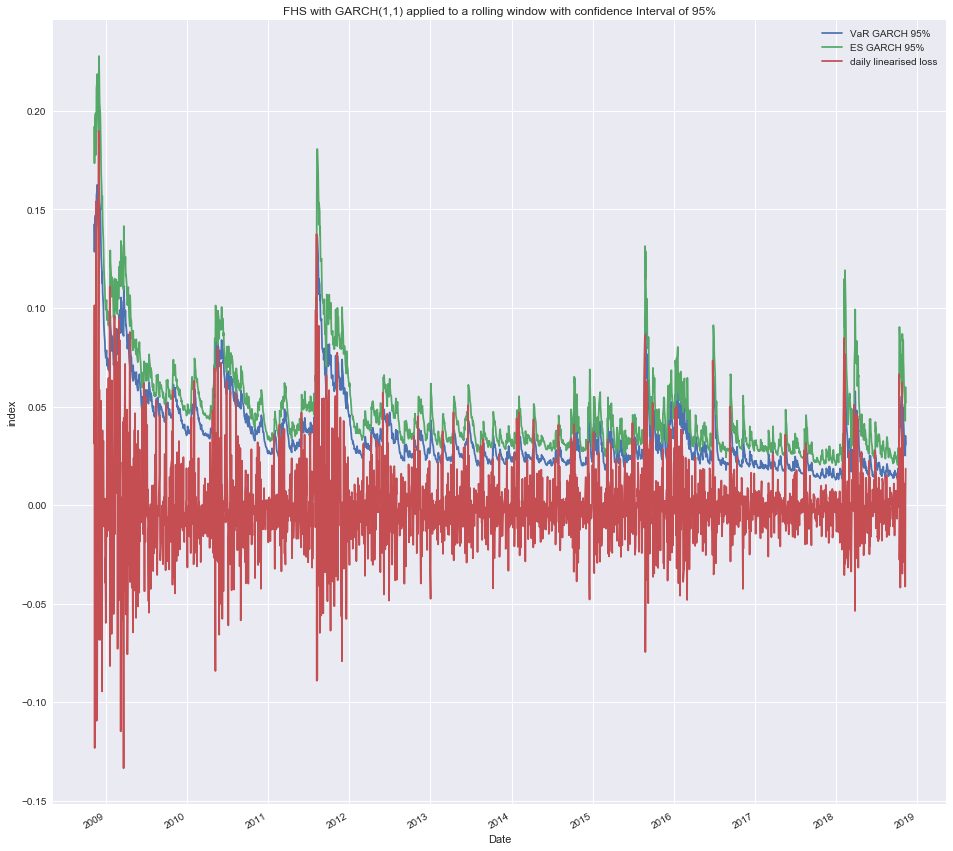

In [439]:
res_garch = df5.loc[503:]
res_garch["Date"] = res_garch["Date"].astype("datetime64")

res_garch.set_index('Date',inplace = True)
plt.figure(figsize=(16, 16), dpi= 80, facecolor='w', edgecolor='k')

res_garch[["VaR GARCH 95%", "ES GARCH 95%","daily linearised loss"]].plot(figsize = (16,16),title = 'FHS with GARCH(1,1) applied to a rolling window with confidence Interval of 95%')
plt.ylabel('index')

Text(0,0.5,'index')

<Figure size 1280x1280 with 0 Axes>

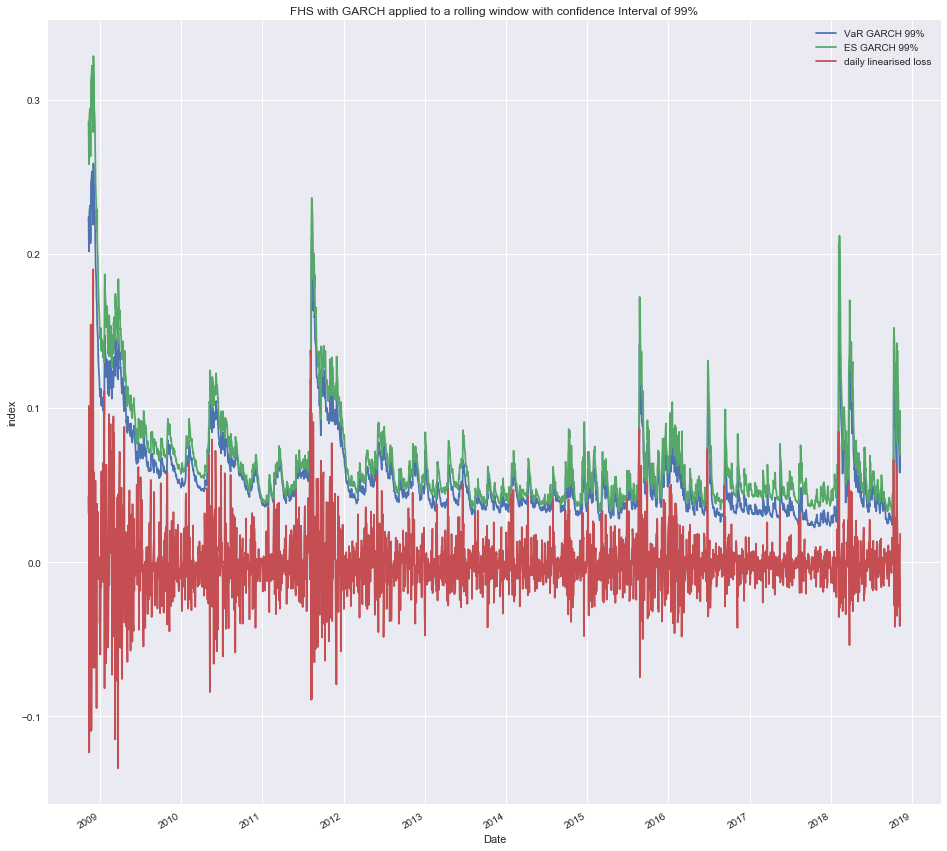

In [440]:
plt.figure(figsize=(16, 16), dpi= 80, facecolor='w', edgecolor='k')

res_garch[["VaR GARCH 99%", "ES GARCH 99%","daily linearised loss"]].plot(figsize = (16,16),title = 'FHS with GARCH applied to a rolling window with confidence Interval of 99%')
plt.ylabel('index')

In [462]:
backtest_fhs = res_fhs.copy()
backtest_hs = res_hs.copy()
backtest_garch = res_garch.copy()

backtest_fhs.to_csv('backtest_fhs.csv')

backtest_hs.to_csv('backtest_hs.csv')

backtest_garch.to_csv('backtest_garch.csv')

In [441]:
backtest_fhs['Indicator 99%'] = backtest_fhs['daily linearised loss'].gt(backtest_fhs['VaR FHS 99%'])
backtest_fhs['Indicator 95%'] = backtest_fhs['daily linearised loss'].gt(backtest_fhs['VaR FHS 95%'])
T = len(backtest_fhs)
H_99 = backtest_fhs['Indicator 99%'].sum()
H_95 = backtest_fhs['Indicator 95%'].sum()

pi_99 = H_99/len(backtest_fhs)
pi_95 = H_95/len(backtest_fhs)

alpha_99 = 0.99
alpha_95 = 0.95


In [361]:
def L(x,T,H):
    return(np.power((1-x),T-H)*np.power(x,H))    
def LRuc(alpha,pi_,T,H):
        d = -2*np.log(L(1-alpha,T,H)/L(pi_,T,H))
        return d

In [444]:
LRuc_99 = -2*np.log(L(1-alpha_99,T,H_99)/L(pi_99,T,H_99))
#LRuc_99 = LRuc(alpha_99,pi_99,T,H_99)
LRuc_99

0.19809041509900216

In [446]:
#LRuc_95 = -2*np.log(L(1-alpha_95,T,H_95)/L(pi_95,T,H_95))

LRuc_95 = LRuc(alpha_95,pi_95,T,H_95)
LRuc_95

0.1317105699942368

In [448]:
import scipy.stats as stats
p_95 = 1 - stats.chi2.cdf(LRuc_95,1)

In [449]:
import scipy.stats as stats
p_99 = 1 - stats.chi2.cdf(LRuc_99,1)

In [450]:
p_95,p_99

(0.7166650128593401, 0.6562666431211082)

In [454]:
def cover_test( alpha_99,alpha_95,pi_99,pi_95,T,H_99,H_95):
    L_99 = LRuc(alpha_99,pi_99,T,H_99)
    L_95 = LRuc(alpha_95,pi_95,T,H_95)
    
    p_95 = 1 - stats.chi2.cdf(L_95,1)
    p_99 = 1 - stats.chi2.cdf(L_99,1)
    
    return([p_95,L_95,p_99,L_99])
    


In [460]:
from tabulate import tabulate
result = cover_test(0.99,0.95,pi_99,pi_95,T,H_99,H_95)
t = tabulate([['0,99',result[3],result[2]],['0.95',result[1],result[0]]], headers = ['Confidence interval','LRuc', 'p-value'])
print(t)

ModuleNotFoundError: No module named 'tabulate'

In [456]:
backtest_hs

,SSO,daily linearised loss,VaR 99%,VaR 95%,VaR Violations 99,VaR Violations 95,ES 95%,ES 99%
Date,,,,,,,,
2008-11-10,14.1800,0.042795,0.100203,0.054405,5.0,25.0,0.085594,0.141279
2008-11-11,13.7450,0.031157,0.100203,0.054405,5.0,25.0,0.085594,0.141279
2008-11-12,12.4200,0.101367,0.101407,0.054481,5.0,24.0,0.086891,0.141279
2008-11-13,14.0500,-0.123314,0.101407,0.054481,5.0,25.0,0.087470,0.141279
2008-11-14,12.7150,0.099840,0.101407,0.054841,5.0,24.0,0.088834,0.141279
2008-11-17,12.2250,0.039299,0.101407,0.054841,5.0,25.0,0.089274,0.141279
2008-11-18,12.3150,-0.007335,0.101407,0.054841,5.0,25.0,0.089274,0.141279
2008-11-19,11.0900,0.104774,0.104780,0.057090,5.0,24.0,0.090617,0.141279
2008-11-20,9.5050,0.154226,0.105444,0.057823,4.0,24.0,0.092574,0.150259


In [ ]:
backtest_hs['Indicator 99%'] = backtest_hs['daily linearised loss'].gt(backtest_hs['VaR 99%'])
backtest_hs['Indicator 95%'] = backtest_hs['daily linearised loss'].gt(backtest_hs['VaR 95%'])
T = len(backtest_hs)
H_99 = backtest_hs['Indicator 99%'].sum()
H_95 = backtest_hs['Indicator 95%'].sum()

pi_99 = H_99/len(backtest_hs)
pi_95 = H_95/len(backtest_hs)

alpha_99 = 0.99
alpha_95 = 0.95
